# SVM with quantum kernels

### Kernel quality framework

Applied to the `make_moons` dataset

In this Notebook, we use the tools developed and made available in the `qsvm_utils.py` module, to apply the proposed grid/random search framework for the systematic evaluation of quantum feature map proposals.

We use the `make_circles` dataset, which is an artificial toy dataset produced with sklearn. We'll work with 2-dimensional data and only 60 observations, which is necessary for the framework to yield meaningful results in a reasonable time.

Please refer to [this notebook](qSVM_make_circles.ipynb) for an application to another artificial dataset; and to [this notebook](qSVM_breast_cancer.ipynb) for an application to a real dataset. 

Finaly, refer to [this pdf file]() for details on the procedure and reasoning behind the framework.

__________

In [17]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [18]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons, make_circles

import itertools

import time

from qsvm_utils import *

________

**Reading the data**

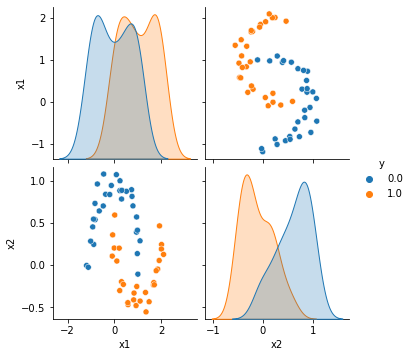

In [19]:
X, y = make_moons(n_samples=60, noise=0.1, random_state=42)

df = pd.DataFrame(np.column_stack((X, y)), columns="x1 x2 y".split())

X = df.drop(columns="y")
y = df["y"]

sns.pairplot(df, hue="y")
plt.show()

**Pre-processing**
 

In [207]:
X_train, X_test, y_train, y_test = pre_process_data(X, y, dpp=False, n_rows=50, n_cols=2, pca=False, n_pcs=2)

### Quantum kernels


_____________

Some fast experiments - testing functions outside of the full grid

In [22]:
reps = 1
paulis = ["X", "Z"]
entanglement = "linear"


Feature map:


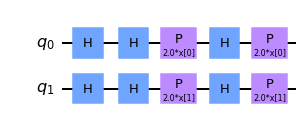

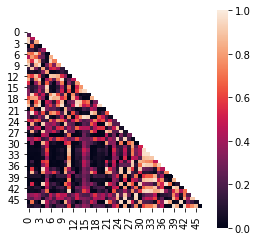

In [23]:
train_qkernel = construct_quantum_gram(reps, paulis, entanglement, X_train, None)

plot_gram(train_qkernel)


Feature map:


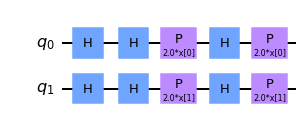


Quantum kernel matrices:



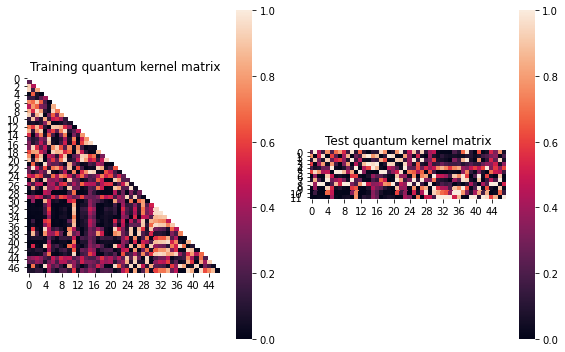


SVM with quantum kernel trained!


Test set performance:


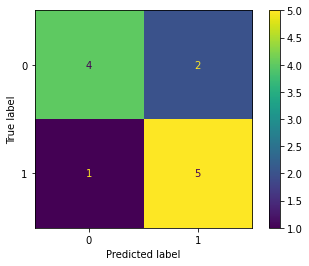

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12



(array([[1.   , 0.241, 0.918, ..., 0.263, 0.016, 0.079],
        [0.239, 1.   , 0.443, ..., 0.23 , 0.693, 0.072],
        [0.919, 0.446, 1.   , ..., 0.373, 0.079, 0.132],
        ...,
        [0.268, 0.235, 0.375, ..., 1.   , 0.05 , 0.875],
        [0.017, 0.698, 0.077, ..., 0.049, 1.   , 0.005],
        [0.08 , 0.075, 0.13 , ..., 0.875, 0.004, 1.   ]]),
 {'0': {'precision': 0.8,
   'recall': 0.6666666666666666,
   'f1-score': 0.7272727272727272,
   'support': 6},
  '1': {'precision': 0.7142857142857143,
   'recall': 0.8333333333333334,
   'f1-score': 0.7692307692307692,
   'support': 6},
  'accuracy': 0.75,
  'macro avg': {'precision': 0.7571428571428571,
   'recall': 0.75,
   'f1-score': 0.7482517482517481,
   'support': 12},
  'weighted avg': {'precision': 0.7571428571428571,
   'recall': 0.75,
   'f1-score': 0.7482517482517482,
   'support': 12}})

In [26]:
qsvm(X, X_train, y_train, X_test, y_test, reps, paulis, entanglement)

_______________

Now, running the full grid!

In [11]:
# params to be varied in the grid
params = {"reps_list" : [1, 2, 3],
          "paulis_list" : combs_sub_lists(cart_product_string("XYZ", feature_dim)),
          # not considering "sca"; see notebook "architecture_study" for details
          "entanglement_list" : "linear circular full".split()}

param_grid, range_list = calc_param_grid(params, feature_dim, random_search=False, n_random=100)

Initial number of combinations: 1404
Number of combinations after dropping redundancies: 468


In [12]:
results = []



Combination 1/468
(Current range: 1/46)
			 reps : 1
			 paulis : ['X']
			 entanglement : linear

Feature map:


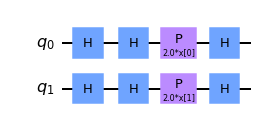


Quantum kernel matrices:



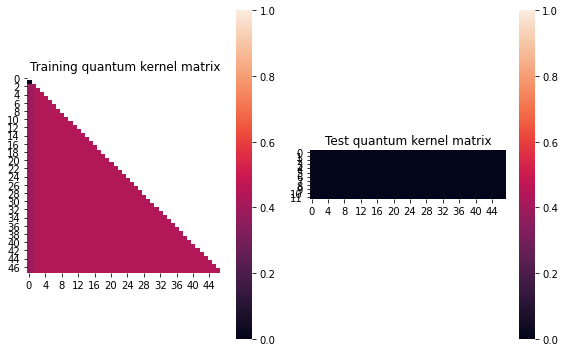


SVM with quantum kernel trained!


Test set performance:


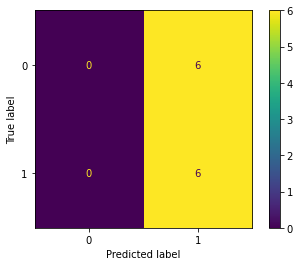

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:00:28


Combination 2/468
(Current range: 2/46)
			 reps : 1
			 paulis : ['Y']
			 entanglement : linear

Feature map:


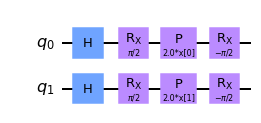


Quantum kernel matrices:



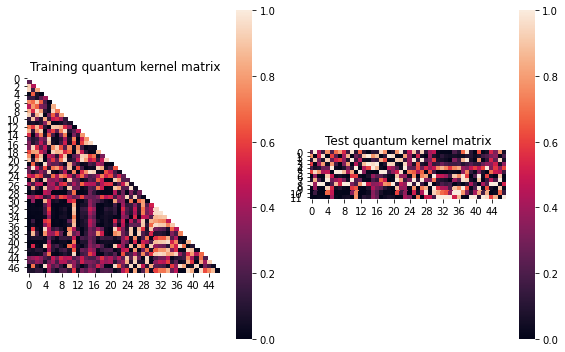


SVM with quantum kernel trained!


Test set performance:


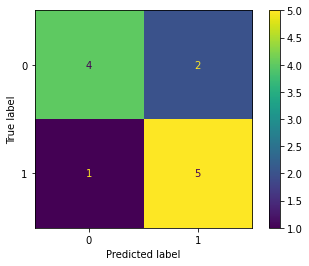

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.20135834676654873
metric(s) 2: (00, 10, 11) = (0.4378378272218841, 0.2462121996661747, 0.4573032656435627)
metric 3: -1.498792611769664e-308


----> Kernel construction duration: 00:00:35


Combination 3/468
(Current range: 3/46)
			 reps : 1
			 paulis : ['Z']
			 entanglement : linear

Feature map:


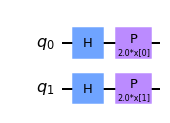


Quantum kernel matrices:



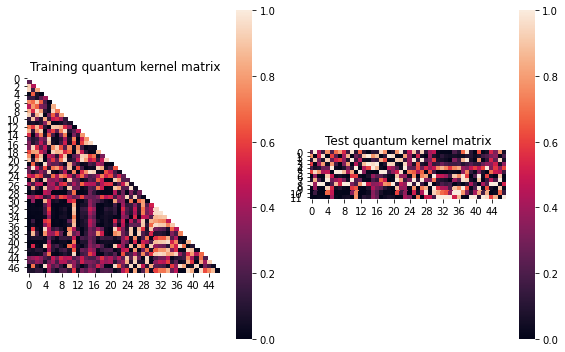


SVM with quantum kernel trained!


Test set performance:


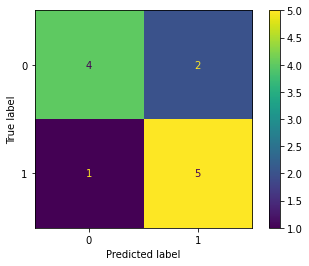

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.20135834676654873
metric(s) 2: (00, 10, 11) = (0.4378378272218841, 0.2462121996661747, 0.4573032656435627)
metric 3: -1.498792611769664e-308


----> Kernel construction duration: 00:00:36


Combination 4/468
(Current range: 4/46)
			 reps : 1
			 paulis : ['XX']
			 entanglement : linear

Feature map:


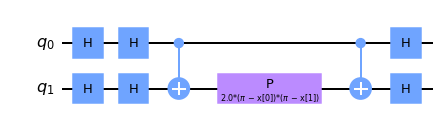


Quantum kernel matrices:



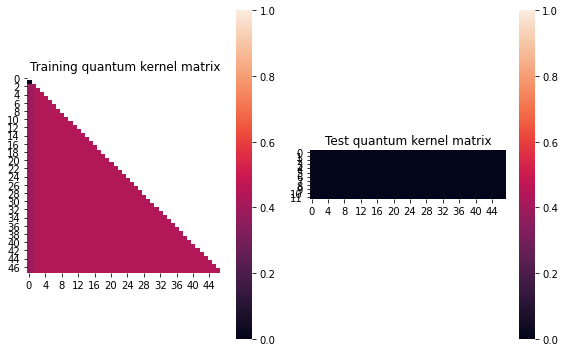


SVM with quantum kernel trained!


Test set performance:


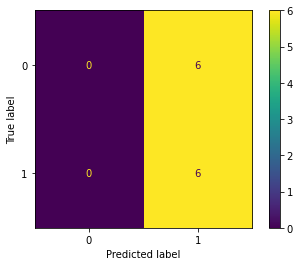

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:00:23


Combination 5/468
(Current range: 5/46)
			 reps : 1
			 paulis : ['XY']
			 entanglement : linear

Feature map:


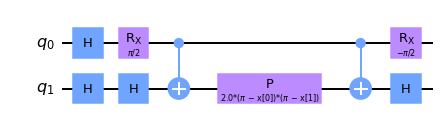


Quantum kernel matrices:



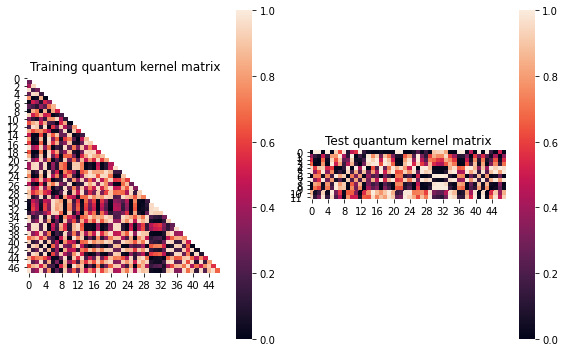


SVM with quantum kernel trained!


Test set performance:


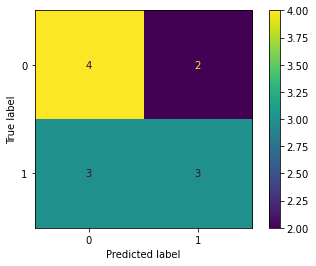

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:00:37


Combination 6/468
(Current range: 6/46)
			 reps : 1
			 paulis : ['XZ']
			 entanglement : linear

Feature map:


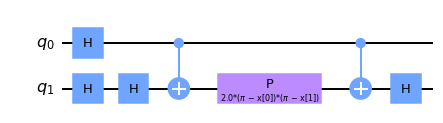


Quantum kernel matrices:



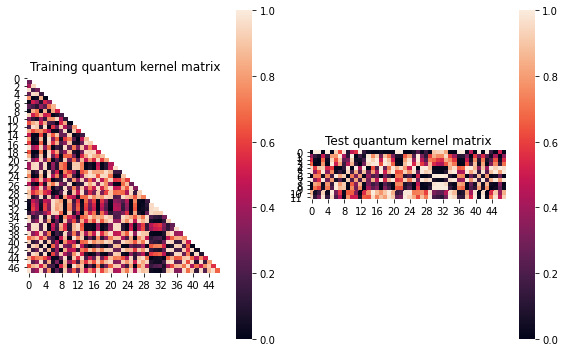


SVM with quantum kernel trained!


Test set performance:


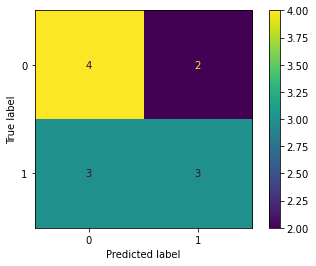

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:00:39


Combination 7/468
(Current range: 7/46)
			 reps : 1
			 paulis : ['YX']
			 entanglement : linear

Feature map:


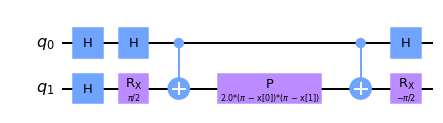


Quantum kernel matrices:



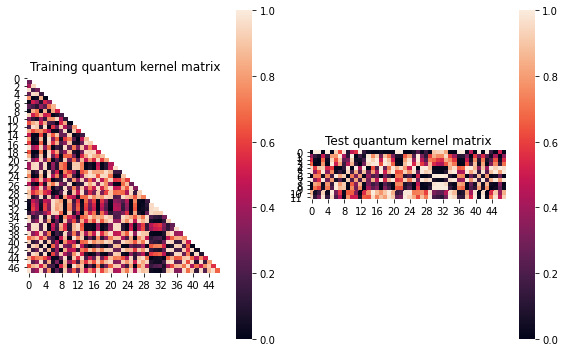


SVM with quantum kernel trained!


Test set performance:


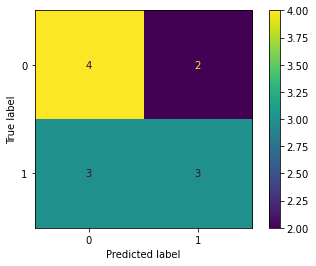

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:00:37


Combination 8/468
(Current range: 8/46)
			 reps : 1
			 paulis : ['YY']
			 entanglement : linear

Feature map:


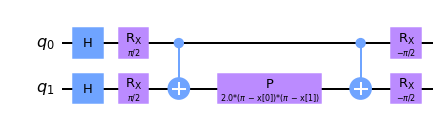


Quantum kernel matrices:



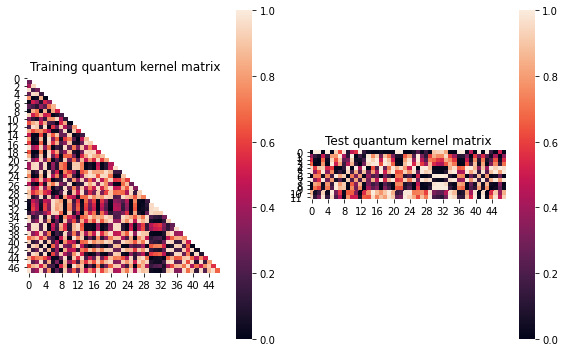


SVM with quantum kernel trained!


Test set performance:


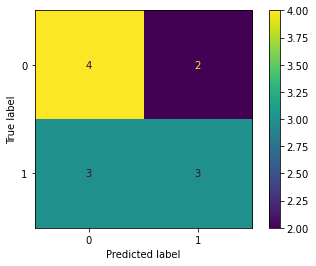

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:00:51


Combination 9/468
(Current range: 9/46)
			 reps : 1
			 paulis : ['YZ']
			 entanglement : linear

Feature map:


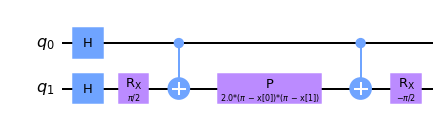


Quantum kernel matrices:



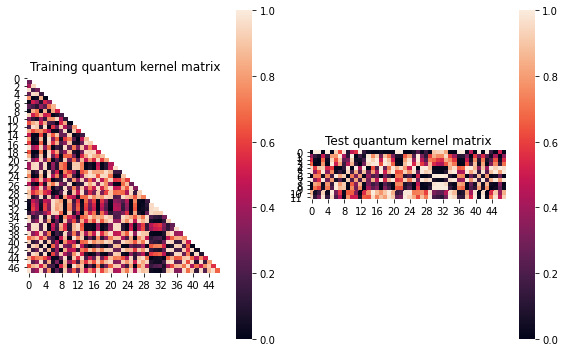


SVM with quantum kernel trained!


Test set performance:


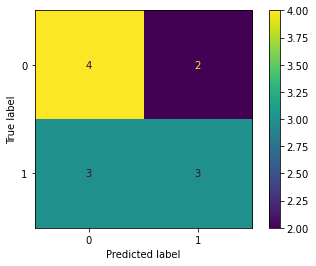

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:00:48


Combination 10/468
(Current range: 10/46)
			 reps : 1
			 paulis : ['ZX']
			 entanglement : linear

Feature map:


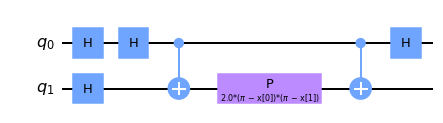


Quantum kernel matrices:



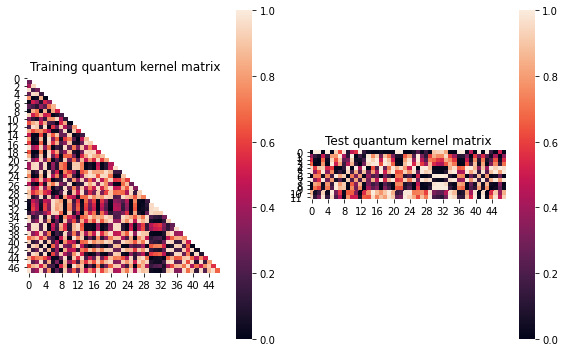


SVM with quantum kernel trained!


Test set performance:


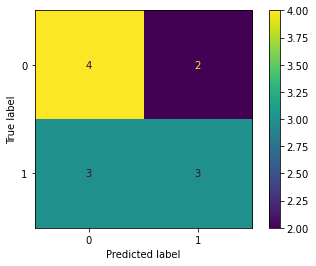

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:00:36


Combination 11/468
(Current range: 11/46)
			 reps : 1
			 paulis : ['ZY']
			 entanglement : linear

Feature map:


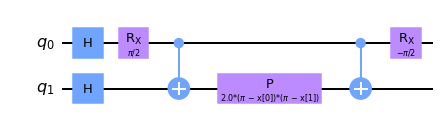


Quantum kernel matrices:



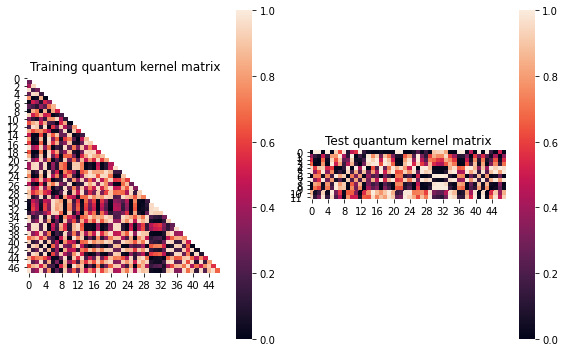


SVM with quantum kernel trained!


Test set performance:


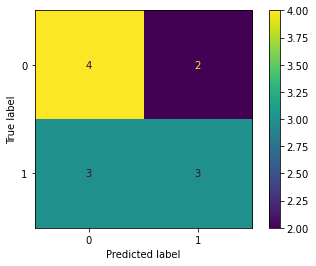

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:00:53


Combination 12/468
(Current range: 12/46)
			 reps : 1
			 paulis : ['ZZ']
			 entanglement : linear

Feature map:


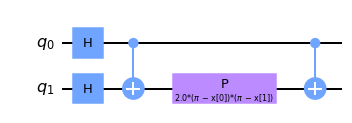


Quantum kernel matrices:



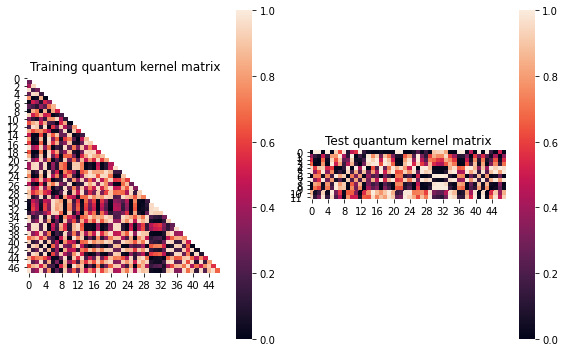


SVM with quantum kernel trained!


Test set performance:


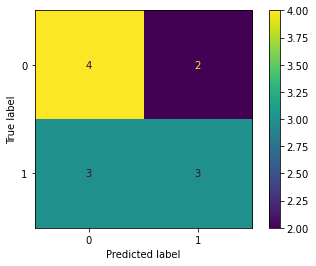

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:00:49


Combination 13/468
(Current range: 13/46)
			 reps : 1
			 paulis : ['X', 'X']
			 entanglement : linear

Feature map:


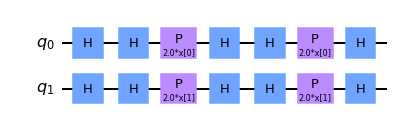


Quantum kernel matrices:



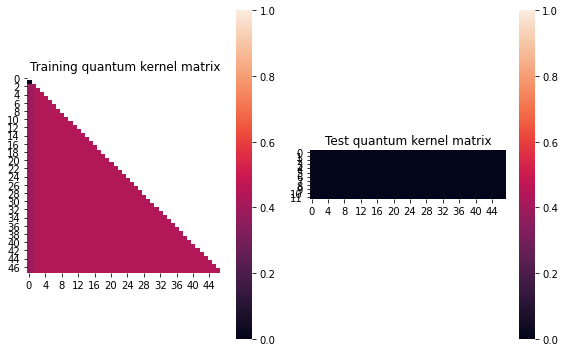


SVM with quantum kernel trained!


Test set performance:


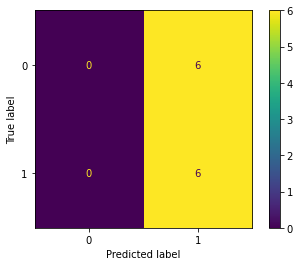

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:00:28


Combination 14/468
(Current range: 14/46)
			 reps : 1
			 paulis : ['X', 'Y']
			 entanglement : linear

Feature map:


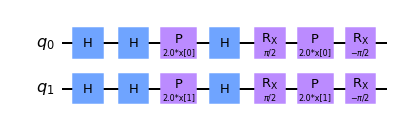


Quantum kernel matrices:



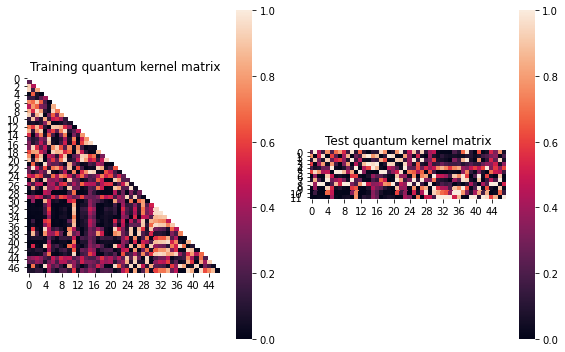


SVM with quantum kernel trained!


Test set performance:


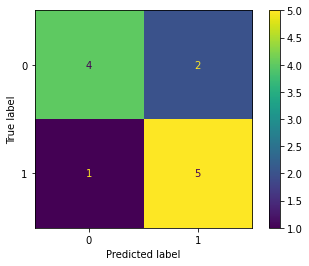

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.20135834676654873
metric(s) 2: (00, 10, 11) = (0.4378378272218841, 0.2462121996661747, 0.4573032656435627)
metric 3: -1.498792611769664e-308


----> Kernel construction duration: 00:00:33


Combination 15/468
(Current range: 15/46)
			 reps : 1
			 paulis : ['X', 'Z']
			 entanglement : linear

Feature map:


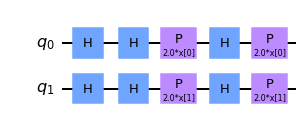


Quantum kernel matrices:



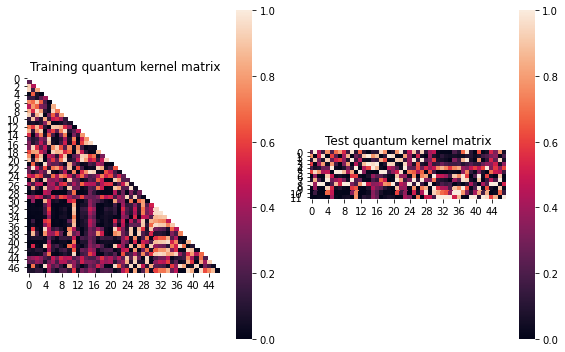


SVM with quantum kernel trained!


Test set performance:


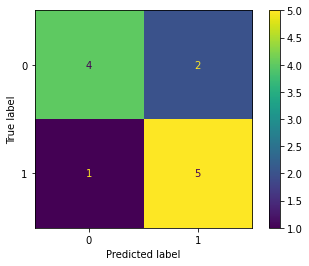

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.20135834676654873
metric(s) 2: (00, 10, 11) = (0.4378378272218841, 0.2462121996661747, 0.4573032656435627)
metric 3: -1.498792611769664e-308


----> Kernel construction duration: 00:00:40


Combination 16/468
(Current range: 16/46)
			 reps : 1
			 paulis : ['X', 'XX']
			 entanglement : linear

Feature map:


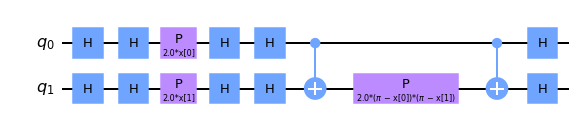


Quantum kernel matrices:



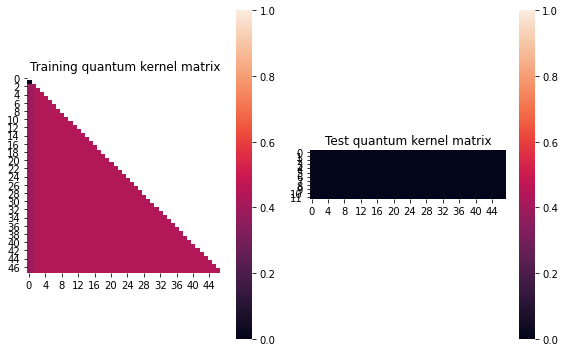


SVM with quantum kernel trained!


Test set performance:


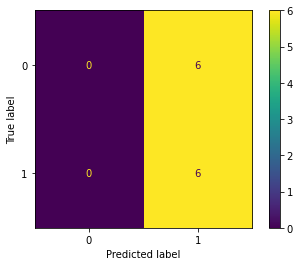

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:01:01


Combination 17/468
(Current range: 17/46)
			 reps : 1
			 paulis : ['X', 'XY']
			 entanglement : linear

Feature map:


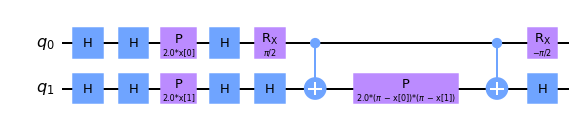


Quantum kernel matrices:



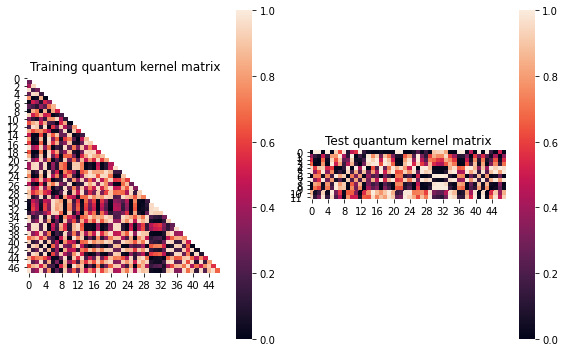


SVM with quantum kernel trained!


Test set performance:


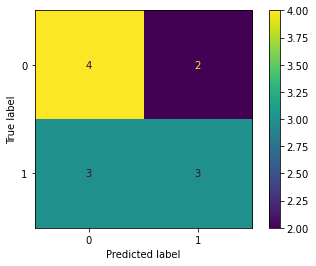

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:08


Combination 18/468
(Current range: 18/46)
			 reps : 1
			 paulis : ['X', 'XZ']
			 entanglement : linear

Feature map:


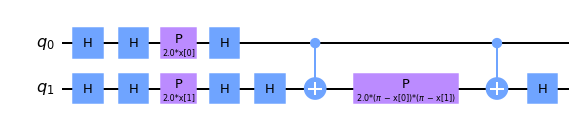


Quantum kernel matrices:



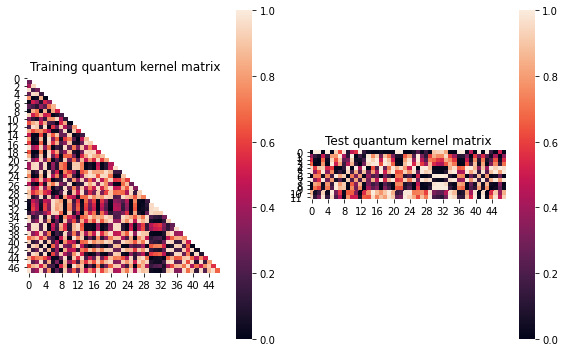


SVM with quantum kernel trained!


Test set performance:


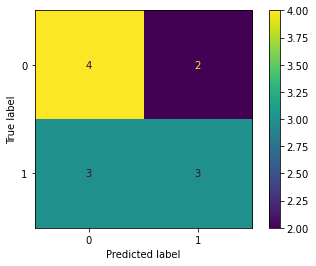

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:05


Combination 19/468
(Current range: 19/46)
			 reps : 1
			 paulis : ['X', 'YX']
			 entanglement : linear

Feature map:


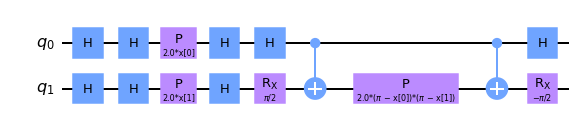


Quantum kernel matrices:



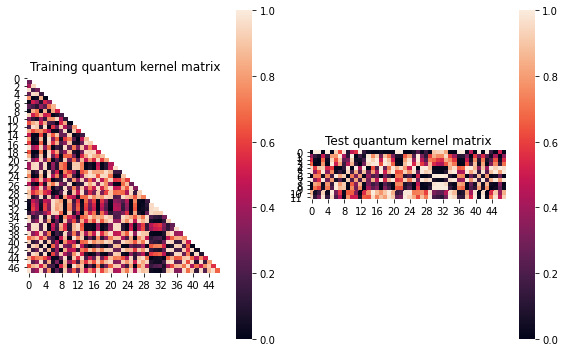


SVM with quantum kernel trained!


Test set performance:


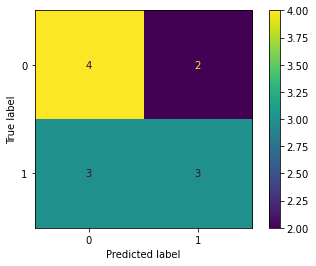

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:06


Combination 20/468
(Current range: 20/46)
			 reps : 1
			 paulis : ['X', 'YY']
			 entanglement : linear

Feature map:


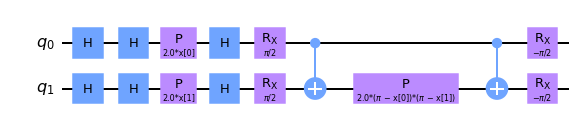


Quantum kernel matrices:



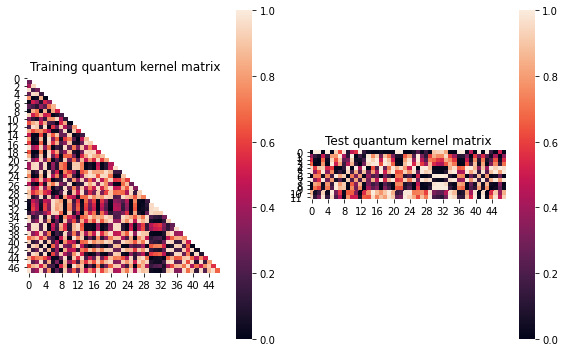


SVM with quantum kernel trained!


Test set performance:


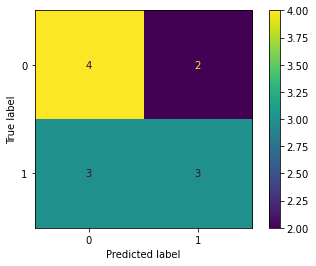

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:09


Combination 21/468
(Current range: 21/46)
			 reps : 1
			 paulis : ['X', 'YZ']
			 entanglement : linear

Feature map:


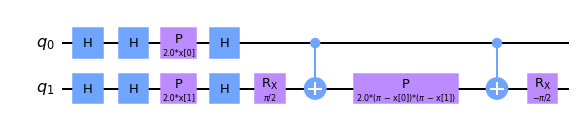


Quantum kernel matrices:



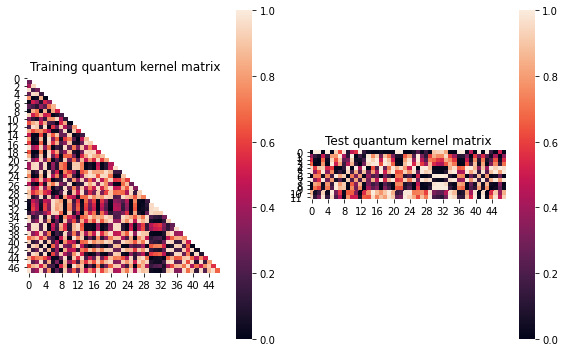


SVM with quantum kernel trained!


Test set performance:


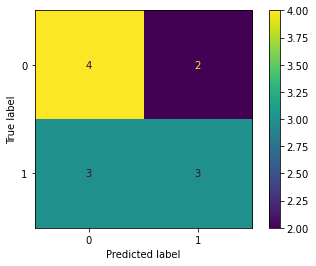

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:09


Combination 22/468
(Current range: 22/46)
			 reps : 1
			 paulis : ['X', 'ZX']
			 entanglement : linear

Feature map:


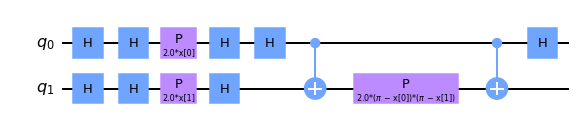


Quantum kernel matrices:



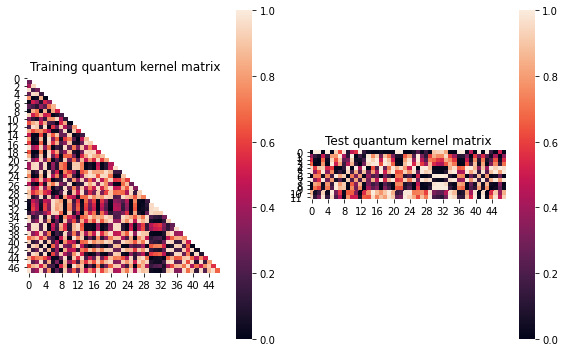


SVM with quantum kernel trained!


Test set performance:


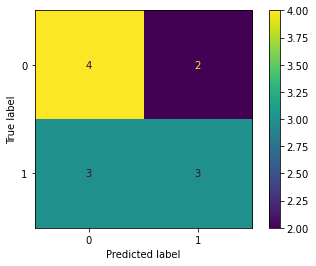

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:04


Combination 23/468
(Current range: 23/46)
			 reps : 1
			 paulis : ['X', 'ZY']
			 entanglement : linear

Feature map:


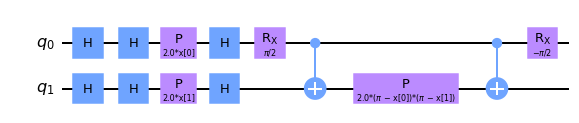


Quantum kernel matrices:



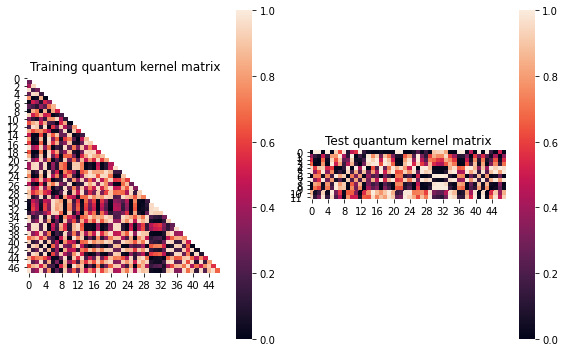


SVM with quantum kernel trained!


Test set performance:


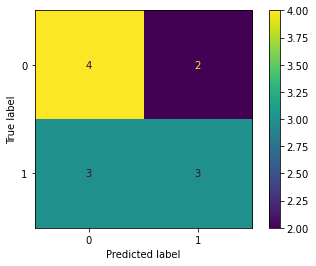

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:03


Combination 24/468
(Current range: 24/46)
			 reps : 1
			 paulis : ['X', 'ZZ']
			 entanglement : linear

Feature map:


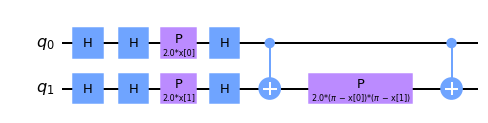


Quantum kernel matrices:



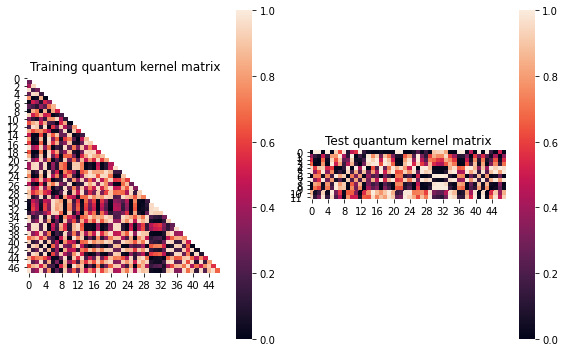


SVM with quantum kernel trained!


Test set performance:


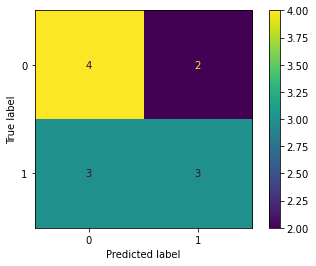

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:09


Combination 25/468
(Current range: 25/46)
			 reps : 1
			 paulis : ['Y', 'X']
			 entanglement : linear

Feature map:


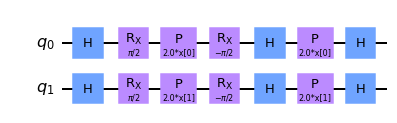


Quantum kernel matrices:



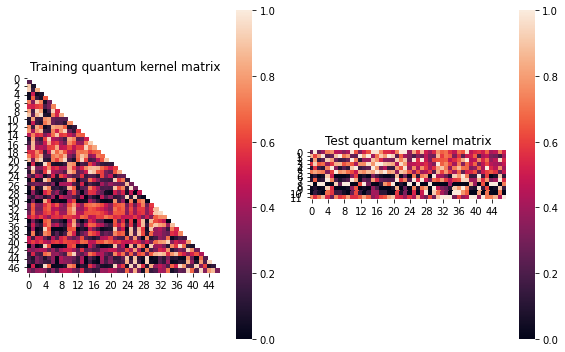


SVM with quantum kernel trained!


Test set performance:


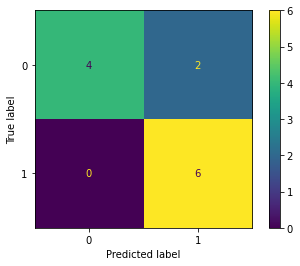

              precision    recall  f1-score   support

           0       1.00      0.67      0.80         6
           1       0.75      1.00      0.86         6

    accuracy                           0.83        12
   macro avg       0.88      0.83      0.83        12
weighted avg       0.88      0.83      0.83        12


metric 1: 0.13624597265191835
metric(s) 2: (00, 10, 11) = (0.5166924668195629, 0.3605783579291822, 0.4769561943426381)
metric 3: -1.3138095606145644e-286


----> Kernel construction duration: 00:00:49


Combination 26/468
(Current range: 26/46)
			 reps : 1
			 paulis : ['Y', 'Y']
			 entanglement : linear

Feature map:


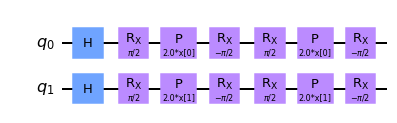


Quantum kernel matrices:



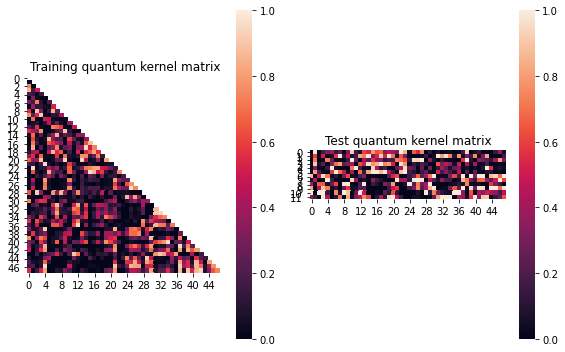


SVM with quantum kernel trained!


Test set performance:


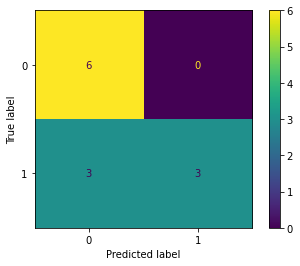

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: 0.14882432393696096
metric(s) 2: (00, 10, 11) = (0.3175296147741833, 0.18735808070774787, 0.3548351945152344)
metric 3: 7.103736835965141e-306


----> Kernel construction duration: 00:00:42


Combination 27/468
(Current range: 27/46)
			 reps : 1
			 paulis : ['Y', 'Z']
			 entanglement : linear

Feature map:


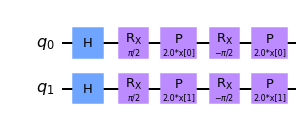


Quantum kernel matrices:



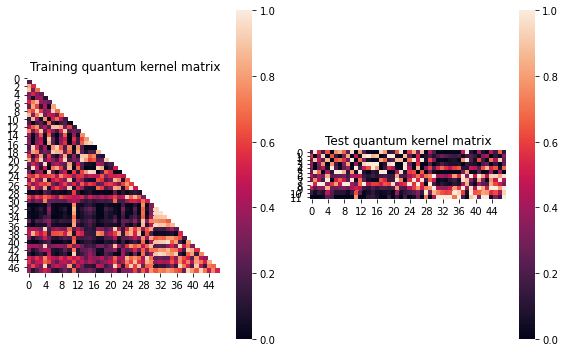


SVM with quantum kernel trained!


Test set performance:


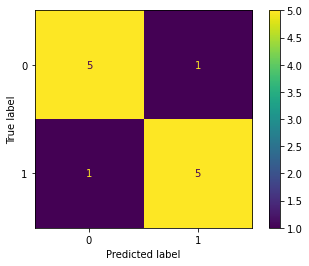

              precision    recall  f1-score   support

           0       0.83      0.83      0.83         6
           1       0.83      0.83      0.83         6

    accuracy                           0.83        12
   macro avg       0.83      0.83      0.83        12
weighted avg       0.83      0.83      0.83        12


metric 1: 0.19709468220316134
metric(s) 2: (00, 10, 11) = (0.44626576531033024, 0.28601179321391007, 0.5199471855238126)
metric 3: -5.7315431026175136e-288


----> Kernel construction duration: 00:00:47


Combination 28/468
(Current range: 28/46)
			 reps : 1
			 paulis : ['Y', 'XX']
			 entanglement : linear

Feature map:


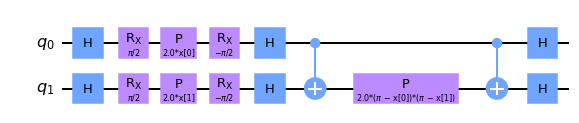


Quantum kernel matrices:



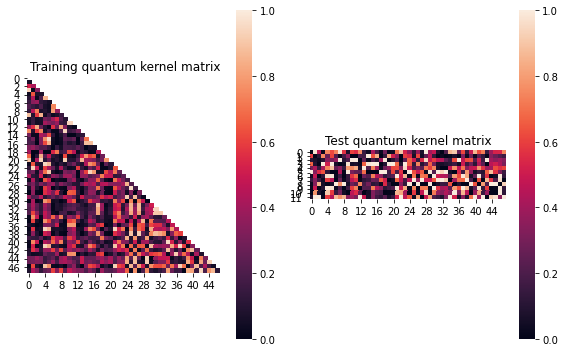


SVM with quantum kernel trained!


Test set performance:


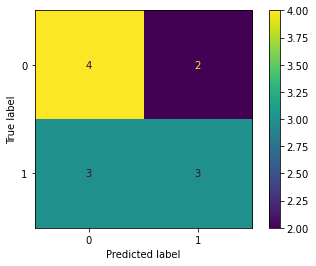

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.09060093072068909
metric(s) 2: (00, 10, 11) = (0.3182146966767896, 0.2833874171655382, 0.42976199909566504)
metric 3: -2.510425257084273e-288


----> Kernel construction duration: 00:01:16


Combination 29/468
(Current range: 29/46)
			 reps : 1
			 paulis : ['Y', 'XY']
			 entanglement : linear

Feature map:


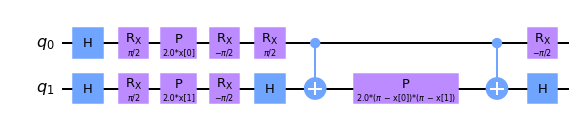


Quantum kernel matrices:



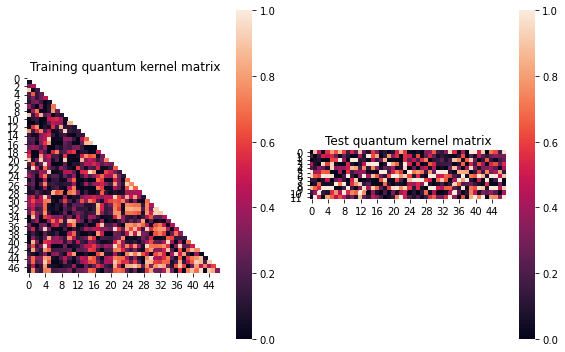


SVM with quantum kernel trained!


Test set performance:


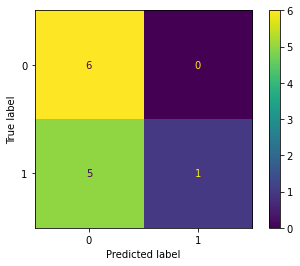

              precision    recall  f1-score   support

           0       0.55      1.00      0.71         6
           1       1.00      0.17      0.29         6

    accuracy                           0.58        12
   macro avg       0.77      0.58      0.50        12
weighted avg       0.77      0.58      0.50        12


metric 1: 0.10555555163178387
metric(s) 2: (00, 10, 11) = (0.31289589449282057, 0.29556073469802313, 0.4893366781667934)
metric 3: 1.36347e-319


----> Kernel construction duration: 00:01:18


Combination 30/468
(Current range: 30/46)
			 reps : 1
			 paulis : ['Y', 'XZ']
			 entanglement : linear

Feature map:


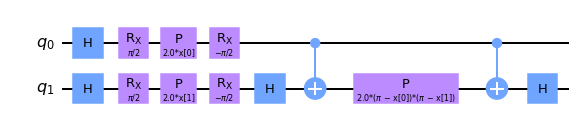


Quantum kernel matrices:



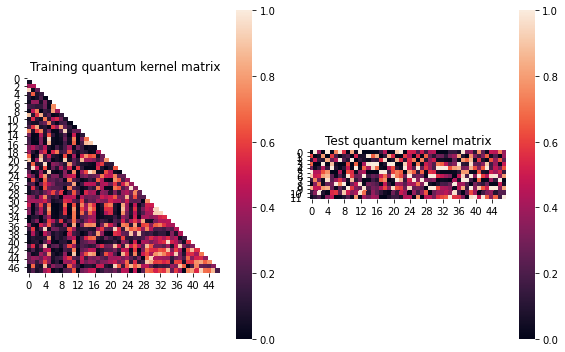


SVM with quantum kernel trained!


Test set performance:


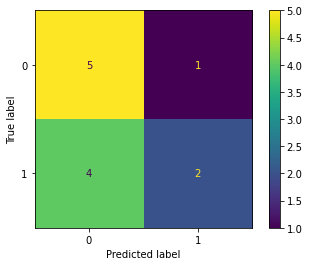

              precision    recall  f1-score   support

           0       0.56      0.83      0.67         6
           1       0.67      0.33      0.44         6

    accuracy                           0.58        12
   macro avg       0.61      0.58      0.56        12
weighted avg       0.61      0.58      0.56        12


metric 1: 0.09080385371557281
metric(s) 2: (00, 10, 11) = (0.3030879082964023, 0.2873448904896791, 0.45320958011410145)
metric 3: 5.005340843422931e-286


----> Kernel construction duration: 00:01:20


Combination 31/468
(Current range: 31/46)
			 reps : 1
			 paulis : ['Y', 'YX']
			 entanglement : linear

Feature map:


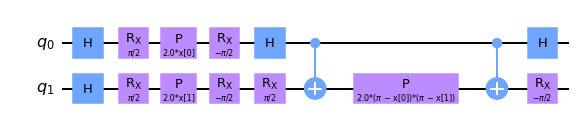


Quantum kernel matrices:



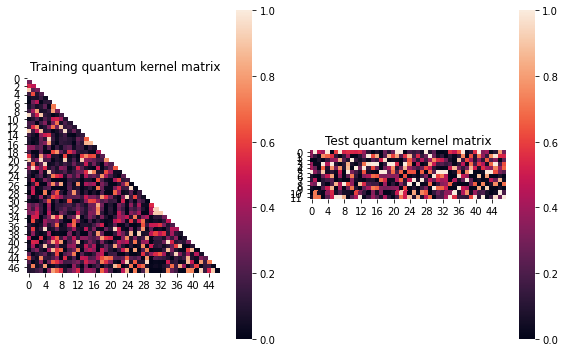


SVM with quantum kernel trained!


Test set performance:


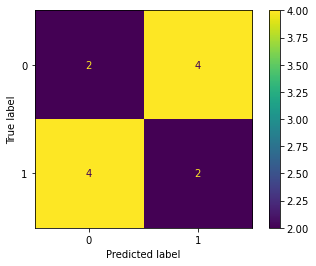

              precision    recall  f1-score   support

           0       0.33      0.33      0.33         6
           1       0.33      0.33      0.33         6

    accuracy                           0.33        12
   macro avg       0.33      0.33      0.33        12
weighted avg       0.33      0.33      0.33        12


metric 1: 0.059937446647454345
metric(s) 2: (00, 10, 11) = (0.2927265413330003, 0.2389280230277462, 0.30500439801740076)
metric 3: 2.020708804666086e-305


----> Kernel construction duration: 00:01:31


Combination 32/468
(Current range: 32/46)
			 reps : 1
			 paulis : ['Y', 'YY']
			 entanglement : linear

Feature map:


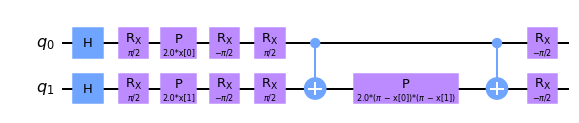


Quantum kernel matrices:



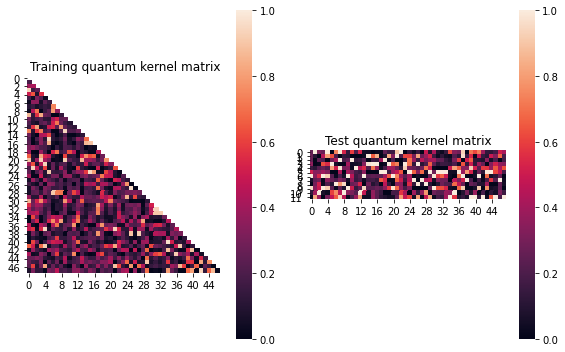


SVM with quantum kernel trained!


Test set performance:


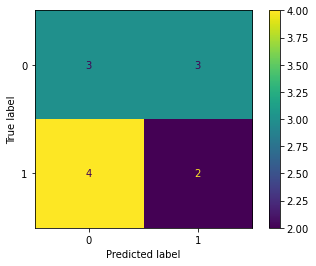

              precision    recall  f1-score   support

           0       0.43      0.50      0.46         6
           1       0.40      0.33      0.36         6

    accuracy                           0.42        12
   macro avg       0.41      0.42      0.41        12
weighted avg       0.41      0.42      0.41        12


metric 1: 0.05733851085899522
metric(s) 2: (00, 10, 11) = (0.31281939221849137, 0.2511093745159616, 0.3040763785314222)
metric 3: 3.3102918868991154e-287


----> Kernel construction duration: 00:01:11


Combination 33/468
(Current range: 33/46)
			 reps : 1
			 paulis : ['Y', 'YZ']
			 entanglement : linear

Feature map:


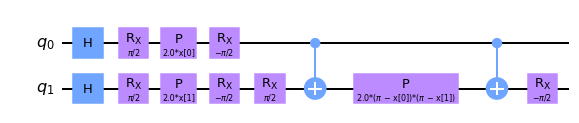


Quantum kernel matrices:



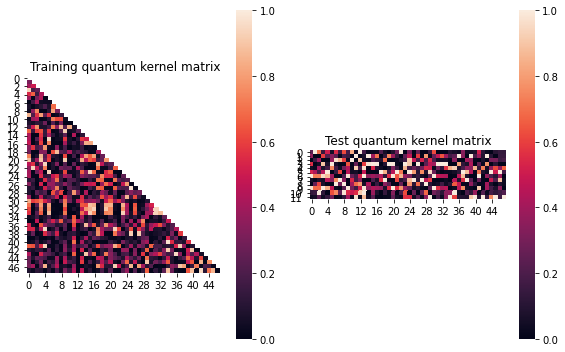


SVM with quantum kernel trained!


Test set performance:


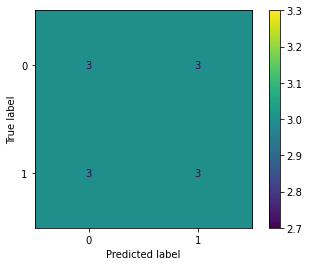

              precision    recall  f1-score   support

           0       0.50      0.50      0.50         6
           1       0.50      0.50      0.50         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.50        12
weighted avg       0.50      0.50      0.50        12


metric 1: 0.0616764735495238
metric(s) 2: (00, 10, 11) = (0.31260756614415863, 0.24597236040254242, 0.3026901017599738)
metric 3: 4.4736880320833476e-306


----> Kernel construction duration: 00:01:16


Combination 34/468
(Current range: 34/46)
			 reps : 1
			 paulis : ['Y', 'ZX']
			 entanglement : linear

Feature map:


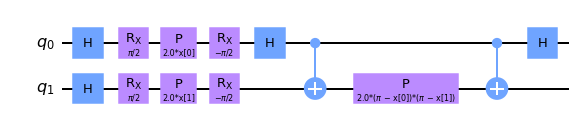


Quantum kernel matrices:



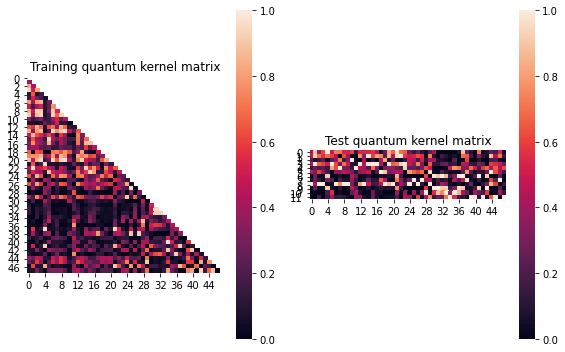


SVM with quantum kernel trained!


Test set performance:


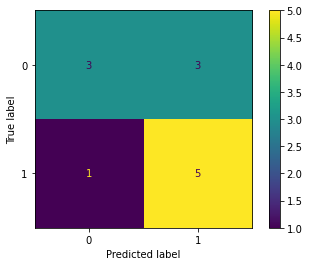

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.17606513043820635
metric(s) 2: (00, 10, 11) = (0.46426891504458656, 0.20347704687126325, 0.29481543957435263)
metric 3: -7.821280819289494e-274


----> Kernel construction duration: 00:01:20


Combination 35/468
(Current range: 35/46)
			 reps : 1
			 paulis : ['Y', 'ZY']
			 entanglement : linear

Feature map:


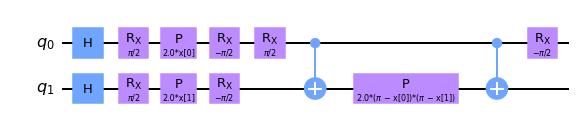


Quantum kernel matrices:



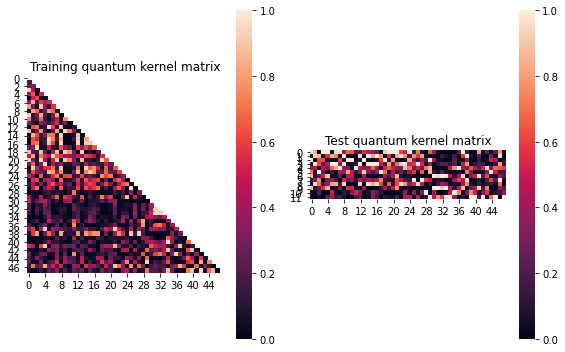


SVM with quantum kernel trained!


Test set performance:


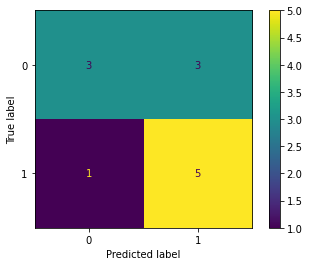

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.14685412815663765
metric(s) 2: (00, 10, 11) = (0.42096684865663725, 0.21102916127162666, 0.2947997301998914)
metric 3: -7.500958668981601e-307


----> Kernel construction duration: 00:01:20


Combination 36/468
(Current range: 36/46)
			 reps : 1
			 paulis : ['Y', 'ZZ']
			 entanglement : linear

Feature map:


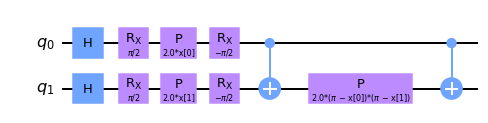


Quantum kernel matrices:



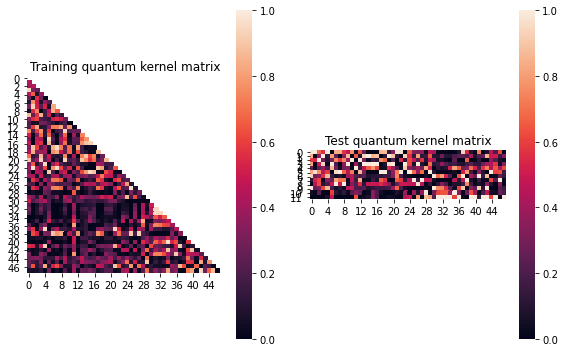


SVM with quantum kernel trained!


Test set performance:


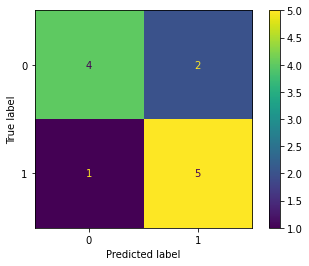

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.15922888128520513
metric(s) 2: (00, 10, 11) = (0.4049675247909443, 0.20629830601403193, 0.32608684980752983)
metric 3: 6.837788892154588e-277


----> Kernel construction duration: 00:01:17


Combination 37/468
(Current range: 37/46)
			 reps : 1
			 paulis : ['Z', 'X']
			 entanglement : linear

Feature map:


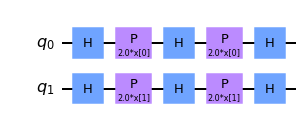


Quantum kernel matrices:



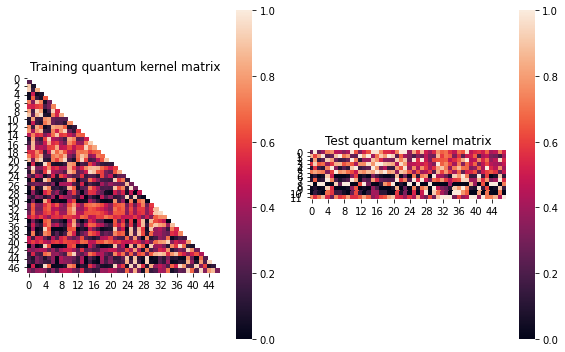


SVM with quantum kernel trained!


Test set performance:


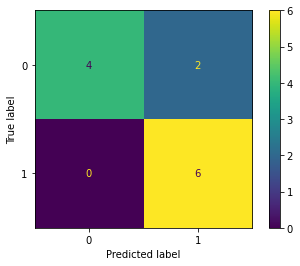

              precision    recall  f1-score   support

           0       1.00      0.67      0.80         6
           1       0.75      1.00      0.86         6

    accuracy                           0.83        12
   macro avg       0.88      0.83      0.83        12
weighted avg       0.88      0.83      0.83        12


metric 1: 0.13624597265191835
metric(s) 2: (00, 10, 11) = (0.5166924668195629, 0.3605783579291822, 0.4769561943426381)
metric 3: -1.3138095606145644e-286


----> Kernel construction duration: 00:00:46


Combination 38/468
(Current range: 38/46)
			 reps : 1
			 paulis : ['Z', 'Y']
			 entanglement : linear

Feature map:


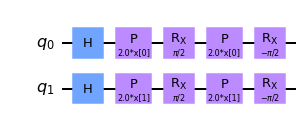


Quantum kernel matrices:



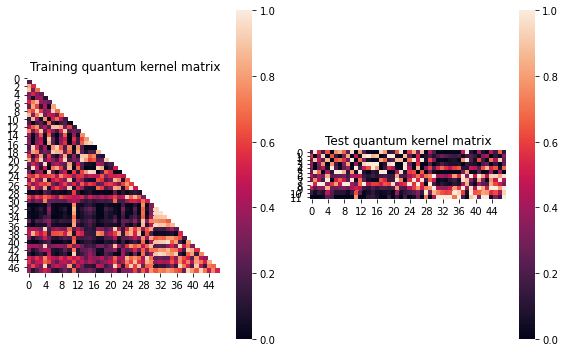


SVM with quantum kernel trained!


Test set performance:


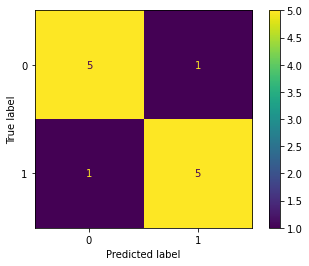

              precision    recall  f1-score   support

           0       0.83      0.83      0.83         6
           1       0.83      0.83      0.83         6

    accuracy                           0.83        12
   macro avg       0.83      0.83      0.83        12
weighted avg       0.83      0.83      0.83        12


metric 1: 0.19709468220316134
metric(s) 2: (00, 10, 11) = (0.44626576531033024, 0.28601179321391007, 0.5199471855238126)
metric 3: -5.7315431026175136e-288


----> Kernel construction duration: 00:00:47


Combination 39/468
(Current range: 39/46)
			 reps : 1
			 paulis : ['Z', 'Z']
			 entanglement : linear

Feature map:


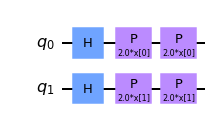


Quantum kernel matrices:



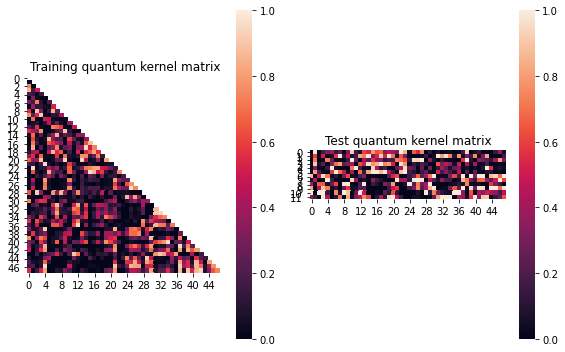


SVM with quantum kernel trained!


Test set performance:


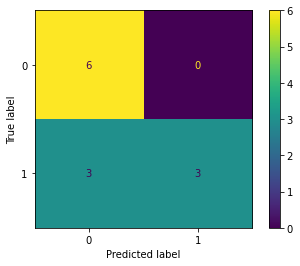

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: 0.14882432393696096
metric(s) 2: (00, 10, 11) = (0.3175296147741833, 0.18735808070774787, 0.3548351945152344)
metric 3: 7.103736835965141e-306


----> Kernel construction duration: 00:00:44


Combination 40/468
(Current range: 40/46)
			 reps : 1
			 paulis : ['Z', 'XX']
			 entanglement : linear

Feature map:


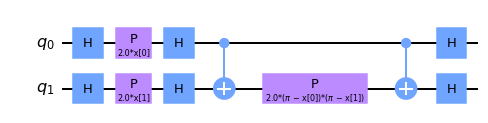


Quantum kernel matrices:



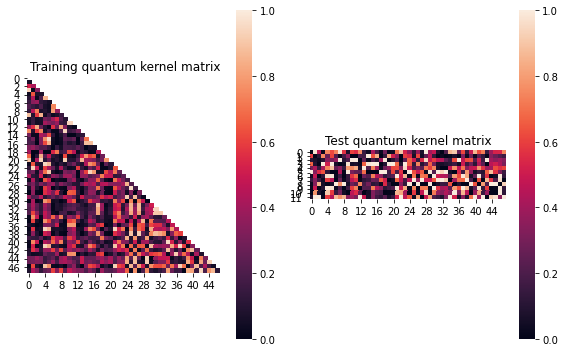


SVM with quantum kernel trained!


Test set performance:


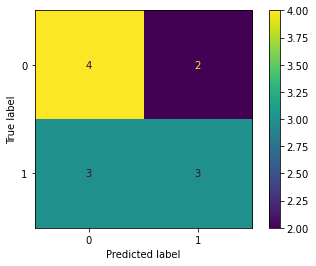

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.09060093072068909
metric(s) 2: (00, 10, 11) = (0.3182146966767896, 0.2833874171655382, 0.42976199909566504)
metric 3: -2.510425257084273e-288


----> Kernel construction duration: 00:01:19


Combination 41/468
(Current range: 41/46)
			 reps : 1
			 paulis : ['Z', 'XY']
			 entanglement : linear

Feature map:


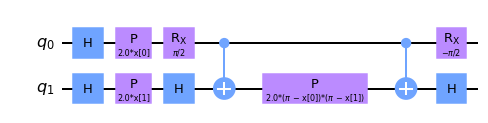


Quantum kernel matrices:



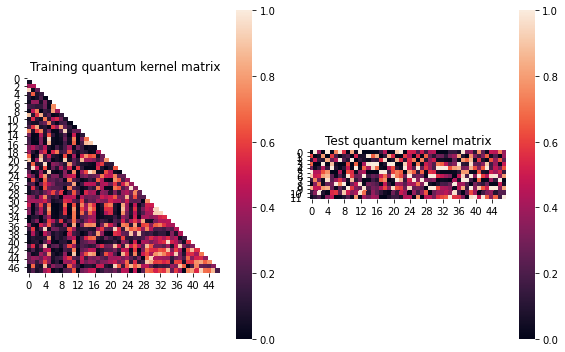


SVM with quantum kernel trained!


Test set performance:


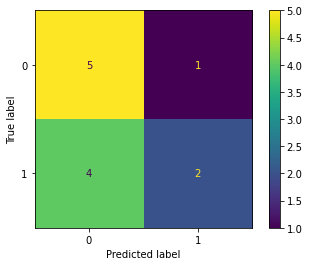

              precision    recall  f1-score   support

           0       0.56      0.83      0.67         6
           1       0.67      0.33      0.44         6

    accuracy                           0.58        12
   macro avg       0.61      0.58      0.56        12
weighted avg       0.61      0.58      0.56        12


metric 1: 0.09080385371557281
metric(s) 2: (00, 10, 11) = (0.3030879082964023, 0.2873448904896791, 0.45320958011410145)
metric 3: 5.005340843422931e-286


----> Kernel construction duration: 00:01:20


Combination 42/468
(Current range: 42/46)
			 reps : 1
			 paulis : ['Z', 'XZ']
			 entanglement : linear

Feature map:


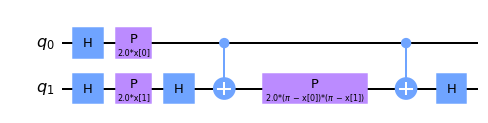


Quantum kernel matrices:



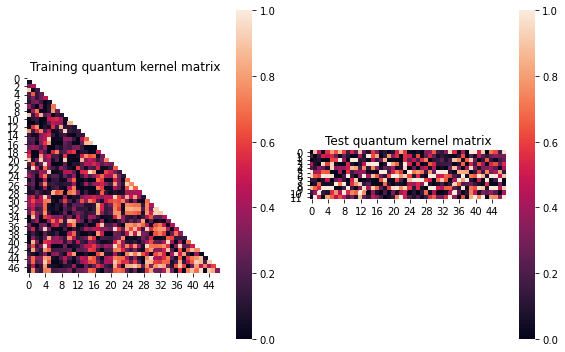


SVM with quantum kernel trained!


Test set performance:


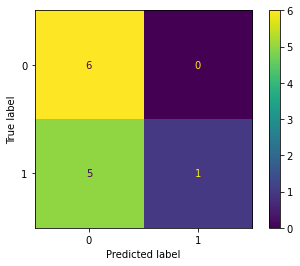

              precision    recall  f1-score   support

           0       0.55      1.00      0.71         6
           1       1.00      0.17      0.29         6

    accuracy                           0.58        12
   macro avg       0.77      0.58      0.50        12
weighted avg       0.77      0.58      0.50        12


metric 1: 0.10555555163178387
metric(s) 2: (00, 10, 11) = (0.31289589449282057, 0.29556073469802313, 0.4893366781667934)
metric 3: 1.36347e-319


----> Kernel construction duration: 00:01:15


Combination 43/468
(Current range: 43/46)
			 reps : 1
			 paulis : ['Z', 'YX']
			 entanglement : linear

Feature map:


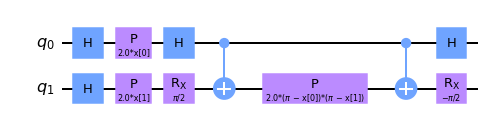


Quantum kernel matrices:



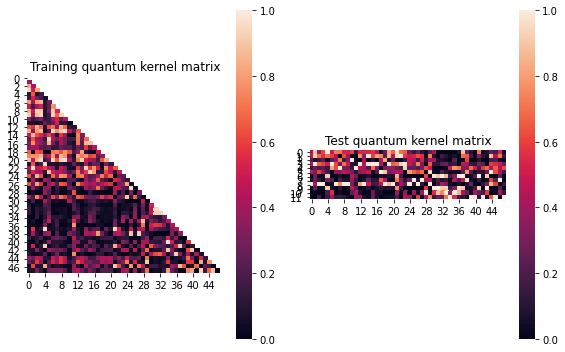


SVM with quantum kernel trained!


Test set performance:


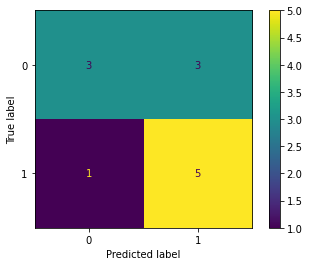

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.17606513043820635
metric(s) 2: (00, 10, 11) = (0.46426891504458656, 0.20347704687126325, 0.29481543957435263)
metric 3: -7.821280819289494e-274


----> Kernel construction duration: 00:01:21


Combination 44/468
(Current range: 44/46)
			 reps : 1
			 paulis : ['Z', 'YY']
			 entanglement : linear

Feature map:


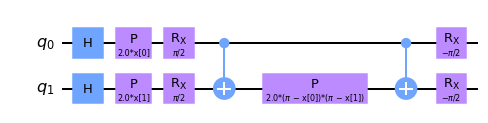


Quantum kernel matrices:



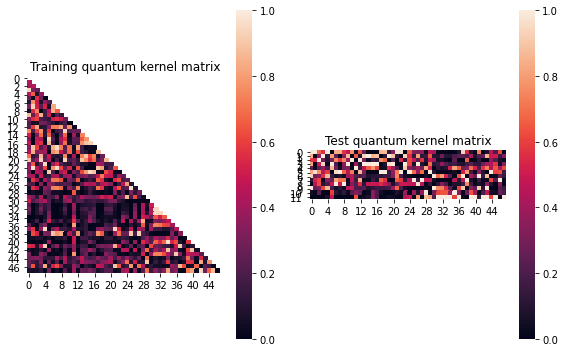


SVM with quantum kernel trained!


Test set performance:


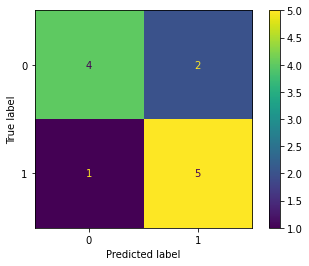

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.15922888128520513
metric(s) 2: (00, 10, 11) = (0.4049675247909443, 0.20629830601403193, 0.32608684980752983)
metric 3: 6.837788892154588e-277


----> Kernel construction duration: 00:01:16


Combination 45/468
(Current range: 45/46)
			 reps : 1
			 paulis : ['Z', 'YZ']
			 entanglement : linear

Feature map:


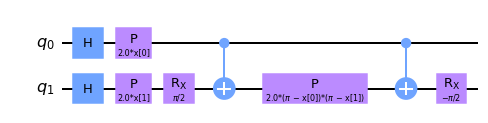


Quantum kernel matrices:



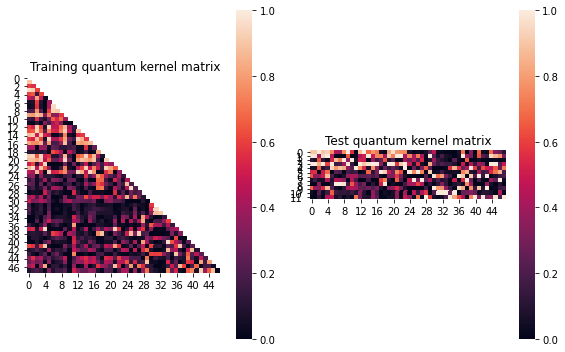


SVM with quantum kernel trained!


Test set performance:


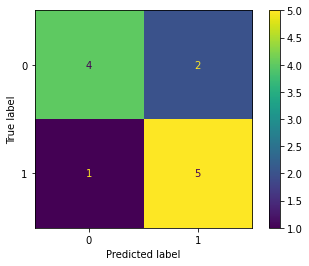

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.19534227996984807
metric(s) 2: (00, 10, 11) = (0.4774218614222749, 0.19492233200599032, 0.30310736252940185)
metric 3: 2.6626348165232236e-295


----> Kernel construction duration: 00:01:05


Combination 46/468
(Current range: 46/46)
			 reps : 1
			 paulis : ['Z', 'ZX']
			 entanglement : linear

Feature map:


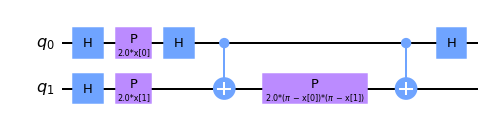


Quantum kernel matrices:



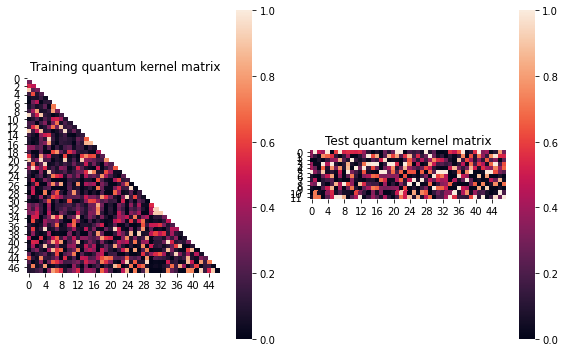


SVM with quantum kernel trained!


Test set performance:


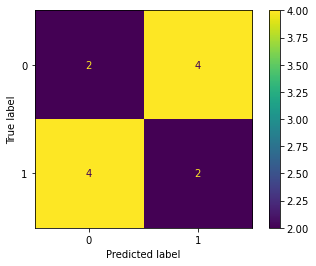

              precision    recall  f1-score   support

           0       0.33      0.33      0.33         6
           1       0.33      0.33      0.33         6

    accuracy                           0.33        12
   macro avg       0.33      0.33      0.33        12
weighted avg       0.33      0.33      0.33        12


metric 1: 0.059937446647454345
metric(s) 2: (00, 10, 11) = (0.2927265413330003, 0.2389280230277462, 0.30500439801740076)
metric 3: 2.020708804666086e-305


----> Kernel construction duration: 00:01:05


In [13]:
j=0
results.append(run_kernel_evaluation(X, X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 47/468
(Current range: 1/46)
			 reps : 1
			 paulis : ['Z', 'ZY']
			 entanglement : linear

Feature map:


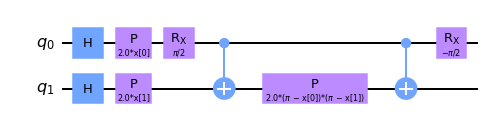


Quantum kernel matrices:



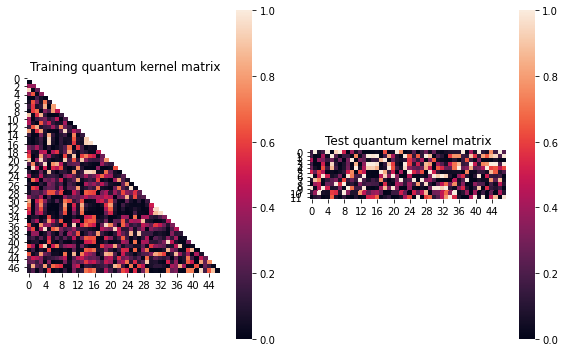


SVM with quantum kernel trained!


Test set performance:


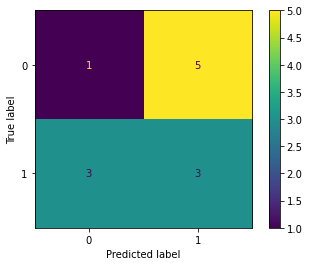

              precision    recall  f1-score   support

           0       0.25      0.17      0.20         6
           1       0.38      0.50      0.43         6

    accuracy                           0.33        12
   macro avg       0.31      0.33      0.31        12
weighted avg       0.31      0.33      0.31        12


metric 1: 0.038937754613507736
metric(s) 2: (00, 10, 11) = (0.3077148765057487, 0.26050152062724763, 0.29116367397576204)
metric 3: -7.03334176827266e-305


----> Kernel construction duration: 00:01:06


Combination 48/468
(Current range: 2/46)
			 reps : 1
			 paulis : ['Z', 'ZZ']
			 entanglement : linear

Feature map:


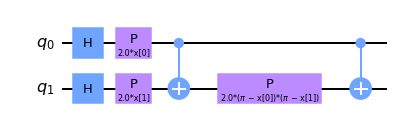


Quantum kernel matrices:



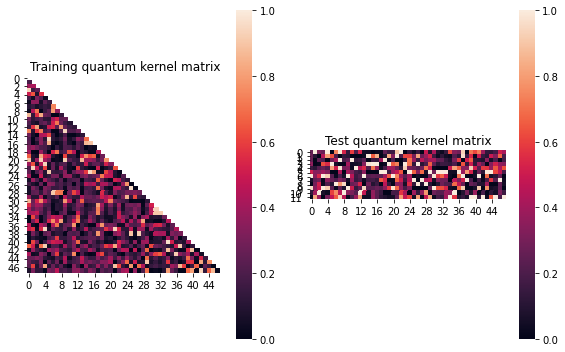


SVM with quantum kernel trained!


Test set performance:


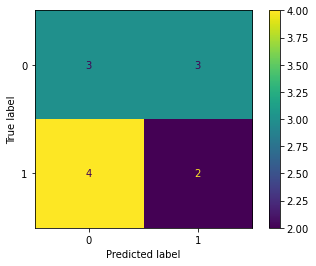

              precision    recall  f1-score   support

           0       0.43      0.50      0.46         6
           1       0.40      0.33      0.36         6

    accuracy                           0.42        12
   macro avg       0.41      0.42      0.41        12
weighted avg       0.41      0.42      0.41        12


metric 1: 0.05733851085899522
metric(s) 2: (00, 10, 11) = (0.31281939221849137, 0.2511093745159616, 0.3040763785314222)
metric 3: 3.3102918868991154e-287


----> Kernel construction duration: 00:01:00


Combination 49/468
(Current range: 3/46)
			 reps : 1
			 paulis : ['XX', 'X']
			 entanglement : linear

Feature map:


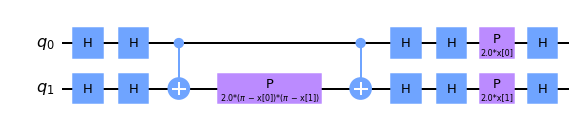


Quantum kernel matrices:



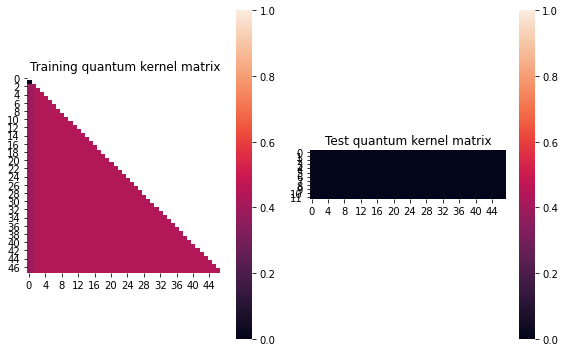


SVM with quantum kernel trained!


Test set performance:


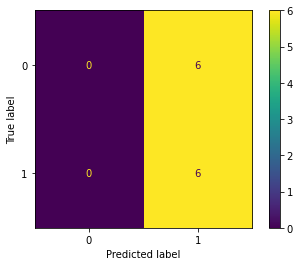

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:00:49


Combination 50/468
(Current range: 4/46)
			 reps : 1
			 paulis : ['XX', 'Y']
			 entanglement : linear

Feature map:


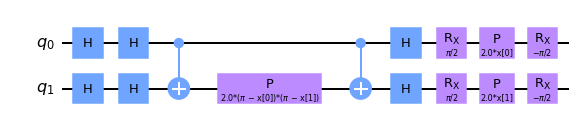


Quantum kernel matrices:



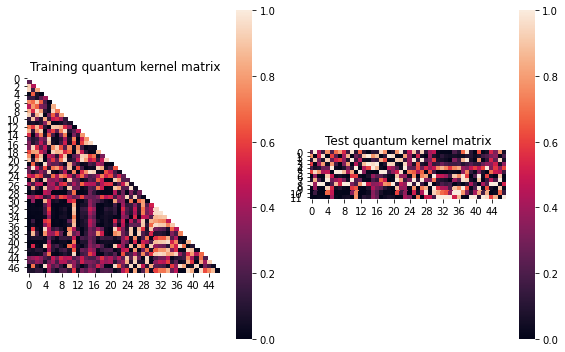


SVM with quantum kernel trained!


Test set performance:


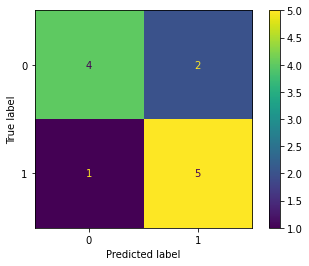

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.20135834676654873
metric(s) 2: (00, 10, 11) = (0.4378378272218841, 0.2462121996661747, 0.4573032656435627)
metric 3: -1.498792611769664e-308


----> Kernel construction duration: 00:00:57


Combination 51/468
(Current range: 5/46)
			 reps : 1
			 paulis : ['XX', 'Z']
			 entanglement : linear

Feature map:


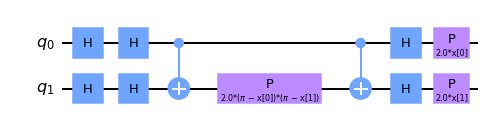


Quantum kernel matrices:



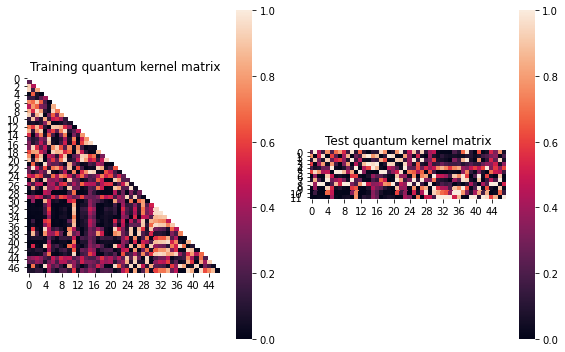


SVM with quantum kernel trained!


Test set performance:


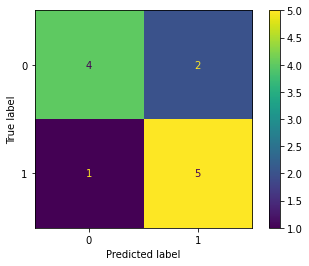

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.20135834676654873
metric(s) 2: (00, 10, 11) = (0.4378378272218841, 0.2462121996661747, 0.4573032656435627)
metric 3: -1.498792611769664e-308


----> Kernel construction duration: 00:01:13


Combination 52/468
(Current range: 6/46)
			 reps : 1
			 paulis : ['XX', 'XX']
			 entanglement : linear

Feature map:


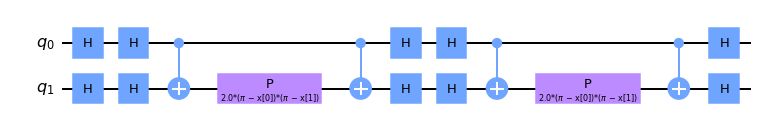


Quantum kernel matrices:



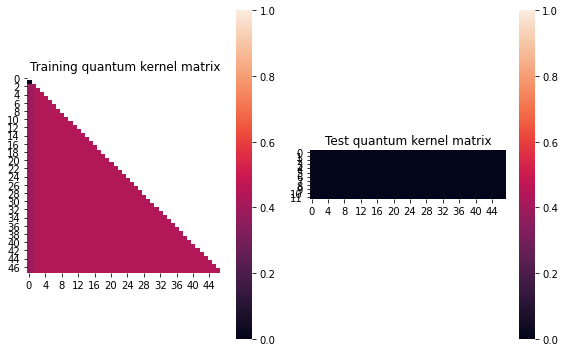


SVM with quantum kernel trained!


Test set performance:


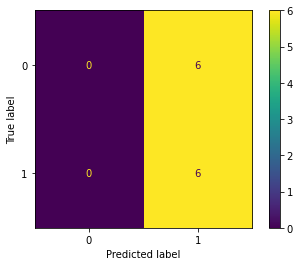

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:00:29


Combination 53/468
(Current range: 7/46)
			 reps : 1
			 paulis : ['XX', 'XY']
			 entanglement : linear

Feature map:


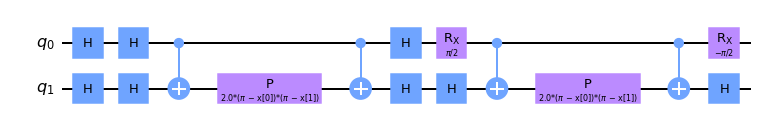


Quantum kernel matrices:



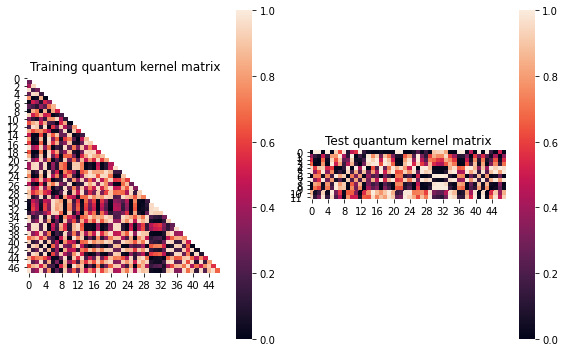


SVM with quantum kernel trained!


Test set performance:


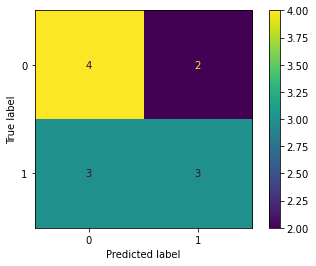

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:00:59


Combination 54/468
(Current range: 8/46)
			 reps : 1
			 paulis : ['XX', 'XZ']
			 entanglement : linear

Feature map:


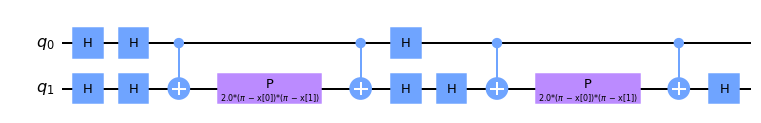


Quantum kernel matrices:



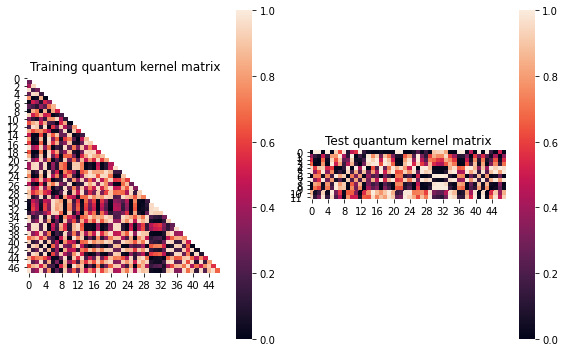


SVM with quantum kernel trained!


Test set performance:


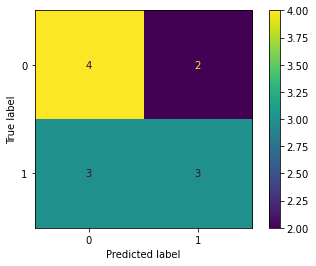

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:01


Combination 55/468
(Current range: 9/46)
			 reps : 1
			 paulis : ['XX', 'YX']
			 entanglement : linear

Feature map:


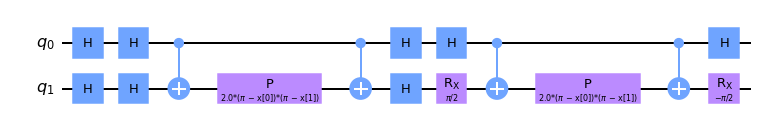


Quantum kernel matrices:



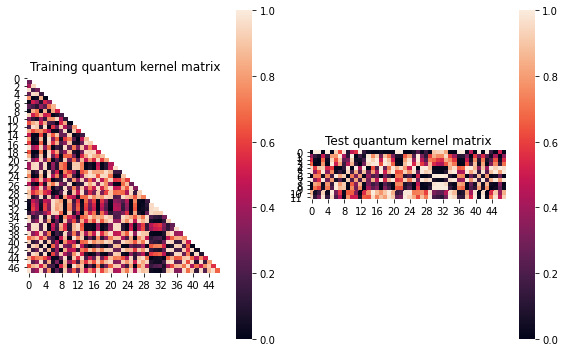


SVM with quantum kernel trained!


Test set performance:


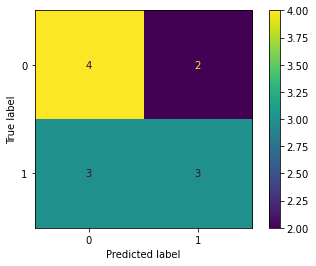

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:01


Combination 56/468
(Current range: 10/46)
			 reps : 1
			 paulis : ['XX', 'YY']
			 entanglement : linear

Feature map:


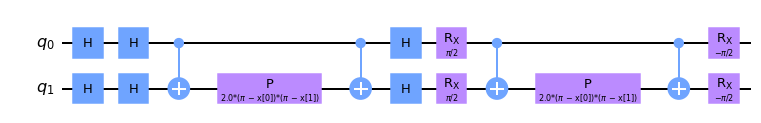


Quantum kernel matrices:



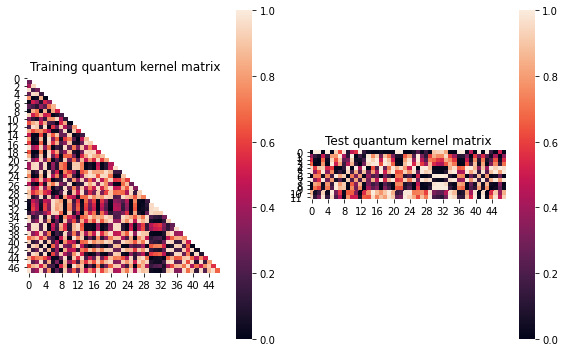


SVM with quantum kernel trained!


Test set performance:


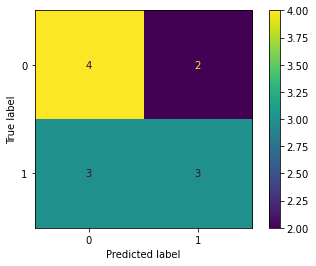

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:16


Combination 57/468
(Current range: 11/46)
			 reps : 1
			 paulis : ['XX', 'YZ']
			 entanglement : linear

Feature map:


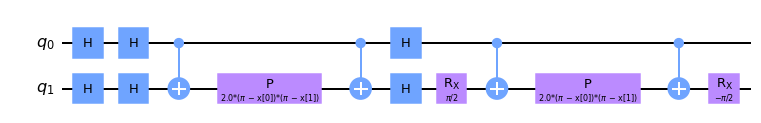


Quantum kernel matrices:



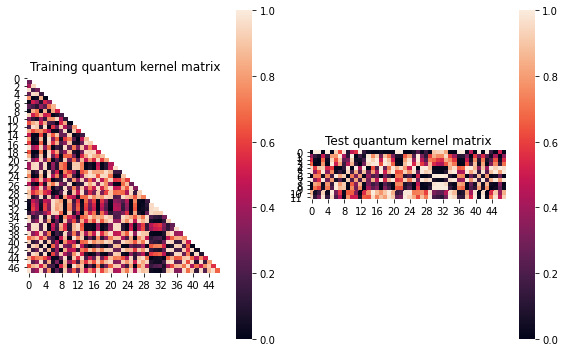


SVM with quantum kernel trained!


Test set performance:


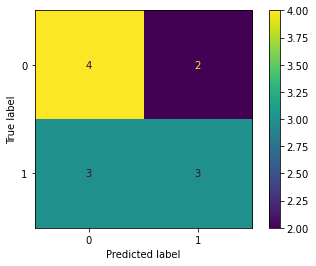

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:14


Combination 58/468
(Current range: 12/46)
			 reps : 1
			 paulis : ['XX', 'ZX']
			 entanglement : linear

Feature map:


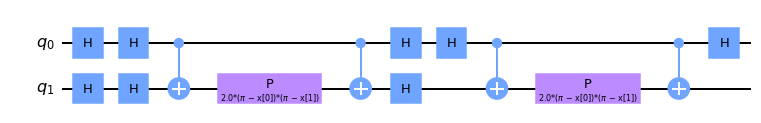


Quantum kernel matrices:



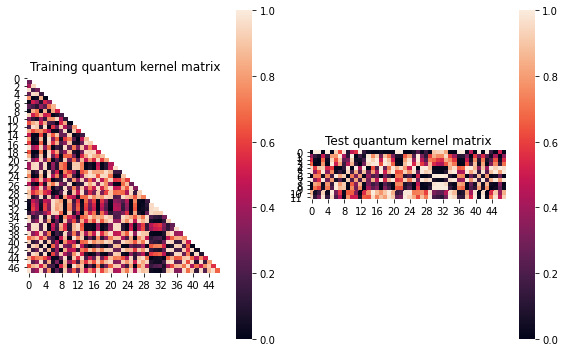


SVM with quantum kernel trained!


Test set performance:


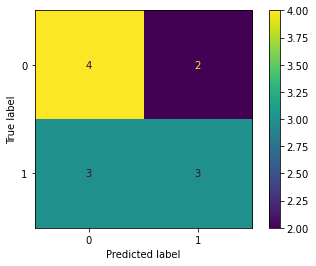

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:01


Combination 59/468
(Current range: 13/46)
			 reps : 1
			 paulis : ['XX', 'ZY']
			 entanglement : linear

Feature map:


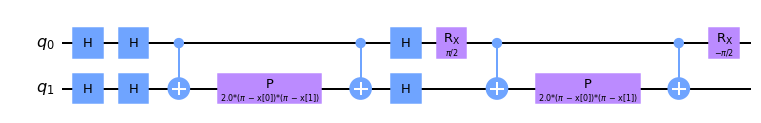


Quantum kernel matrices:



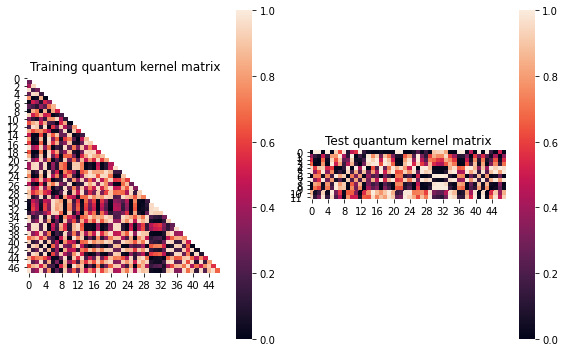


SVM with quantum kernel trained!


Test set performance:


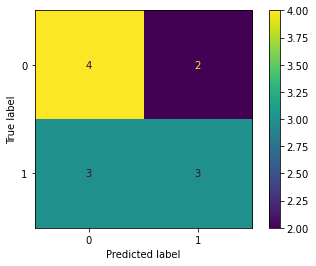

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:20


Combination 60/468
(Current range: 14/46)
			 reps : 1
			 paulis : ['XX', 'ZZ']
			 entanglement : linear

Feature map:


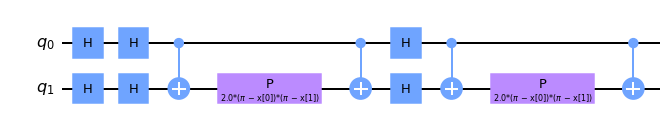


Quantum kernel matrices:



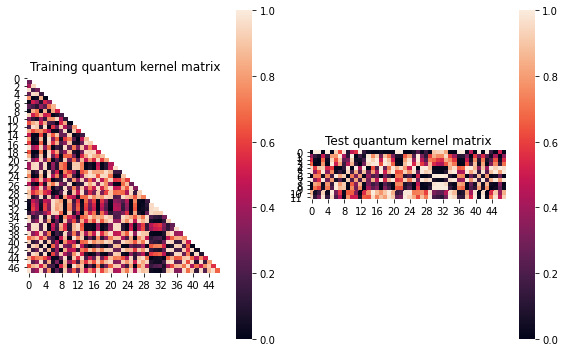


SVM with quantum kernel trained!


Test set performance:


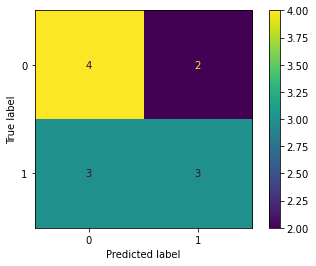

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:14


Combination 61/468
(Current range: 15/46)
			 reps : 1
			 paulis : ['XY', 'X']
			 entanglement : linear

Feature map:


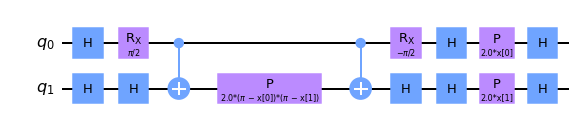


Quantum kernel matrices:



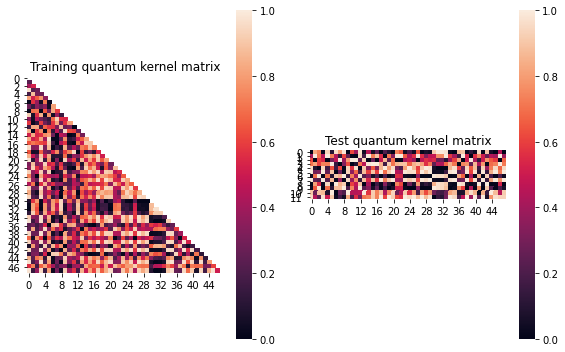


SVM with quantum kernel trained!


Test set performance:


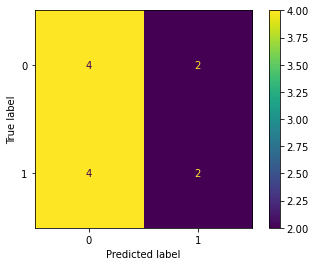

              precision    recall  f1-score   support

           0       0.50      0.67      0.57         6
           1       0.50      0.33      0.40         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.49        12
weighted avg       0.50      0.50      0.49        12


metric 1: 0.015918544943647306
metric(s) 2: (00, 10, 11) = (0.5046196069108859, 0.5011971311675705, 0.5296117453115496)
metric 3: 0.0


----> Kernel construction duration: 00:01:12


Combination 62/468
(Current range: 16/46)
			 reps : 1
			 paulis : ['XY', 'Y']
			 entanglement : linear

Feature map:


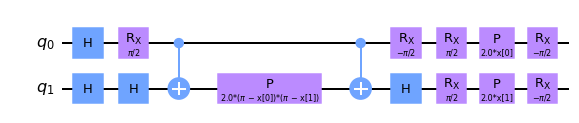


Quantum kernel matrices:



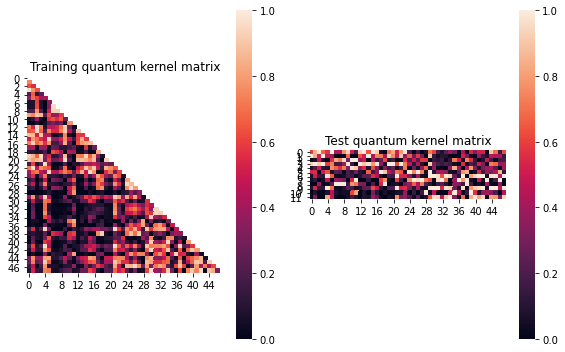


SVM with quantum kernel trained!


Test set performance:


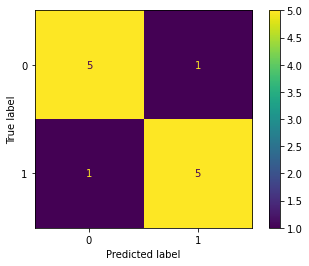

              precision    recall  f1-score   support

           0       0.83      0.83      0.83         6
           1       0.83      0.83      0.83         6

    accuracy                           0.83        12
   macro avg       0.83      0.83      0.83        12
weighted avg       0.83      0.83      0.83        12


metric 1: 0.2421895883691144
metric(s) 2: (00, 10, 11) = (0.47496493922591143, 0.2349898749270485, 0.47939398736641436)
metric 3: -2.2249747449789787e-306


----> Kernel construction duration: 00:01:11


Combination 63/468
(Current range: 17/46)
			 reps : 1
			 paulis : ['XY', 'Z']
			 entanglement : linear

Feature map:


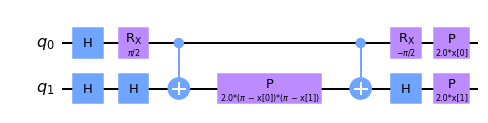


Quantum kernel matrices:



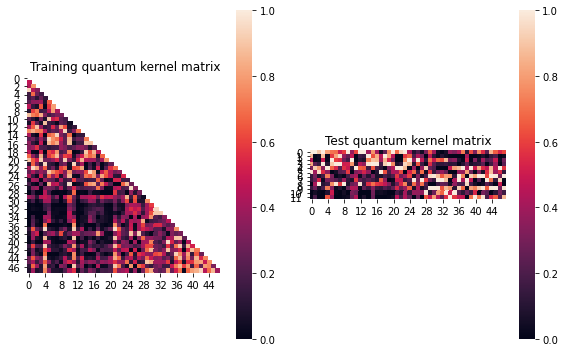


SVM with quantum kernel trained!


Test set performance:


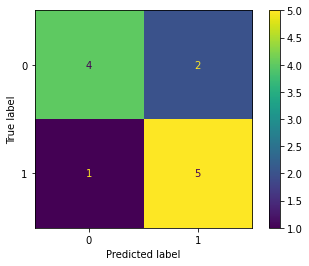

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.20266744984355947
metric(s) 2: (00, 10, 11) = (0.4310430697273885, 0.23210468900128886, 0.4385012079623082)
metric 3: 9.274106036082848e-289


----> Kernel construction duration: 00:01:17


Combination 64/468
(Current range: 18/46)
			 reps : 1
			 paulis : ['XY', 'XX']
			 entanglement : linear

Feature map:


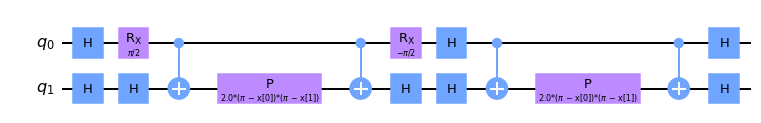


Quantum kernel matrices:



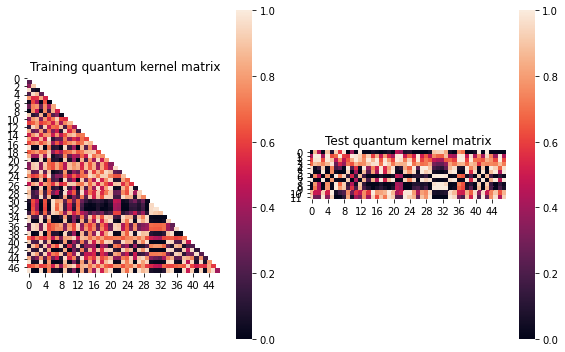


SVM with quantum kernel trained!


Test set performance:


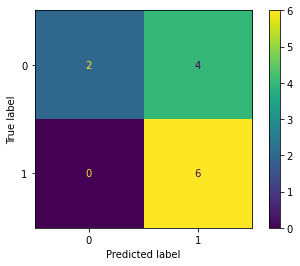

              precision    recall  f1-score   support

           0       1.00      0.33      0.50         6
           1       0.60      1.00      0.75         6

    accuracy                           0.67        12
   macro avg       0.80      0.67      0.62        12
weighted avg       0.80      0.67      0.62        12


metric 1: 0.04715491323229459
metric(s) 2: (00, 10, 11) = (0.581862243568751, 0.50887627861619, 0.530200140128218)
metric 3: -0.0


----> Kernel construction duration: 00:01:20


Combination 65/468
(Current range: 19/46)
			 reps : 1
			 paulis : ['XY', 'XY']
			 entanglement : linear

Feature map:


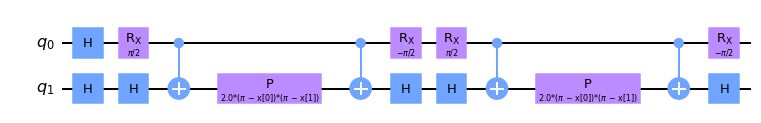


Quantum kernel matrices:



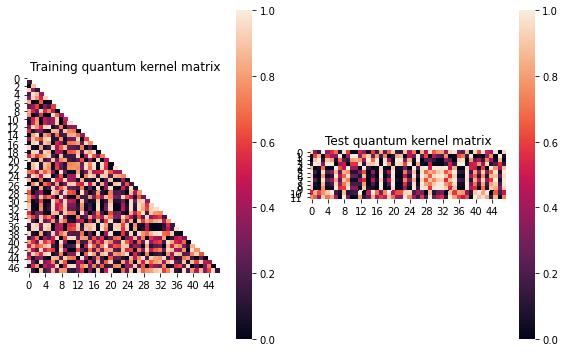


SVM with quantum kernel trained!


Test set performance:


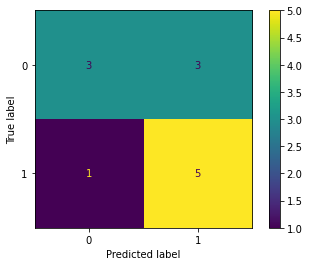

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:00:44


Combination 66/468
(Current range: 20/46)
			 reps : 1
			 paulis : ['XY', 'XZ']
			 entanglement : linear

Feature map:


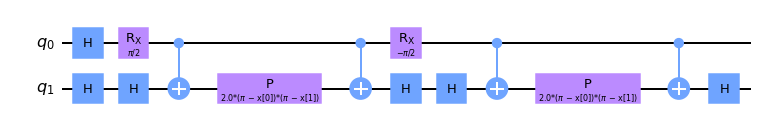


Quantum kernel matrices:



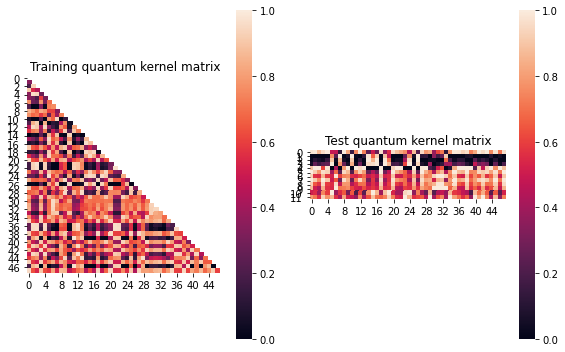


SVM with quantum kernel trained!


Test set performance:


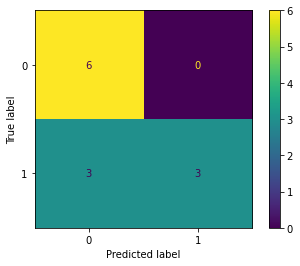

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.007826268788840407
metric(s) 2: (00, 10, 11) = (0.5209498107440138, 0.5720519571948796, 0.6075015660680645)
metric 3: -0.0


----> Kernel construction duration: 00:01:27


Combination 67/468
(Current range: 21/46)
			 reps : 1
			 paulis : ['XY', 'YX']
			 entanglement : linear

Feature map:


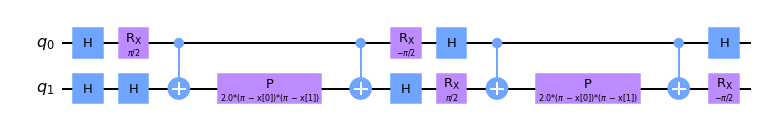


Quantum kernel matrices:



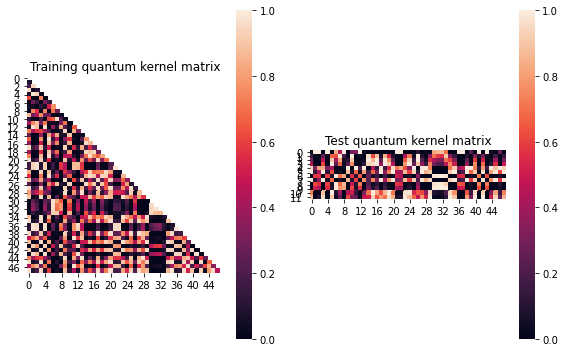


SVM with quantum kernel trained!


Test set performance:


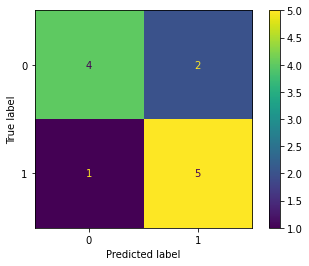

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:38


Combination 68/468
(Current range: 22/46)
			 reps : 1
			 paulis : ['XY', 'YY']
			 entanglement : linear

Feature map:


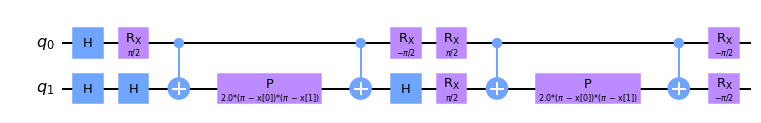


Quantum kernel matrices:



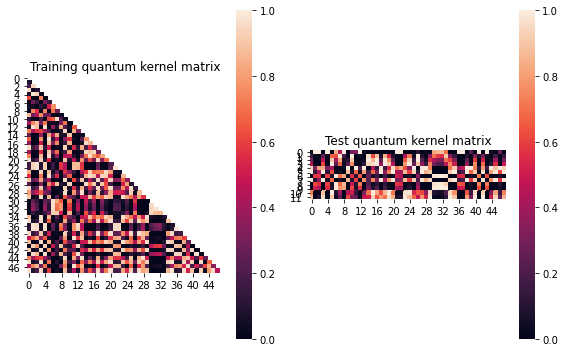


SVM with quantum kernel trained!


Test set performance:


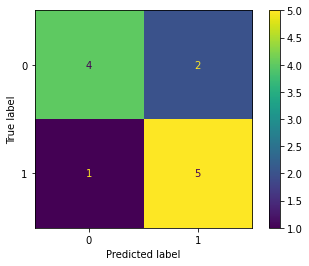

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:32


Combination 69/468
(Current range: 23/46)
			 reps : 1
			 paulis : ['XY', 'YZ']
			 entanglement : linear

Feature map:


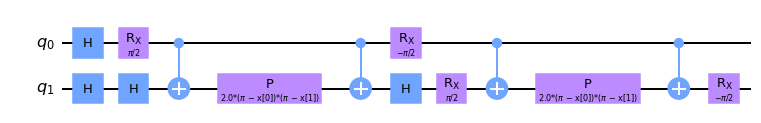


Quantum kernel matrices:



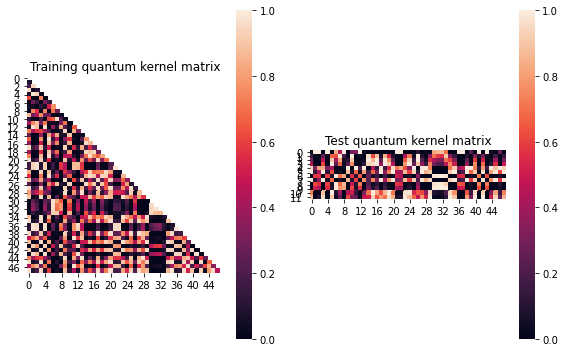


SVM with quantum kernel trained!


Test set performance:


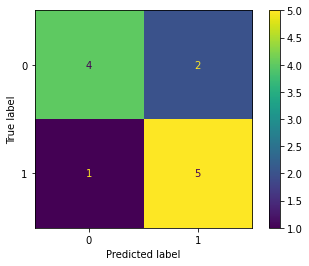

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:40


Combination 70/468
(Current range: 24/46)
			 reps : 1
			 paulis : ['XY', 'ZX']
			 entanglement : linear

Feature map:


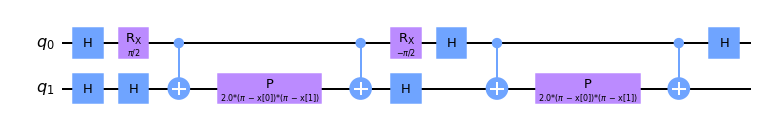


Quantum kernel matrices:



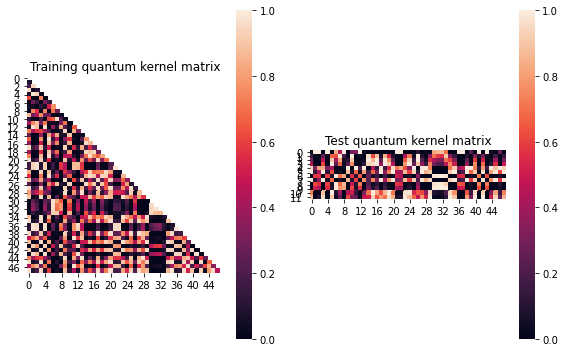


SVM with quantum kernel trained!


Test set performance:


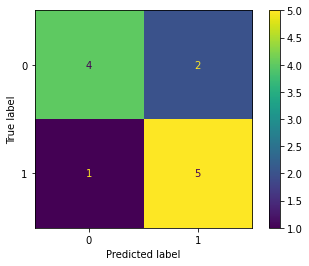

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:39


Combination 71/468
(Current range: 25/46)
			 reps : 1
			 paulis : ['XY', 'ZY']
			 entanglement : linear

Feature map:


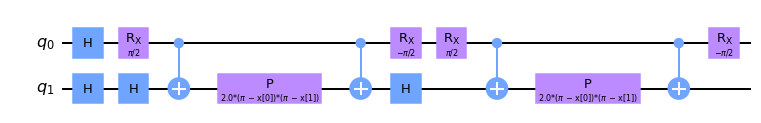


Quantum kernel matrices:



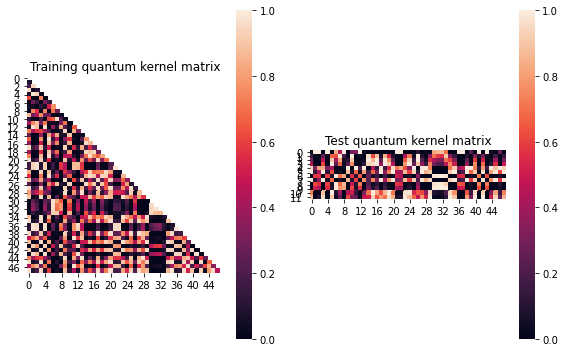


SVM with quantum kernel trained!


Test set performance:


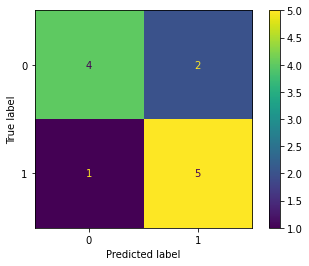

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:23


Combination 72/468
(Current range: 26/46)
			 reps : 1
			 paulis : ['XY', 'ZZ']
			 entanglement : linear

Feature map:


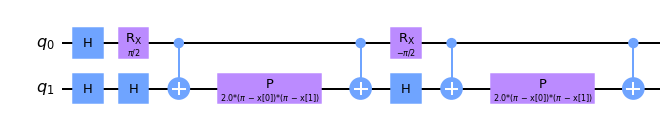


Quantum kernel matrices:



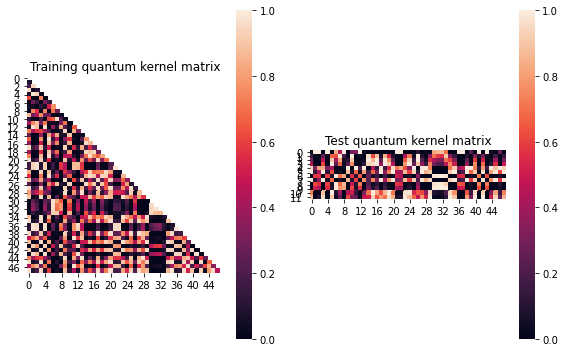


SVM with quantum kernel trained!


Test set performance:


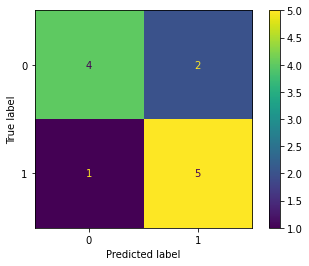

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:34


Combination 73/468
(Current range: 27/46)
			 reps : 1
			 paulis : ['XZ', 'X']
			 entanglement : linear

Feature map:


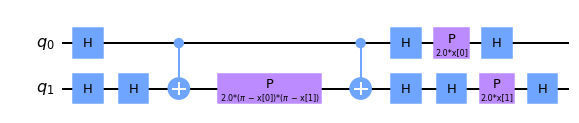


Quantum kernel matrices:



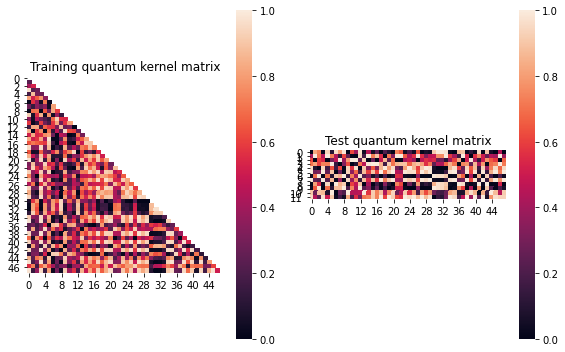


SVM with quantum kernel trained!


Test set performance:


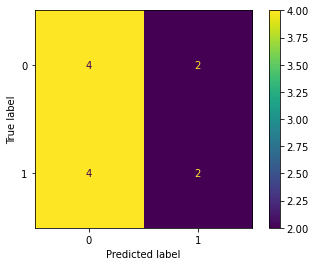

              precision    recall  f1-score   support

           0       0.50      0.67      0.57         6
           1       0.50      0.33      0.40         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.49        12
weighted avg       0.50      0.50      0.49        12


metric 1: 0.015918544943647306
metric(s) 2: (00, 10, 11) = (0.5046196069108859, 0.5011971311675705, 0.5296117453115496)
metric 3: 0.0


----> Kernel construction duration: 00:01:13


Combination 74/468
(Current range: 28/46)
			 reps : 1
			 paulis : ['XZ', 'Y']
			 entanglement : linear

Feature map:


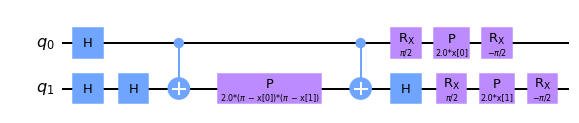


Quantum kernel matrices:



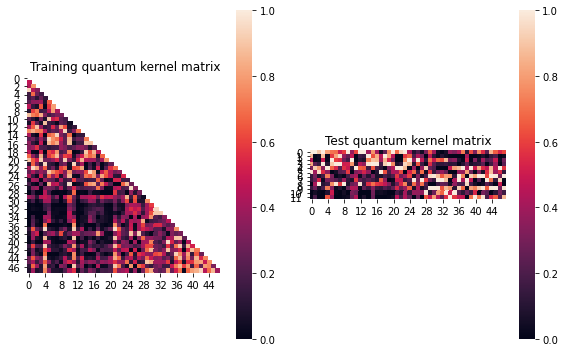


SVM with quantum kernel trained!


Test set performance:


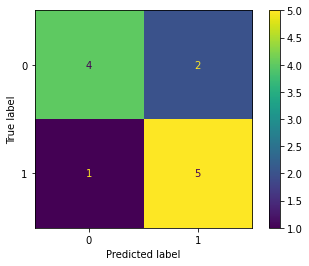

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.20266744984355947
metric(s) 2: (00, 10, 11) = (0.4310430697273885, 0.23210468900128886, 0.4385012079623082)
metric 3: 9.274106036082848e-289


----> Kernel construction duration: 00:01:16


Combination 75/468
(Current range: 29/46)
			 reps : 1
			 paulis : ['XZ', 'Z']
			 entanglement : linear

Feature map:


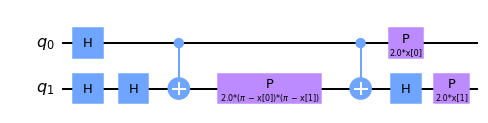


Quantum kernel matrices:



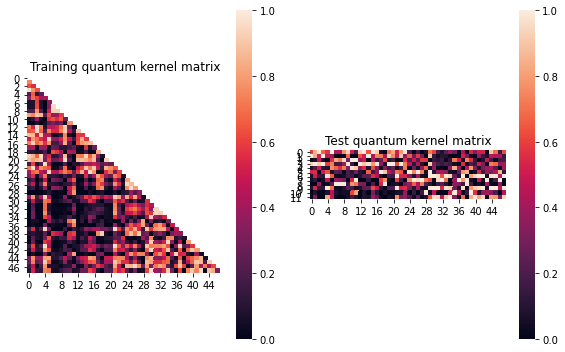


SVM with quantum kernel trained!


Test set performance:


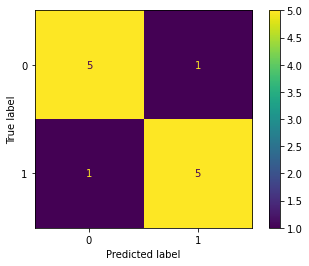

              precision    recall  f1-score   support

           0       0.83      0.83      0.83         6
           1       0.83      0.83      0.83         6

    accuracy                           0.83        12
   macro avg       0.83      0.83      0.83        12
weighted avg       0.83      0.83      0.83        12


metric 1: 0.2421895883691144
metric(s) 2: (00, 10, 11) = (0.47496493922591143, 0.2349898749270485, 0.47939398736641436)
metric 3: -2.2249747449789787e-306


----> Kernel construction duration: 00:01:09


Combination 76/468
(Current range: 30/46)
			 reps : 1
			 paulis : ['XZ', 'XX']
			 entanglement : linear

Feature map:


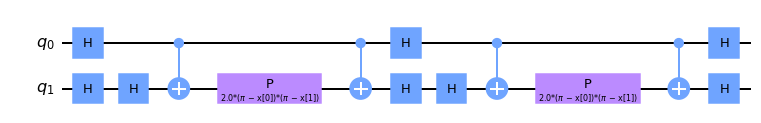


Quantum kernel matrices:



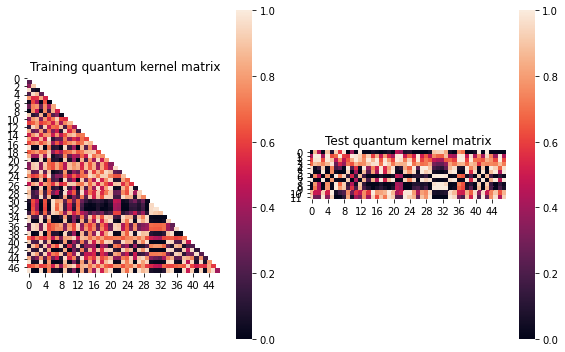


SVM with quantum kernel trained!


Test set performance:


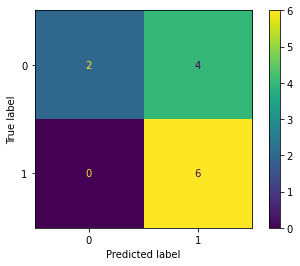

              precision    recall  f1-score   support

           0       1.00      0.33      0.50         6
           1       0.60      1.00      0.75         6

    accuracy                           0.67        12
   macro avg       0.80      0.67      0.62        12
weighted avg       0.80      0.67      0.62        12


metric 1: 0.04715491323229459
metric(s) 2: (00, 10, 11) = (0.581862243568751, 0.50887627861619, 0.530200140128218)
metric 3: -0.0


----> Kernel construction duration: 00:01:09


Combination 77/468
(Current range: 31/46)
			 reps : 1
			 paulis : ['XZ', 'XY']
			 entanglement : linear

Feature map:


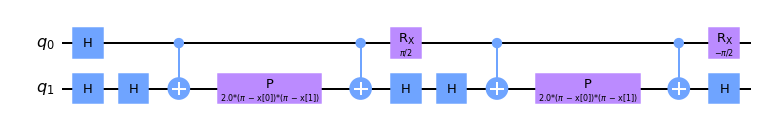


Quantum kernel matrices:



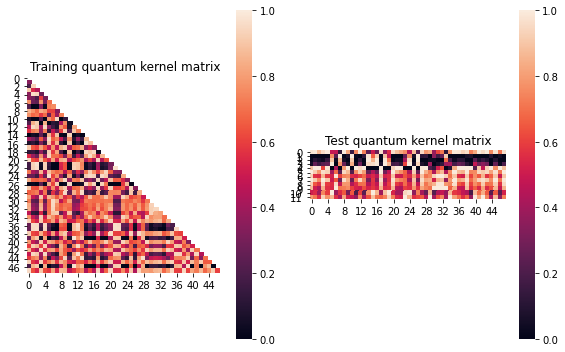


SVM with quantum kernel trained!


Test set performance:


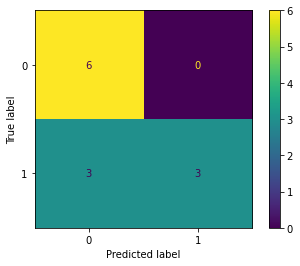

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.007826268788840407
metric(s) 2: (00, 10, 11) = (0.5209498107440138, 0.5720519571948796, 0.6075015660680645)
metric 3: -0.0


----> Kernel construction duration: 00:01:11


Combination 78/468
(Current range: 32/46)
			 reps : 1
			 paulis : ['XZ', 'XZ']
			 entanglement : linear

Feature map:


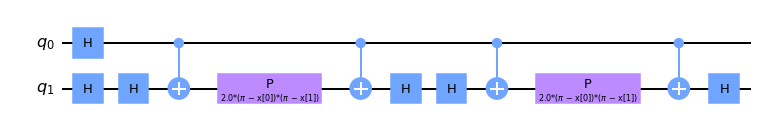


Quantum kernel matrices:



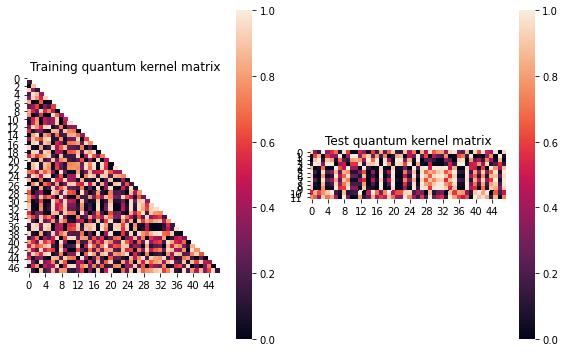


SVM with quantum kernel trained!


Test set performance:


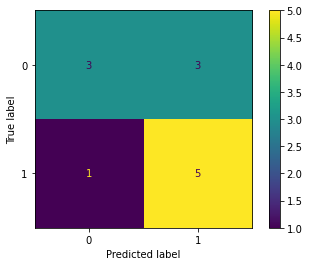

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:00:46


Combination 79/468
(Current range: 33/46)
			 reps : 1
			 paulis : ['XZ', 'YX']
			 entanglement : linear

Feature map:


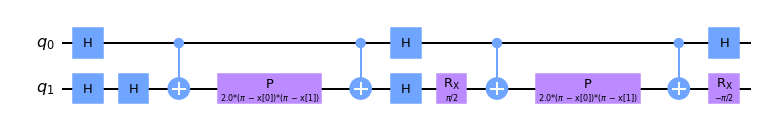


Quantum kernel matrices:



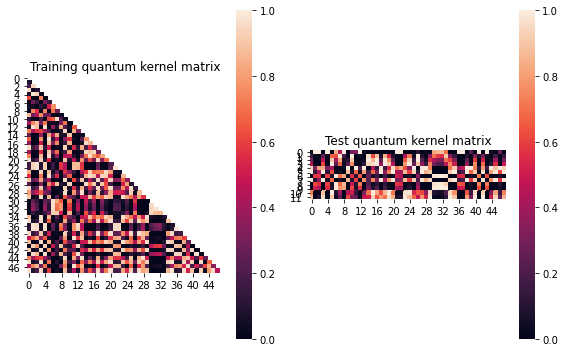


SVM with quantum kernel trained!


Test set performance:


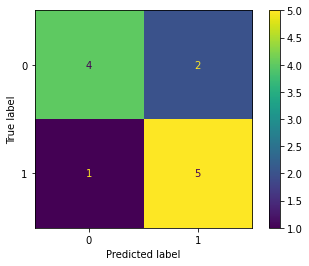

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:40


Combination 80/468
(Current range: 34/46)
			 reps : 1
			 paulis : ['XZ', 'YY']
			 entanglement : linear

Feature map:


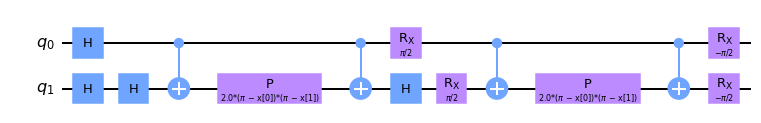


Quantum kernel matrices:



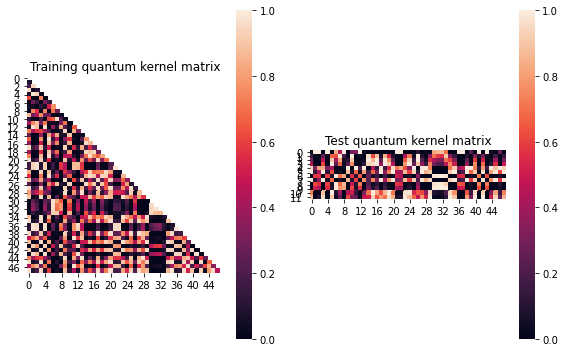


SVM with quantum kernel trained!


Test set performance:


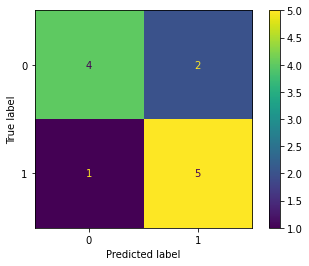

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:38


Combination 81/468
(Current range: 35/46)
			 reps : 1
			 paulis : ['XZ', 'YZ']
			 entanglement : linear

Feature map:


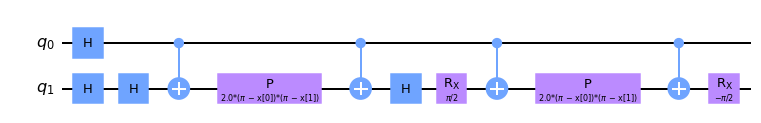


Quantum kernel matrices:



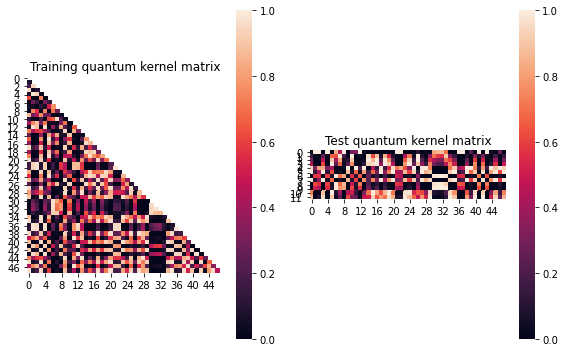


SVM with quantum kernel trained!


Test set performance:


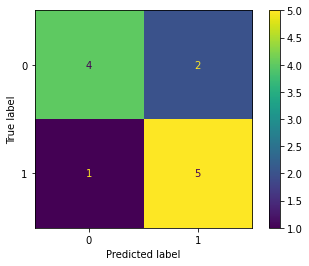

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:18


Combination 82/468
(Current range: 36/46)
			 reps : 1
			 paulis : ['XZ', 'ZX']
			 entanglement : linear

Feature map:


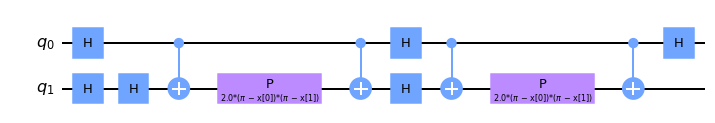


Quantum kernel matrices:



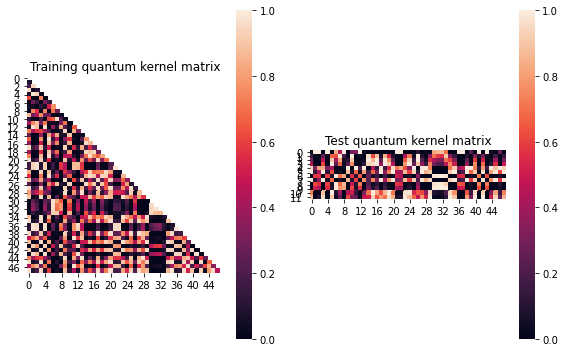


SVM with quantum kernel trained!


Test set performance:


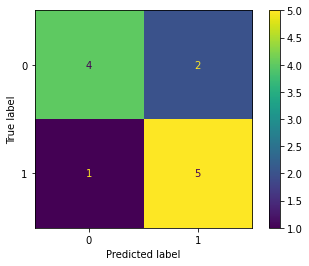

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:32


Combination 83/468
(Current range: 37/46)
			 reps : 1
			 paulis : ['XZ', 'ZY']
			 entanglement : linear

Feature map:


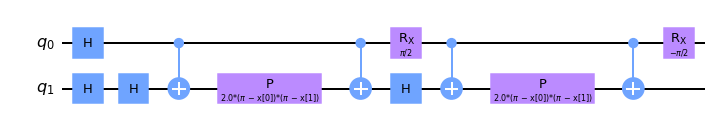


Quantum kernel matrices:



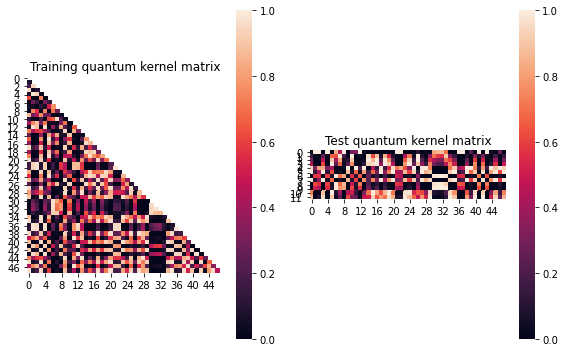


SVM with quantum kernel trained!


Test set performance:


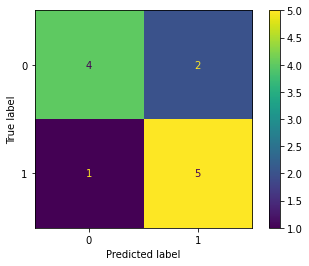

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:35


Combination 84/468
(Current range: 38/46)
			 reps : 1
			 paulis : ['XZ', 'ZZ']
			 entanglement : linear

Feature map:


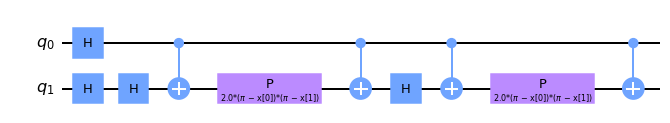


Quantum kernel matrices:



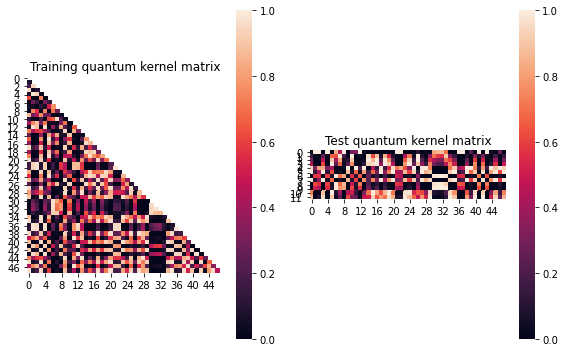


SVM with quantum kernel trained!


Test set performance:


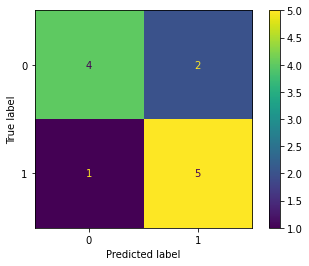

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:27


Combination 85/468
(Current range: 39/46)
			 reps : 1
			 paulis : ['YX', 'X']
			 entanglement : linear

Feature map:


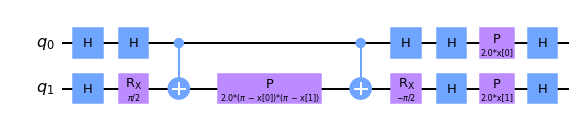


Quantum kernel matrices:



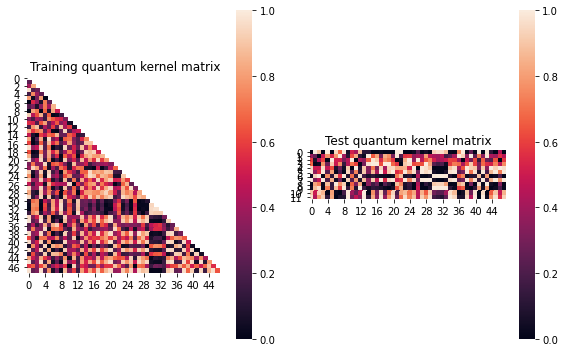


SVM with quantum kernel trained!


Test set performance:


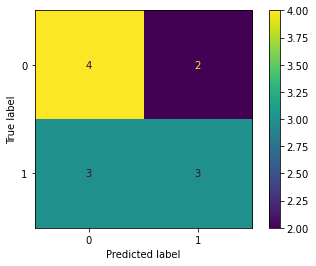

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.0036206862742787504
metric(s) 2: (00, 10, 11) = (0.4903716771831292, 0.49727185441767435, 0.511413404200777)
metric 3: -0.0


----> Kernel construction duration: 00:01:29


Combination 86/468
(Current range: 40/46)
			 reps : 1
			 paulis : ['YX', 'Y']
			 entanglement : linear

Feature map:


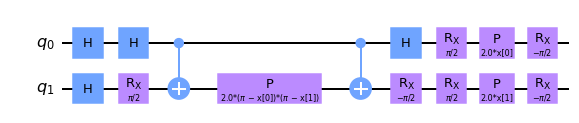


Quantum kernel matrices:



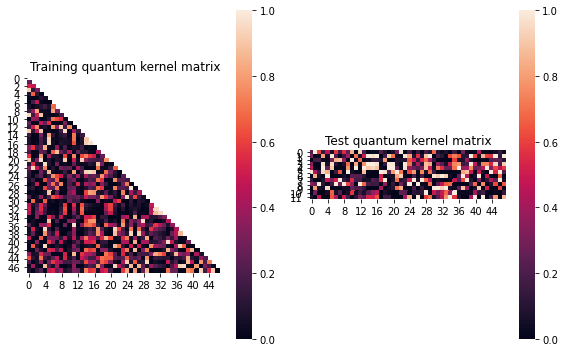


SVM with quantum kernel trained!


Test set performance:


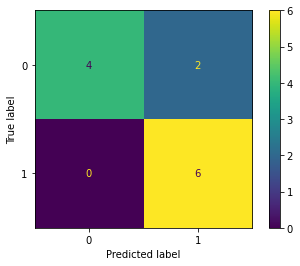

              precision    recall  f1-score   support

           0       1.00      0.67      0.80         6
           1       0.75      1.00      0.86         6

    accuracy                           0.83        12
   macro avg       0.88      0.83      0.83        12
weighted avg       0.88      0.83      0.83        12


metric 1: 0.05745255853628786
metric(s) 2: (00, 10, 11) = (0.2874164225628365, 0.24188881957412414, 0.3112663336579875)
metric 3: -5.953886420656999e-293


----> Kernel construction duration: 00:01:50


Combination 87/468
(Current range: 41/46)
			 reps : 1
			 paulis : ['YX', 'Z']
			 entanglement : linear

Feature map:


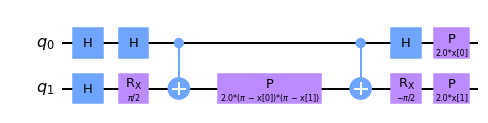


Quantum kernel matrices:



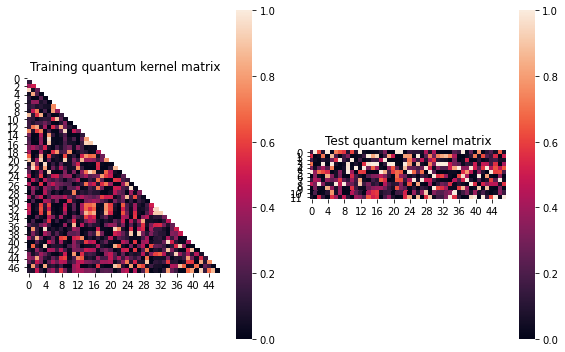


SVM with quantum kernel trained!


Test set performance:


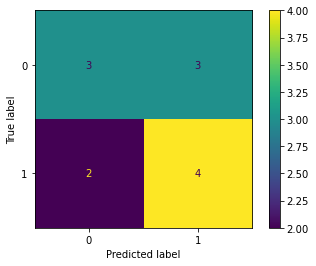

              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.57      0.67      0.62         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.04954143801771854
metric(s) 2: (00, 10, 11) = (0.2870810907367485, 0.242463449125773, 0.2969286835502346)
metric 3: 1.6268985822952814e-288


----> Kernel construction duration: 00:01:52


Combination 88/468
(Current range: 42/46)
			 reps : 1
			 paulis : ['YX', 'XX']
			 entanglement : linear

Feature map:


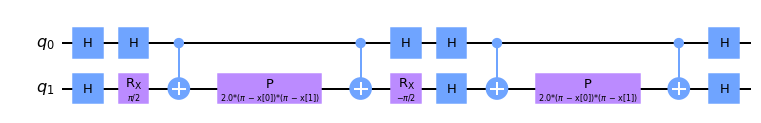


Quantum kernel matrices:



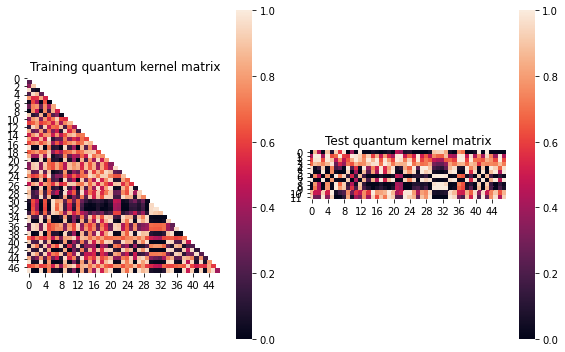


SVM with quantum kernel trained!


Test set performance:


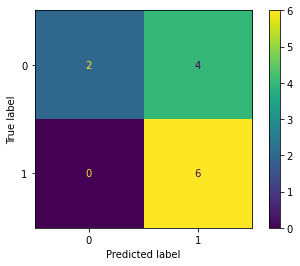

              precision    recall  f1-score   support

           0       1.00      0.33      0.50         6
           1       0.60      1.00      0.75         6

    accuracy                           0.67        12
   macro avg       0.80      0.67      0.62        12
weighted avg       0.80      0.67      0.62        12


metric 1: 0.04715491323229459
metric(s) 2: (00, 10, 11) = (0.581862243568751, 0.50887627861619, 0.530200140128218)
metric 3: -0.0


----> Kernel construction duration: 00:02:01


Combination 89/468
(Current range: 43/46)
			 reps : 1
			 paulis : ['YX', 'XY']
			 entanglement : linear

Feature map:


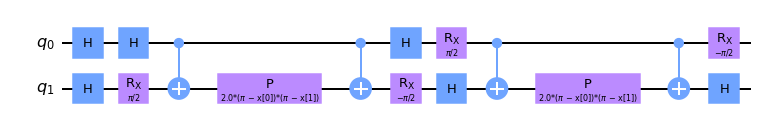


Quantum kernel matrices:



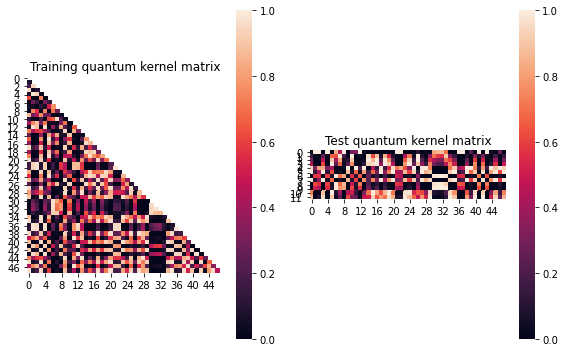


SVM with quantum kernel trained!


Test set performance:


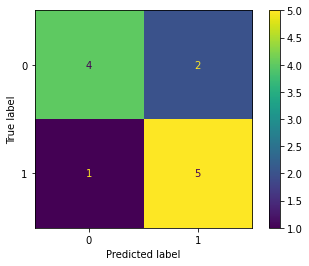

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:02:18


Combination 90/468
(Current range: 44/46)
			 reps : 1
			 paulis : ['YX', 'XZ']
			 entanglement : linear

Feature map:


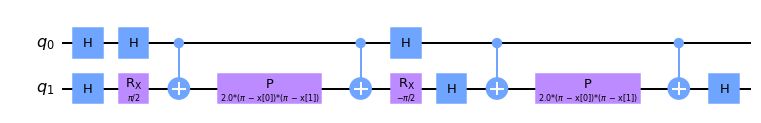


Quantum kernel matrices:



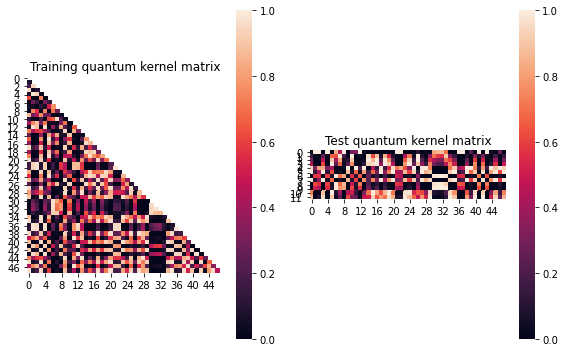


SVM with quantum kernel trained!


Test set performance:


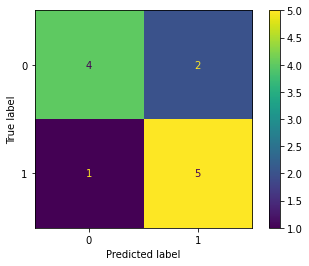

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:02:12


Combination 91/468
(Current range: 45/46)
			 reps : 1
			 paulis : ['YX', 'YX']
			 entanglement : linear

Feature map:


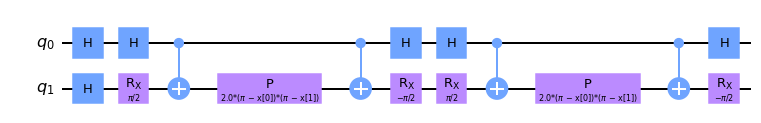


Quantum kernel matrices:



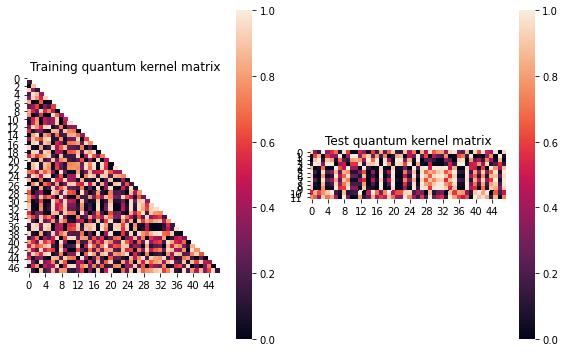


SVM with quantum kernel trained!


Test set performance:


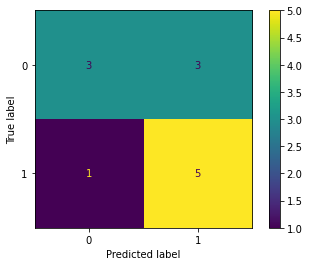

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:01:06


Combination 92/468
(Current range: 46/46)
			 reps : 1
			 paulis : ['YX', 'YY']
			 entanglement : linear

Feature map:


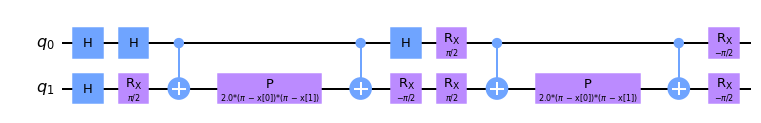


Quantum kernel matrices:



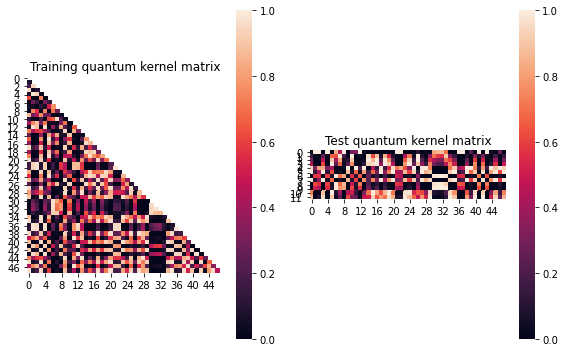


SVM with quantum kernel trained!


Test set performance:


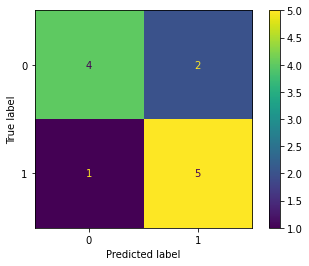

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:56


In [14]:
j=1
results.append(run_kernel_evaluation(X, X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 93/468
(Current range: 1/46)
			 reps : 1
			 paulis : ['YX', 'YZ']
			 entanglement : linear

Feature map:


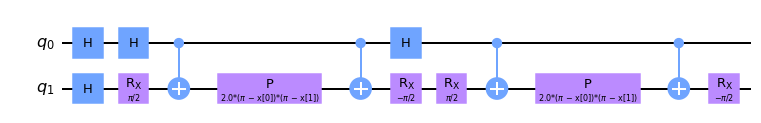


Quantum kernel matrices:



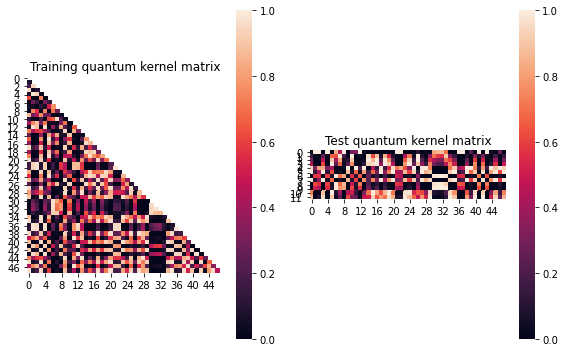


SVM with quantum kernel trained!


Test set performance:


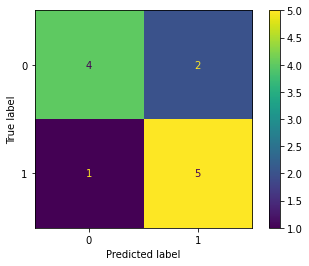

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:02:04


Combination 94/468
(Current range: 2/46)
			 reps : 1
			 paulis : ['YX', 'ZX']
			 entanglement : linear

Feature map:


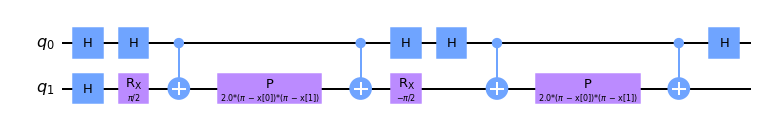


Quantum kernel matrices:



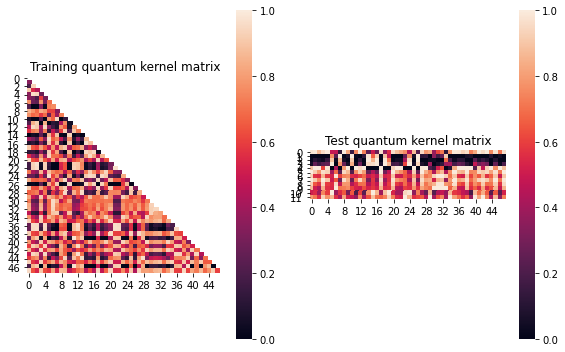


SVM with quantum kernel trained!


Test set performance:


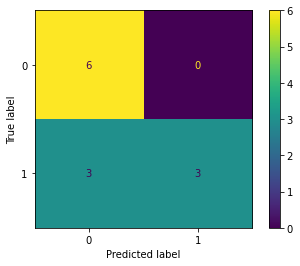

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.007826268788840407
metric(s) 2: (00, 10, 11) = (0.5209498107440138, 0.5720519571948796, 0.6075015660680645)
metric 3: -0.0


----> Kernel construction duration: 00:01:56


Combination 95/468
(Current range: 3/46)
			 reps : 1
			 paulis : ['YX', 'ZY']
			 entanglement : linear

Feature map:


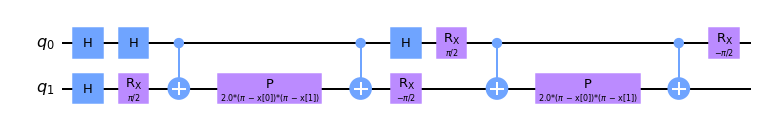


Quantum kernel matrices:



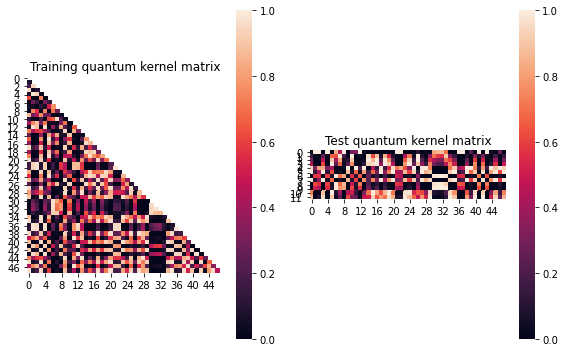


SVM with quantum kernel trained!


Test set performance:


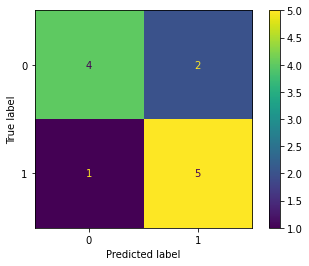

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:02:23


Combination 96/468
(Current range: 4/46)
			 reps : 1
			 paulis : ['YX', 'ZZ']
			 entanglement : linear

Feature map:


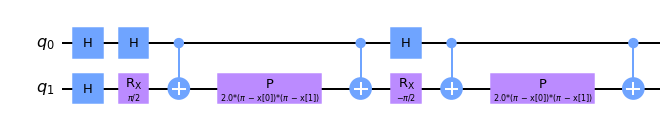


Quantum kernel matrices:



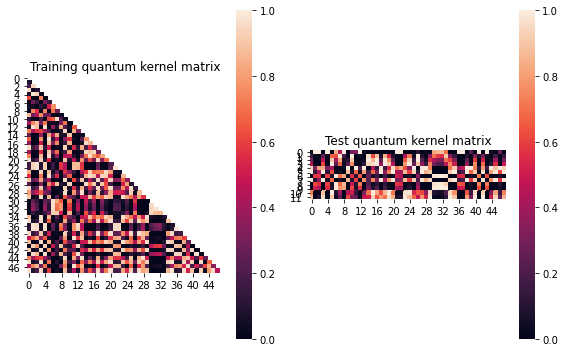


SVM with quantum kernel trained!


Test set performance:


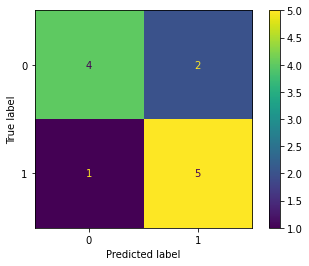

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:02:15


Combination 97/468
(Current range: 5/46)
			 reps : 1
			 paulis : ['YY', 'X']
			 entanglement : linear

Feature map:


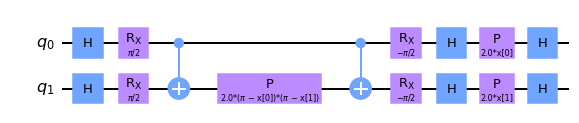


Quantum kernel matrices:



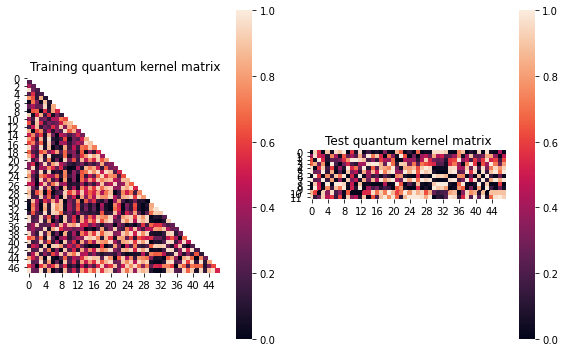


SVM with quantum kernel trained!


Test set performance:


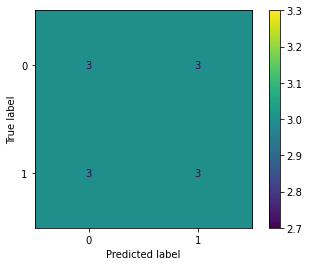

              precision    recall  f1-score   support

           0       0.50      0.50      0.50         6
           1       0.50      0.50      0.50         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.50        12
weighted avg       0.50      0.50      0.50        12


metric 1: 0.026944681287061345
metric(s) 2: (00, 10, 11) = (0.46955476965924053, 0.46779795588083534, 0.5199305046765529)
metric 3: 0.0


----> Kernel construction duration: 00:02:11


Combination 98/468
(Current range: 6/46)
			 reps : 1
			 paulis : ['YY', 'Y']
			 entanglement : linear

Feature map:


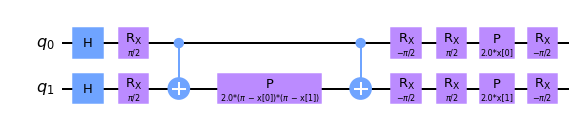


Quantum kernel matrices:



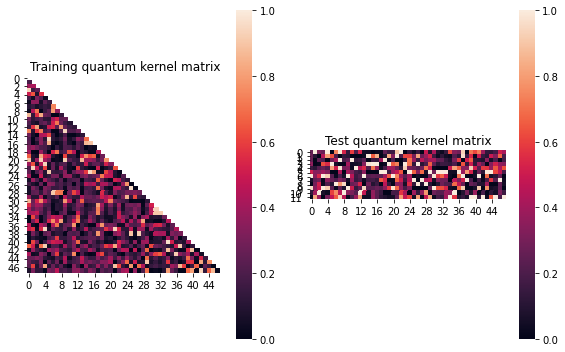


SVM with quantum kernel trained!


Test set performance:


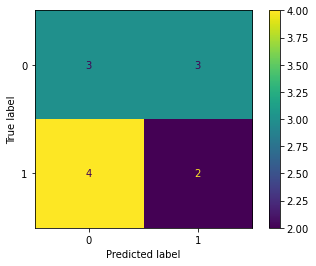

              precision    recall  f1-score   support

           0       0.43      0.50      0.46         6
           1       0.40      0.33      0.36         6

    accuracy                           0.42        12
   macro avg       0.41      0.42      0.41        12
weighted avg       0.41      0.42      0.41        12


metric 1: 0.05733851085899522
metric(s) 2: (00, 10, 11) = (0.31281939221849137, 0.2511093745159616, 0.3040763785314222)
metric 3: 3.3102918868991154e-287


----> Kernel construction duration: 00:01:37


Combination 99/468
(Current range: 7/46)
			 reps : 1
			 paulis : ['YY', 'Z']
			 entanglement : linear

Feature map:


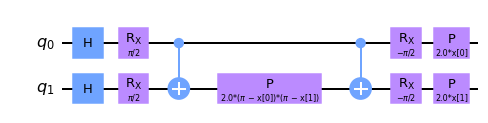


Quantum kernel matrices:



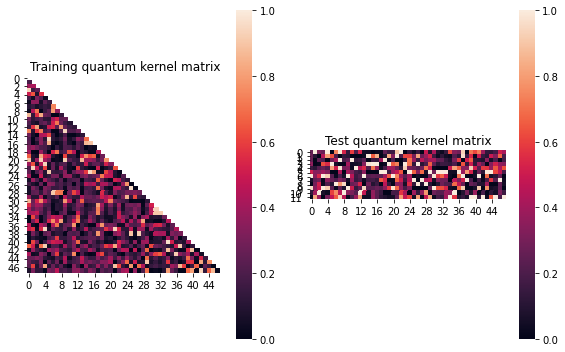


SVM with quantum kernel trained!


Test set performance:


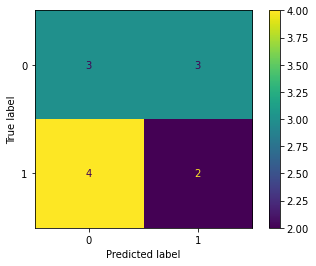

              precision    recall  f1-score   support

           0       0.43      0.50      0.46         6
           1       0.40      0.33      0.36         6

    accuracy                           0.42        12
   macro avg       0.41      0.42      0.41        12
weighted avg       0.41      0.42      0.41        12


metric 1: 0.05733851085899522
metric(s) 2: (00, 10, 11) = (0.31281939221849137, 0.2511093745159616, 0.3040763785314222)
metric 3: 3.3102918868991154e-287


----> Kernel construction duration: 00:01:57


Combination 100/468
(Current range: 8/46)
			 reps : 1
			 paulis : ['YY', 'XX']
			 entanglement : linear

Feature map:


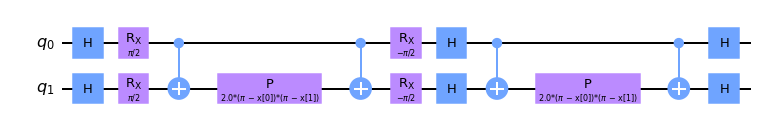


Quantum kernel matrices:



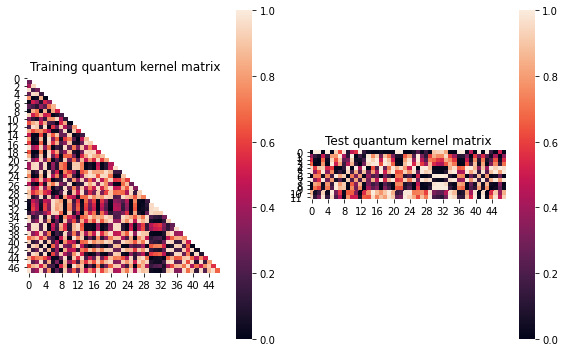


SVM with quantum kernel trained!


Test set performance:


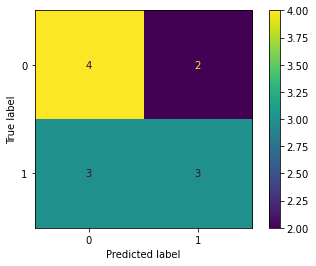

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:02:04


Combination 101/468
(Current range: 9/46)
			 reps : 1
			 paulis : ['YY', 'XY']
			 entanglement : linear

Feature map:


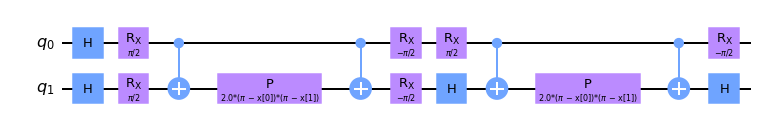


Quantum kernel matrices:



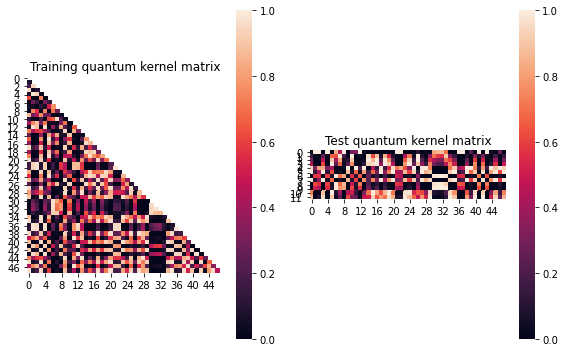


SVM with quantum kernel trained!


Test set performance:


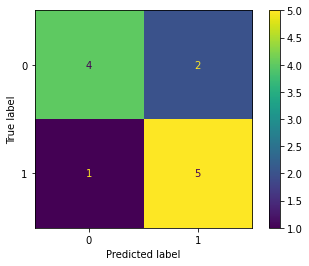

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:40


Combination 102/468
(Current range: 10/46)
			 reps : 1
			 paulis : ['YY', 'XZ']
			 entanglement : linear

Feature map:


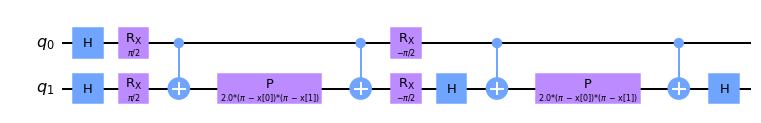


Quantum kernel matrices:



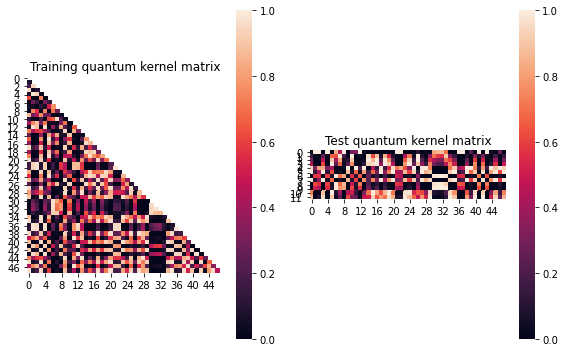


SVM with quantum kernel trained!


Test set performance:


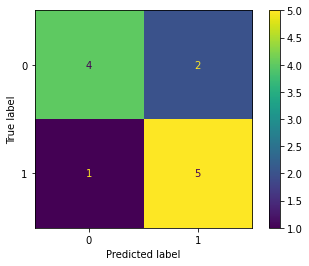

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:58


Combination 103/468
(Current range: 11/46)
			 reps : 1
			 paulis : ['YY', 'YX']
			 entanglement : linear

Feature map:


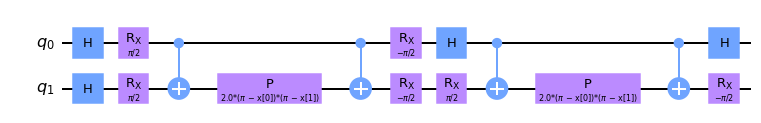


Quantum kernel matrices:



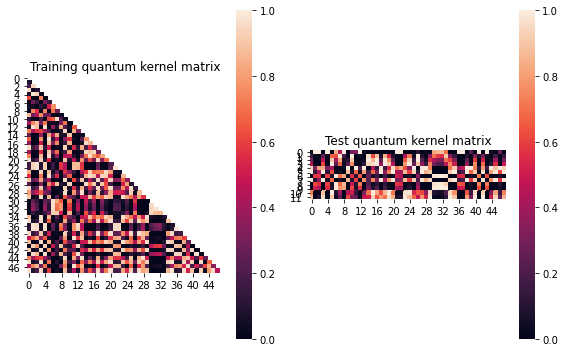


SVM with quantum kernel trained!


Test set performance:


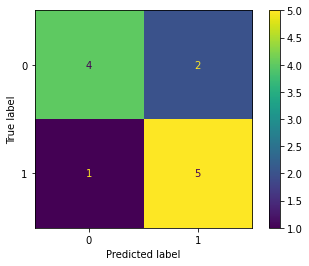

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:50


Combination 104/468
(Current range: 12/46)
			 reps : 1
			 paulis : ['YY', 'YY']
			 entanglement : linear

Feature map:


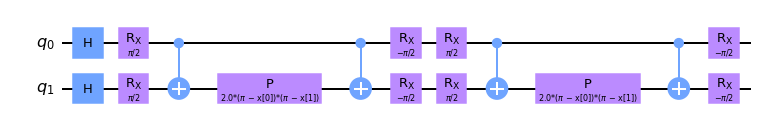


Quantum kernel matrices:



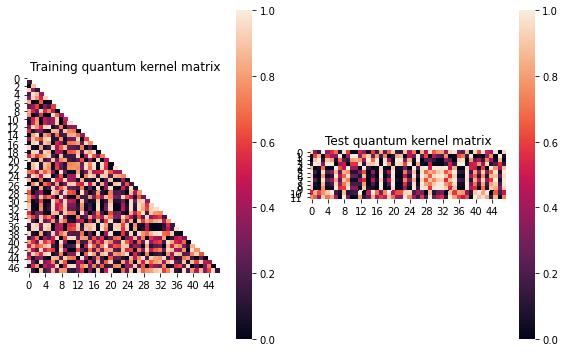


SVM with quantum kernel trained!


Test set performance:


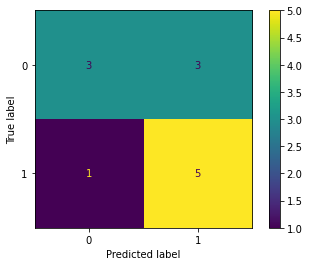

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:01:10


Combination 105/468
(Current range: 13/46)
			 reps : 1
			 paulis : ['YY', 'YZ']
			 entanglement : linear

Feature map:


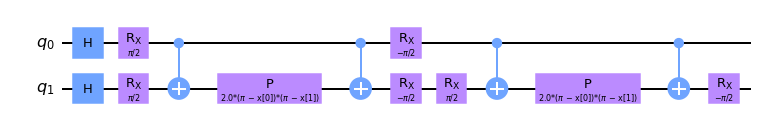


Quantum kernel matrices:



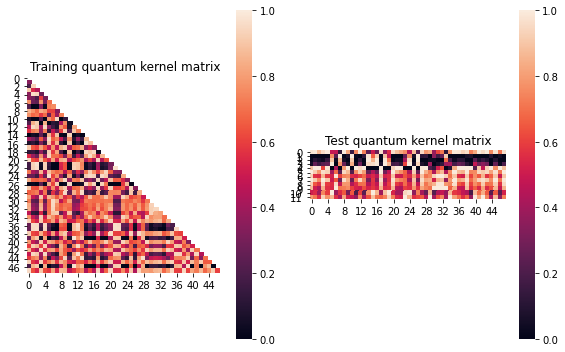


SVM with quantum kernel trained!


Test set performance:


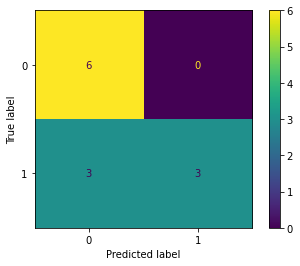

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.007826268788840407
metric(s) 2: (00, 10, 11) = (0.5209498107440138, 0.5720519571948796, 0.6075015660680645)
metric 3: -0.0


----> Kernel construction duration: 00:01:39


Combination 106/468
(Current range: 14/46)
			 reps : 1
			 paulis : ['YY', 'ZX']
			 entanglement : linear

Feature map:


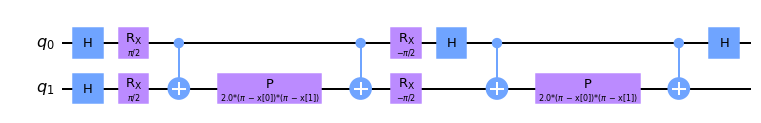


Quantum kernel matrices:



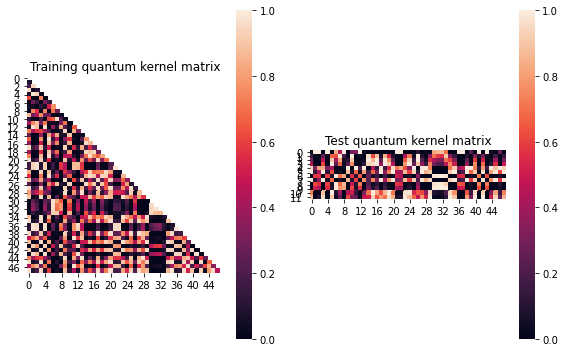


SVM with quantum kernel trained!


Test set performance:


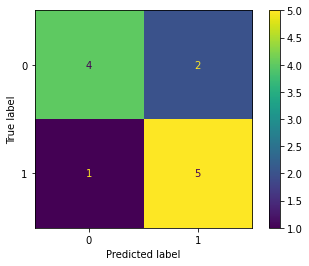

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:56


Combination 107/468
(Current range: 15/46)
			 reps : 1
			 paulis : ['YY', 'ZY']
			 entanglement : linear

Feature map:


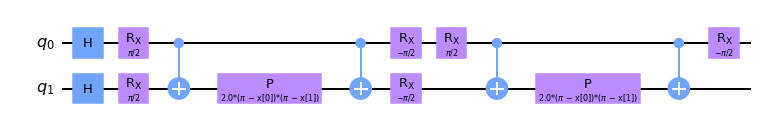


Quantum kernel matrices:



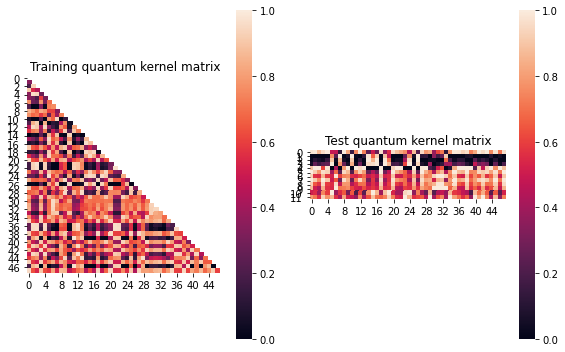


SVM with quantum kernel trained!


Test set performance:


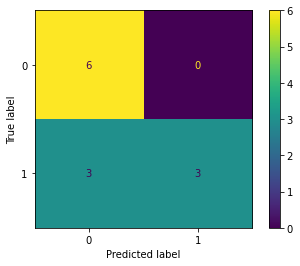

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.007826268788840407
metric(s) 2: (00, 10, 11) = (0.5209498107440138, 0.5720519571948796, 0.6075015660680645)
metric 3: -0.0


----> Kernel construction duration: 00:01:47


Combination 108/468
(Current range: 16/46)
			 reps : 1
			 paulis : ['YY', 'ZZ']
			 entanglement : linear

Feature map:


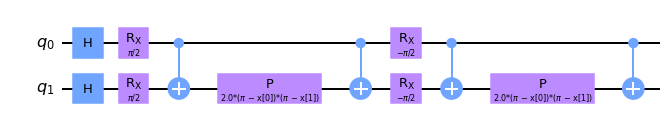


Quantum kernel matrices:



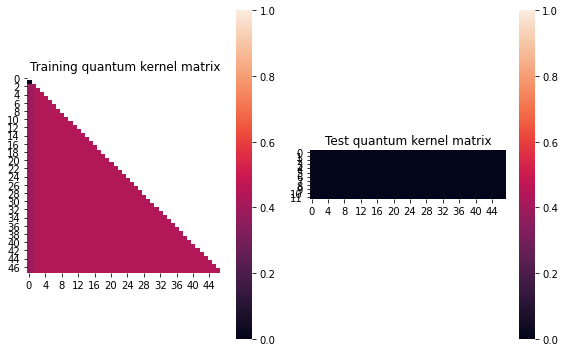


SVM with quantum kernel trained!


Test set performance:


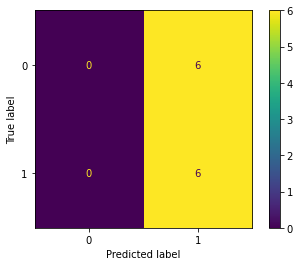

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:01:50


Combination 109/468
(Current range: 17/46)
			 reps : 1
			 paulis : ['YZ', 'X']
			 entanglement : linear

Feature map:


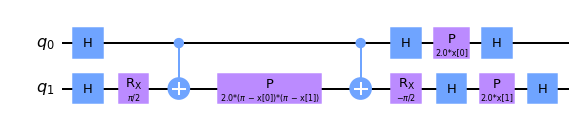


Quantum kernel matrices:



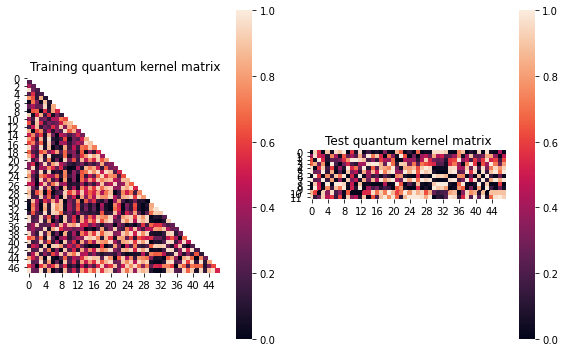


SVM with quantum kernel trained!


Test set performance:


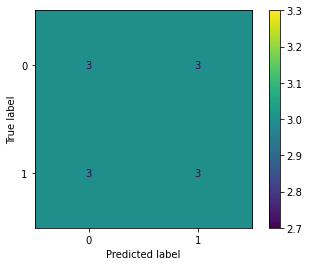

              precision    recall  f1-score   support

           0       0.50      0.50      0.50         6
           1       0.50      0.50      0.50         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.50        12
weighted avg       0.50      0.50      0.50        12


metric 1: 0.026944681287061345
metric(s) 2: (00, 10, 11) = (0.46955476965924053, 0.46779795588083534, 0.5199305046765529)
metric 3: 0.0


----> Kernel construction duration: 00:01:41


Combination 110/468
(Current range: 18/46)
			 reps : 1
			 paulis : ['YZ', 'Y']
			 entanglement : linear

Feature map:


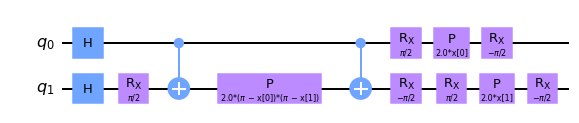


Quantum kernel matrices:



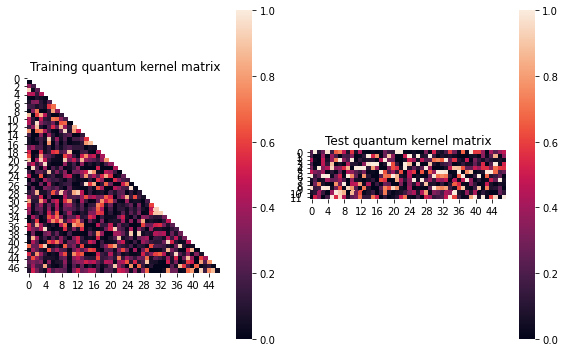


SVM with quantum kernel trained!


Test set performance:


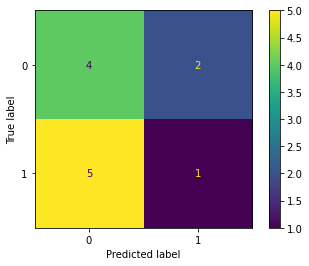

              precision    recall  f1-score   support

           0       0.44      0.67      0.53         6
           1       0.33      0.17      0.22         6

    accuracy                           0.42        12
   macro avg       0.39      0.42      0.38        12
weighted avg       0.39      0.42      0.38        12


metric 1: 0.0390705082869586
metric(s) 2: (00, 10, 11) = (0.2945628019077483, 0.24878343232750502, 0.28114507932117894)
metric 3: 1.352443975100649e-305


----> Kernel construction duration: 00:01:42


Combination 111/468
(Current range: 19/46)
			 reps : 1
			 paulis : ['YZ', 'Z']
			 entanglement : linear

Feature map:


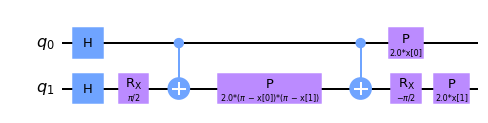


Quantum kernel matrices:



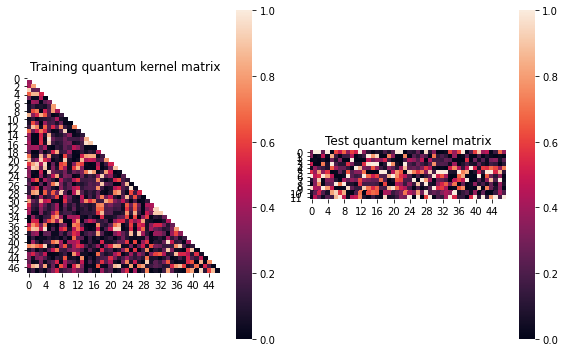


SVM with quantum kernel trained!


Test set performance:


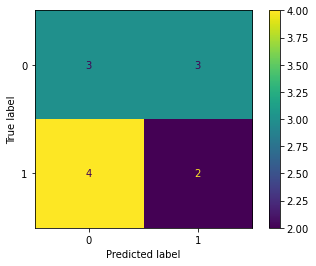

              precision    recall  f1-score   support

           0       0.43      0.50      0.46         6
           1       0.40      0.33      0.36         6

    accuracy                           0.42        12
   macro avg       0.41      0.42      0.41        12
weighted avg       0.41      0.42      0.41        12


metric 1: 0.07141979391570025
metric(s) 2: (00, 10, 11) = (0.3463735626795155, 0.26816835617205986, 0.33280273749600464)
metric 3: 6.070743915949832e-307


----> Kernel construction duration: 00:02:03


Combination 112/468
(Current range: 20/46)
			 reps : 1
			 paulis : ['YZ', 'XX']
			 entanglement : linear

Feature map:


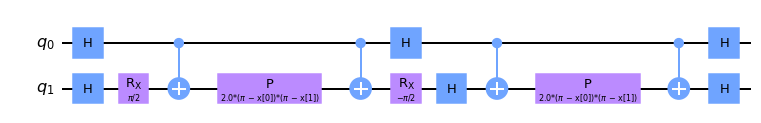


Quantum kernel matrices:



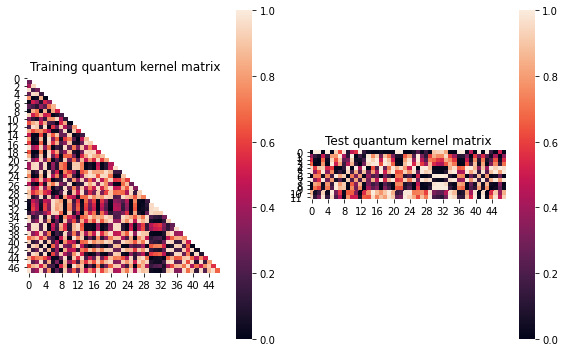


SVM with quantum kernel trained!


Test set performance:


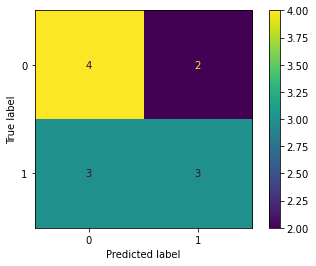

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:02:14


Combination 113/468
(Current range: 21/46)
			 reps : 1
			 paulis : ['YZ', 'XY']
			 entanglement : linear

Feature map:


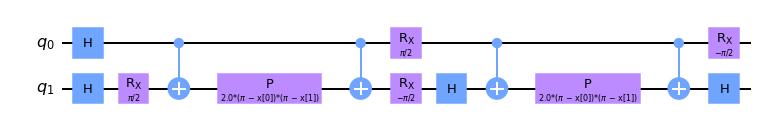


Quantum kernel matrices:



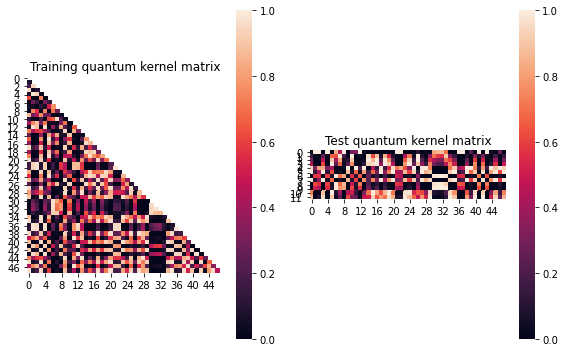


SVM with quantum kernel trained!


Test set performance:


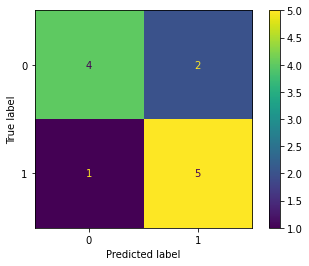

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:02:23


Combination 114/468
(Current range: 22/46)
			 reps : 1
			 paulis : ['YZ', 'XZ']
			 entanglement : linear

Feature map:


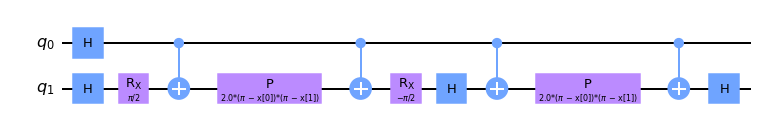


Quantum kernel matrices:



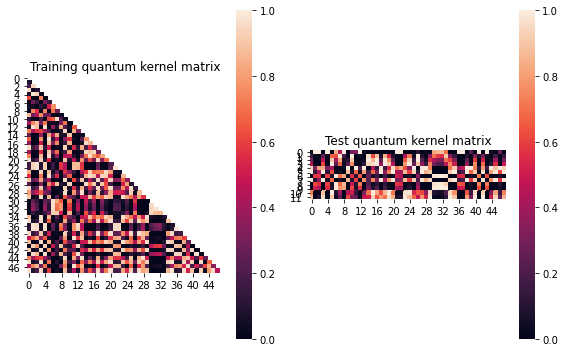


SVM with quantum kernel trained!


Test set performance:


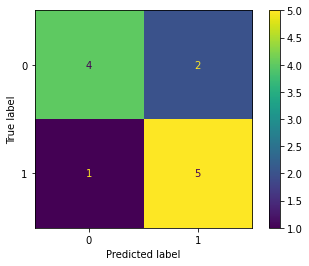

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:55


Combination 115/468
(Current range: 23/46)
			 reps : 1
			 paulis : ['YZ', 'YX']
			 entanglement : linear

Feature map:


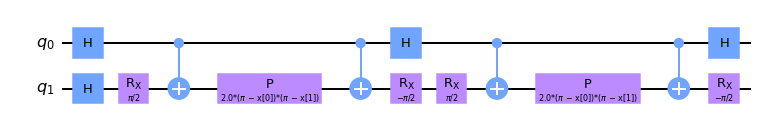


Quantum kernel matrices:



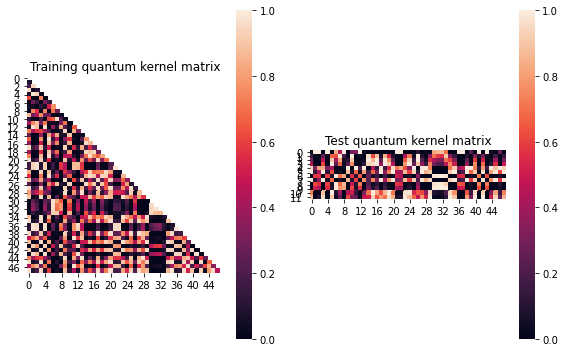


SVM with quantum kernel trained!


Test set performance:


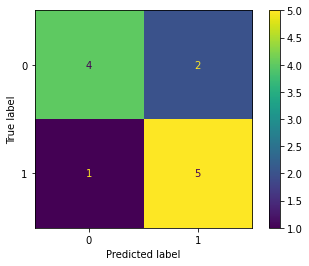

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:02:00


Combination 116/468
(Current range: 24/46)
			 reps : 1
			 paulis : ['YZ', 'YY']
			 entanglement : linear

Feature map:


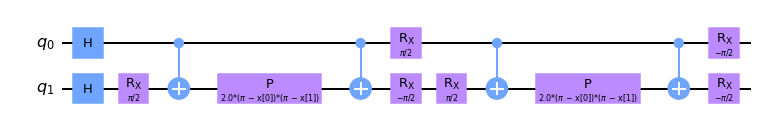


Quantum kernel matrices:



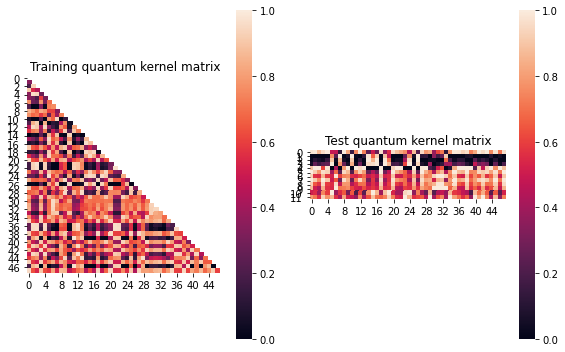


SVM with quantum kernel trained!


Test set performance:


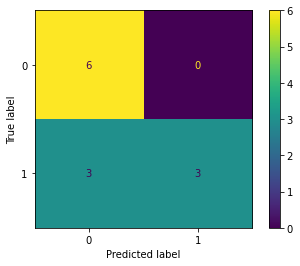

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.007826268788840407
metric(s) 2: (00, 10, 11) = (0.5209498107440138, 0.5720519571948796, 0.6075015660680645)
metric 3: -0.0


----> Kernel construction duration: 00:01:56


Combination 117/468
(Current range: 25/46)
			 reps : 1
			 paulis : ['YZ', 'YZ']
			 entanglement : linear

Feature map:


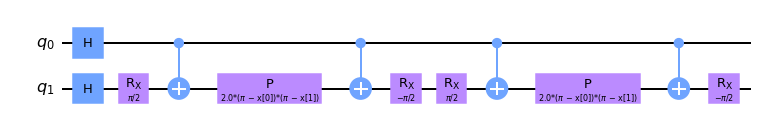


Quantum kernel matrices:



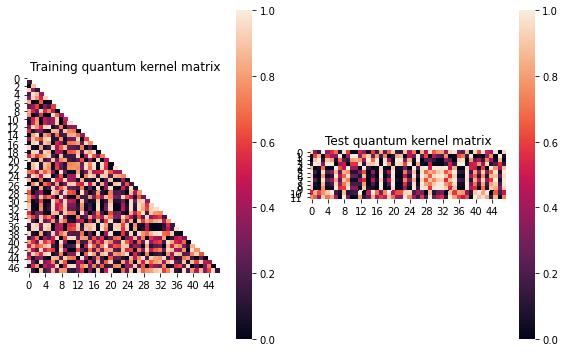


SVM with quantum kernel trained!


Test set performance:


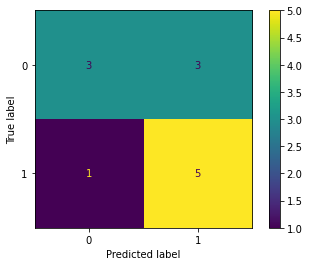

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:01:09


Combination 118/468
(Current range: 26/46)
			 reps : 1
			 paulis : ['YZ', 'ZX']
			 entanglement : linear

Feature map:


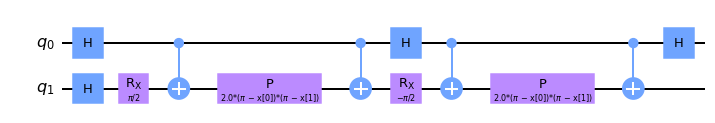


Quantum kernel matrices:



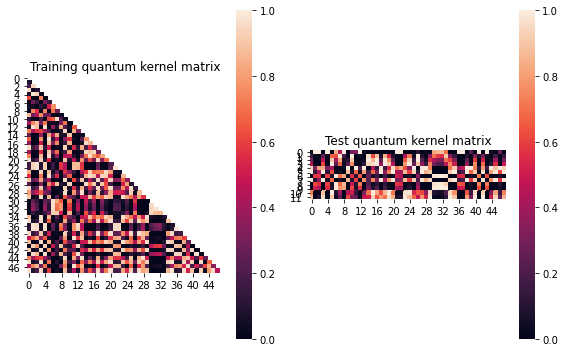


SVM with quantum kernel trained!


Test set performance:


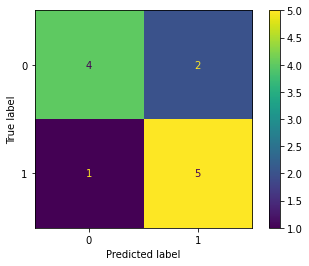

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:02:28


Combination 119/468
(Current range: 27/46)
			 reps : 1
			 paulis : ['YZ', 'ZY']
			 entanglement : linear

Feature map:


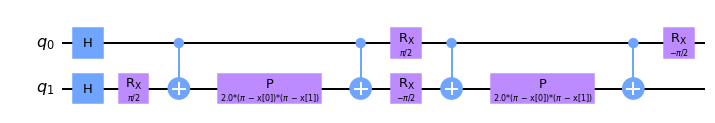


Quantum kernel matrices:



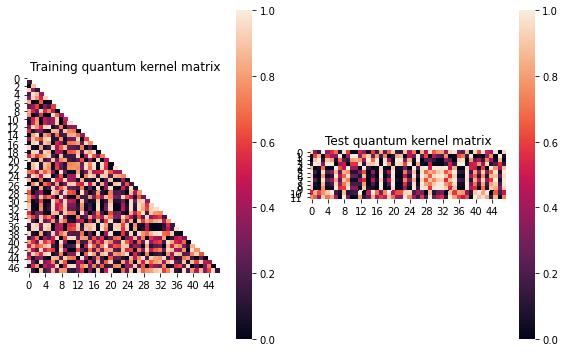


SVM with quantum kernel trained!


Test set performance:


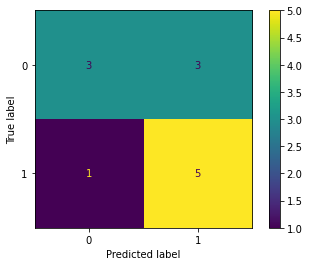

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:02:43


Combination 120/468
(Current range: 28/46)
			 reps : 1
			 paulis : ['YZ', 'ZZ']
			 entanglement : linear

Feature map:


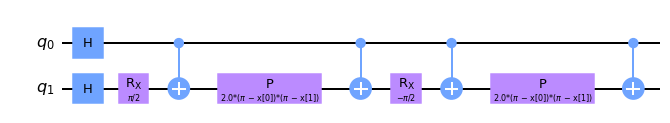


Quantum kernel matrices:



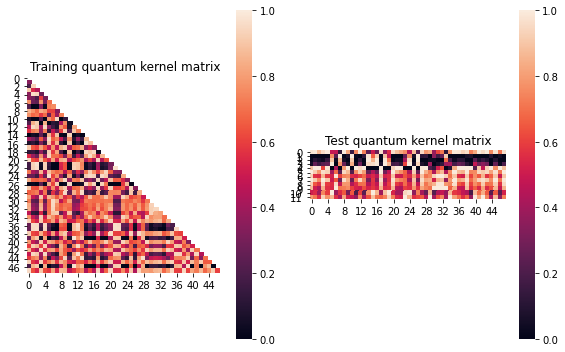


SVM with quantum kernel trained!


Test set performance:


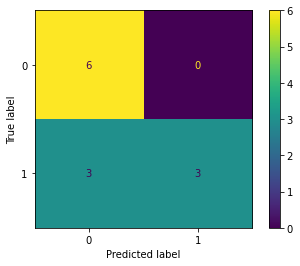

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.007826268788840407
metric(s) 2: (00, 10, 11) = (0.5209498107440138, 0.5720519571948796, 0.6075015660680645)
metric 3: -0.0


----> Kernel construction duration: 00:02:08


Combination 121/468
(Current range: 29/46)
			 reps : 1
			 paulis : ['ZX', 'X']
			 entanglement : linear

Feature map:


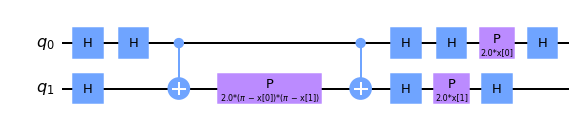


Quantum kernel matrices:



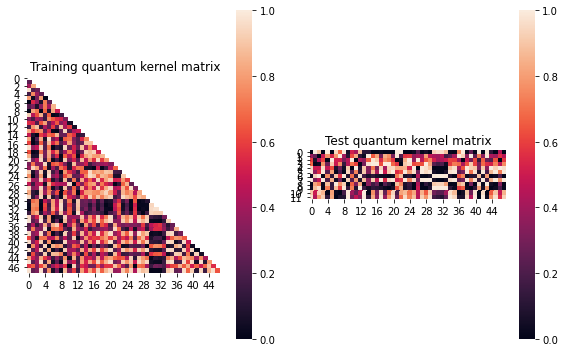


SVM with quantum kernel trained!


Test set performance:


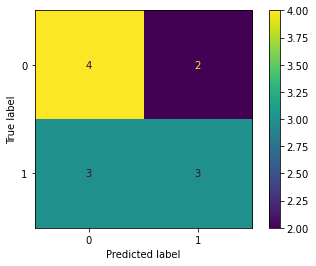

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.0036206862742787504
metric(s) 2: (00, 10, 11) = (0.4903716771831292, 0.49727185441767435, 0.511413404200777)
metric 3: -0.0


----> Kernel construction duration: 00:01:38


Combination 122/468
(Current range: 30/46)
			 reps : 1
			 paulis : ['ZX', 'Y']
			 entanglement : linear

Feature map:


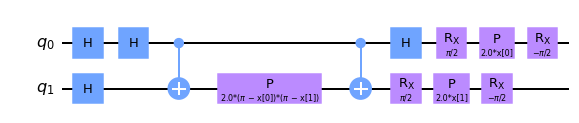


Quantum kernel matrices:



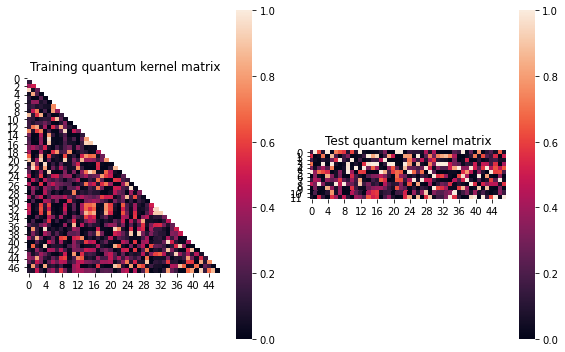


SVM with quantum kernel trained!


Test set performance:


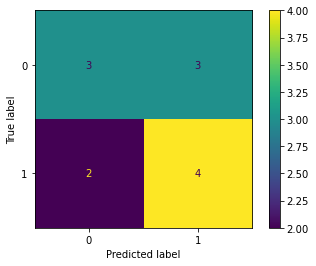

              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.57      0.67      0.62         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.04954143801771854
metric(s) 2: (00, 10, 11) = (0.2870810907367485, 0.242463449125773, 0.2969286835502346)
metric 3: 1.6268985822952814e-288


----> Kernel construction duration: 00:01:42


Combination 123/468
(Current range: 31/46)
			 reps : 1
			 paulis : ['ZX', 'Z']
			 entanglement : linear

Feature map:


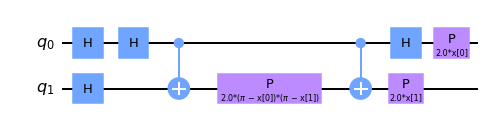


Quantum kernel matrices:



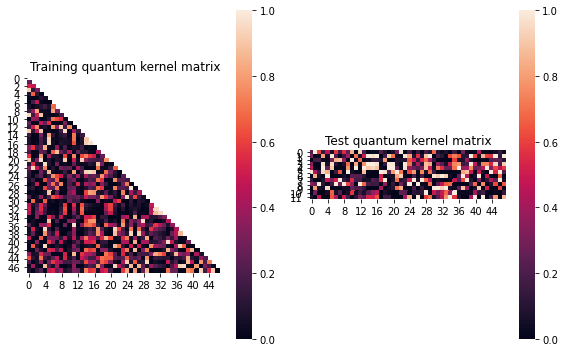


SVM with quantum kernel trained!


Test set performance:


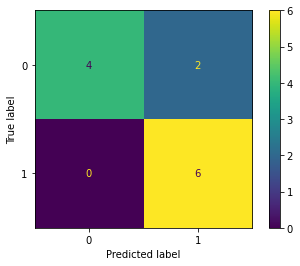

              precision    recall  f1-score   support

           0       1.00      0.67      0.80         6
           1       0.75      1.00      0.86         6

    accuracy                           0.83        12
   macro avg       0.88      0.83      0.83        12
weighted avg       0.88      0.83      0.83        12


metric 1: 0.05745255853628786
metric(s) 2: (00, 10, 11) = (0.2874164225628365, 0.24188881957412414, 0.3112663336579875)
metric 3: -5.953886420656999e-293


----> Kernel construction duration: 00:01:45


Combination 124/468
(Current range: 32/46)
			 reps : 1
			 paulis : ['ZX', 'XX']
			 entanglement : linear

Feature map:


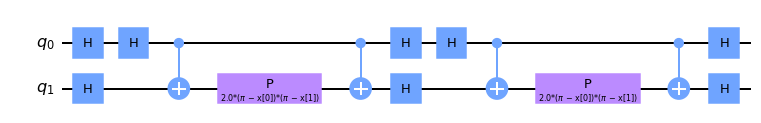


Quantum kernel matrices:



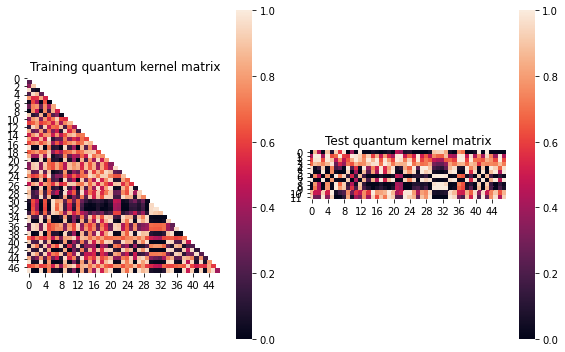


SVM with quantum kernel trained!


Test set performance:


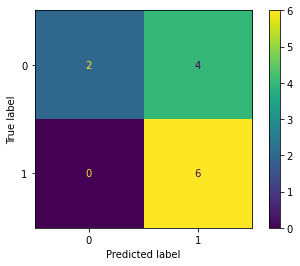

              precision    recall  f1-score   support

           0       1.00      0.33      0.50         6
           1       0.60      1.00      0.75         6

    accuracy                           0.67        12
   macro avg       0.80      0.67      0.62        12
weighted avg       0.80      0.67      0.62        12


metric 1: 0.04715491323229459
metric(s) 2: (00, 10, 11) = (0.581862243568751, 0.50887627861619, 0.530200140128218)
metric 3: -0.0


----> Kernel construction duration: 00:02:05


Combination 125/468
(Current range: 33/46)
			 reps : 1
			 paulis : ['ZX', 'XY']
			 entanglement : linear

Feature map:


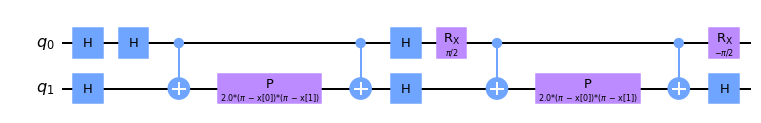


Quantum kernel matrices:



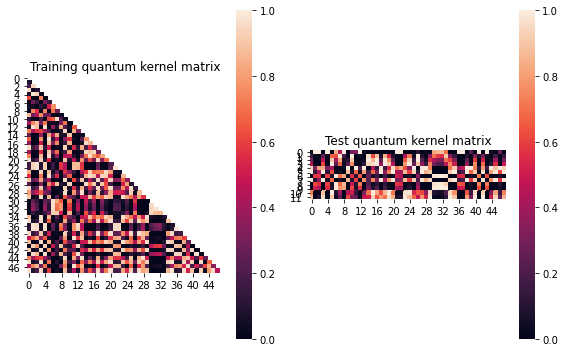


SVM with quantum kernel trained!


Test set performance:


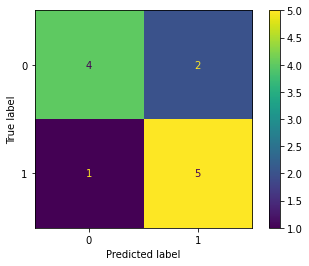

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:59


Combination 126/468
(Current range: 34/46)
			 reps : 1
			 paulis : ['ZX', 'XZ']
			 entanglement : linear

Feature map:


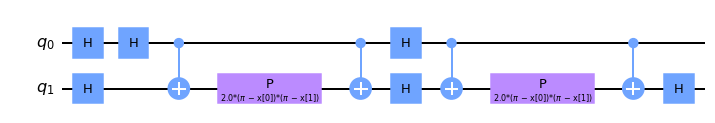


Quantum kernel matrices:



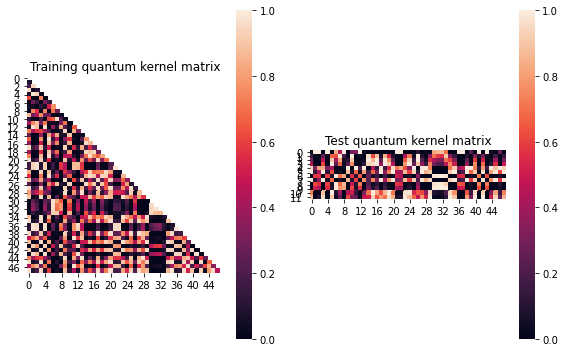


SVM with quantum kernel trained!


Test set performance:


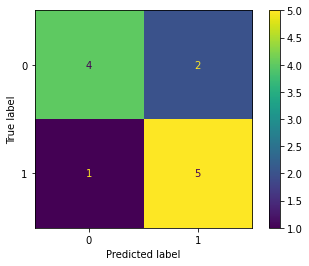

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:28


Combination 127/468
(Current range: 35/46)
			 reps : 1
			 paulis : ['ZX', 'YX']
			 entanglement : linear

Feature map:


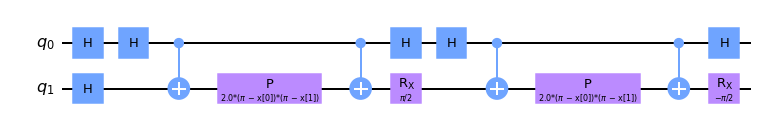


Quantum kernel matrices:



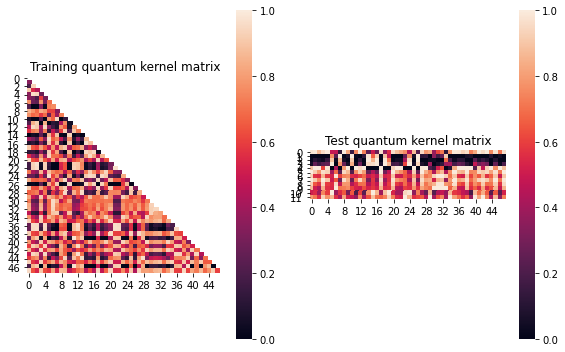


SVM with quantum kernel trained!


Test set performance:


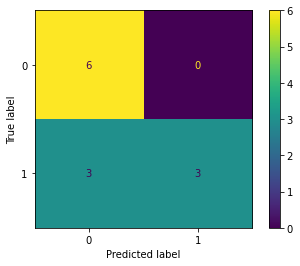

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.007826268788840407
metric(s) 2: (00, 10, 11) = (0.5209498107440138, 0.5720519571948796, 0.6075015660680645)
metric 3: -0.0


----> Kernel construction duration: 00:01:01


Combination 128/468
(Current range: 36/46)
			 reps : 1
			 paulis : ['ZX', 'YY']
			 entanglement : linear

Feature map:


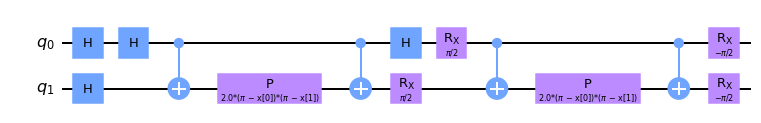


Quantum kernel matrices:



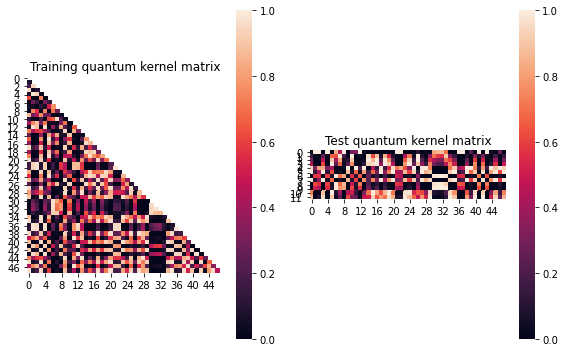


SVM with quantum kernel trained!


Test set performance:


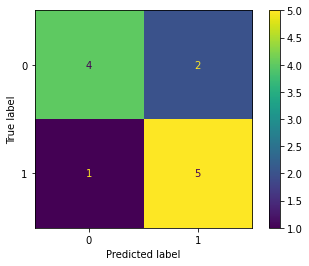

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:09


Combination 129/468
(Current range: 37/46)
			 reps : 1
			 paulis : ['ZX', 'YZ']
			 entanglement : linear

Feature map:


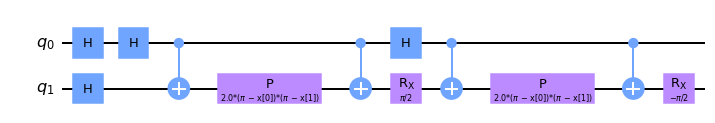


Quantum kernel matrices:



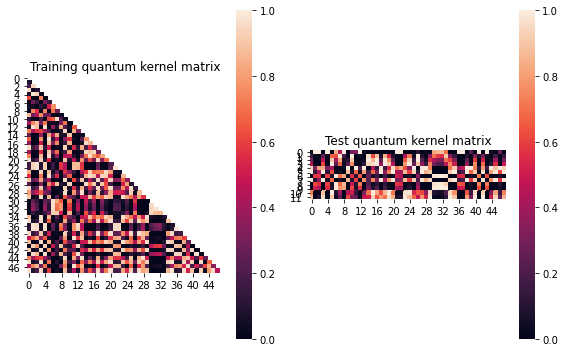


SVM with quantum kernel trained!


Test set performance:


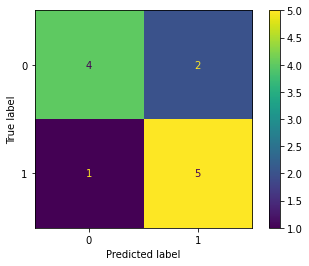

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:07


Combination 130/468
(Current range: 38/46)
			 reps : 1
			 paulis : ['ZX', 'ZX']
			 entanglement : linear

Feature map:


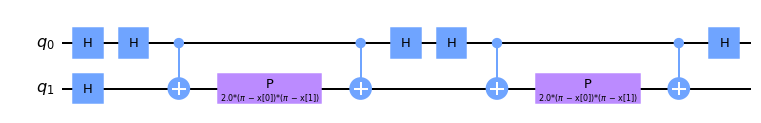


Quantum kernel matrices:



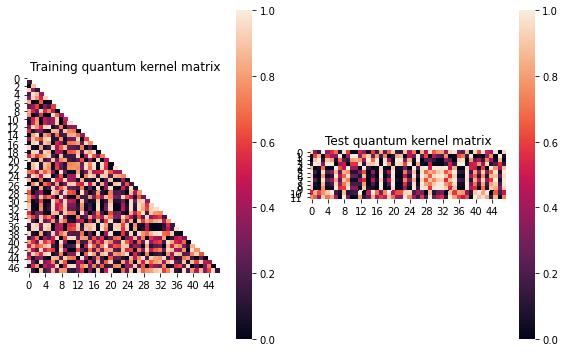


SVM with quantum kernel trained!


Test set performance:


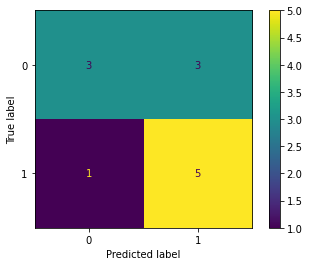

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:00:32


Combination 131/468
(Current range: 39/46)
			 reps : 1
			 paulis : ['ZX', 'ZY']
			 entanglement : linear

Feature map:


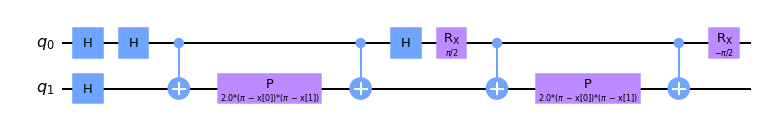


Quantum kernel matrices:



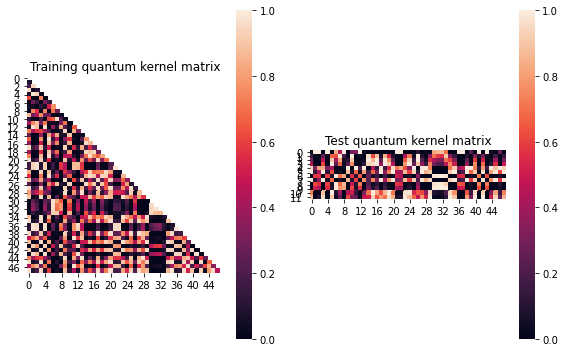


SVM with quantum kernel trained!


Test set performance:


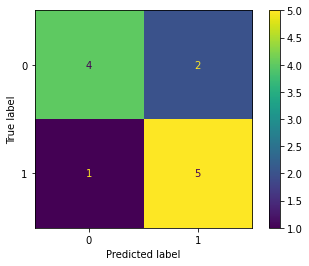

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:00:58


Combination 132/468
(Current range: 40/46)
			 reps : 1
			 paulis : ['ZX', 'ZZ']
			 entanglement : linear

Feature map:


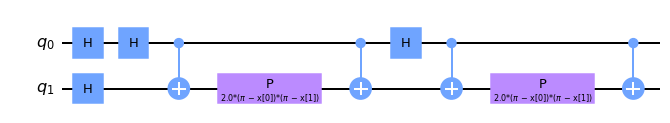


Quantum kernel matrices:



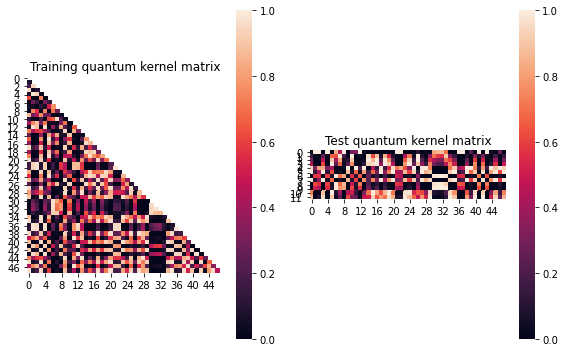


SVM with quantum kernel trained!


Test set performance:


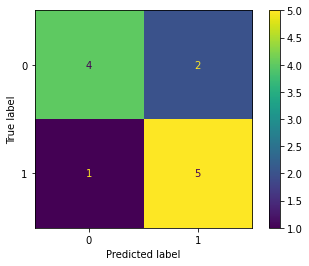

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:00:56


Combination 133/468
(Current range: 41/46)
			 reps : 1
			 paulis : ['ZY', 'X']
			 entanglement : linear

Feature map:


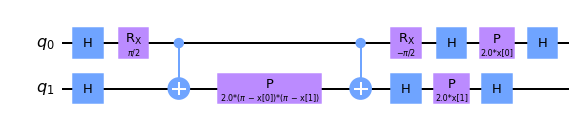


Quantum kernel matrices:



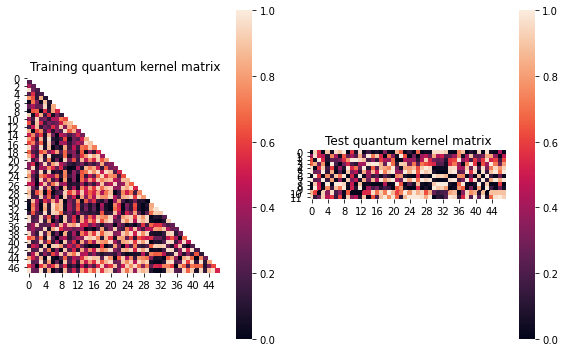


SVM with quantum kernel trained!


Test set performance:


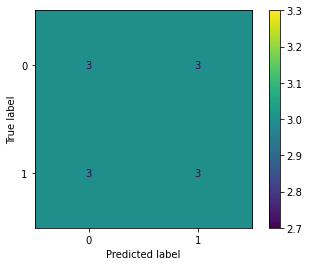

              precision    recall  f1-score   support

           0       0.50      0.50      0.50         6
           1       0.50      0.50      0.50         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.50        12
weighted avg       0.50      0.50      0.50        12


metric 1: 0.026944681287061345
metric(s) 2: (00, 10, 11) = (0.46955476965924053, 0.46779795588083534, 0.5199305046765529)
metric 3: 0.0


----> Kernel construction duration: 00:01:06


Combination 134/468
(Current range: 42/46)
			 reps : 1
			 paulis : ['ZY', 'Y']
			 entanglement : linear

Feature map:


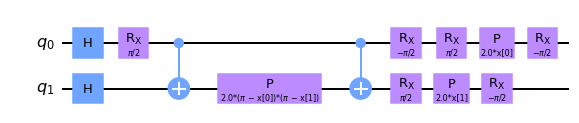


Quantum kernel matrices:



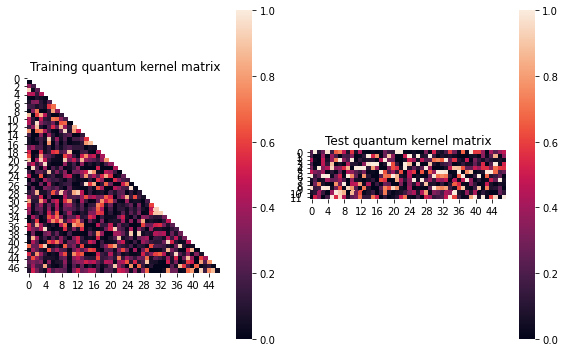


SVM with quantum kernel trained!


Test set performance:


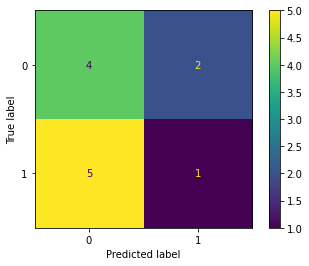

              precision    recall  f1-score   support

           0       0.44      0.67      0.53         6
           1       0.33      0.17      0.22         6

    accuracy                           0.42        12
   macro avg       0.39      0.42      0.38        12
weighted avg       0.39      0.42      0.38        12


metric 1: 0.0390705082869586
metric(s) 2: (00, 10, 11) = (0.2945628019077483, 0.24878343232750502, 0.28114507932117894)
metric 3: 1.352443975100649e-305


----> Kernel construction duration: 00:01:05


Combination 135/468
(Current range: 43/46)
			 reps : 1
			 paulis : ['ZY', 'Z']
			 entanglement : linear

Feature map:


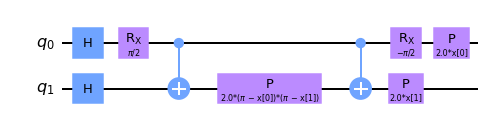


Quantum kernel matrices:



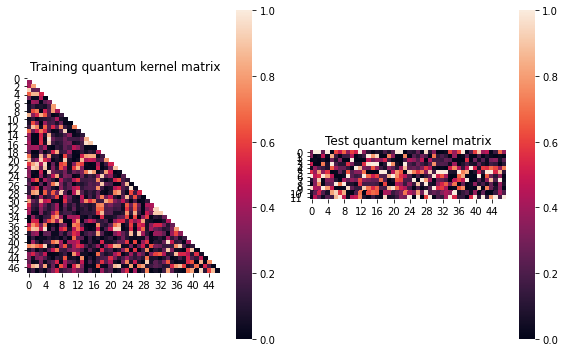


SVM with quantum kernel trained!


Test set performance:


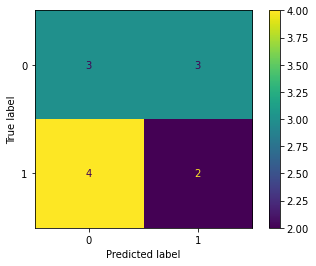

              precision    recall  f1-score   support

           0       0.43      0.50      0.46         6
           1       0.40      0.33      0.36         6

    accuracy                           0.42        12
   macro avg       0.41      0.42      0.41        12
weighted avg       0.41      0.42      0.41        12


metric 1: 0.07141979391570025
metric(s) 2: (00, 10, 11) = (0.3463735626795155, 0.26816835617205986, 0.33280273749600464)
metric 3: 6.070743915949832e-307


----> Kernel construction duration: 00:01:04


Combination 136/468
(Current range: 44/46)
			 reps : 1
			 paulis : ['ZY', 'XX']
			 entanglement : linear

Feature map:


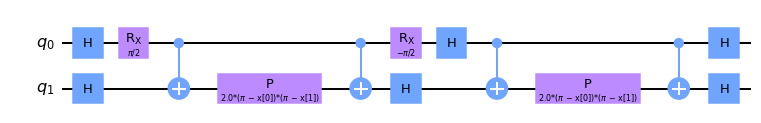


Quantum kernel matrices:



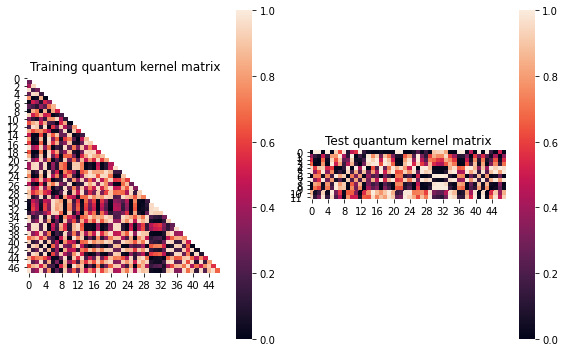


SVM with quantum kernel trained!


Test set performance:


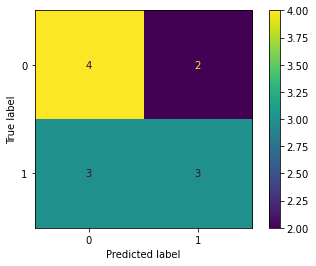

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:20


Combination 137/468
(Current range: 45/46)
			 reps : 1
			 paulis : ['ZY', 'XY']
			 entanglement : linear

Feature map:


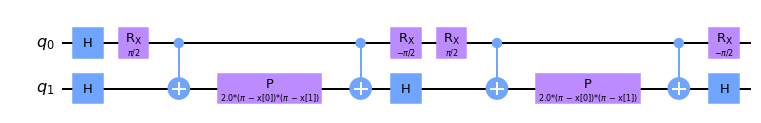


Quantum kernel matrices:



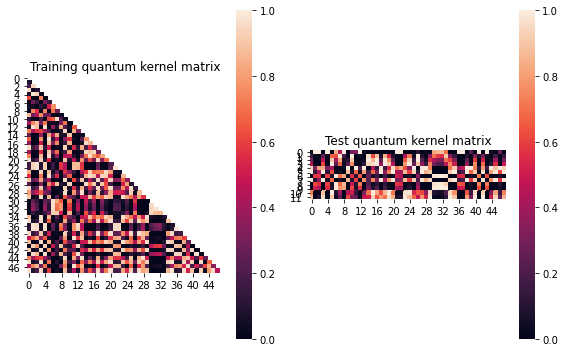


SVM with quantum kernel trained!


Test set performance:


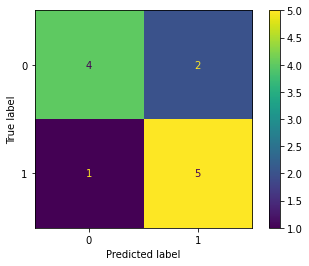

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:08


Combination 138/468
(Current range: 46/46)
			 reps : 1
			 paulis : ['ZY', 'XZ']
			 entanglement : linear

Feature map:


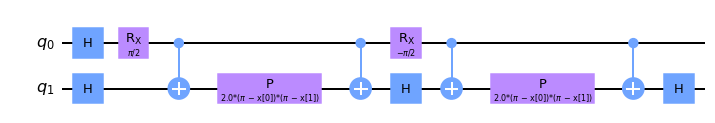


Quantum kernel matrices:



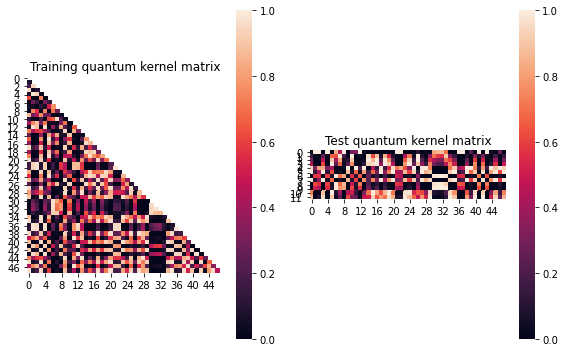


SVM with quantum kernel trained!


Test set performance:


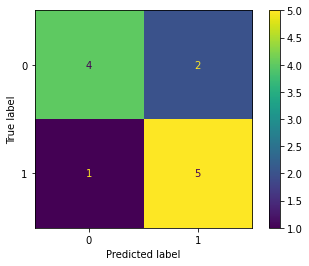

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:19


In [15]:
j=2
results.append(run_kernel_evaluation(X, X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 139/468
(Current range: 1/46)
			 reps : 1
			 paulis : ['ZY', 'YX']
			 entanglement : linear

Feature map:


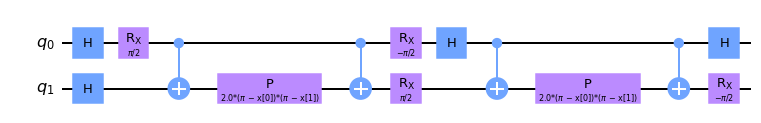


Quantum kernel matrices:



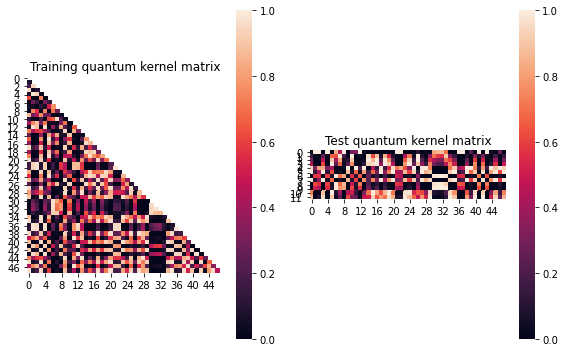


SVM with quantum kernel trained!


Test set performance:


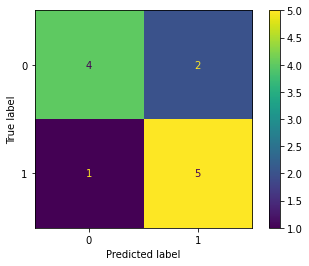

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:52


Combination 140/468
(Current range: 2/46)
			 reps : 1
			 paulis : ['ZY', 'YY']
			 entanglement : linear

Feature map:


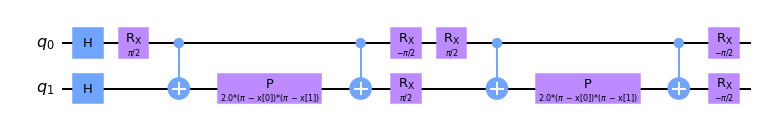


Quantum kernel matrices:



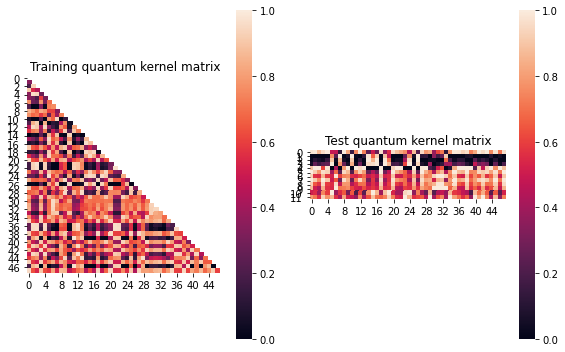


SVM with quantum kernel trained!


Test set performance:


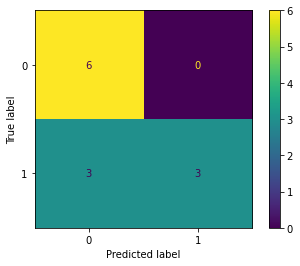

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.007826268788840407
metric(s) 2: (00, 10, 11) = (0.5209498107440138, 0.5720519571948796, 0.6075015660680645)
metric 3: -0.0


----> Kernel construction duration: 00:01:29


Combination 141/468
(Current range: 3/46)
			 reps : 1
			 paulis : ['ZY', 'YZ']
			 entanglement : linear

Feature map:


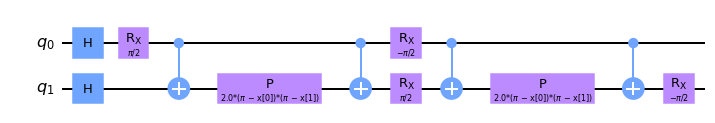


Quantum kernel matrices:



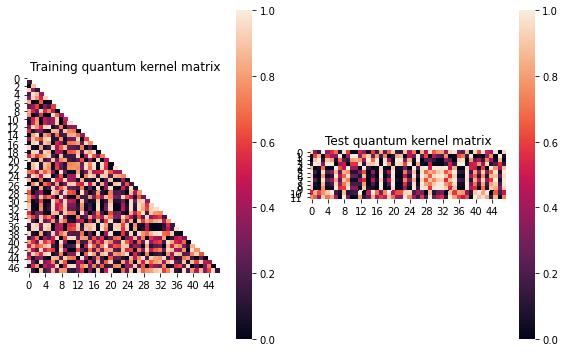


SVM with quantum kernel trained!


Test set performance:


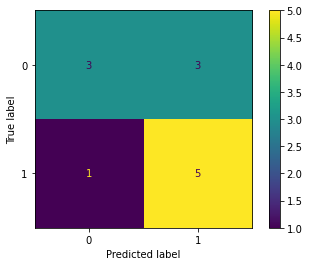

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:01:42


Combination 142/468
(Current range: 4/46)
			 reps : 1
			 paulis : ['ZY', 'ZX']
			 entanglement : linear

Feature map:


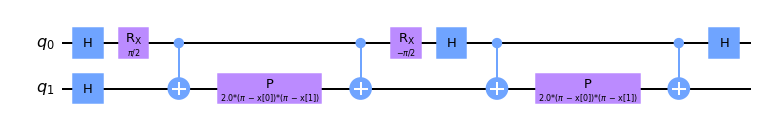


Quantum kernel matrices:



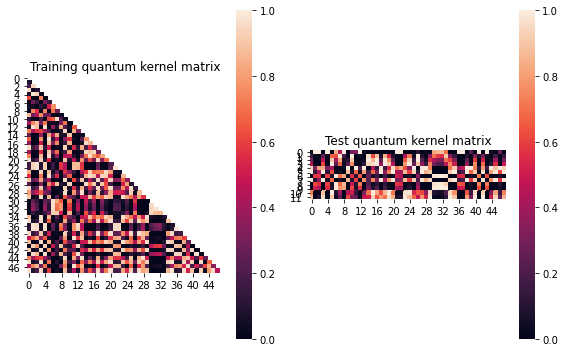


SVM with quantum kernel trained!


Test set performance:


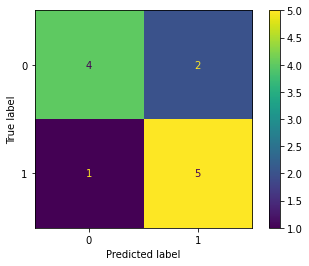

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:30


Combination 143/468
(Current range: 5/46)
			 reps : 1
			 paulis : ['ZY', 'ZY']
			 entanglement : linear

Feature map:


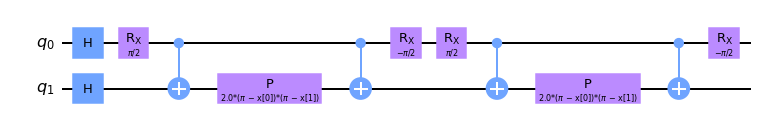


Quantum kernel matrices:



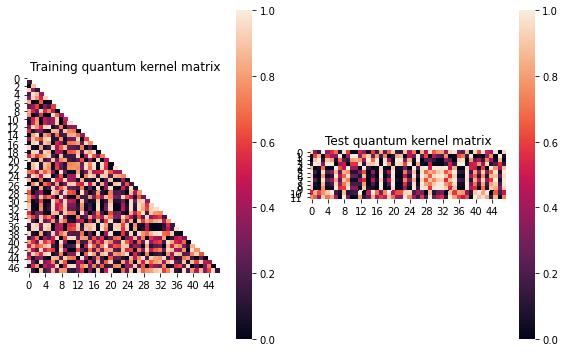


SVM with quantum kernel trained!


Test set performance:


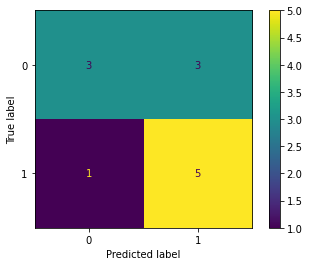

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:01:04


Combination 144/468
(Current range: 6/46)
			 reps : 1
			 paulis : ['ZY', 'ZZ']
			 entanglement : linear

Feature map:


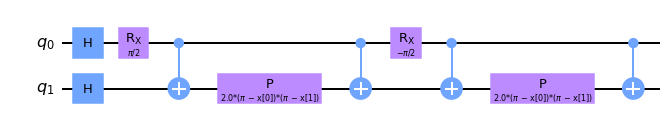


Quantum kernel matrices:



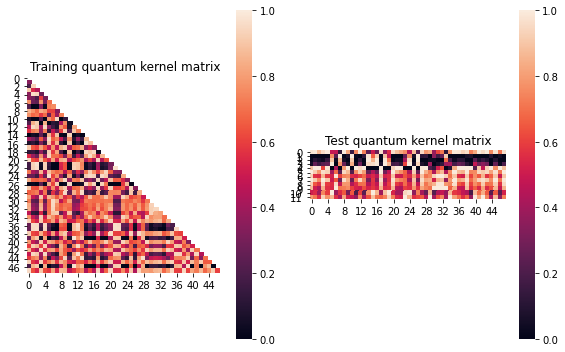


SVM with quantum kernel trained!


Test set performance:


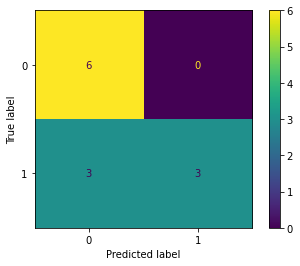

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.007826268788840407
metric(s) 2: (00, 10, 11) = (0.5209498107440138, 0.5720519571948796, 0.6075015660680645)
metric 3: -0.0


----> Kernel construction duration: 00:01:27


Combination 145/468
(Current range: 7/46)
			 reps : 1
			 paulis : ['ZZ', 'X']
			 entanglement : linear

Feature map:


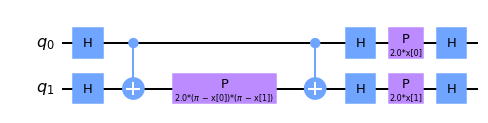


Quantum kernel matrices:



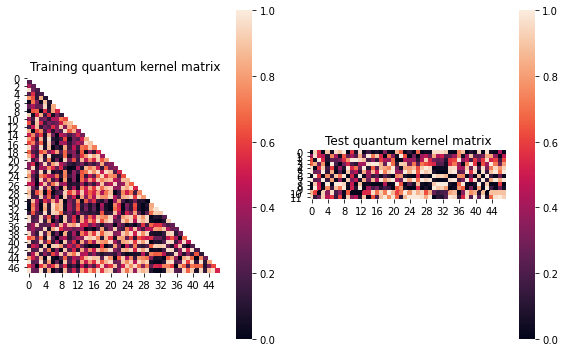


SVM with quantum kernel trained!


Test set performance:


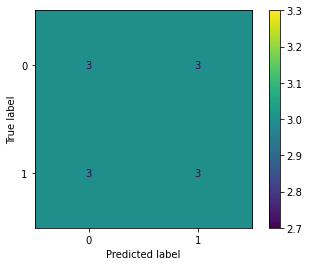

              precision    recall  f1-score   support

           0       0.50      0.50      0.50         6
           1       0.50      0.50      0.50         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.50        12
weighted avg       0.50      0.50      0.50        12


metric 1: 0.026944681287061345
metric(s) 2: (00, 10, 11) = (0.46955476965924053, 0.46779795588083534, 0.5199305046765529)
metric 3: 0.0


----> Kernel construction duration: 00:01:25


Combination 146/468
(Current range: 8/46)
			 reps : 1
			 paulis : ['ZZ', 'Y']
			 entanglement : linear

Feature map:


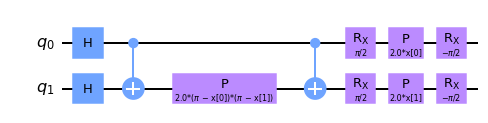


Quantum kernel matrices:



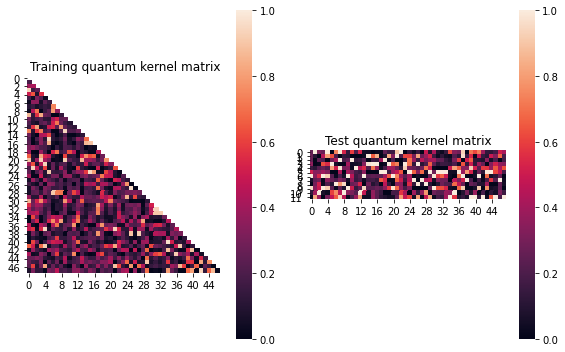


SVM with quantum kernel trained!


Test set performance:


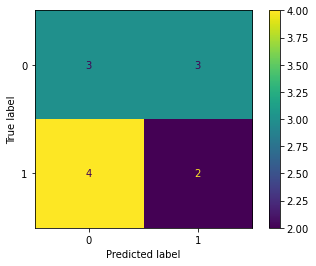

              precision    recall  f1-score   support

           0       0.43      0.50      0.46         6
           1       0.40      0.33      0.36         6

    accuracy                           0.42        12
   macro avg       0.41      0.42      0.41        12
weighted avg       0.41      0.42      0.41        12


metric 1: 0.05733851085899522
metric(s) 2: (00, 10, 11) = (0.31281939221849137, 0.2511093745159616, 0.3040763785314222)
metric 3: 3.3102918868991154e-287


----> Kernel construction duration: 00:01:08


Combination 147/468
(Current range: 9/46)
			 reps : 1
			 paulis : ['ZZ', 'Z']
			 entanglement : linear

Feature map:


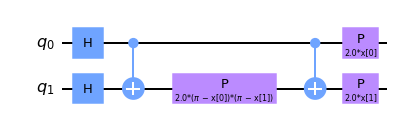


Quantum kernel matrices:



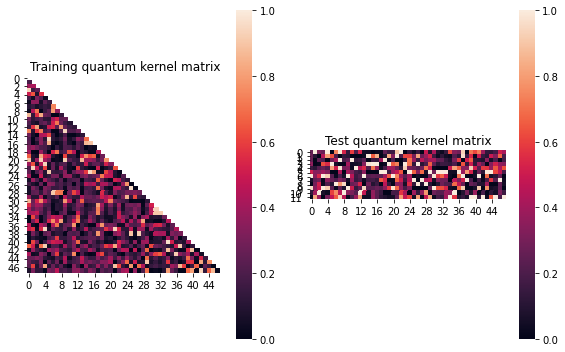


SVM with quantum kernel trained!


Test set performance:


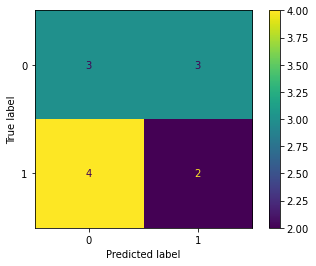

              precision    recall  f1-score   support

           0       0.43      0.50      0.46         6
           1       0.40      0.33      0.36         6

    accuracy                           0.42        12
   macro avg       0.41      0.42      0.41        12
weighted avg       0.41      0.42      0.41        12


metric 1: 0.05733851085899522
metric(s) 2: (00, 10, 11) = (0.31281939221849137, 0.2511093745159616, 0.3040763785314222)
metric 3: 3.3102918868991154e-287


----> Kernel construction duration: 00:01:05


Combination 148/468
(Current range: 10/46)
			 reps : 1
			 paulis : ['ZZ', 'XX']
			 entanglement : linear

Feature map:


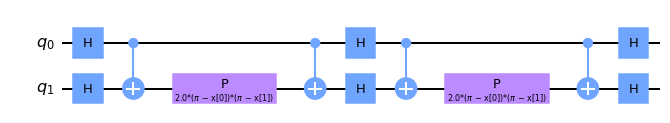


Quantum kernel matrices:



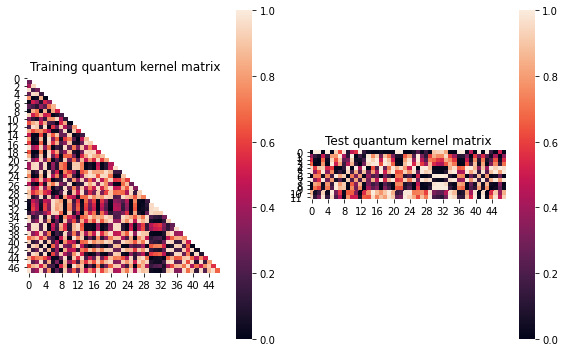


SVM with quantum kernel trained!


Test set performance:


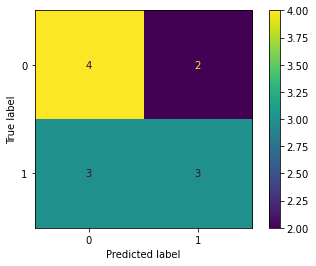

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:21


Combination 149/468
(Current range: 11/46)
			 reps : 1
			 paulis : ['ZZ', 'XY']
			 entanglement : linear

Feature map:


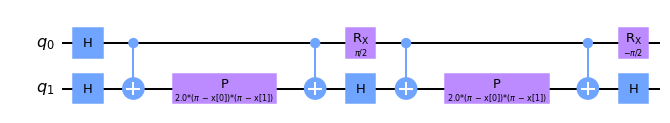


Quantum kernel matrices:



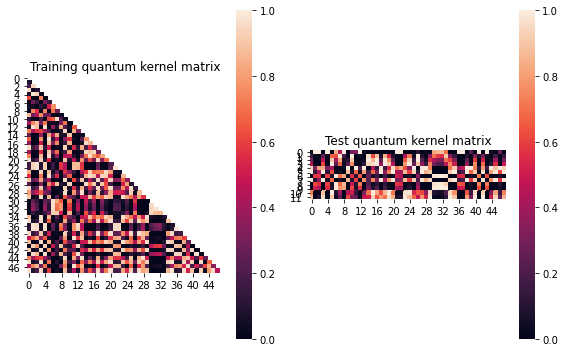


SVM with quantum kernel trained!


Test set performance:


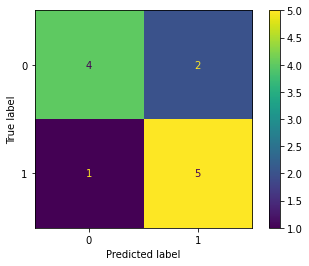

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:22


Combination 150/468
(Current range: 12/46)
			 reps : 1
			 paulis : ['ZZ', 'XZ']
			 entanglement : linear

Feature map:


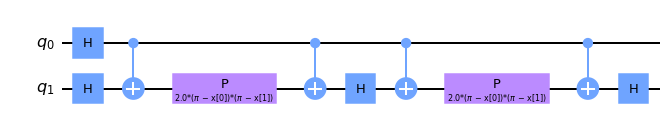


Quantum kernel matrices:



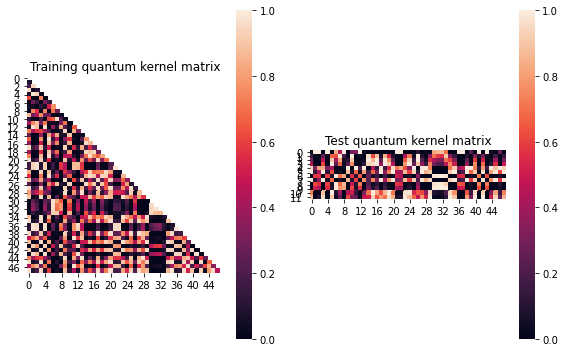


SVM with quantum kernel trained!


Test set performance:


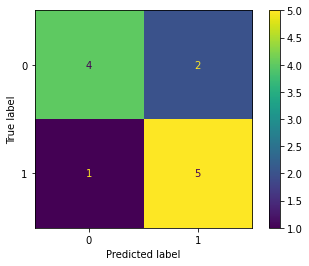

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:10


Combination 151/468
(Current range: 13/46)
			 reps : 1
			 paulis : ['ZZ', 'YX']
			 entanglement : linear

Feature map:


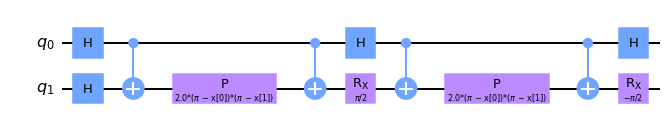


Quantum kernel matrices:



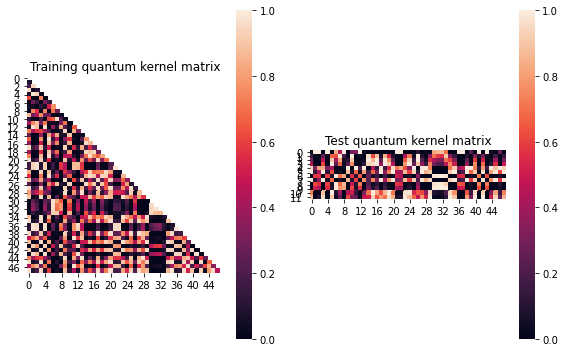


SVM with quantum kernel trained!


Test set performance:


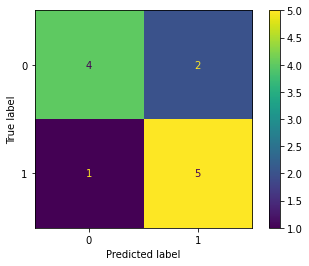

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:21


Combination 152/468
(Current range: 14/46)
			 reps : 1
			 paulis : ['ZZ', 'YY']
			 entanglement : linear

Feature map:


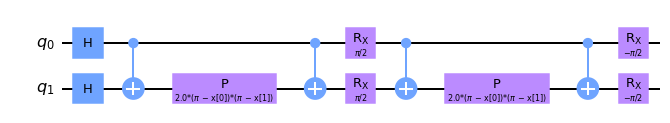


Quantum kernel matrices:



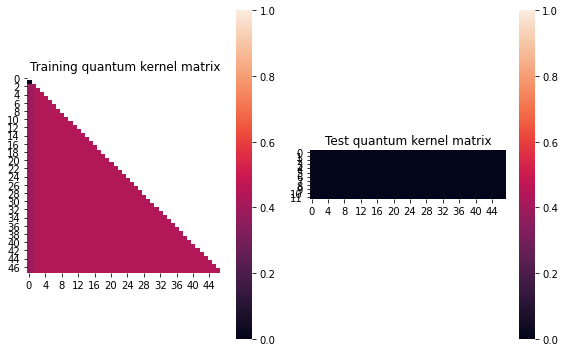


SVM with quantum kernel trained!


Test set performance:


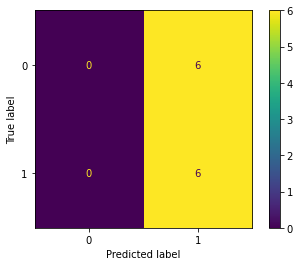

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:01:20


Combination 153/468
(Current range: 15/46)
			 reps : 1
			 paulis : ['ZZ', 'YZ']
			 entanglement : linear

Feature map:


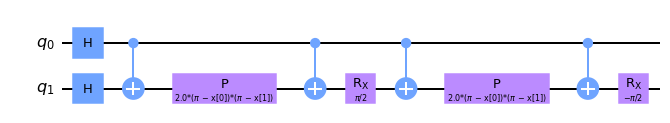


Quantum kernel matrices:



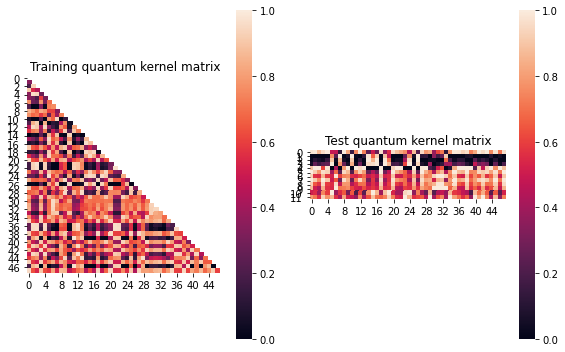


SVM with quantum kernel trained!


Test set performance:


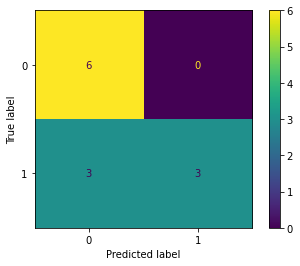

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.007826268788840407
metric(s) 2: (00, 10, 11) = (0.5209498107440138, 0.5720519571948796, 0.6075015660680645)
metric 3: -0.0


----> Kernel construction duration: 00:01:10


Combination 154/468
(Current range: 16/46)
			 reps : 1
			 paulis : ['ZZ', 'ZX']
			 entanglement : linear

Feature map:


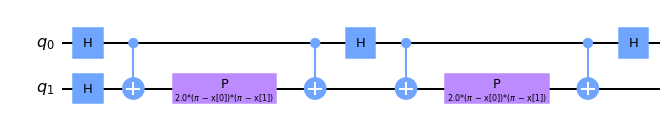


Quantum kernel matrices:



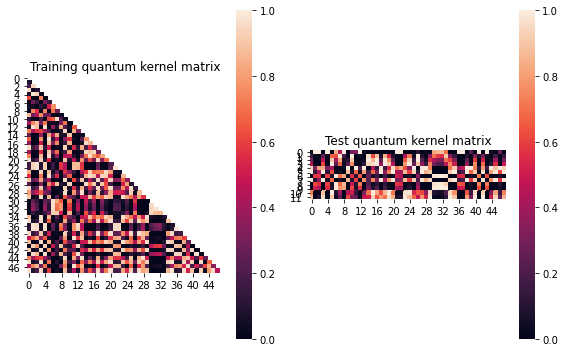


SVM with quantum kernel trained!


Test set performance:


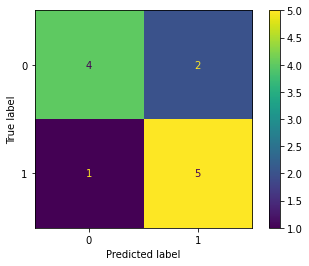

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:09


Combination 155/468
(Current range: 17/46)
			 reps : 1
			 paulis : ['ZZ', 'ZY']
			 entanglement : linear

Feature map:


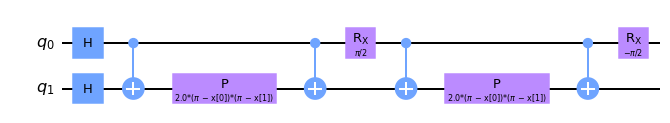


Quantum kernel matrices:



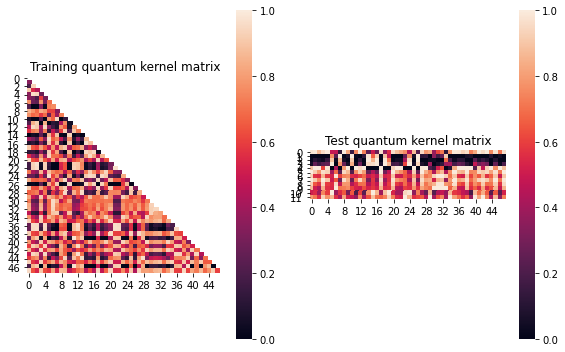


SVM with quantum kernel trained!


Test set performance:


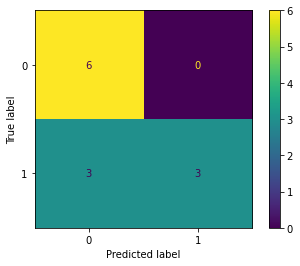

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.007826268788840407
metric(s) 2: (00, 10, 11) = (0.5209498107440138, 0.5720519571948796, 0.6075015660680645)
metric 3: -0.0


----> Kernel construction duration: 00:01:10


Combination 156/468
(Current range: 18/46)
			 reps : 1
			 paulis : ['ZZ', 'ZZ']
			 entanglement : linear

Feature map:


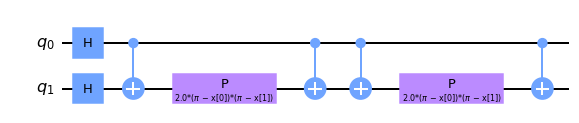


Quantum kernel matrices:



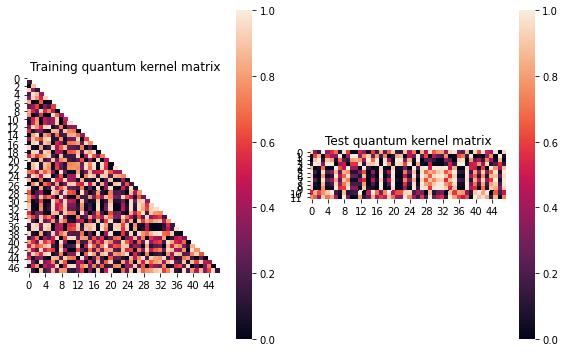


SVM with quantum kernel trained!


Test set performance:


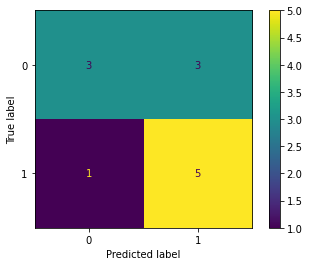

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:00:46


Combination 157/468
(Current range: 19/46)
			 reps : 2
			 paulis : ['X']
			 entanglement : linear

Feature map:


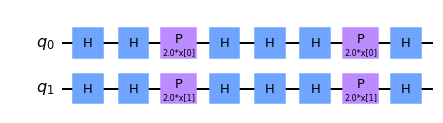


Quantum kernel matrices:



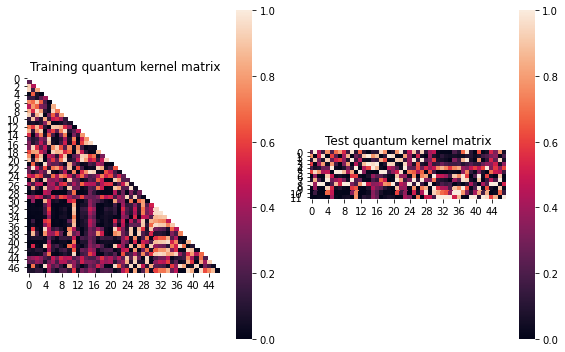


SVM with quantum kernel trained!


Test set performance:


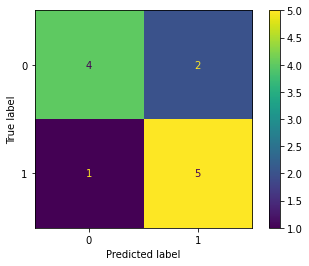

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.20135834676654873
metric(s) 2: (00, 10, 11) = (0.4378378272218841, 0.2462121996661747, 0.4573032656435627)
metric 3: -1.498792611769664e-308


----> Kernel construction duration: 00:00:31


Combination 158/468
(Current range: 20/46)
			 reps : 2
			 paulis : ['Y']
			 entanglement : linear

Feature map:


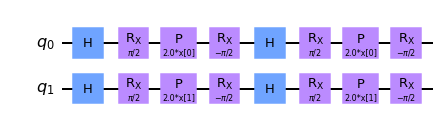


Quantum kernel matrices:



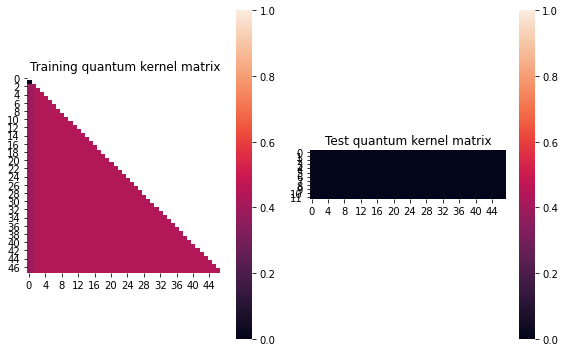


SVM with quantum kernel trained!


Test set performance:


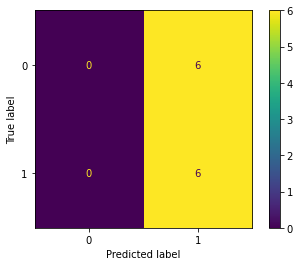

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:00:20


Combination 159/468
(Current range: 21/46)
			 reps : 2
			 paulis : ['Z']
			 entanglement : linear

Feature map:


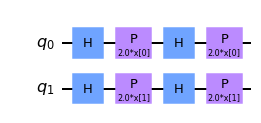


Quantum kernel matrices:



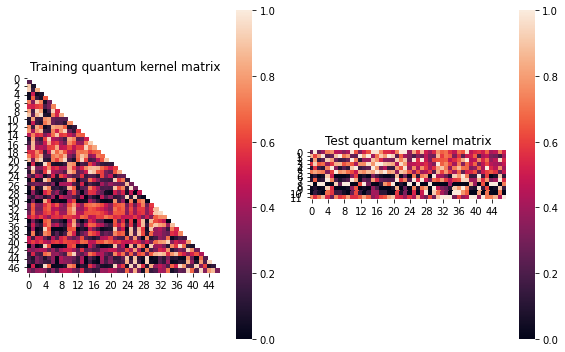


SVM with quantum kernel trained!


Test set performance:


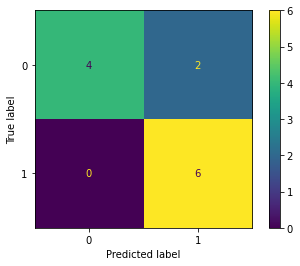

              precision    recall  f1-score   support

           0       1.00      0.67      0.80         6
           1       0.75      1.00      0.86         6

    accuracy                           0.83        12
   macro avg       0.88      0.83      0.83        12
weighted avg       0.88      0.83      0.83        12


metric 1: 0.13624597265191835
metric(s) 2: (00, 10, 11) = (0.5166924668195629, 0.3605783579291822, 0.4769561943426381)
metric 3: -1.3138095606145644e-286


----> Kernel construction duration: 00:00:31


Combination 160/468
(Current range: 22/46)
			 reps : 2
			 paulis : ['XX']
			 entanglement : linear

Feature map:


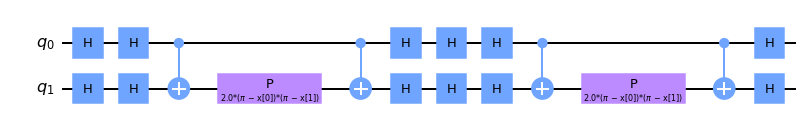


Quantum kernel matrices:



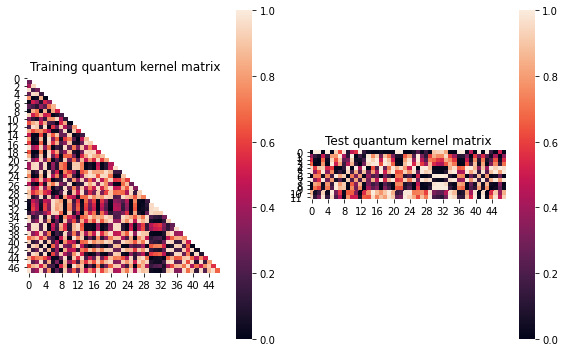


SVM with quantum kernel trained!


Test set performance:


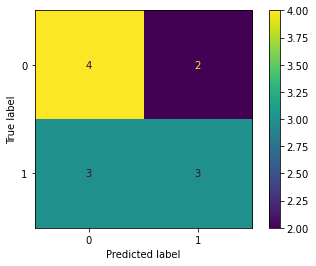

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:00:59


Combination 161/468
(Current range: 23/46)
			 reps : 2
			 paulis : ['XY']
			 entanglement : linear

Feature map:


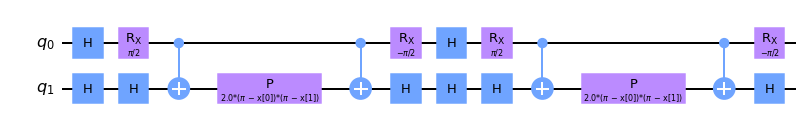


Quantum kernel matrices:



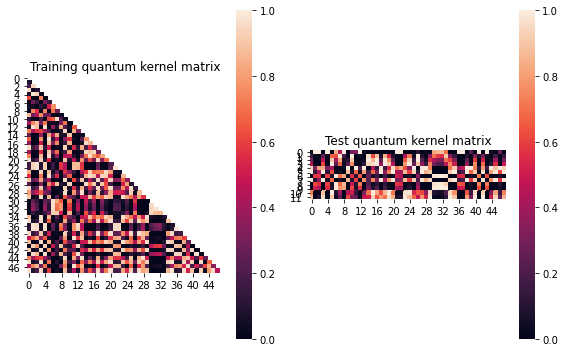


SVM with quantum kernel trained!


Test set performance:


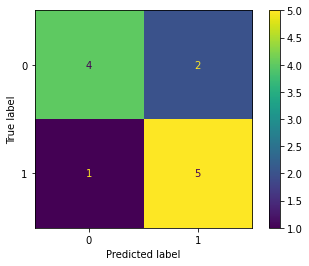

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:15


Combination 162/468
(Current range: 24/46)
			 reps : 2
			 paulis : ['XZ']
			 entanglement : linear

Feature map:


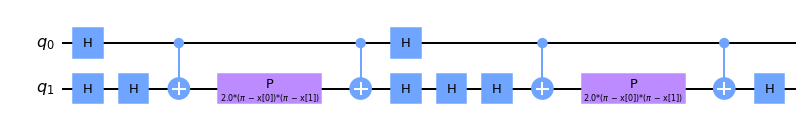


Quantum kernel matrices:



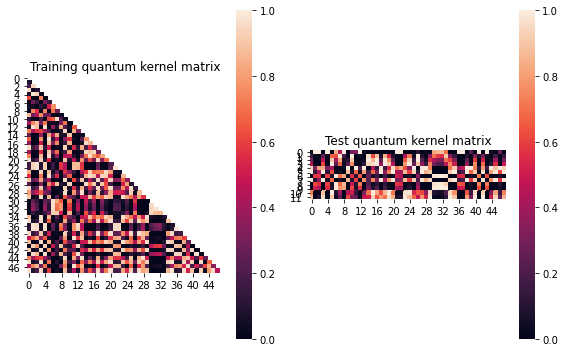


SVM with quantum kernel trained!


Test set performance:


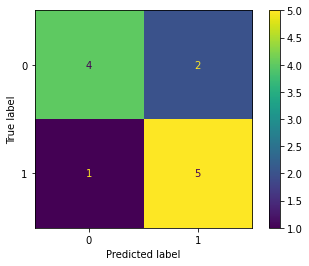

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:12


Combination 163/468
(Current range: 25/46)
			 reps : 2
			 paulis : ['YX']
			 entanglement : linear

Feature map:


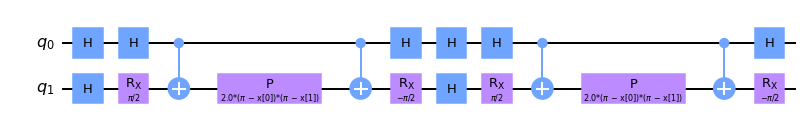


Quantum kernel matrices:



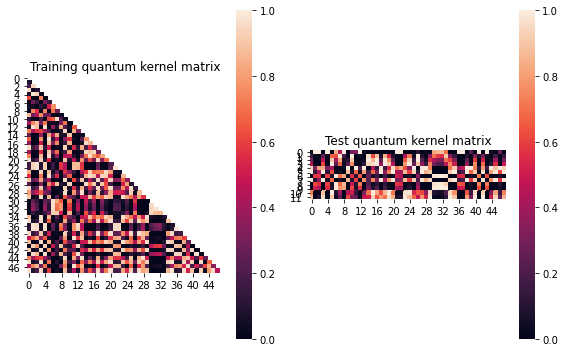


SVM with quantum kernel trained!


Test set performance:


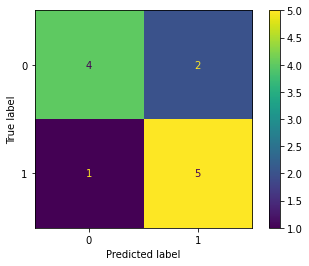

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:14


Combination 164/468
(Current range: 26/46)
			 reps : 2
			 paulis : ['YY']
			 entanglement : linear

Feature map:


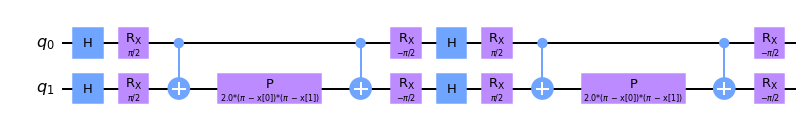


Quantum kernel matrices:



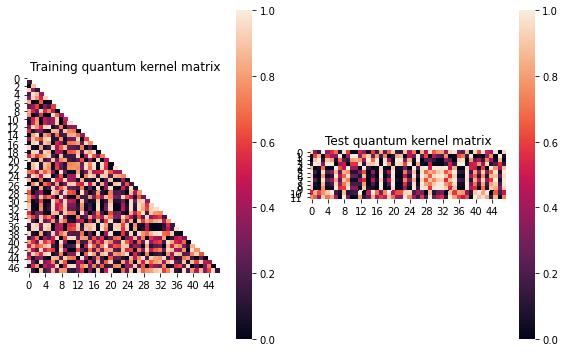


SVM with quantum kernel trained!


Test set performance:


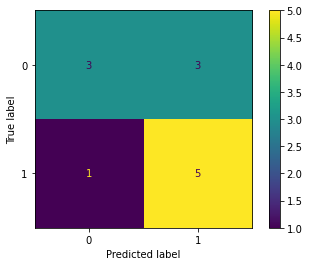

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:01:30


Combination 165/468
(Current range: 27/46)
			 reps : 2
			 paulis : ['YZ']
			 entanglement : linear

Feature map:


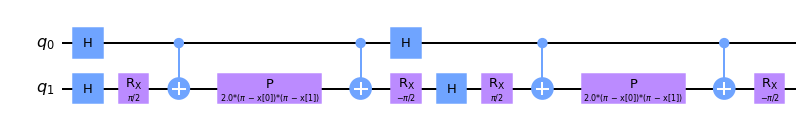


Quantum kernel matrices:



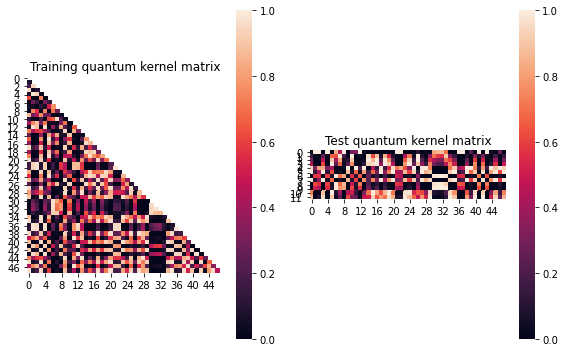


SVM with quantum kernel trained!


Test set performance:


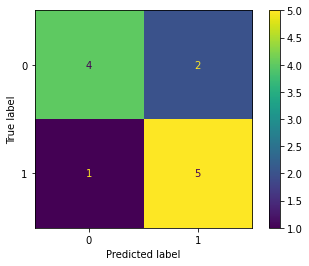

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:28


Combination 166/468
(Current range: 28/46)
			 reps : 2
			 paulis : ['ZX']
			 entanglement : linear

Feature map:


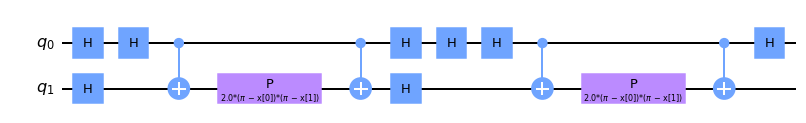


Quantum kernel matrices:



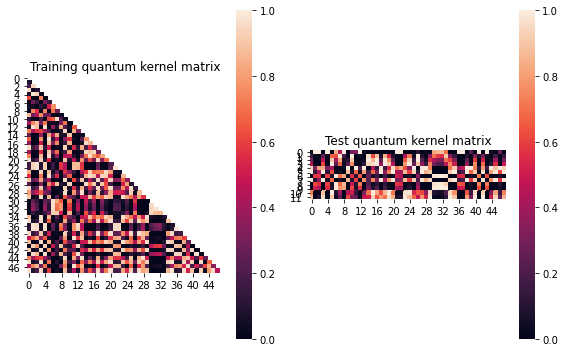


SVM with quantum kernel trained!


Test set performance:


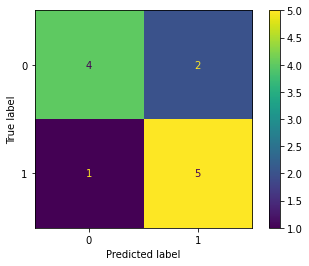

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:11


Combination 167/468
(Current range: 29/46)
			 reps : 2
			 paulis : ['ZY']
			 entanglement : linear

Feature map:


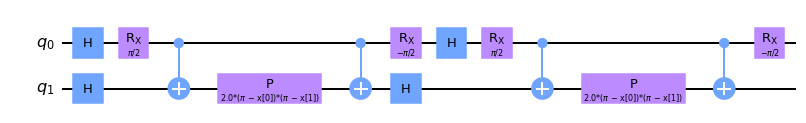


Quantum kernel matrices:



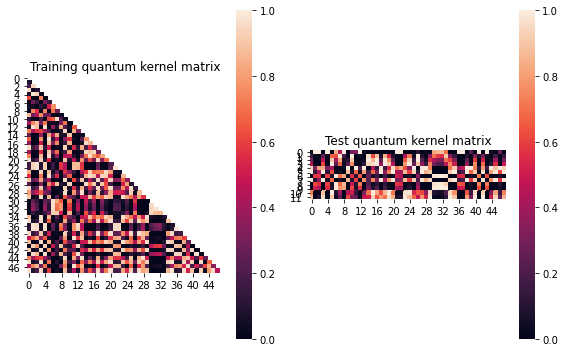


SVM with quantum kernel trained!


Test set performance:


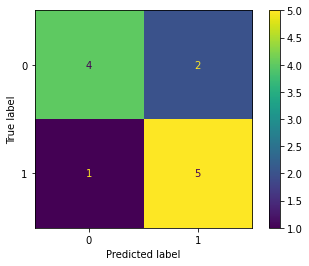

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01709086688092759
metric(s) 2: (00, 10, 11) = (0.3930206505199228, 0.38947823920992, 0.42011756166177233)
metric 3: 0.0


----> Kernel construction duration: 00:01:27


Combination 168/468
(Current range: 30/46)
			 reps : 2
			 paulis : ['ZZ']
			 entanglement : linear

Feature map:


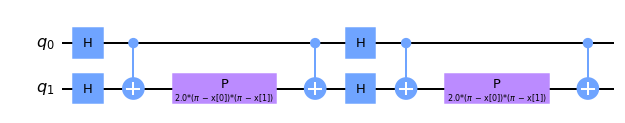


Quantum kernel matrices:



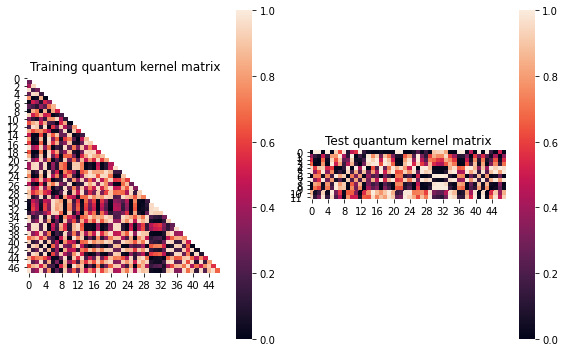


SVM with quantum kernel trained!


Test set performance:


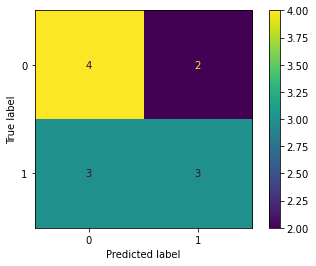

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:23


Combination 169/468
(Current range: 31/46)
			 reps : 2
			 paulis : ['X', 'X']
			 entanglement : linear

Feature map:


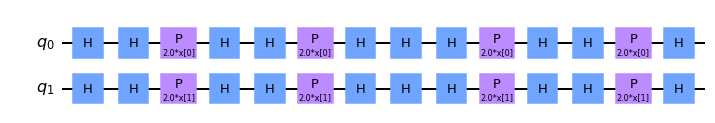


Quantum kernel matrices:



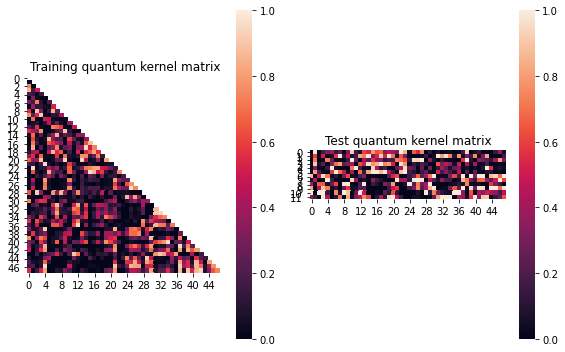


SVM with quantum kernel trained!


Test set performance:


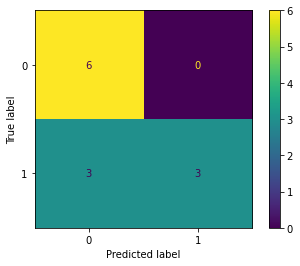

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: 0.14882432393696096
metric(s) 2: (00, 10, 11) = (0.3175296147741833, 0.18735808070774787, 0.3548351945152344)
metric 3: 7.103736835965141e-306


----> Kernel construction duration: 00:00:34


Combination 170/468
(Current range: 32/46)
			 reps : 2
			 paulis : ['X', 'Y']
			 entanglement : linear

Feature map:


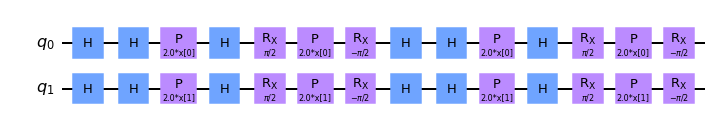


Quantum kernel matrices:



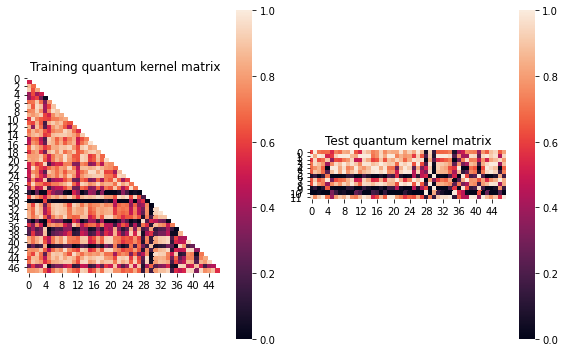


SVM with quantum kernel trained!


Test set performance:


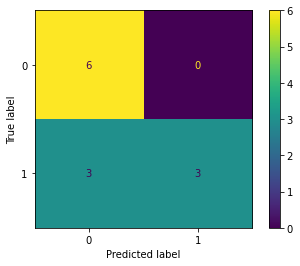

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: 0.0489765192389896
metric(s) 2: (00, 10, 11) = (0.73229334364903, 0.5913030416611321, 0.5482657781512135)
metric 3: -1.50507e-319


----> Kernel construction duration: 00:00:35


Combination 171/468
(Current range: 33/46)
			 reps : 2
			 paulis : ['X', 'Z']
			 entanglement : linear

Feature map:


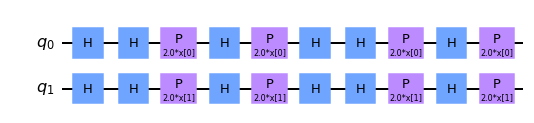


Quantum kernel matrices:



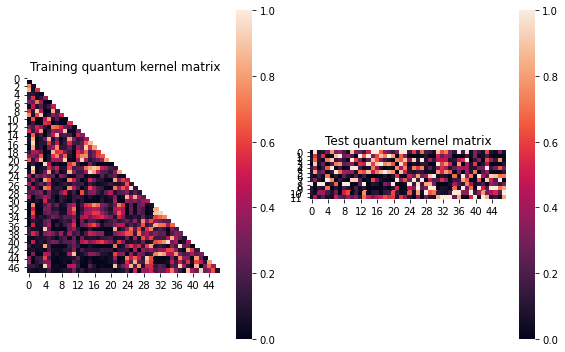


SVM with quantum kernel trained!


Test set performance:


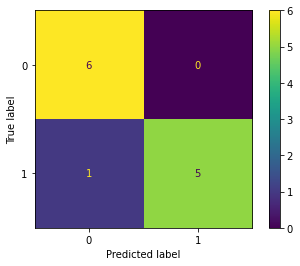

              precision    recall  f1-score   support

           0       0.86      1.00      0.92         6
           1       1.00      0.83      0.91         6

    accuracy                           0.92        12
   macro avg       0.93      0.92      0.92        12
weighted avg       0.93      0.92      0.92        12


metric 1: 0.16613849755062324
metric(s) 2: (00, 10, 11) = (0.3477725788065907, 0.1901959580568278, 0.36489633240831143)
metric 3: -1.018358595297327e-270


----> Kernel construction duration: 00:00:35


Combination 172/468
(Current range: 34/46)
			 reps : 2
			 paulis : ['X', 'XX']
			 entanglement : linear

Feature map:


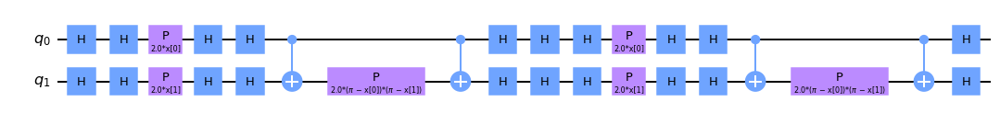


Quantum kernel matrices:



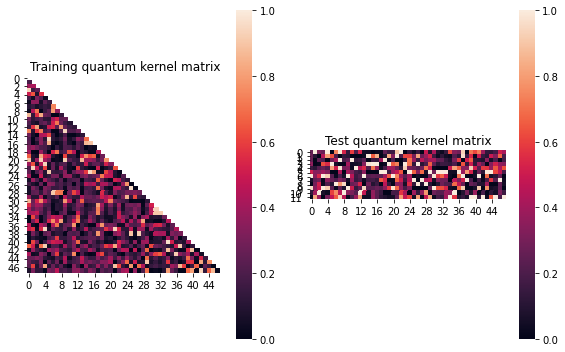


SVM with quantum kernel trained!


Test set performance:


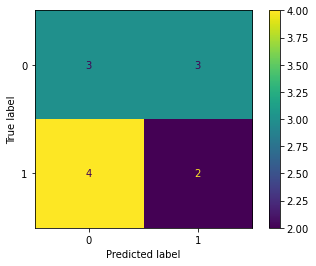

              precision    recall  f1-score   support

           0       0.43      0.50      0.46         6
           1       0.40      0.33      0.36         6

    accuracy                           0.42        12
   macro avg       0.41      0.42      0.41        12
weighted avg       0.41      0.42      0.41        12


metric 1: 0.05733851085899522
metric(s) 2: (00, 10, 11) = (0.31281939221849137, 0.2511093745159616, 0.3040763785314222)
metric 3: 3.3102918868991154e-287


----> Kernel construction duration: 00:01:22


Combination 173/468
(Current range: 35/46)
			 reps : 2
			 paulis : ['X', 'XY']
			 entanglement : linear

Feature map:


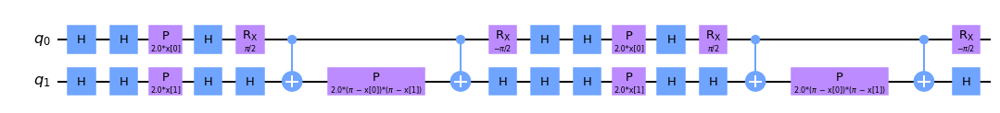


Quantum kernel matrices:



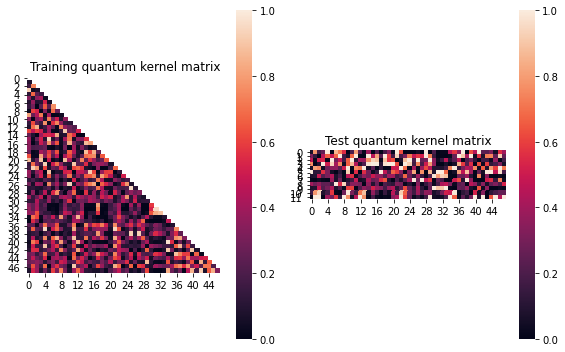


SVM with quantum kernel trained!


Test set performance:


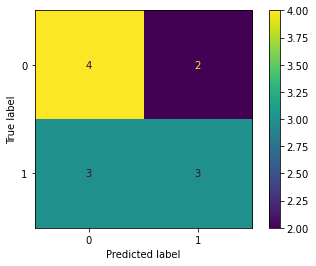

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.061123587403080715
metric(s) 2: (00, 10, 11) = (0.3630520149239673, 0.2837624306123731, 0.32672002110694026)
metric 3: -2.0102135600831874e-259


----> Kernel construction duration: 00:01:30


Combination 174/468
(Current range: 36/46)
			 reps : 2
			 paulis : ['X', 'XZ']
			 entanglement : linear

Feature map:


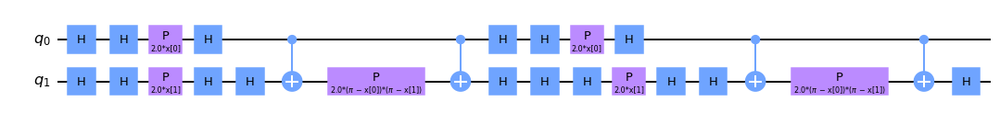


Quantum kernel matrices:



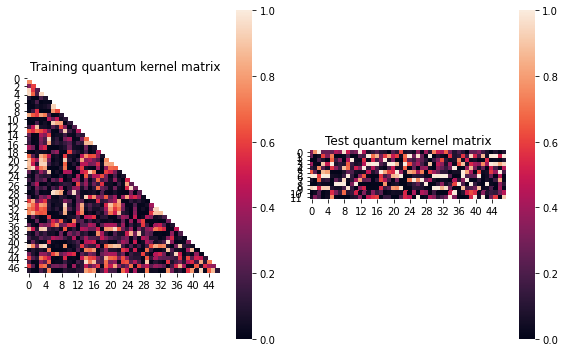


SVM with quantum kernel trained!


Test set performance:


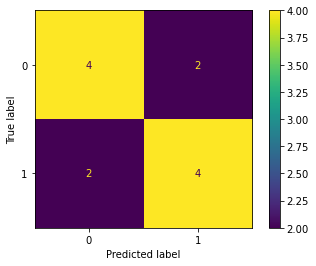

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.04008645101891101
metric(s) 2: (00, 10, 11) = (0.31867042823093794, 0.26560040228666415, 0.2927032783802124)
metric 3: 7.110795856352473e-307


----> Kernel construction duration: 00:01:26


Combination 175/468
(Current range: 37/46)
			 reps : 2
			 paulis : ['X', 'YX']
			 entanglement : linear

Feature map:


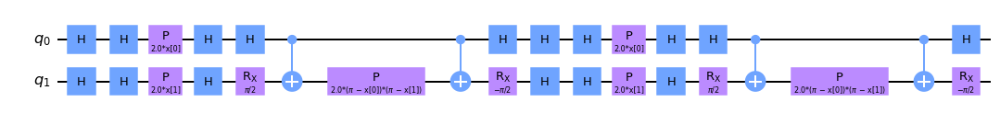


Quantum kernel matrices:



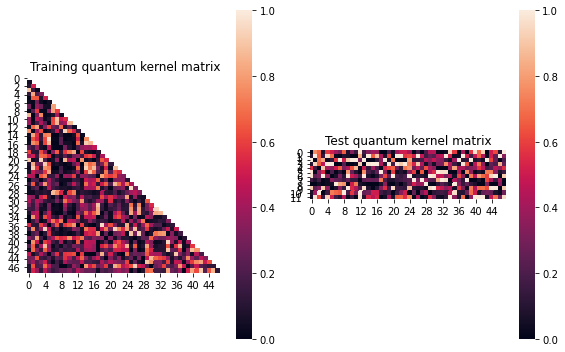


SVM with quantum kernel trained!


Test set performance:


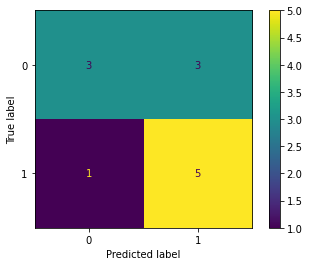

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.07136434510910866
metric(s) 2: (00, 10, 11) = (0.3578989162672301, 0.2917691906334194, 0.368368155217826)
metric 3: 2.2455819402933016e-298


----> Kernel construction duration: 00:01:30


Combination 176/468
(Current range: 38/46)
			 reps : 2
			 paulis : ['X', 'YY']
			 entanglement : linear

Feature map:


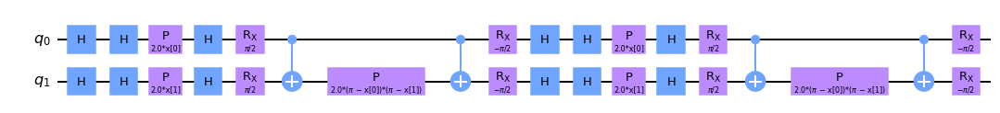


Quantum kernel matrices:



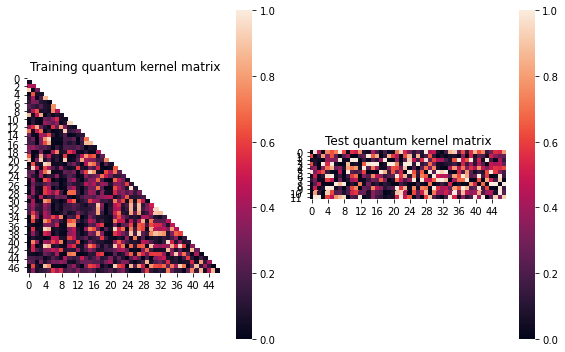


SVM with quantum kernel trained!


Test set performance:


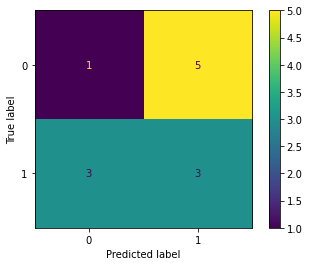

              precision    recall  f1-score   support

           0       0.25      0.17      0.20         6
           1       0.38      0.50      0.43         6

    accuracy                           0.33        12
   macro avg       0.31      0.33      0.31        12
weighted avg       0.31      0.33      0.31        12


metric 1: 0.08546061761508095
metric(s) 2: (00, 10, 11) = (0.3013345837518027, 0.2469222419593251, 0.3634311353970094)
metric 3: 2.2229573804617268e-274


----> Kernel construction duration: 00:01:35


Combination 177/468
(Current range: 39/46)
			 reps : 2
			 paulis : ['X', 'YZ']
			 entanglement : linear

Feature map:


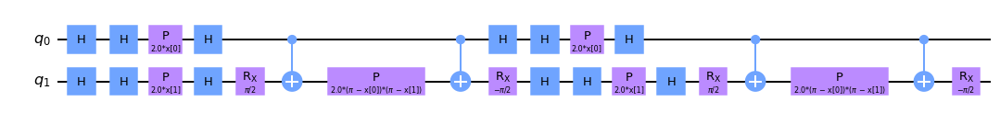


Quantum kernel matrices:



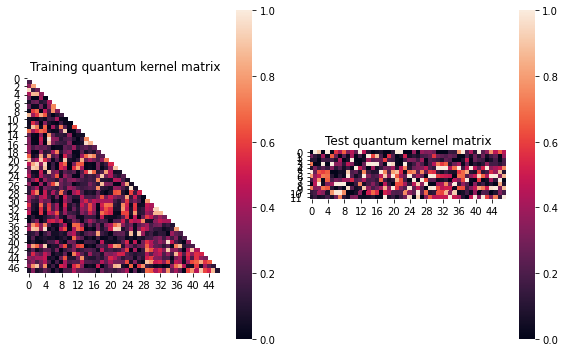


SVM with quantum kernel trained!


Test set performance:


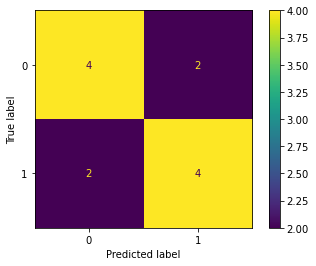

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.08331085945258909
metric(s) 2: (00, 10, 11) = (0.3295860360569151, 0.2622465365818299, 0.36152875601192286)
metric 3: -9.171096336099041e-288


----> Kernel construction duration: 00:01:32


Combination 178/468
(Current range: 40/46)
			 reps : 2
			 paulis : ['X', 'ZX']
			 entanglement : linear

Feature map:


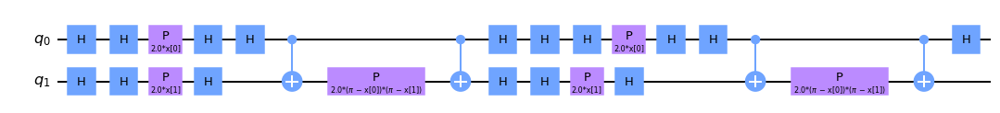


Quantum kernel matrices:



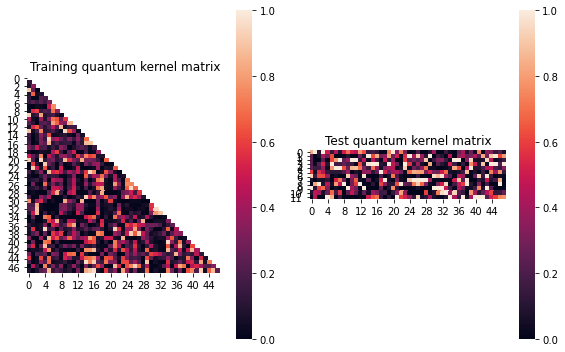


SVM with quantum kernel trained!


Test set performance:


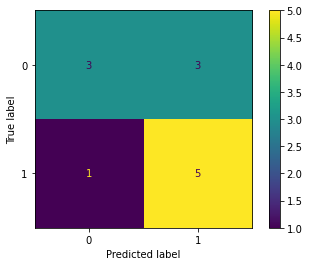

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.07169171797764076
metric(s) 2: (00, 10, 11) = (0.30059510186979765, 0.2353747525950974, 0.31353783927567874)
metric 3: -2.086721527610356e-292


----> Kernel construction duration: 00:01:26


Combination 179/468
(Current range: 41/46)
			 reps : 2
			 paulis : ['X', 'ZY']
			 entanglement : linear

Feature map:


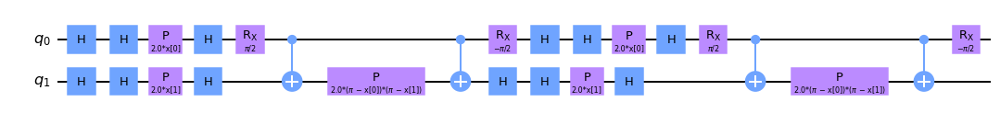


Quantum kernel matrices:



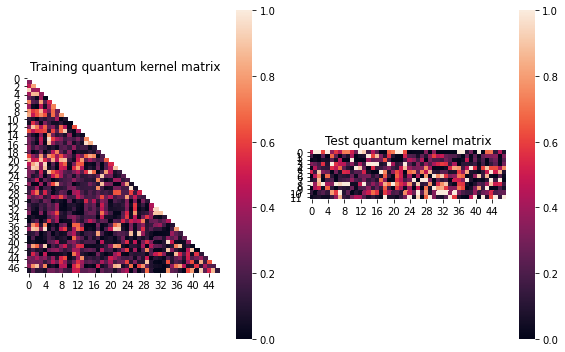


SVM with quantum kernel trained!


Test set performance:


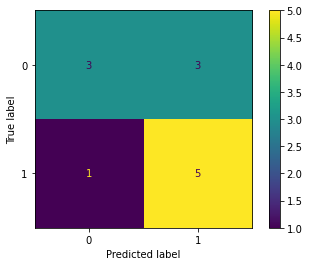

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.11172161875094044
metric(s) 2: (00, 10, 11) = (0.3853989805841697, 0.23018806806571795, 0.2984203930491471)
metric 3: -1.5511993736031592e-285


----> Kernel construction duration: 00:01:35


Combination 180/468
(Current range: 42/46)
			 reps : 2
			 paulis : ['X', 'ZZ']
			 entanglement : linear

Feature map:


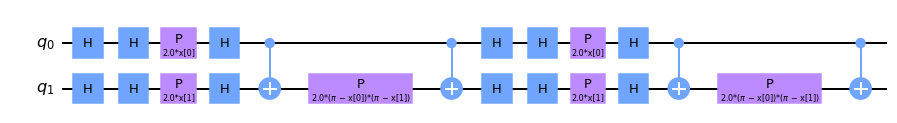


Quantum kernel matrices:



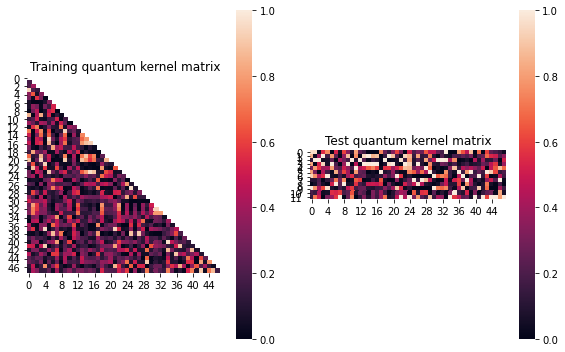


SVM with quantum kernel trained!


Test set performance:


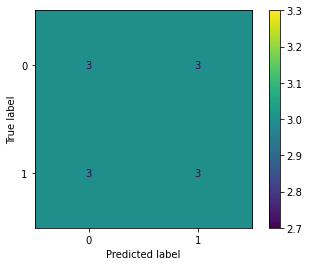

              precision    recall  f1-score   support

           0       0.50      0.50      0.50         6
           1       0.50      0.50      0.50         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.50        12
weighted avg       0.50      0.50      0.50        12


metric 1: 0.06654598868075606
metric(s) 2: (00, 10, 11) = (0.32900075305718623, 0.24966825715383045, 0.3034277386119868)
metric 3: -6.997210287185803e-272


----> Kernel construction duration: 00:01:28


Combination 181/468
(Current range: 43/46)
			 reps : 2
			 paulis : ['Y', 'X']
			 entanglement : linear

Feature map:


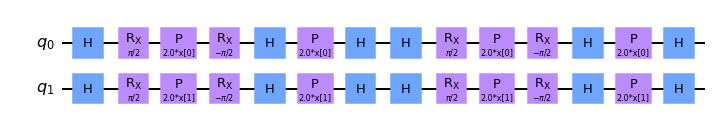


Quantum kernel matrices:



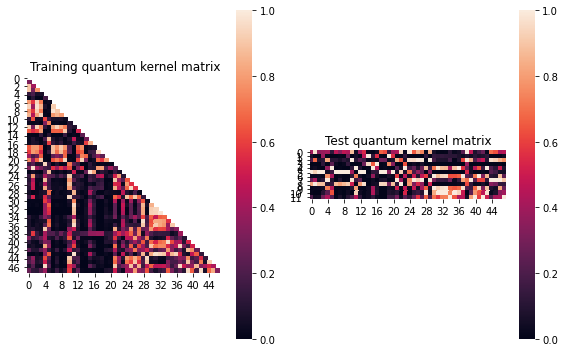


SVM with quantum kernel trained!


Test set performance:


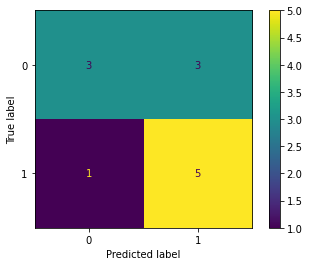

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.2390684109226902
metric(s) 2: (00, 10, 11) = (0.360459371753543, 0.1658363205989422, 0.44935009128972186)
metric 3: -1.6301095400017447e-290


----> Kernel construction duration: 00:00:41


Combination 182/468
(Current range: 44/46)
			 reps : 2
			 paulis : ['Y', 'Y']
			 entanglement : linear

Feature map:


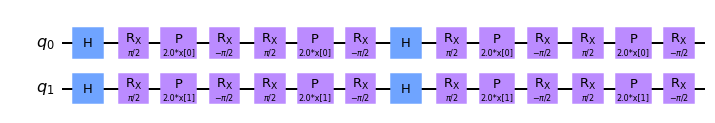


Quantum kernel matrices:



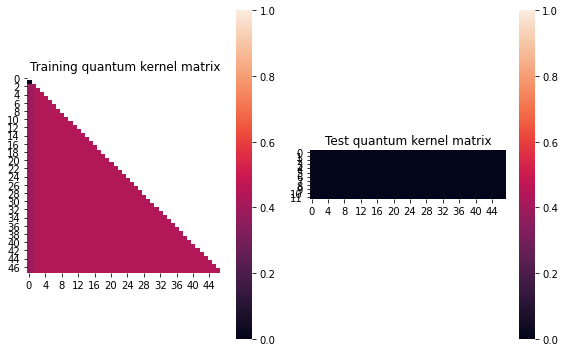


SVM with quantum kernel trained!


Test set performance:


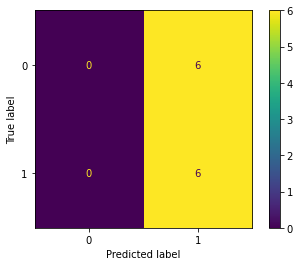

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:00:26


Combination 183/468
(Current range: 45/46)
			 reps : 2
			 paulis : ['Y', 'Z']
			 entanglement : linear

Feature map:


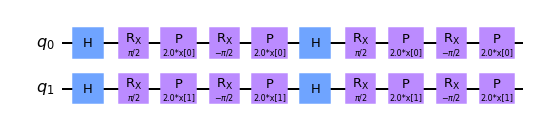


Quantum kernel matrices:



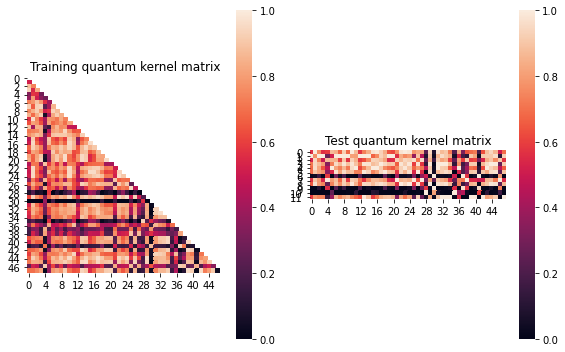


SVM with quantum kernel trained!


Test set performance:


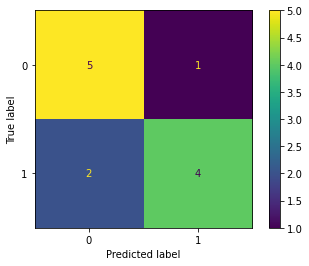

              precision    recall  f1-score   support

           0       0.71      0.83      0.77         6
           1       0.80      0.67      0.73         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.04983629669124523
metric(s) 2: (00, 10, 11) = (0.7200924087913738, 0.5710178821151446, 0.5216159488214058)
metric 3: 4.8370277e-317


----> Kernel construction duration: 00:00:38


Combination 184/468
(Current range: 46/46)
			 reps : 2
			 paulis : ['Y', 'XX']
			 entanglement : linear

Feature map:


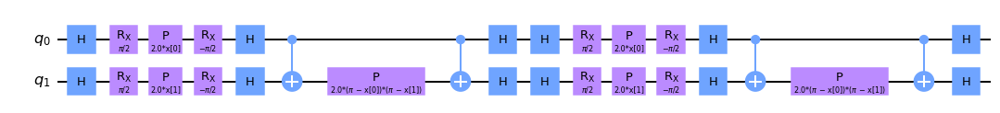


Quantum kernel matrices:



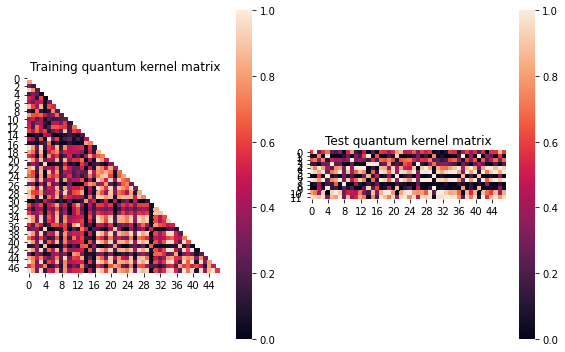


SVM with quantum kernel trained!


Test set performance:


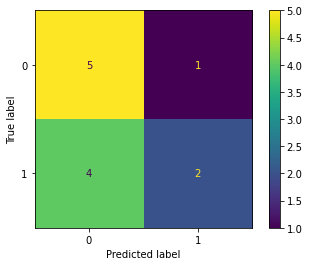

              precision    recall  f1-score   support

           0       0.56      0.83      0.67         6
           1       0.67      0.33      0.44         6

    accuracy                           0.58        12
   macro avg       0.61      0.58      0.56        12
weighted avg       0.61      0.58      0.56        12


metric 1: 0.024029362434801527
metric(s) 2: (00, 10, 11) = (0.4221537058686761, 0.4530010663781165, 0.5319071517571599)
metric 3: 6.904924517496598e-273


----> Kernel construction duration: 00:01:44


In [27]:
j=3
results.append(run_kernel_evaluation(X, X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 185/468
(Current range: 1/46)
			 reps : 2
			 paulis : ['Y', 'XY']
			 entanglement : linear

Feature map:


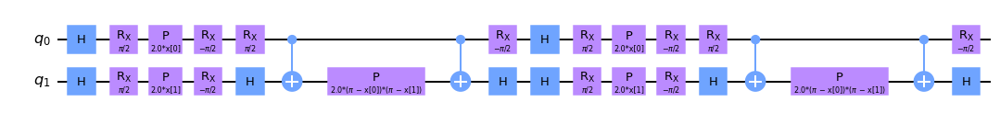


Quantum kernel matrices:



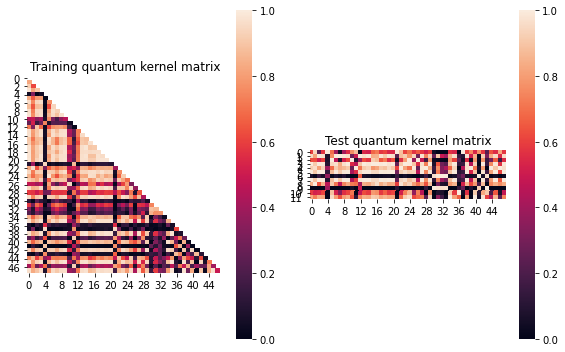


SVM with quantum kernel trained!


Test set performance:


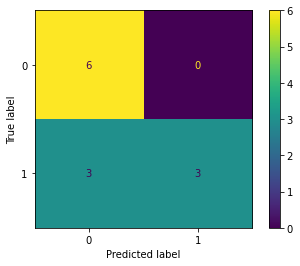

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: 0.04351559770960545
metric(s) 2: (00, 10, 11) = (0.6870920833949737, 0.5166622275353625, 0.4332635670949622)
metric 3: -0.0


----> Kernel construction duration: 00:01:42


Combination 186/468
(Current range: 2/46)
			 reps : 2
			 paulis : ['Y', 'XZ']
			 entanglement : linear

Feature map:


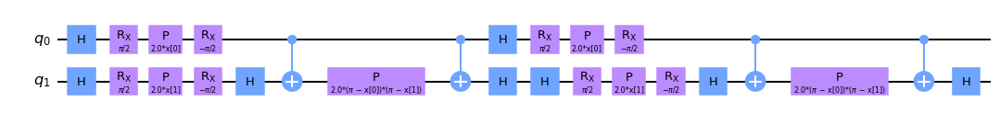


Quantum kernel matrices:



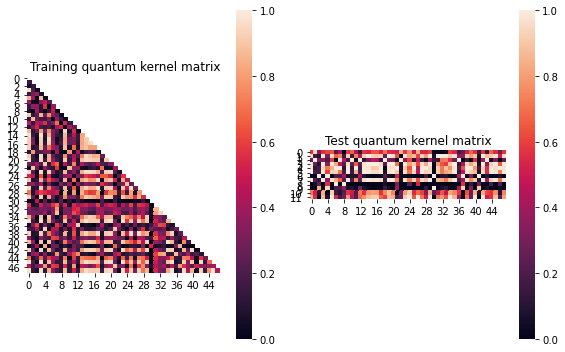


SVM with quantum kernel trained!


Test set performance:


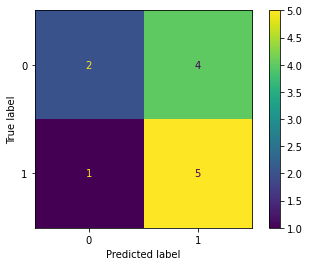

              precision    recall  f1-score   support

           0       0.67      0.33      0.44         6
           1       0.56      0.83      0.67         6

    accuracy                           0.58        12
   macro avg       0.61      0.58      0.56        12
weighted avg       0.61      0.58      0.56        12


metric 1: 0.020313296426344662
metric(s) 2: (00, 10, 11) = (0.41691003698076257, 0.4065625641222399, 0.43684168411640656)
metric 3: 4.674437612626351e-286


----> Kernel construction duration: 00:01:47


Combination 187/468
(Current range: 3/46)
			 reps : 2
			 paulis : ['Y', 'YX']
			 entanglement : linear

Feature map:


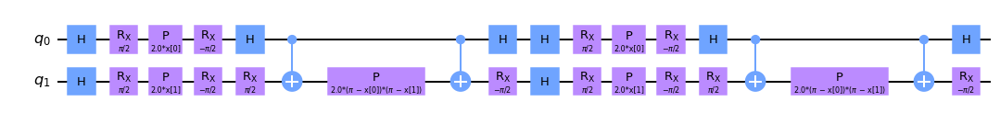


Quantum kernel matrices:



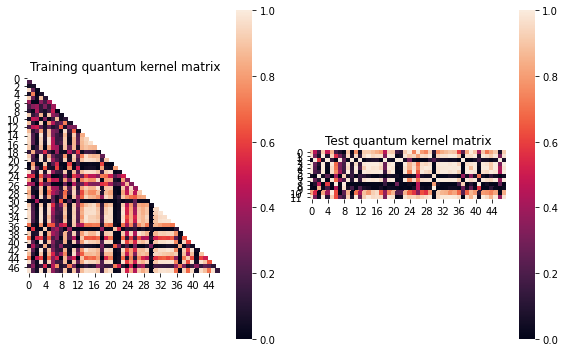


SVM with quantum kernel trained!


Test set performance:


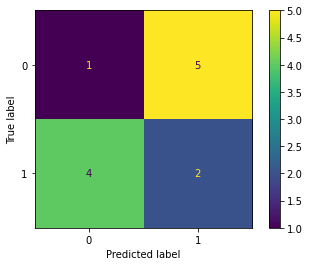

              precision    recall  f1-score   support

           0       0.20      0.17      0.18         6
           1       0.29      0.33      0.31         6

    accuracy                           0.25        12
   macro avg       0.24      0.25      0.24        12
weighted avg       0.24      0.25      0.24        12


metric 1: 0.03987578154084348
metric(s) 2: (00, 10, 11) = (0.4238651352304694, 0.45697530003622927, 0.5698370279236761)
metric 3: -1.56075e-319


----> Kernel construction duration: 00:01:47


Combination 188/468
(Current range: 4/46)
			 reps : 2
			 paulis : ['Y', 'YY']
			 entanglement : linear

Feature map:


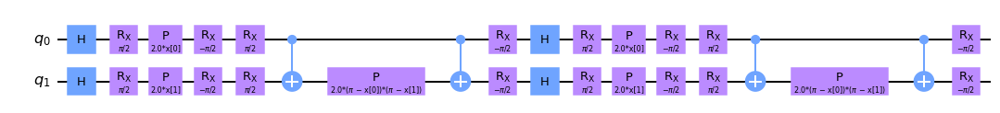


Quantum kernel matrices:



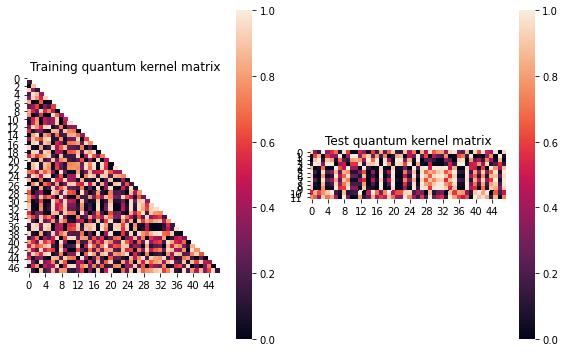


SVM with quantum kernel trained!


Test set performance:


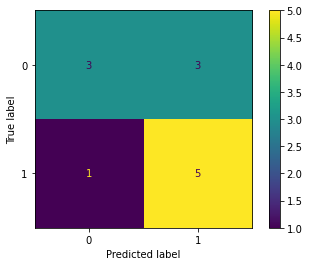

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:01:48


Combination 189/468
(Current range: 5/46)
			 reps : 2
			 paulis : ['Y', 'YZ']
			 entanglement : linear

Feature map:


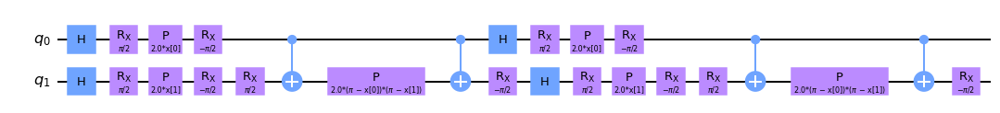


Quantum kernel matrices:



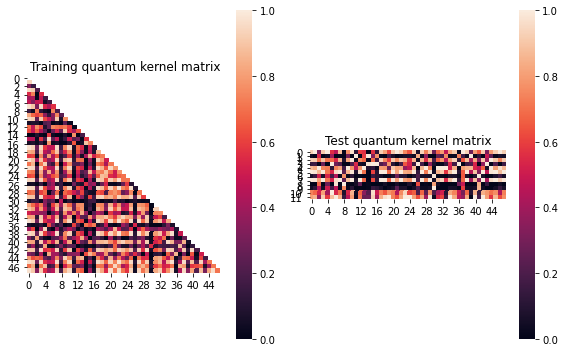


SVM with quantum kernel trained!


Test set performance:


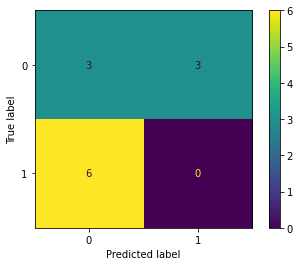

              precision    recall  f1-score   support

           0       0.33      0.50      0.40         6
           1       0.00      0.00      0.00         6

    accuracy                           0.25        12
   macro avg       0.17      0.25      0.20        12
weighted avg       0.17      0.25      0.20        12


metric 1: 0.012966589739766443
metric(s) 2: (00, 10, 11) = (0.474159505971694, 0.47122769153948024, 0.49422905658679933)
metric 3: 3.96339e-318


----> Kernel construction duration: 00:01:43


Combination 190/468
(Current range: 6/46)
			 reps : 2
			 paulis : ['Y', 'ZX']
			 entanglement : linear

Feature map:


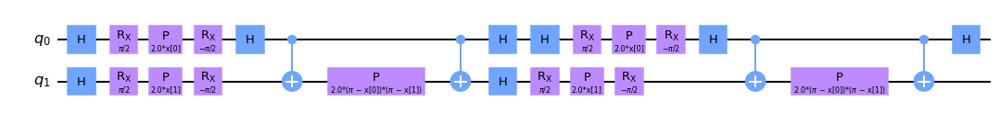


Quantum kernel matrices:



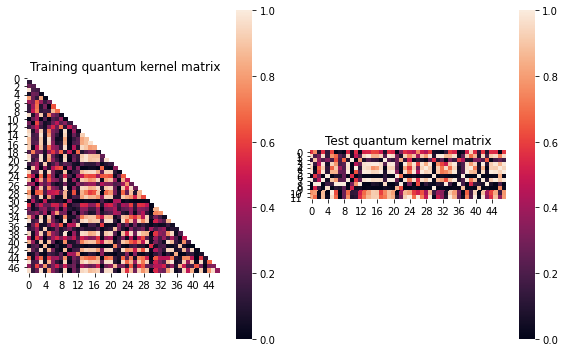


SVM with quantum kernel trained!


Test set performance:


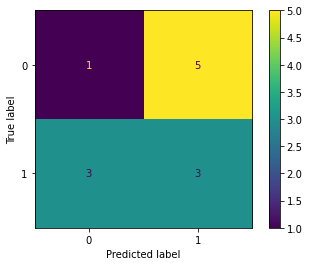

              precision    recall  f1-score   support

           0       0.25      0.17      0.20         6
           1       0.38      0.50      0.43         6

    accuracy                           0.33        12
   macro avg       0.31      0.33      0.31        12
weighted avg       0.31      0.33      0.31        12


metric 1: 0.02840562287447229
metric(s) 2: (00, 10, 11) = (0.4121671578260276, 0.385433688820839, 0.415511465564595)
metric 3: 3.6898114171254628e-261


----> Kernel construction duration: 00:01:45


Combination 191/468
(Current range: 7/46)
			 reps : 2
			 paulis : ['Y', 'ZY']
			 entanglement : linear

Feature map:


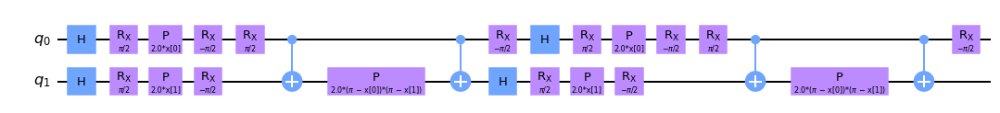


Quantum kernel matrices:



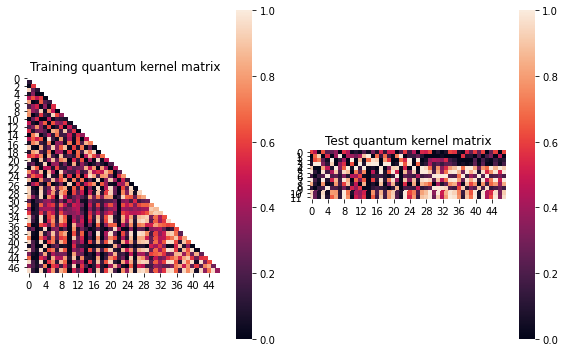


SVM with quantum kernel trained!


Test set performance:


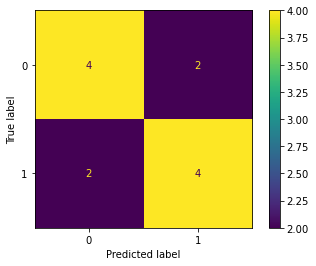

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.10059058871656867
metric(s) 2: (00, 10, 11) = (0.39459289673801545, 0.36983676978824526, 0.5462618202716124)
metric 3: 5.389e-320


----> Kernel construction duration: 00:01:44


Combination 192/468
(Current range: 8/46)
			 reps : 2
			 paulis : ['Y', 'ZZ']
			 entanglement : linear

Feature map:


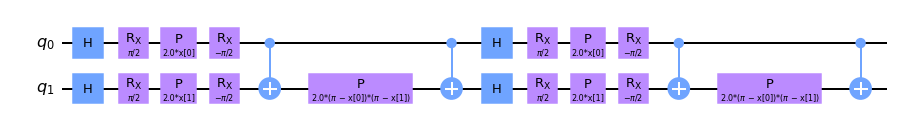


Quantum kernel matrices:



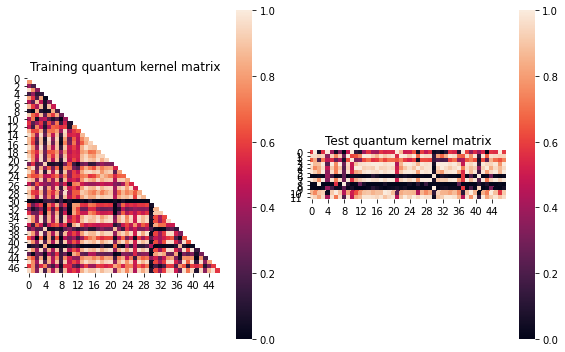


SVM with quantum kernel trained!


Test set performance:


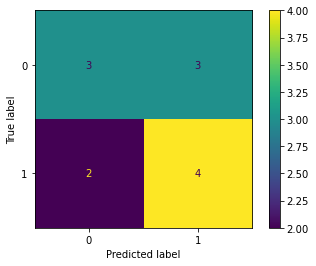

              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.57      0.67      0.62         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.0251259046503437
metric(s) 2: (00, 10, 11) = (0.5853802735455755, 0.5438248184774859, 0.5525211727100836)
metric 3: 3.5908551780399306e-303


----> Kernel construction duration: 00:01:44


Combination 193/468
(Current range: 9/46)
			 reps : 2
			 paulis : ['Z', 'X']
			 entanglement : linear

Feature map:


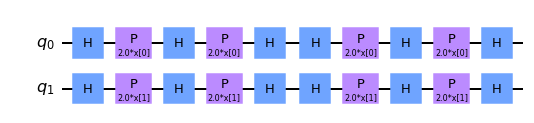


Quantum kernel matrices:



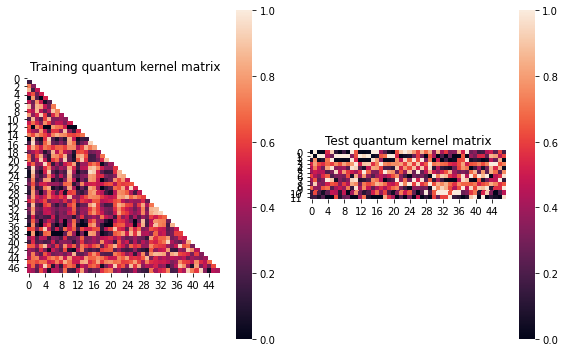


SVM with quantum kernel trained!


Test set performance:


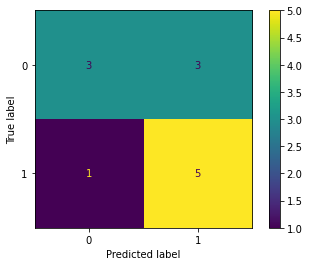

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05859476669971536
metric(s) 2: (00, 10, 11) = (0.5070347377578968, 0.45015988274404034, 0.5104745611296146)
metric 3: -3.9337646716611405e-282


----> Kernel construction duration: 00:00:36


Combination 194/468
(Current range: 10/46)
			 reps : 2
			 paulis : ['Z', 'Y']
			 entanglement : linear

Feature map:


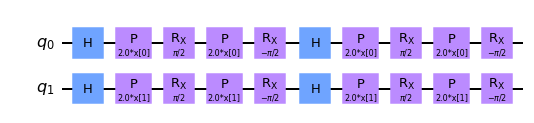


Quantum kernel matrices:



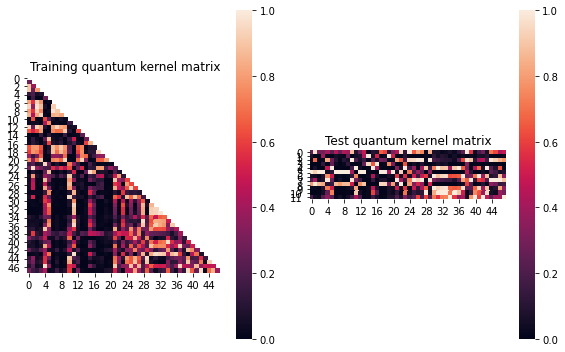


SVM with quantum kernel trained!


Test set performance:


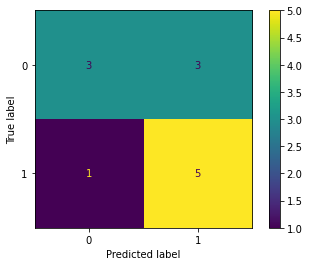

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.23895686579724254
metric(s) 2: (00, 10, 11) = (0.3668549476377663, 0.17304172594502207, 0.45714223584676295)
metric 3: -2.3118153482364454e-304


----> Kernel construction duration: 00:00:38


Combination 195/468
(Current range: 11/46)
			 reps : 2
			 paulis : ['Z', 'Z']
			 entanglement : linear

Feature map:


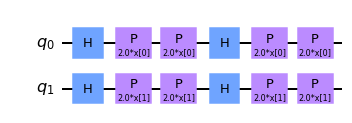


Quantum kernel matrices:



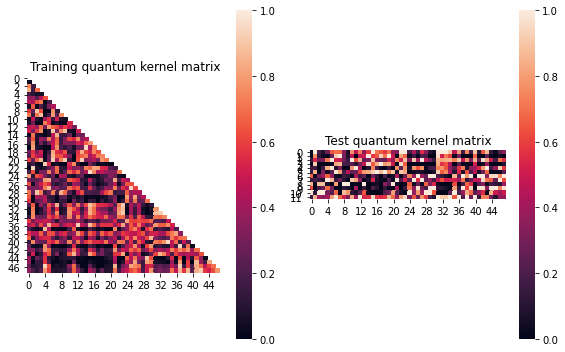


SVM with quantum kernel trained!


Test set performance:


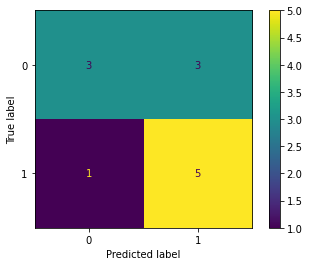

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.12426285327127956
metric(s) 2: (00, 10, 11) = (0.41568028279882685, 0.32172637859412945, 0.47629818093199117)
metric 3: -1.621741563121213e-258


----> Kernel construction duration: 00:00:35


Combination 196/468
(Current range: 12/46)
			 reps : 2
			 paulis : ['Z', 'XX']
			 entanglement : linear

Feature map:


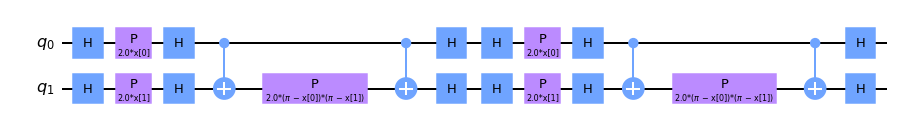


Quantum kernel matrices:



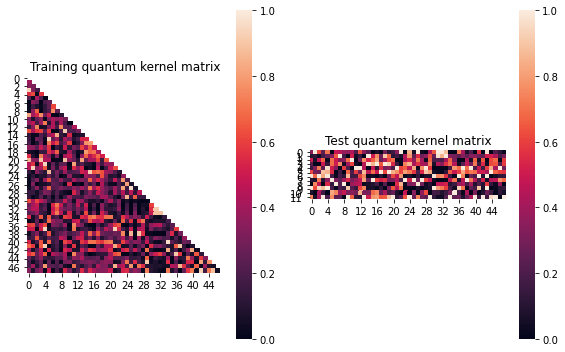


SVM with quantum kernel trained!


Test set performance:


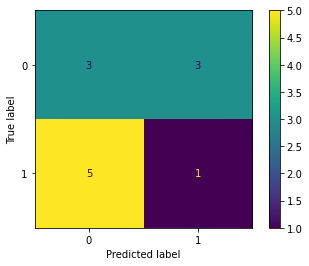

              precision    recall  f1-score   support

           0       0.38      0.50      0.43         6
           1       0.25      0.17      0.20         6

    accuracy                           0.33        12
   macro avg       0.31      0.33      0.31        12
weighted avg       0.31      0.33      0.31        12


metric 1: 0.04350740950029075
metric(s) 2: (00, 10, 11) = (0.35243627956945933, 0.281332823361212, 0.29724418615354625)
metric 3: -8.389571332802146e-271


----> Kernel construction duration: 00:01:41


Combination 197/468
(Current range: 13/46)
			 reps : 2
			 paulis : ['Z', 'XY']
			 entanglement : linear

Feature map:


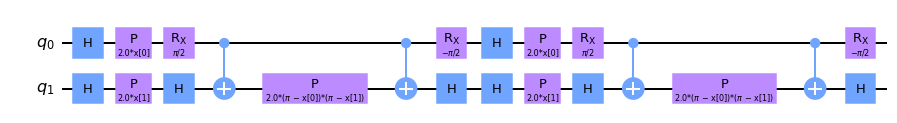


Quantum kernel matrices:



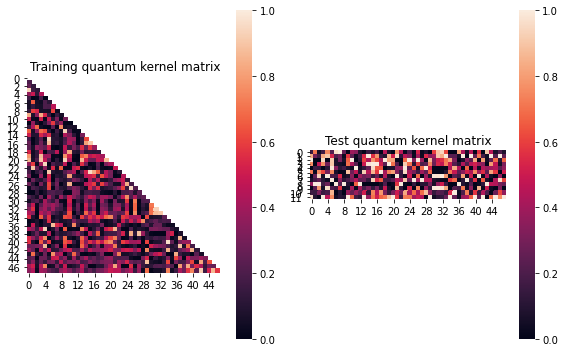


SVM with quantum kernel trained!


Test set performance:


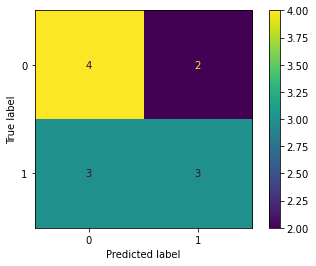

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.04222271451026799
metric(s) 2: (00, 10, 11) = (0.3012628998016729, 0.260699200032225, 0.3045809292833131)
metric 3: -1.0183394786575208e-283


----> Kernel construction duration: 00:01:46


Combination 198/468
(Current range: 14/46)
			 reps : 2
			 paulis : ['Z', 'XZ']
			 entanglement : linear

Feature map:


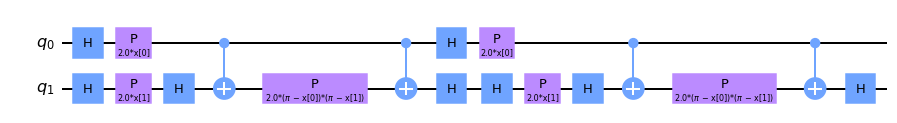


Quantum kernel matrices:



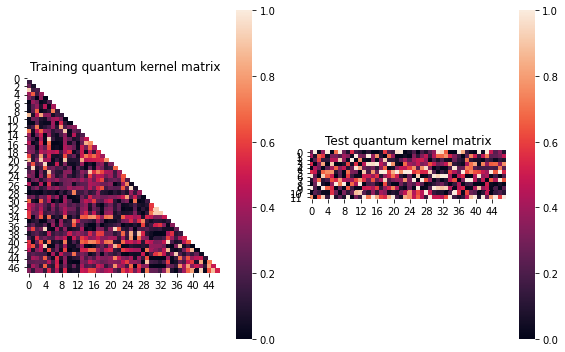


SVM with quantum kernel trained!


Test set performance:


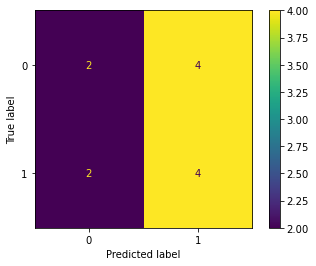

              precision    recall  f1-score   support

           0       0.50      0.33      0.40         6
           1       0.50      0.67      0.57         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.49        12
weighted avg       0.50      0.50      0.49        12


metric 1: 0.04740397216594183
metric(s) 2: (00, 10, 11) = (0.31889765082604904, 0.27944623825628184, 0.3348027700183983)
metric 3: 1.6853326727389235e-244


----> Kernel construction duration: 00:01:42


Combination 199/468
(Current range: 15/46)
			 reps : 2
			 paulis : ['Z', 'YX']
			 entanglement : linear

Feature map:


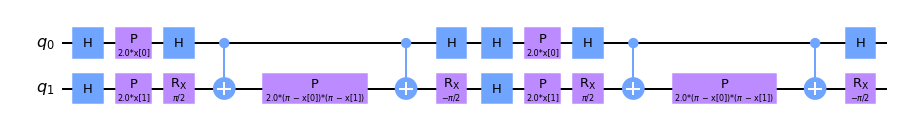


Quantum kernel matrices:



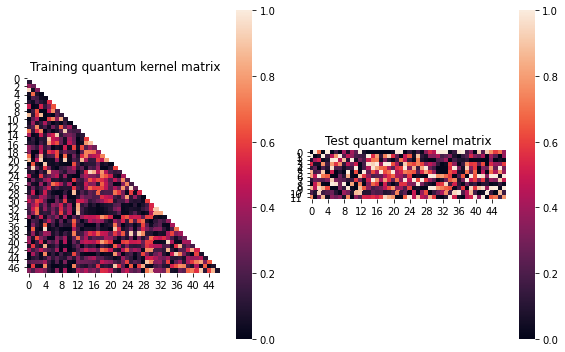


SVM with quantum kernel trained!


Test set performance:


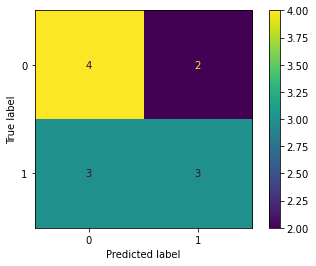

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.07729583000339013
metric(s) 2: (00, 10, 11) = (0.3147031628135554, 0.2547734783597484, 0.34943545391272157)
metric 3: 2.1825080291012003e-271


----> Kernel construction duration: 00:01:45


Combination 200/468
(Current range: 16/46)
			 reps : 2
			 paulis : ['Z', 'YY']
			 entanglement : linear

Feature map:


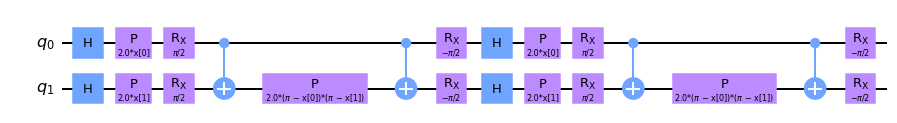


Quantum kernel matrices:



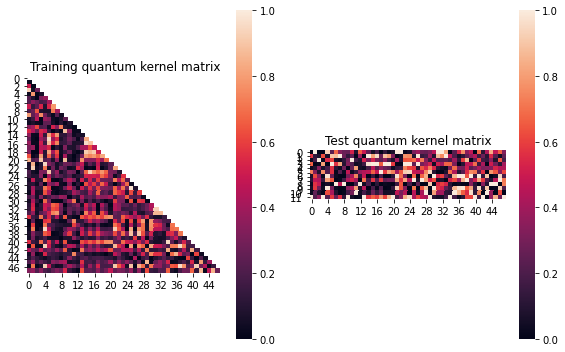


SVM with quantum kernel trained!


Test set performance:


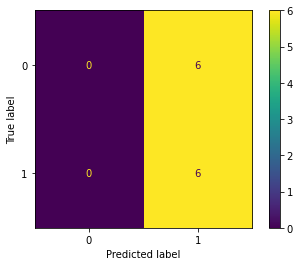

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.06422150126678705
metric(s) 2: (00, 10, 11) = (0.3359079273202036, 0.285124136383631, 0.36278334798063244)
metric 3: 3.081467721124247e-270


----> Kernel construction duration: 00:01:45


Combination 201/468
(Current range: 17/46)
			 reps : 2
			 paulis : ['Z', 'YZ']
			 entanglement : linear

Feature map:


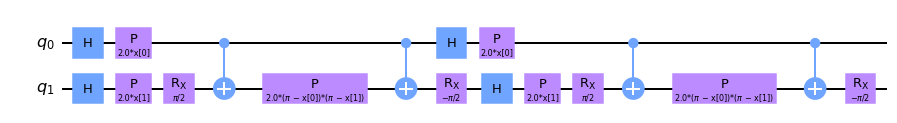


Quantum kernel matrices:



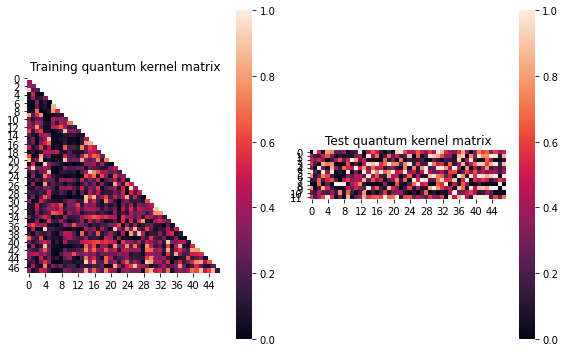


SVM with quantum kernel trained!


Test set performance:


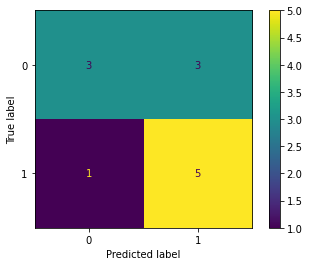

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.07183849026080641
metric(s) 2: (00, 10, 11) = (0.2992320147270601, 0.2613926990117888, 0.36723036381813035)
metric 3: -9.831259188304143e-257


----> Kernel construction duration: 00:01:41


Combination 202/468
(Current range: 18/46)
			 reps : 2
			 paulis : ['Z', 'ZX']
			 entanglement : linear

Feature map:


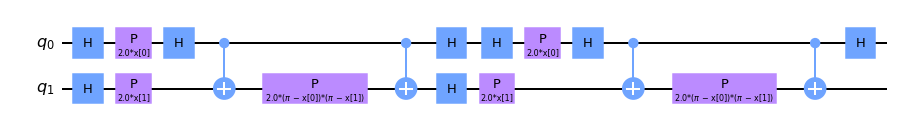


Quantum kernel matrices:



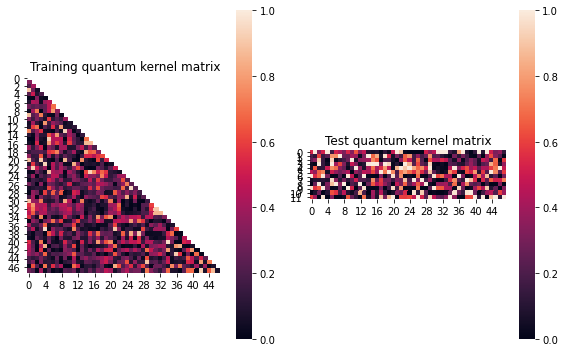


SVM with quantum kernel trained!


Test set performance:


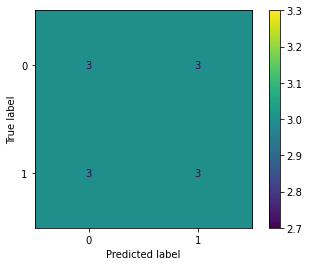

              precision    recall  f1-score   support

           0       0.50      0.50      0.50         6
           1       0.50      0.50      0.50         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.50        12
weighted avg       0.50      0.50      0.50        12


metric 1: 0.05965287517444229
metric(s) 2: (00, 10, 11) = (0.3232534827553641, 0.258262323033704, 0.3125769136609285)
metric 3: 6.1658359477199956e-257


----> Kernel construction duration: 00:01:38


Combination 203/468
(Current range: 19/46)
			 reps : 2
			 paulis : ['Z', 'ZY']
			 entanglement : linear

Feature map:


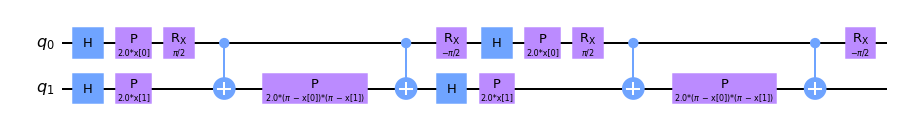


Quantum kernel matrices:



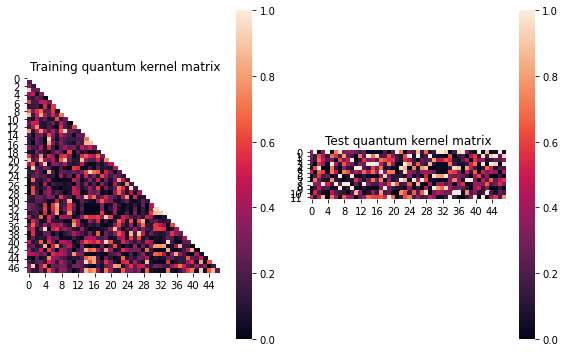


SVM with quantum kernel trained!


Test set performance:


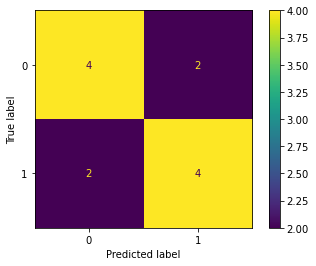

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.054418541879749815
metric(s) 2: (00, 10, 11) = (0.3285574304352551, 0.26066065259415927, 0.3016009585125631)
metric 3: -6.135610945460785e-270


----> Kernel construction duration: 00:01:39


Combination 204/468
(Current range: 20/46)
			 reps : 2
			 paulis : ['Z', 'ZZ']
			 entanglement : linear

Feature map:


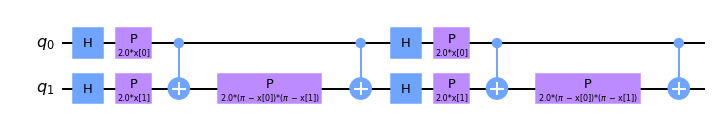


Quantum kernel matrices:



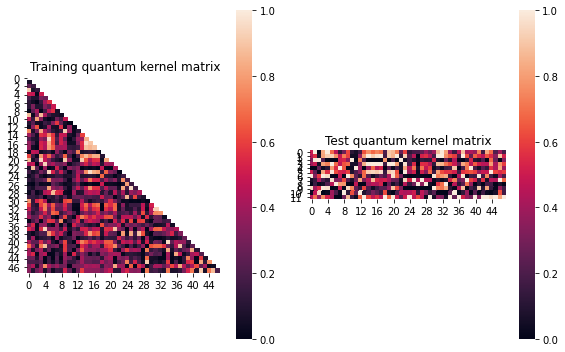


SVM with quantum kernel trained!


Test set performance:


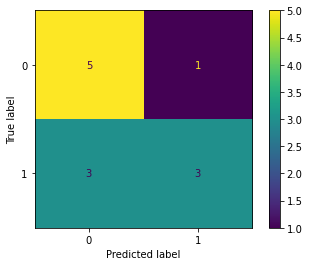

              precision    recall  f1-score   support

           0       0.62      0.83      0.71         6
           1       0.75      0.50      0.60         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.04653616116973158
metric(s) 2: (00, 10, 11) = (0.3539185963928278, 0.29076832163278143, 0.32069036921219823)
metric 3: -2.844982490677746e-269


----> Kernel construction duration: 00:01:31


Combination 205/468
(Current range: 21/46)
			 reps : 2
			 paulis : ['XX', 'X']
			 entanglement : linear

Feature map:


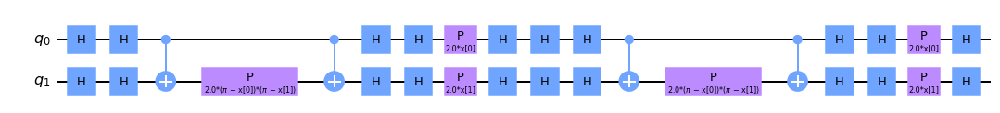


Quantum kernel matrices:



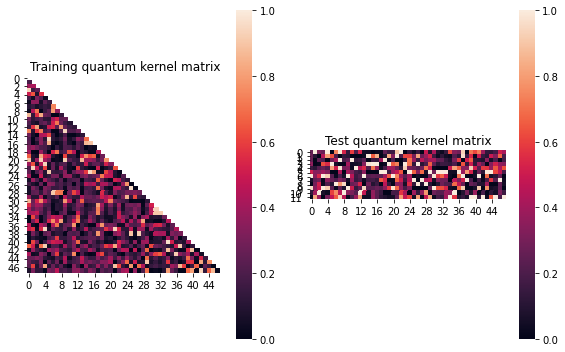


SVM with quantum kernel trained!


Test set performance:


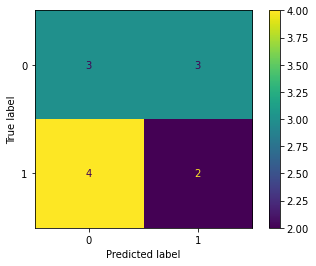

              precision    recall  f1-score   support

           0       0.43      0.50      0.46         6
           1       0.40      0.33      0.36         6

    accuracy                           0.42        12
   macro avg       0.41      0.42      0.41        12
weighted avg       0.41      0.42      0.41        12


metric 1: 0.05733851085899522
metric(s) 2: (00, 10, 11) = (0.31281939221849137, 0.2511093745159616, 0.3040763785314222)
metric 3: 3.3102918868991154e-287


----> Kernel construction duration: 00:01:25


Combination 206/468
(Current range: 22/46)
			 reps : 2
			 paulis : ['XX', 'Y']
			 entanglement : linear

Feature map:


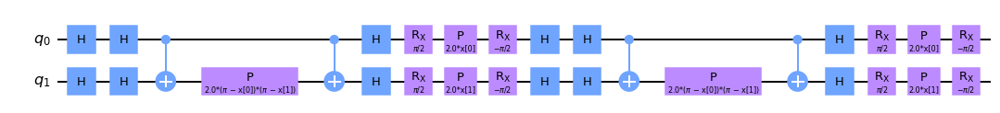


Quantum kernel matrices:



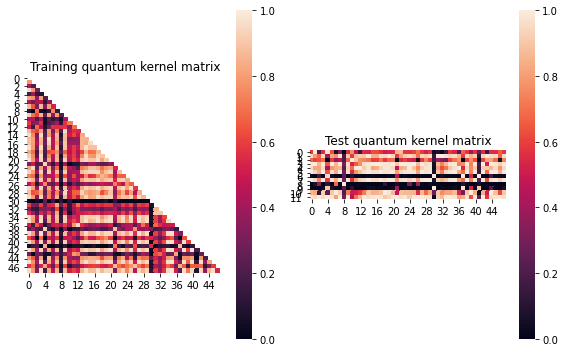


SVM with quantum kernel trained!


Test set performance:


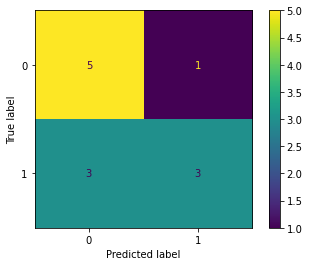

              precision    recall  f1-score   support

           0       0.62      0.83      0.71         6
           1       0.75      0.50      0.60         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.02997859902679223
metric(s) 2: (00, 10, 11) = (0.5828042658496836, 0.5381205260671769, 0.5533939843382546)
metric 3: 3.7326491580709946e-302


----> Kernel construction duration: 00:01:35


Combination 207/468
(Current range: 23/46)
			 reps : 2
			 paulis : ['XX', 'Z']
			 entanglement : linear

Feature map:


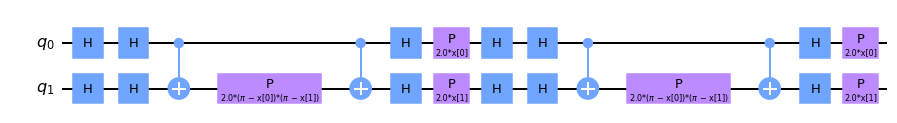


Quantum kernel matrices:



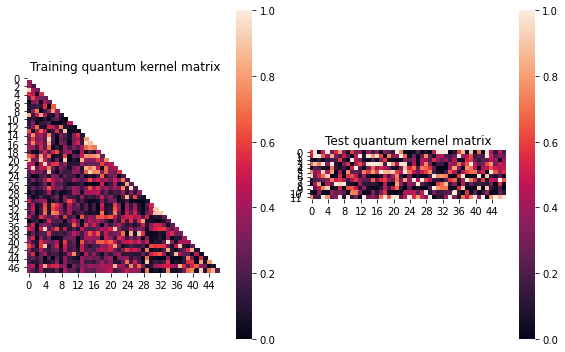


SVM with quantum kernel trained!


Test set performance:


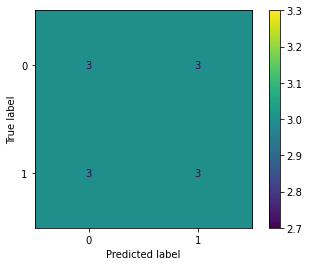

              precision    recall  f1-score   support

           0       0.50      0.50      0.50         6
           1       0.50      0.50      0.50         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.50        12
weighted avg       0.50      0.50      0.50        12


metric 1: 0.08000759010643088
metric(s) 2: (00, 10, 11) = (0.3711222307747026, 0.27251278895983233, 0.3339185273578239)
metric 3: 1.0506753408963164e-267


----> Kernel construction duration: 00:01:30


Combination 208/468
(Current range: 24/46)
			 reps : 2
			 paulis : ['XX', 'XX']
			 entanglement : linear

Feature map:


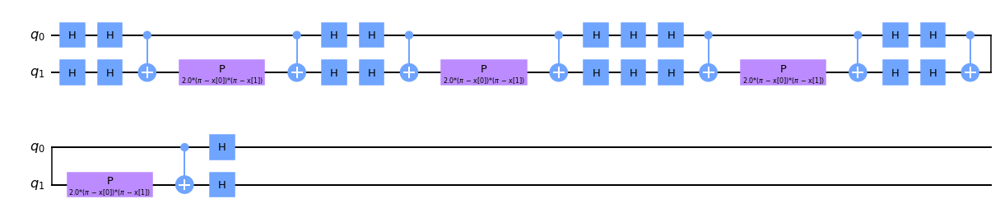


Quantum kernel matrices:



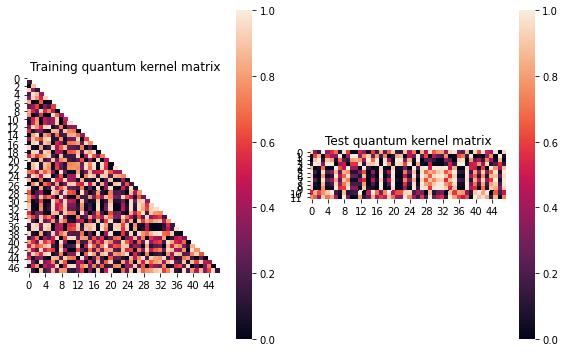


SVM with quantum kernel trained!


Test set performance:


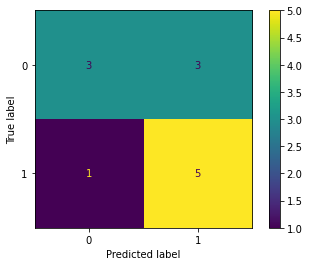

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:01:00


Combination 209/468
(Current range: 25/46)
			 reps : 2
			 paulis : ['XX', 'XY']
			 entanglement : linear

Feature map:


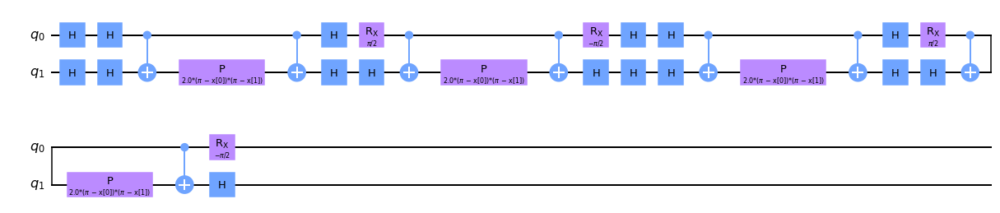


Quantum kernel matrices:



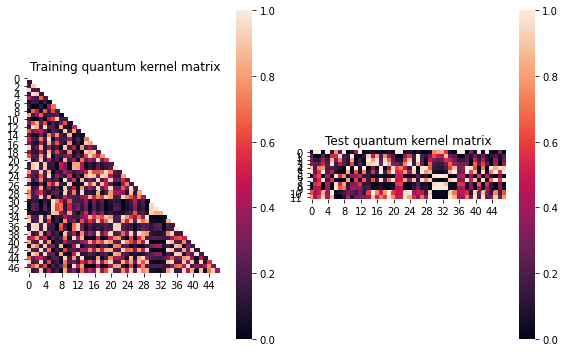


SVM with quantum kernel trained!


Test set performance:


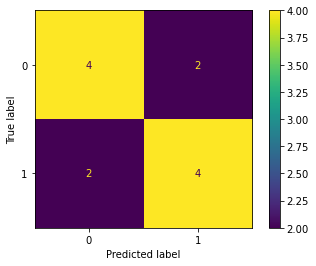

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.020819981165750567
metric(s) 2: (00, 10, 11) = (0.38690405180811255, 0.377510452567275, 0.40975681565793853)
metric 3: -0.0


----> Kernel construction duration: 00:01:50


Combination 210/468
(Current range: 26/46)
			 reps : 2
			 paulis : ['XX', 'XZ']
			 entanglement : linear

Feature map:


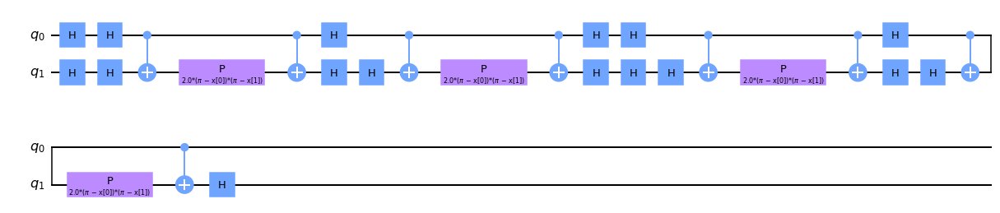


Quantum kernel matrices:



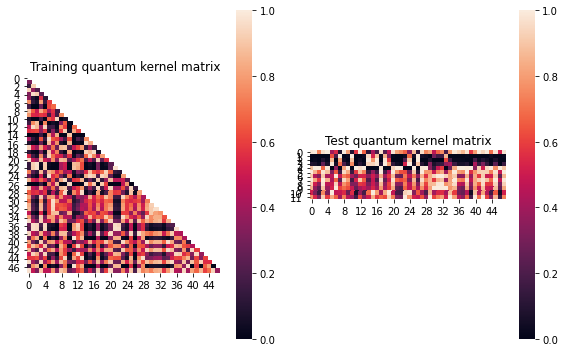


SVM with quantum kernel trained!


Test set performance:


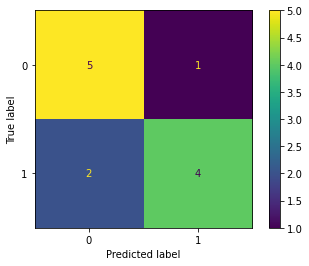

              precision    recall  f1-score   support

           0       0.71      0.83      0.77         6
           1       0.80      0.67      0.73         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.014484628653773868
metric(s) 2: (00, 10, 11) = (0.4444930658018248, 0.48075368286148035, 0.5459835572286836)
metric 3: -0.0


----> Kernel construction duration: 00:01:44


Combination 211/468
(Current range: 27/46)
			 reps : 2
			 paulis : ['XX', 'YX']
			 entanglement : linear

Feature map:


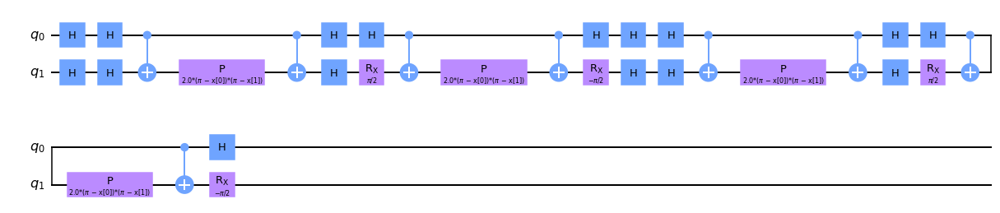


Quantum kernel matrices:



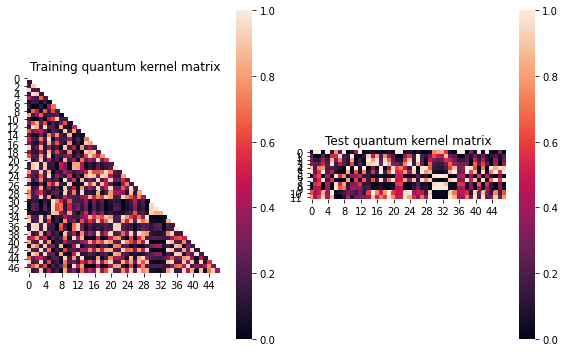


SVM with quantum kernel trained!


Test set performance:


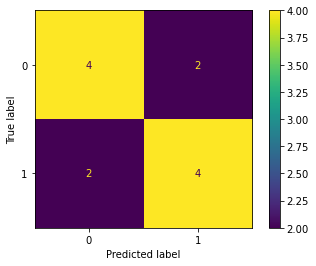

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.020819981165750567
metric(s) 2: (00, 10, 11) = (0.38690405180811255, 0.377510452567275, 0.40975681565793853)
metric 3: -0.0


----> Kernel construction duration: 00:01:59


Combination 212/468
(Current range: 28/46)
			 reps : 2
			 paulis : ['XX', 'YY']
			 entanglement : linear

Feature map:


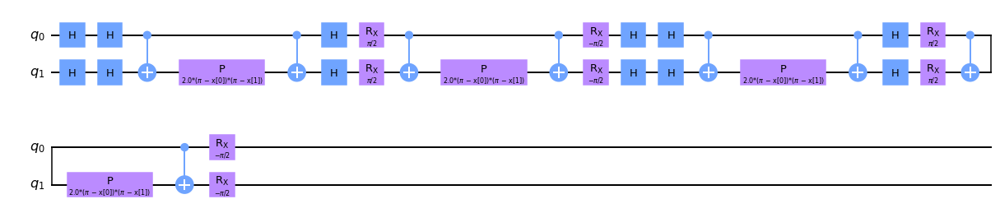


Quantum kernel matrices:



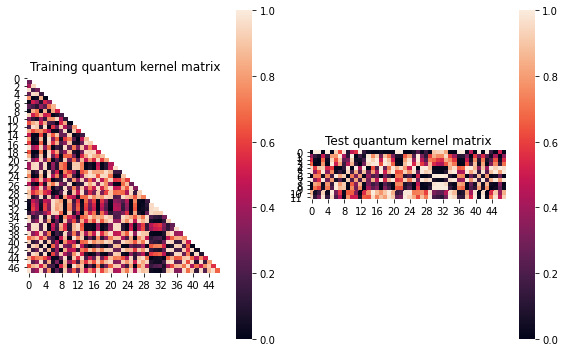


SVM with quantum kernel trained!


Test set performance:


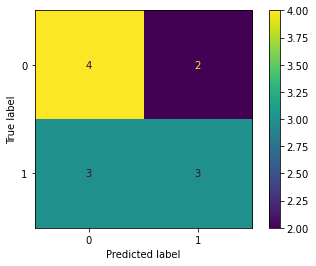

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:02:17


Combination 213/468
(Current range: 29/46)
			 reps : 2
			 paulis : ['XX', 'YZ']
			 entanglement : linear

Feature map:


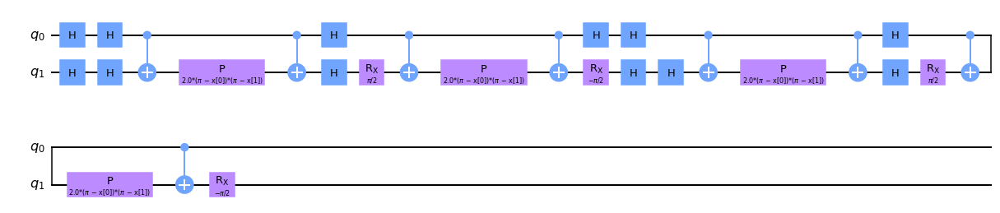


Quantum kernel matrices:



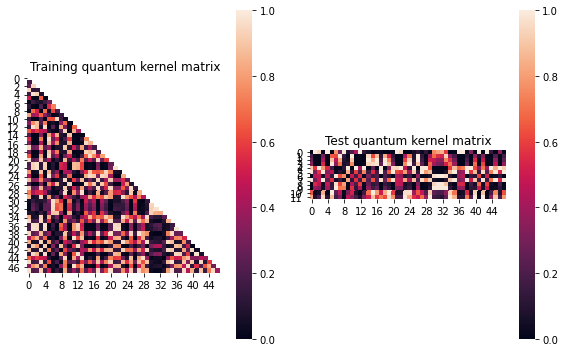


SVM with quantum kernel trained!


Test set performance:


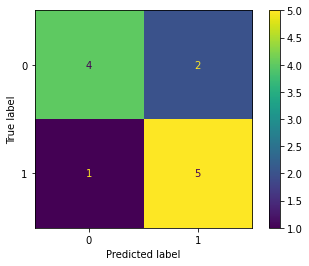

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.017158093659545015
metric(s) 2: (00, 10, 11) = (0.3893823105337397, 0.38630239711931363, 0.4175386710239776)
metric 3: -0.0


----> Kernel construction duration: 00:02:12


Combination 214/468
(Current range: 30/46)
			 reps : 2
			 paulis : ['XX', 'ZX']
			 entanglement : linear

Feature map:


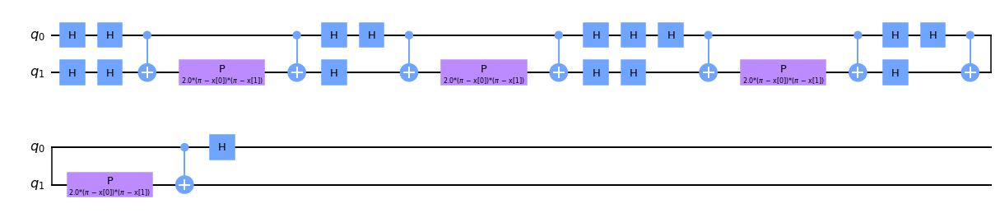


Quantum kernel matrices:



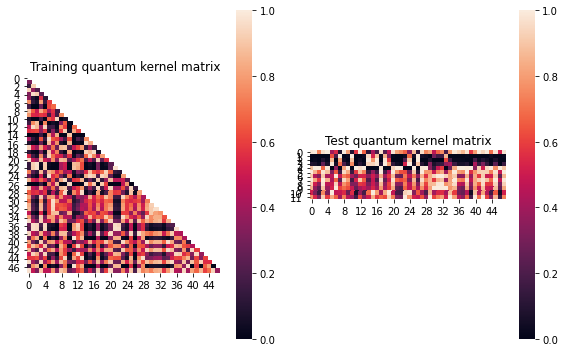


SVM with quantum kernel trained!


Test set performance:


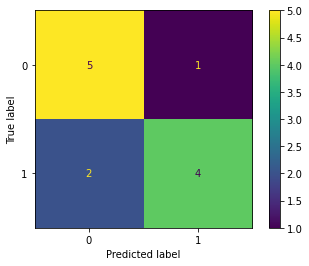

              precision    recall  f1-score   support

           0       0.71      0.83      0.77         6
           1       0.80      0.67      0.73         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.014484628653773868
metric(s) 2: (00, 10, 11) = (0.4444930658018248, 0.48075368286148035, 0.5459835572286836)
metric 3: -0.0


----> Kernel construction duration: 00:01:40


Combination 215/468
(Current range: 31/46)
			 reps : 2
			 paulis : ['XX', 'ZY']
			 entanglement : linear

Feature map:


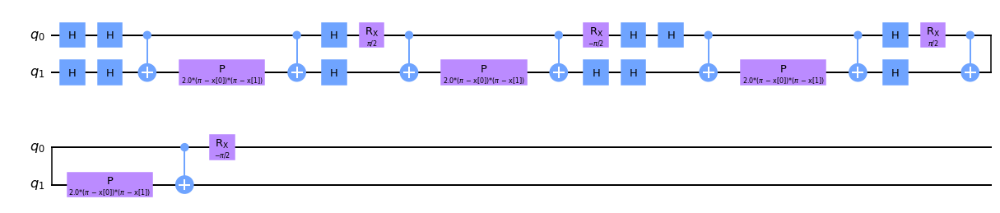


Quantum kernel matrices:



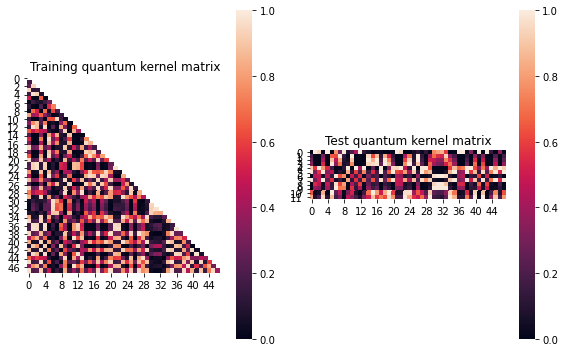


SVM with quantum kernel trained!


Test set performance:


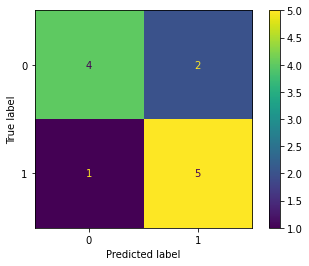

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.017158093659545015
metric(s) 2: (00, 10, 11) = (0.3893823105337397, 0.38630239711931363, 0.4175386710239776)
metric 3: -0.0


----> Kernel construction duration: 00:02:10


Combination 216/468
(Current range: 32/46)
			 reps : 2
			 paulis : ['XX', 'ZZ']
			 entanglement : linear

Feature map:


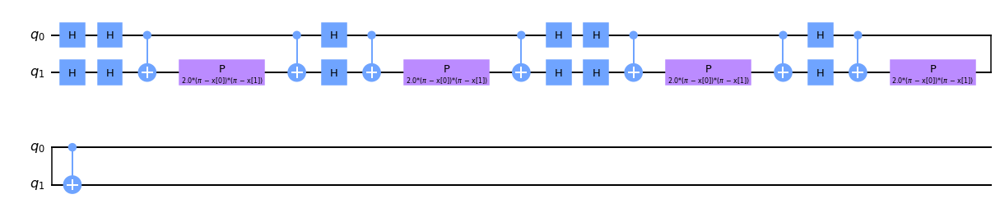


Quantum kernel matrices:



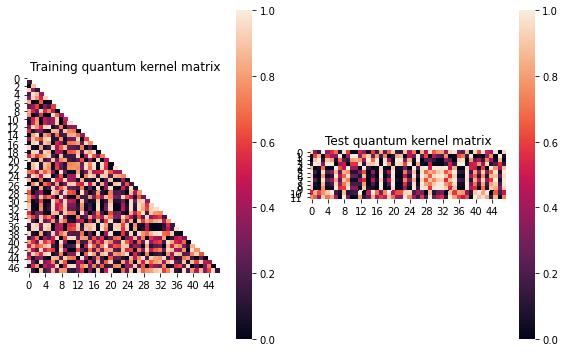


SVM with quantum kernel trained!


Test set performance:


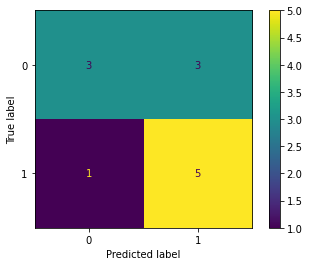

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:01:43


Combination 217/468
(Current range: 33/46)
			 reps : 2
			 paulis : ['XY', 'X']
			 entanglement : linear

Feature map:


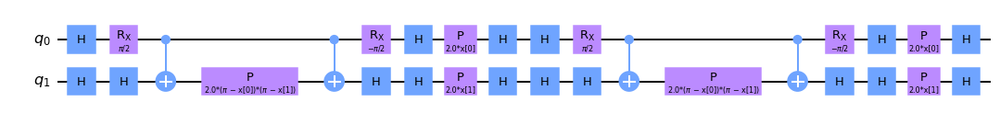


Quantum kernel matrices:



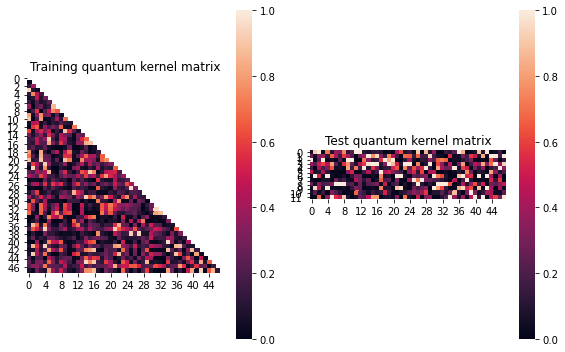


SVM with quantum kernel trained!


Test set performance:


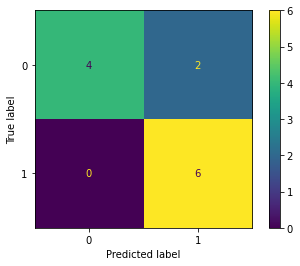

              precision    recall  f1-score   support

           0       1.00      0.67      0.80         6
           1       0.75      1.00      0.86         6

    accuracy                           0.83        12
   macro avg       0.88      0.83      0.83        12
weighted avg       0.88      0.83      0.83        12


metric 1: 0.04191304765622206
metric(s) 2: (00, 10, 11) = (0.3207500559364418, 0.2640536657365364, 0.2911833708490751)
metric 3: 4.1123845874905316e-272


----> Kernel construction duration: 00:01:44


Combination 218/468
(Current range: 34/46)
			 reps : 2
			 paulis : ['XY', 'Y']
			 entanglement : linear

Feature map:


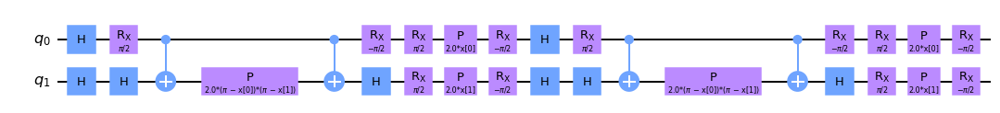


Quantum kernel matrices:



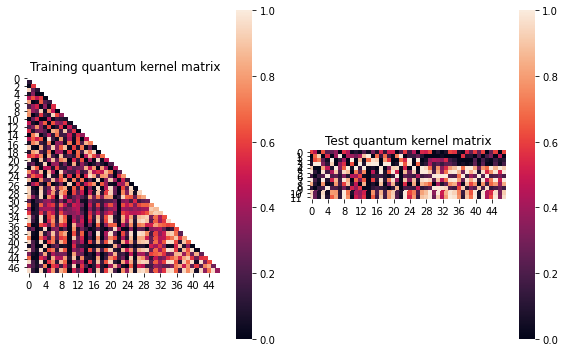


SVM with quantum kernel trained!


Test set performance:


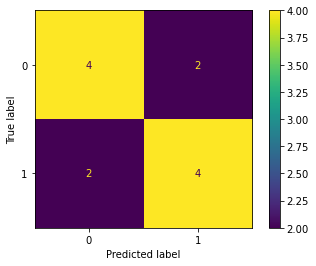

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.10059058871656867
metric(s) 2: (00, 10, 11) = (0.39459289673801545, 0.36983676978824526, 0.5462618202716124)
metric 3: 5.389e-320


----> Kernel construction duration: 00:01:48


Combination 219/468
(Current range: 35/46)
			 reps : 2
			 paulis : ['XY', 'Z']
			 entanglement : linear

Feature map:


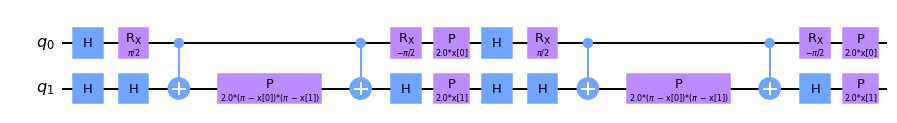


Quantum kernel matrices:



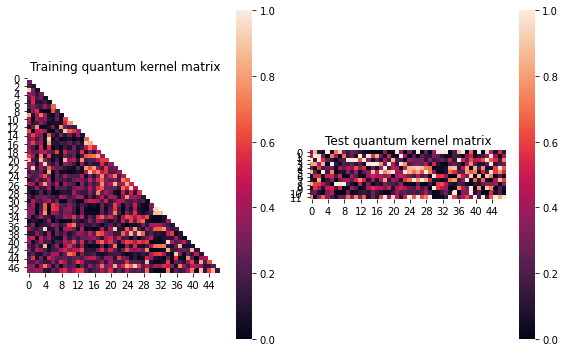


SVM with quantum kernel trained!


Test set performance:


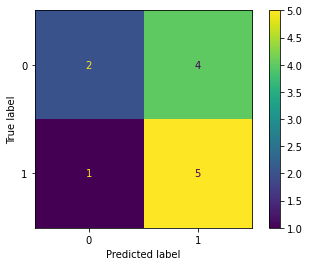

              precision    recall  f1-score   support

           0       0.67      0.33      0.44         6
           1       0.56      0.83      0.67         6

    accuracy                           0.58        12
   macro avg       0.61      0.58      0.56        12
weighted avg       0.61      0.58      0.56        12


metric 1: 0.06869615531760503
metric(s) 2: (00, 10, 11) = (0.3272624763004109, 0.26372606858726805, 0.33758197150933533)
metric 3: -7.67175642355491e-271


----> Kernel construction duration: 00:01:43


Combination 220/468
(Current range: 36/46)
			 reps : 2
			 paulis : ['XY', 'XX']
			 entanglement : linear

Feature map:


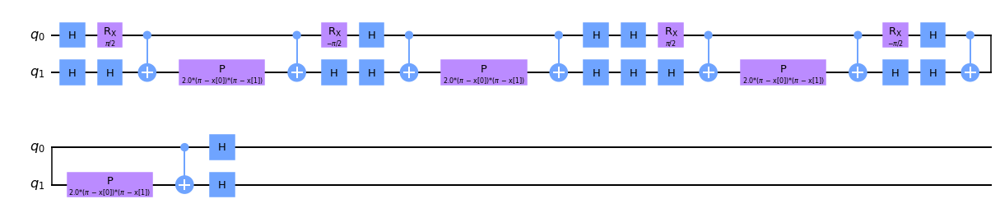


Quantum kernel matrices:



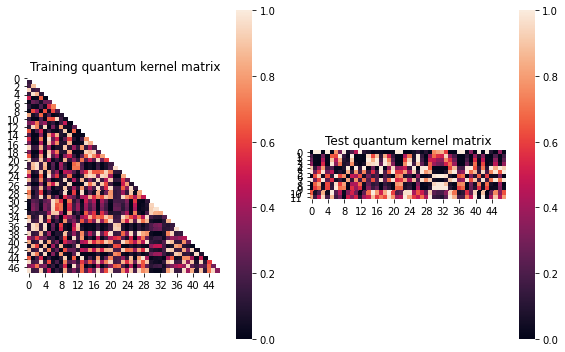


SVM with quantum kernel trained!


Test set performance:


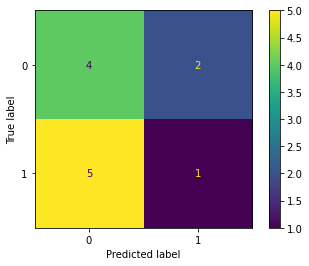

              precision    recall  f1-score   support

           0       0.44      0.67      0.53         6
           1       0.33      0.17      0.22         6

    accuracy                           0.42        12
   macro avg       0.39      0.42      0.38        12
weighted avg       0.39      0.42      0.38        12


metric 1: 0.018226151354367115
metric(s) 2: (00, 10, 11) = (0.36339829554254544, 0.36123089266840014, 0.3955157925029891)
metric 3: -5.605176862663e-311


----> Kernel construction duration: 00:02:10


Combination 221/468
(Current range: 37/46)
			 reps : 2
			 paulis : ['XY', 'XY']
			 entanglement : linear

Feature map:


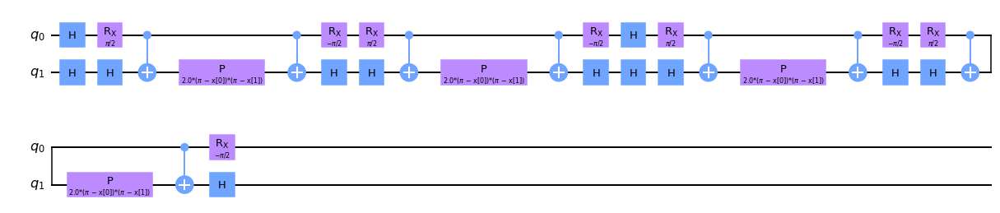


Quantum kernel matrices:



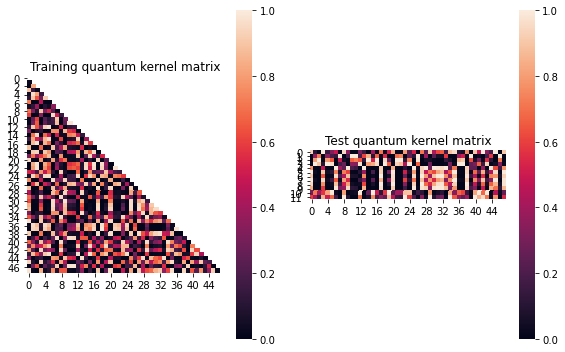


SVM with quantum kernel trained!


Test set performance:


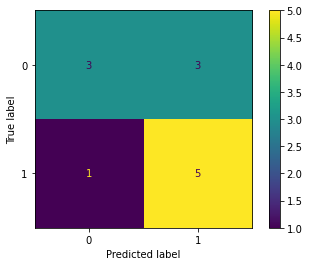

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05164114281543575
metric(s) 2: (00, 10, 11) = (0.39893140131459975, 0.35129610192754446, 0.40694308817136066)
metric 3: -0.0


----> Kernel construction duration: 00:01:23


Combination 222/468
(Current range: 38/46)
			 reps : 2
			 paulis : ['XY', 'XZ']
			 entanglement : linear

Feature map:


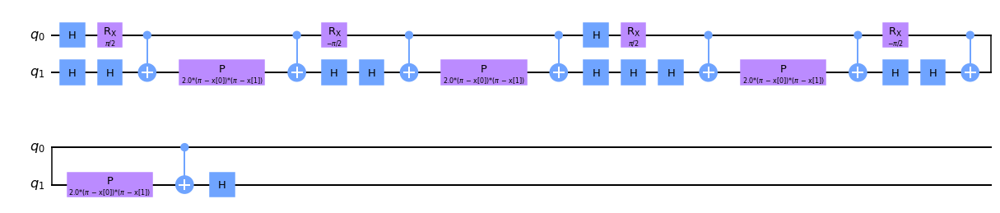


Quantum kernel matrices:



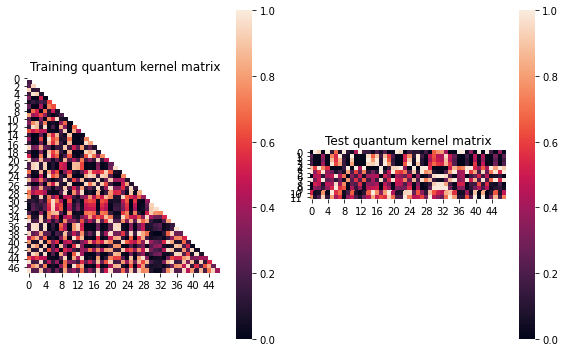


SVM with quantum kernel trained!


Test set performance:


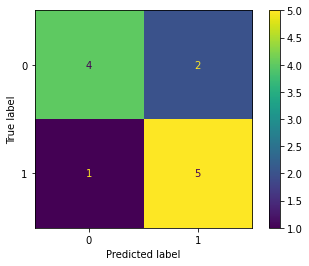

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01714470676160823
metric(s) 2: (00, 10, 11) = (0.38826697744744343, 0.3884532497269338, 0.42292893552964067)
metric 3: 3.5e-323


----> Kernel construction duration: 00:02:14


Combination 223/468
(Current range: 39/46)
			 reps : 2
			 paulis : ['XY', 'YX']
			 entanglement : linear

Feature map:


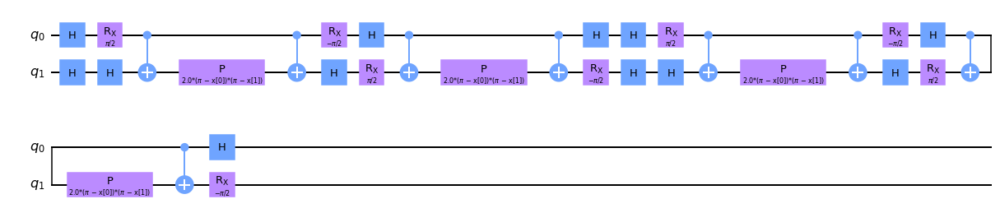


Quantum kernel matrices:



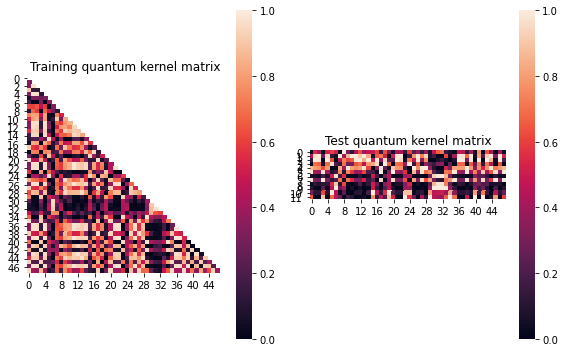


SVM with quantum kernel trained!


Test set performance:


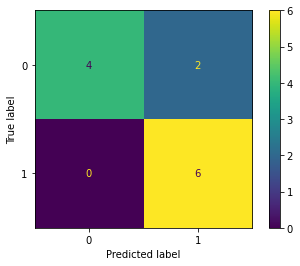

              precision    recall  f1-score   support

           0       1.00      0.67      0.80         6
           1       0.75      1.00      0.86         6

    accuracy                           0.83        12
   macro avg       0.88      0.83      0.83        12
weighted avg       0.88      0.83      0.83        12


metric 1: 0.028573107034362444
metric(s) 2: (00, 10, 11) = (0.5062730434334765, 0.4548814822874121, 0.46063613521007263)
metric 3: 0.0


----> Kernel construction duration: 00:02:35


Combination 224/468
(Current range: 40/46)
			 reps : 2
			 paulis : ['XY', 'YY']
			 entanglement : linear

Feature map:


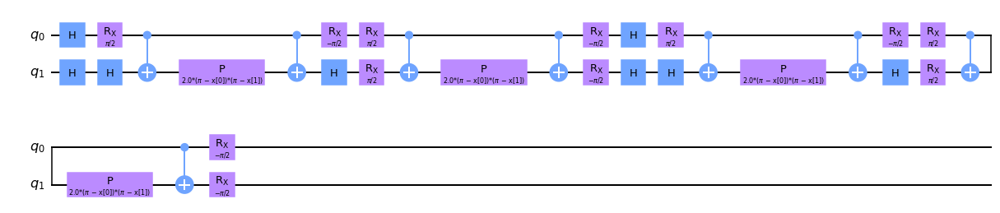


Quantum kernel matrices:



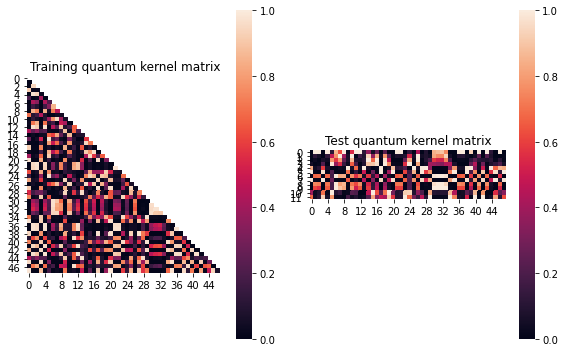


SVM with quantum kernel trained!


Test set performance:


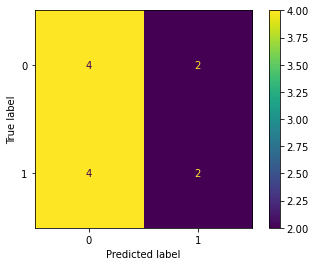

              precision    recall  f1-score   support

           0       0.50      0.67      0.57         6
           1       0.50      0.33      0.40         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.49        12
weighted avg       0.50      0.50      0.49        12


metric 1: 0.020638043218640045
metric(s) 2: (00, 10, 11) = (0.3217277462206748, 0.309835774132476, 0.3392198884815572)
metric 3: -0.0


----> Kernel construction duration: 00:02:12


Combination 225/468
(Current range: 41/46)
			 reps : 2
			 paulis : ['XY', 'YZ']
			 entanglement : linear

Feature map:


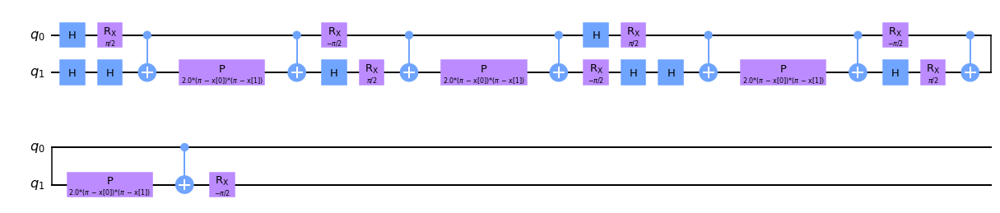


Quantum kernel matrices:



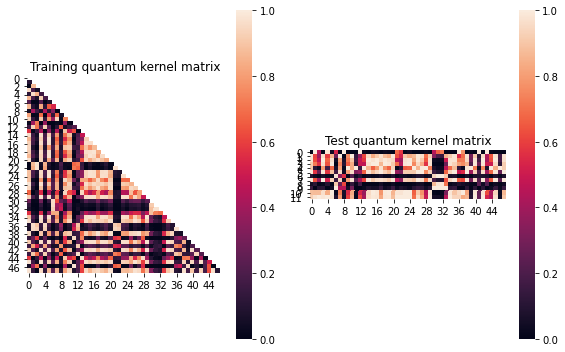


SVM with quantum kernel trained!


Test set performance:


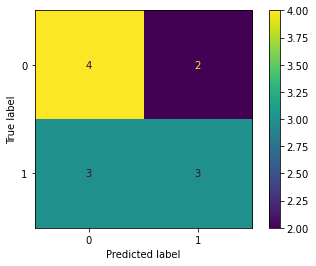

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.010410330558894787
metric(s) 2: (00, 10, 11) = (0.45081261028735586, 0.43257931628430285, 0.43516668339903947)
metric 3: 0.0


----> Kernel construction duration: 00:02:28


Combination 226/468
(Current range: 42/46)
			 reps : 2
			 paulis : ['XY', 'ZX']
			 entanglement : linear

Feature map:


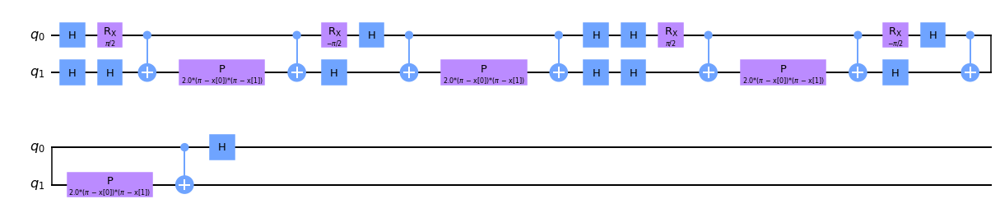


Quantum kernel matrices:



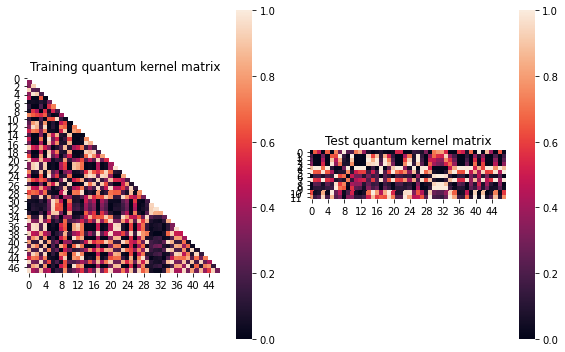


SVM with quantum kernel trained!


Test set performance:


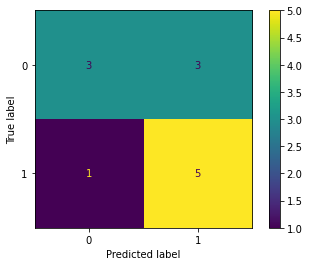

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.014508622780669556
metric(s) 2: (00, 10, 11) = (0.40220120793550673, 0.3986354911485682, 0.4240870199229689)
metric 3: 2e-323


----> Kernel construction duration: 00:02:19


Combination 227/468
(Current range: 43/46)
			 reps : 2
			 paulis : ['XY', 'ZY']
			 entanglement : linear

Feature map:


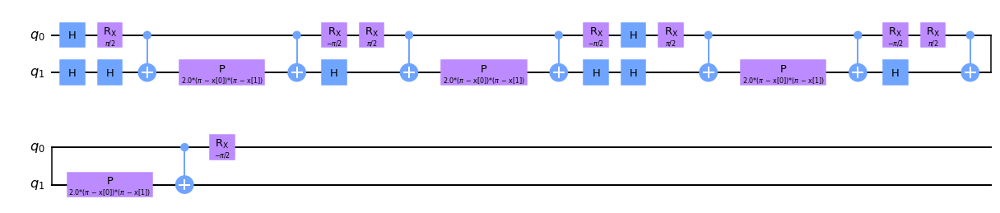


Quantum kernel matrices:



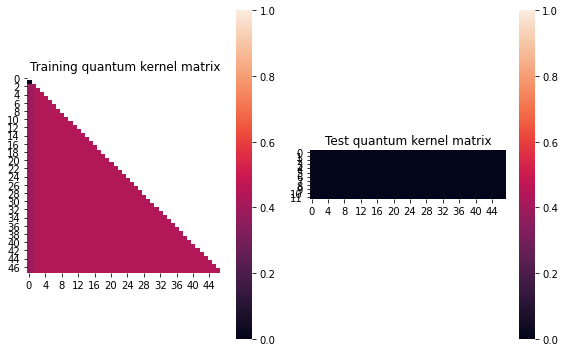


SVM with quantum kernel trained!


Test set performance:


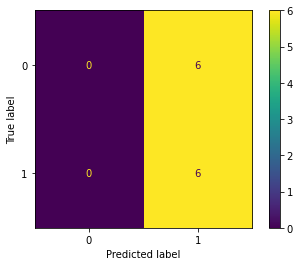

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:01:58


Combination 228/468
(Current range: 44/46)
			 reps : 2
			 paulis : ['XY', 'ZZ']
			 entanglement : linear

Feature map:


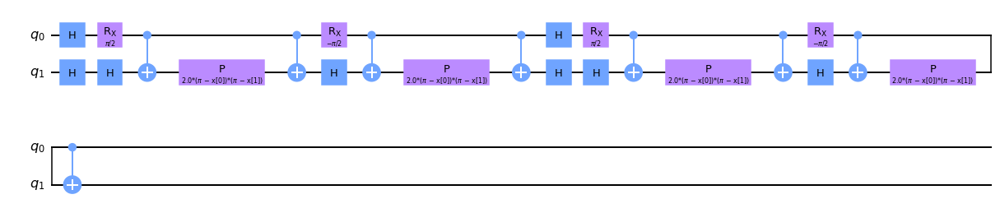


Quantum kernel matrices:



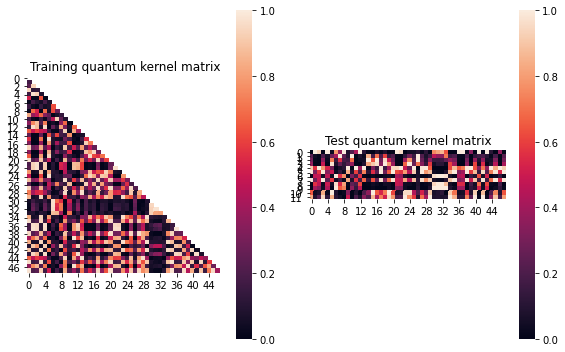


SVM with quantum kernel trained!


Test set performance:


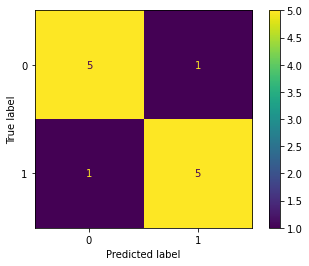

              precision    recall  f1-score   support

           0       0.83      0.83      0.83         6
           1       0.83      0.83      0.83         6

    accuracy                           0.83        12
   macro avg       0.83      0.83      0.83        12
weighted avg       0.83      0.83      0.83        12


metric 1: 0.01862277869020218
metric(s) 2: (00, 10, 11) = (0.36939658553037563, 0.37059454193864466, 0.409038055727318)
metric 3: -0.0


----> Kernel construction duration: 00:02:17


Combination 229/468
(Current range: 45/46)
			 reps : 2
			 paulis : ['XZ', 'X']
			 entanglement : linear

Feature map:


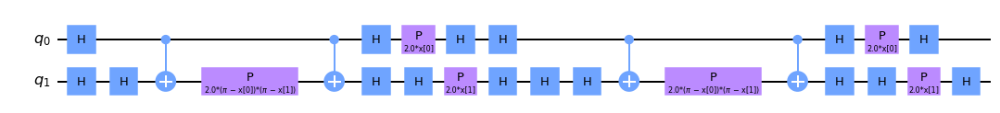


Quantum kernel matrices:



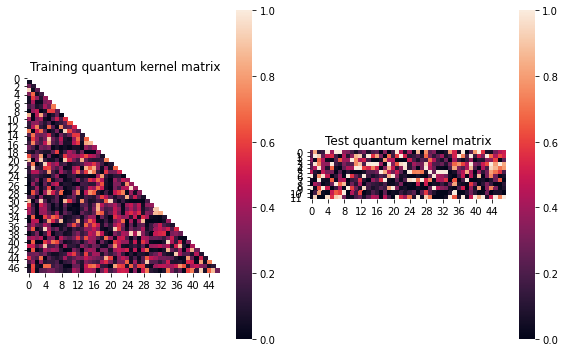


SVM with quantum kernel trained!


Test set performance:


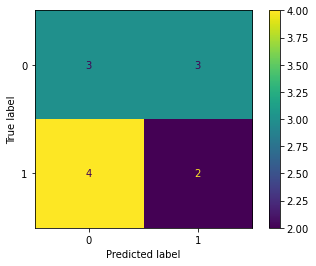

              precision    recall  f1-score   support

           0       0.43      0.50      0.46         6
           1       0.40      0.33      0.36         6

    accuracy                           0.42        12
   macro avg       0.41      0.42      0.41        12
weighted avg       0.41      0.42      0.41        12


metric 1: 0.06512809360307742
metric(s) 2: (00, 10, 11) = (0.336108413588364, 0.2652535261270159, 0.32465482587182265)
metric 3: 4.2476154312155165e-260


----> Kernel construction duration: 00:01:38


Combination 230/468
(Current range: 46/46)
			 reps : 2
			 paulis : ['XZ', 'Y']
			 entanglement : linear

Feature map:


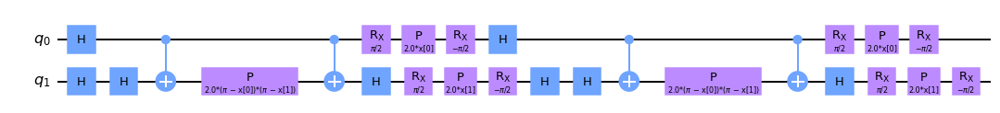


Quantum kernel matrices:



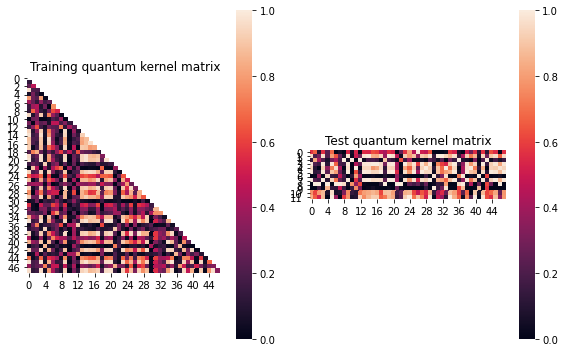


SVM with quantum kernel trained!


Test set performance:


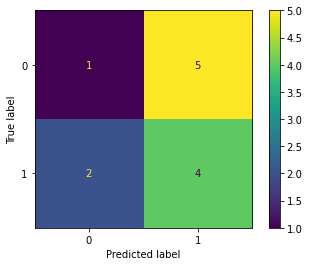

              precision    recall  f1-score   support

           0       0.33      0.17      0.22         6
           1       0.44      0.67      0.53         6

    accuracy                           0.42        12
   macro avg       0.39      0.42      0.38        12
weighted avg       0.39      0.42      0.38        12


metric 1: 0.026532287230735807
metric(s) 2: (00, 10, 11) = (0.40807521805924973, 0.38620811825311235, 0.4174055929084466)
metric 3: 3.596522373968816e-262


----> Kernel construction duration: 00:01:53


In [28]:
j=4
results.append(run_kernel_evaluation(X, X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 231/468
(Current range: 1/46)
			 reps : 2
			 paulis : ['XZ', 'Z']
			 entanglement : linear

Feature map:


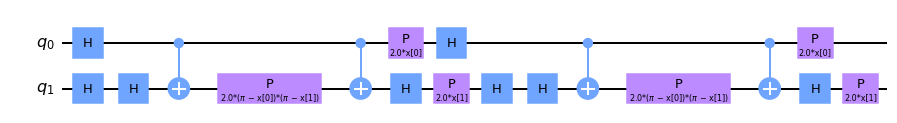


Quantum kernel matrices:



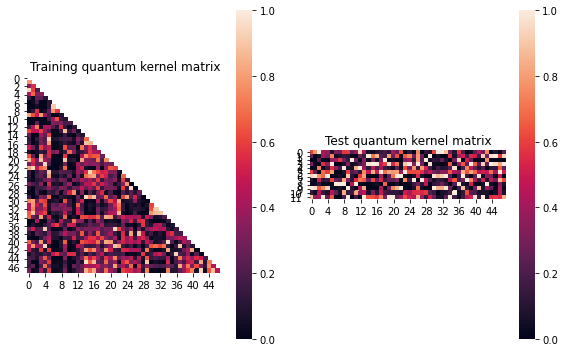


SVM with quantum kernel trained!


Test set performance:


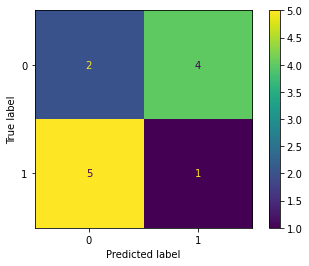

              precision    recall  f1-score   support

           0       0.29      0.33      0.31         6
           1       0.20      0.17      0.18         6

    accuracy                           0.25        12
   macro avg       0.24      0.25      0.24        12
weighted avg       0.24      0.25      0.24        12


metric 1: 0.03192166923052853
metric(s) 2: (00, 10, 11) = (0.31693217304269, 0.285800531368426, 0.31851222815521896)
metric 3: 1.0633400482237152e-269


----> Kernel construction duration: 00:01:40


Combination 232/468
(Current range: 2/46)
			 reps : 2
			 paulis : ['XZ', 'XX']
			 entanglement : linear

Feature map:


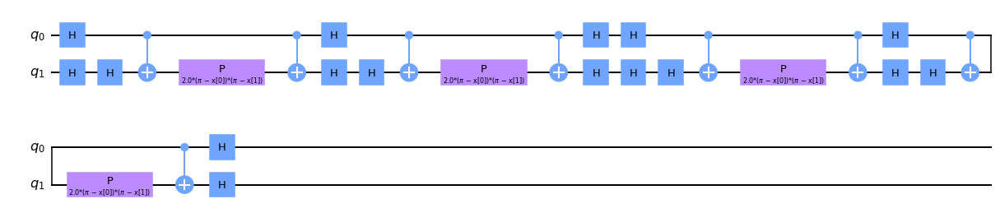


Quantum kernel matrices:



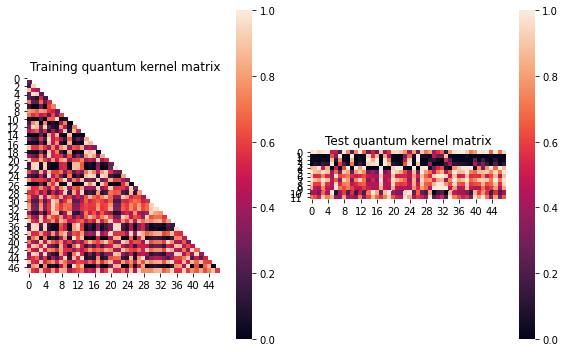


SVM with quantum kernel trained!


Test set performance:


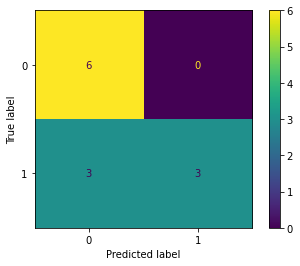

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.006104797684579943
metric(s) 2: (00, 10, 11) = (0.4715509934872962, 0.5198968356611414, 0.5560330824658267)
metric 3: -0.0


----> Kernel construction duration: 00:01:49


Combination 233/468
(Current range: 3/46)
			 reps : 2
			 paulis : ['XZ', 'XY']
			 entanglement : linear

Feature map:


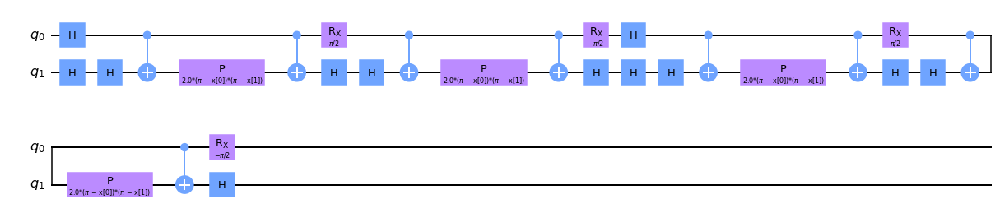


Quantum kernel matrices:



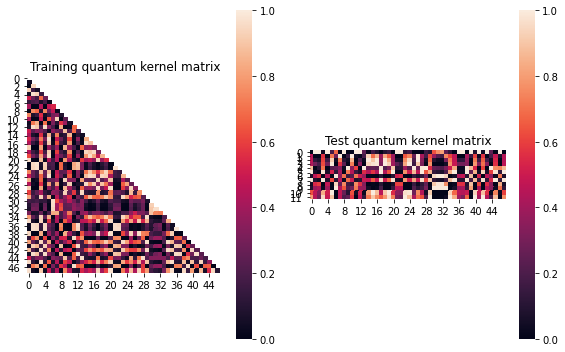


SVM with quantum kernel trained!


Test set performance:


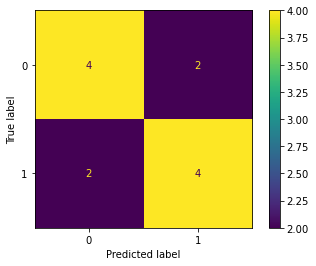

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.019944755391278157
metric(s) 2: (00, 10, 11) = (0.39661997085764233, 0.37878436956387684, 0.40083827905266767)
metric 3: 9.843111113956182e-307


----> Kernel construction duration: 00:02:04


Combination 234/468
(Current range: 4/46)
			 reps : 2
			 paulis : ['XZ', 'XZ']
			 entanglement : linear

Feature map:


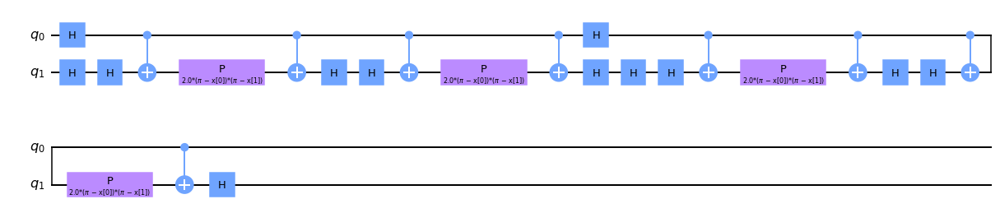


Quantum kernel matrices:



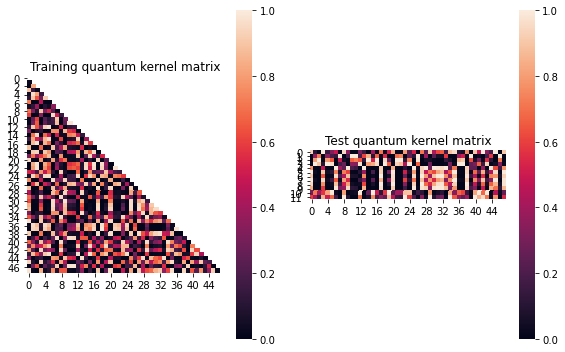


SVM with quantum kernel trained!


Test set performance:


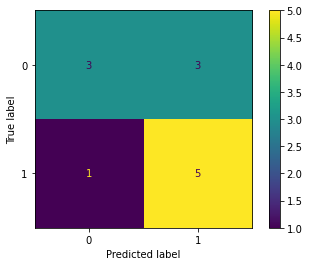

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05164114281543575
metric(s) 2: (00, 10, 11) = (0.39893140131459975, 0.35129610192754446, 0.40694308817136066)
metric 3: -0.0


----> Kernel construction duration: 00:01:14


Combination 235/468
(Current range: 5/46)
			 reps : 2
			 paulis : ['XZ', 'YX']
			 entanglement : linear

Feature map:


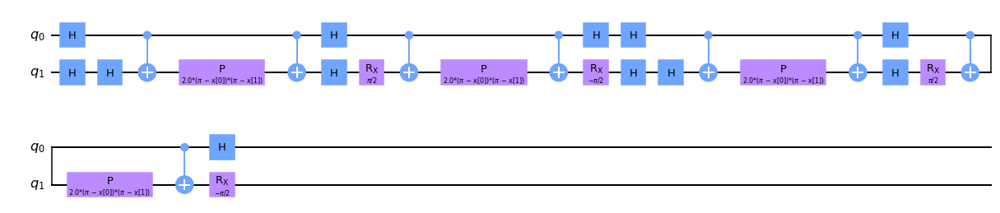


Quantum kernel matrices:



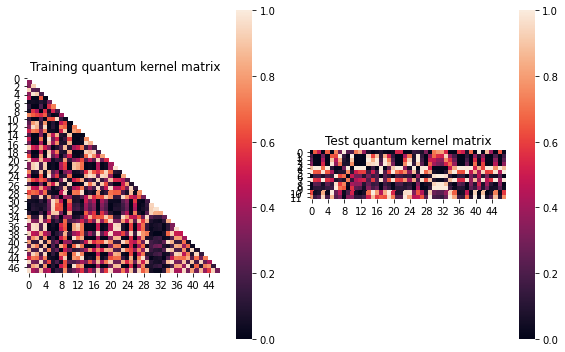


SVM with quantum kernel trained!


Test set performance:


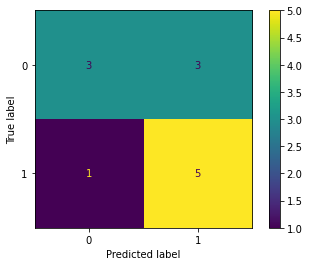

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.014508622780669556
metric(s) 2: (00, 10, 11) = (0.40220120793550673, 0.3986354911485682, 0.4240870199229689)
metric 3: 2e-323


----> Kernel construction duration: 00:02:16


Combination 236/468
(Current range: 6/46)
			 reps : 2
			 paulis : ['XZ', 'YY']
			 entanglement : linear

Feature map:


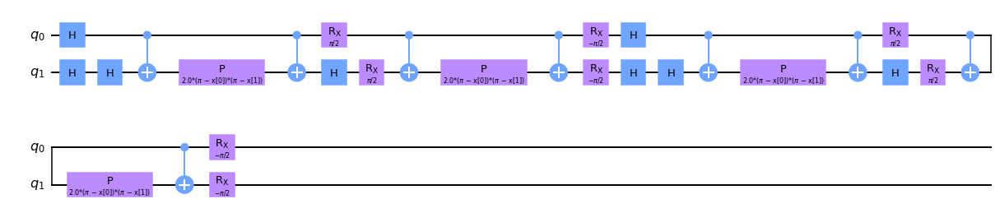


Quantum kernel matrices:



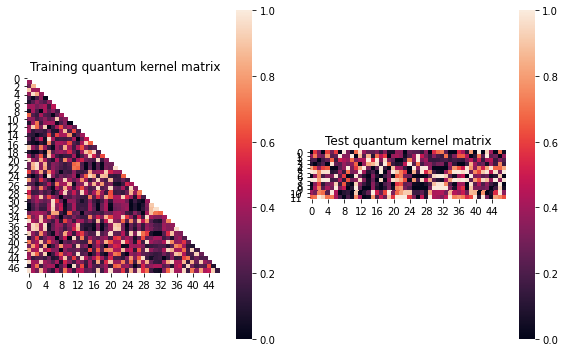


SVM with quantum kernel trained!


Test set performance:


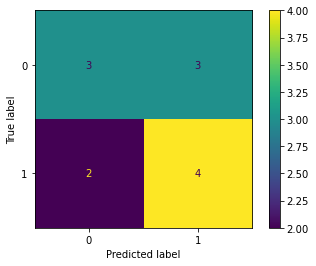

              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.57      0.67      0.62         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.015147550648587027
metric(s) 2: (00, 10, 11) = (0.38231815360524624, 0.3787983004776438, 0.40557354864721545)
metric 3: -0.0


----> Kernel construction duration: 00:02:23


Combination 237/468
(Current range: 7/46)
			 reps : 2
			 paulis : ['XZ', 'YZ']
			 entanglement : linear

Feature map:


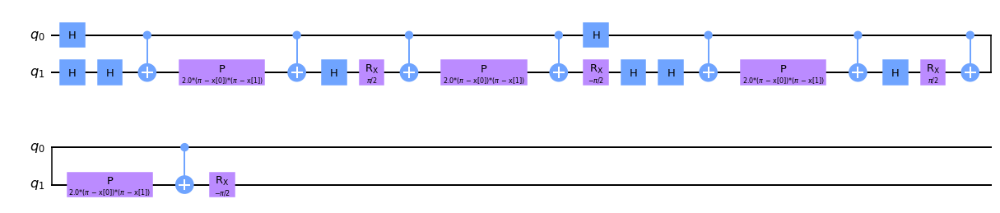


Quantum kernel matrices:



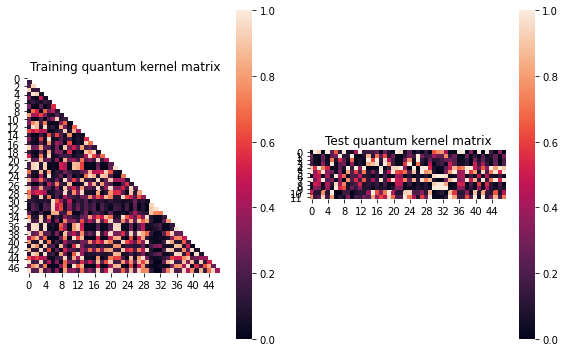


SVM with quantum kernel trained!


Test set performance:


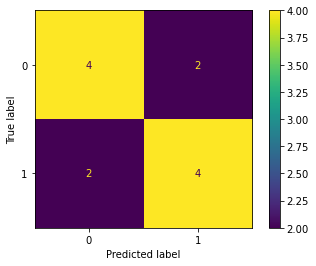

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.01676303407063312
metric(s) 2: (00, 10, 11) = (0.3509277965872475, 0.3527606263709832, 0.3881195242959852)
metric 3: 2e-321


----> Kernel construction duration: 00:02:06


Combination 238/468
(Current range: 8/46)
			 reps : 2
			 paulis : ['XZ', 'ZX']
			 entanglement : linear

Feature map:


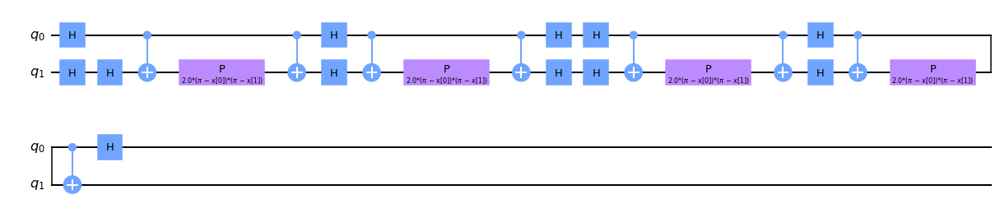


Quantum kernel matrices:



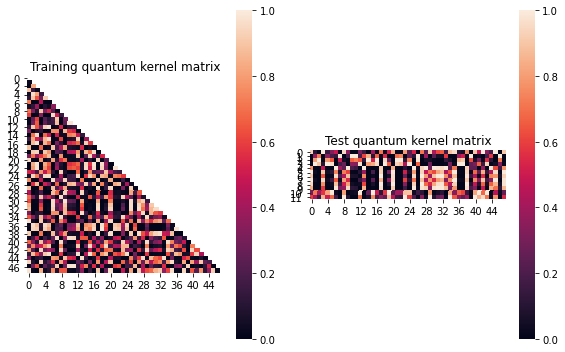


SVM with quantum kernel trained!


Test set performance:


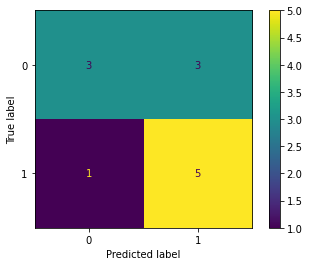

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05164114281543575
metric(s) 2: (00, 10, 11) = (0.39893140131459975, 0.35129610192754446, 0.40694308817136066)
metric 3: -0.0


----> Kernel construction duration: 00:01:56


Combination 239/468
(Current range: 9/46)
			 reps : 2
			 paulis : ['XZ', 'ZY']
			 entanglement : linear

Feature map:


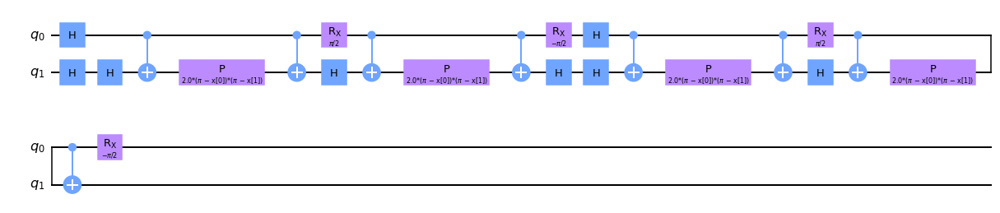


Quantum kernel matrices:



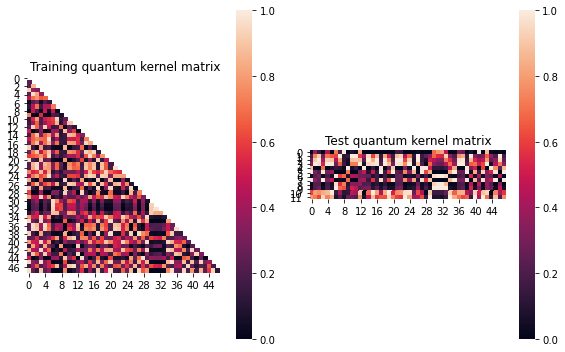


SVM with quantum kernel trained!


Test set performance:


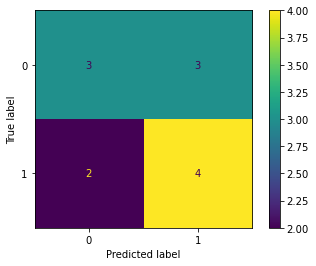

              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.57      0.67      0.62         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.04075779448944955
metric(s) 2: (00, 10, 11) = (0.4775559604068847, 0.4092433610665665, 0.42244635070514747)
metric 3: 0.0


----> Kernel construction duration: 00:02:15


Combination 240/468
(Current range: 10/46)
			 reps : 2
			 paulis : ['XZ', 'ZZ']
			 entanglement : linear

Feature map:


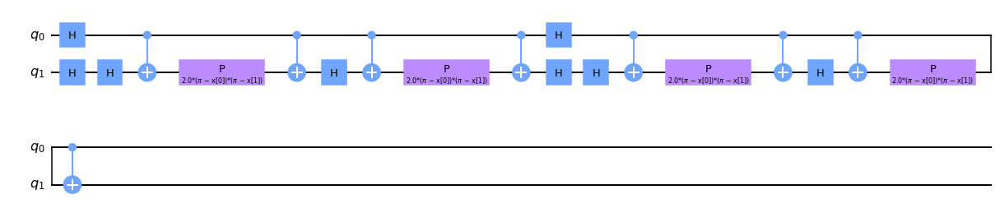


Quantum kernel matrices:



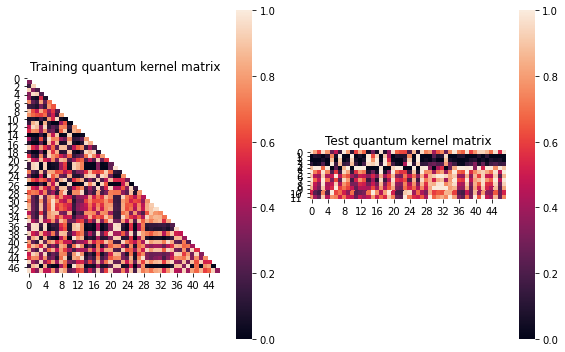


SVM with quantum kernel trained!


Test set performance:


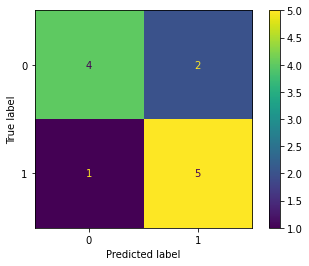

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.009427194558133789
metric(s) 2: (00, 10, 11) = (0.4688597337117616, 0.5061784560971924, 0.5623515675988906)
metric 3: 0.0


----> Kernel construction duration: 00:01:56


Combination 241/468
(Current range: 11/46)
			 reps : 2
			 paulis : ['YX', 'X']
			 entanglement : linear

Feature map:


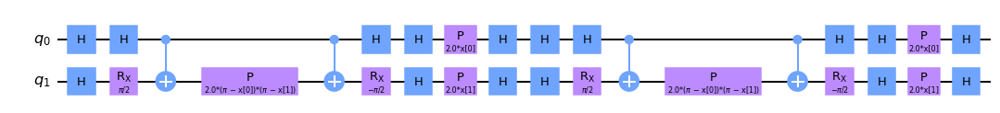


Quantum kernel matrices:



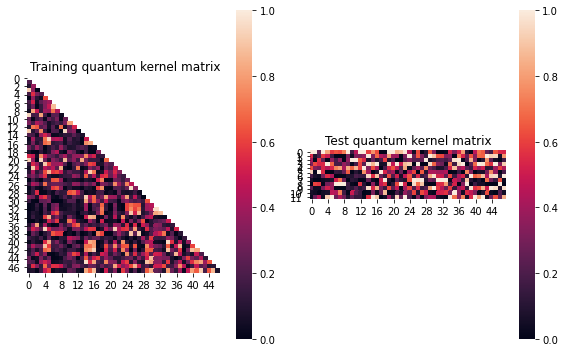


SVM with quantum kernel trained!


Test set performance:


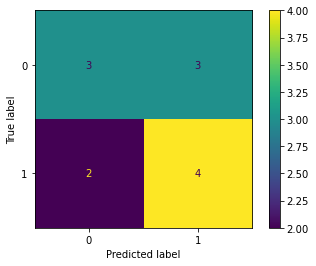

              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.57      0.67      0.62         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.0945659375927825
metric(s) 2: (00, 10, 11) = (0.3196828319309922, 0.2469865727332057, 0.3634221887209843)
metric 3: 2.5319446817743143e-285


----> Kernel construction duration: 00:01:40


Combination 242/468
(Current range: 12/46)
			 reps : 2
			 paulis : ['YX', 'Y']
			 entanglement : linear

Feature map:


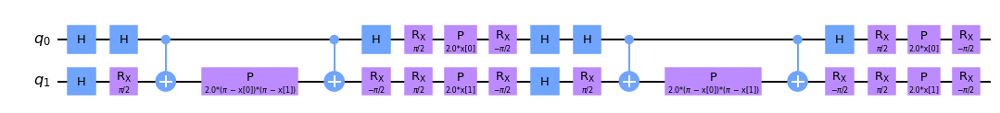


Quantum kernel matrices:



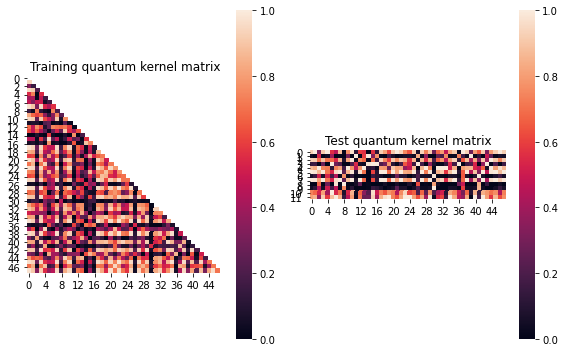


SVM with quantum kernel trained!


Test set performance:


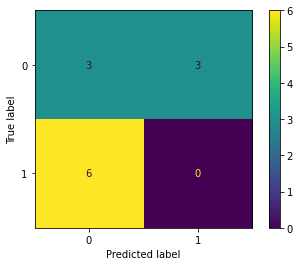

              precision    recall  f1-score   support

           0       0.33      0.50      0.40         6
           1       0.00      0.00      0.00         6

    accuracy                           0.25        12
   macro avg       0.17      0.25      0.20        12
weighted avg       0.17      0.25      0.20        12


metric 1: 0.012966589739766443
metric(s) 2: (00, 10, 11) = (0.474159505971694, 0.47122769153948024, 0.49422905658679933)
metric 3: 3.96339e-318


----> Kernel construction duration: 00:01:39


Combination 243/468
(Current range: 13/46)
			 reps : 2
			 paulis : ['YX', 'Z']
			 entanglement : linear

Feature map:


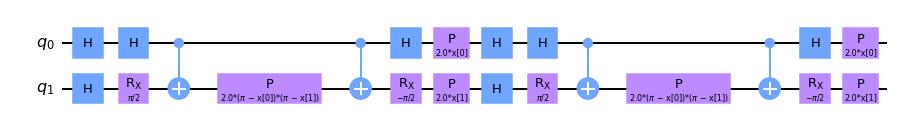


Quantum kernel matrices:



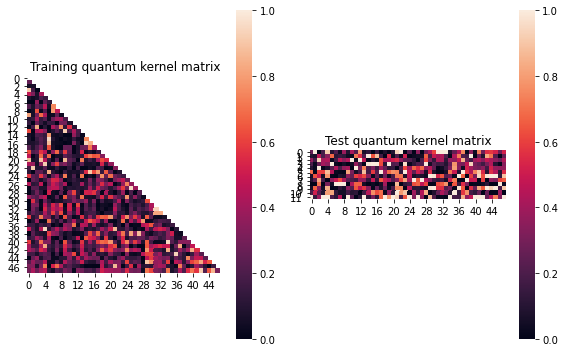


SVM with quantum kernel trained!


Test set performance:


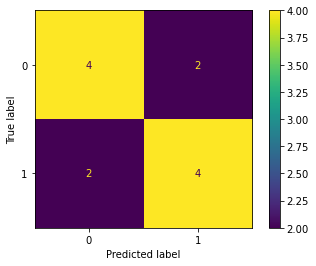

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.05166619314953669
metric(s) 2: (00, 10, 11) = (0.27583163406255423, 0.2529918758127303, 0.3334845038619798)
metric 3: -1.9059401583012928e-271


----> Kernel construction duration: 00:01:41


Combination 244/468
(Current range: 14/46)
			 reps : 2
			 paulis : ['YX', 'XX']
			 entanglement : linear

Feature map:


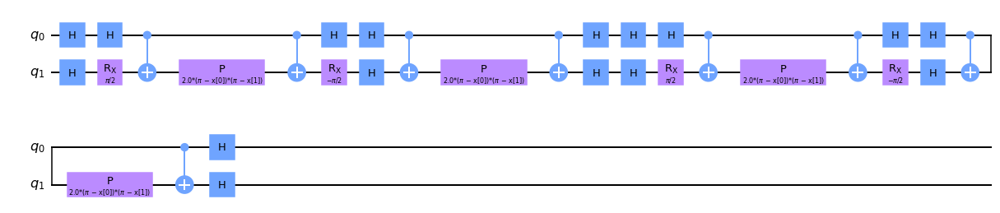


Quantum kernel matrices:



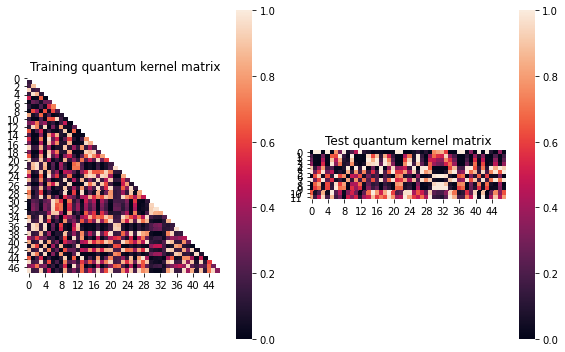


SVM with quantum kernel trained!


Test set performance:


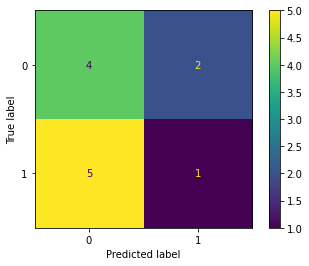

              precision    recall  f1-score   support

           0       0.44      0.67      0.53         6
           1       0.33      0.17      0.22         6

    accuracy                           0.42        12
   macro avg       0.39      0.42      0.38        12
weighted avg       0.39      0.42      0.38        12


metric 1: 0.018226151354367115
metric(s) 2: (00, 10, 11) = (0.36339829554254544, 0.36123089266840014, 0.3955157925029891)
metric 3: -5.605176862663e-311


----> Kernel construction duration: 00:01:59


Combination 245/468
(Current range: 15/46)
			 reps : 2
			 paulis : ['YX', 'XY']
			 entanglement : linear

Feature map:


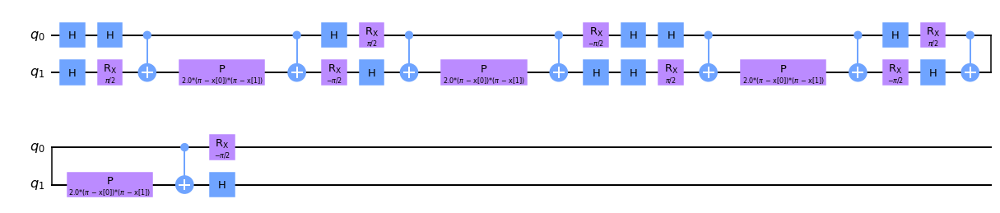


Quantum kernel matrices:



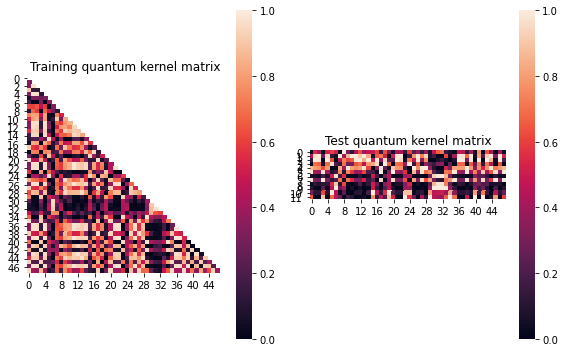


SVM with quantum kernel trained!


Test set performance:


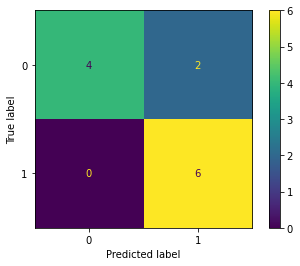

              precision    recall  f1-score   support

           0       1.00      0.67      0.80         6
           1       0.75      1.00      0.86         6

    accuracy                           0.83        12
   macro avg       0.88      0.83      0.83        12
weighted avg       0.88      0.83      0.83        12


metric 1: 0.028573107034362444
metric(s) 2: (00, 10, 11) = (0.5062730434334765, 0.4548814822874121, 0.46063613521007263)
metric 3: 0.0


----> Kernel construction duration: 00:02:23


Combination 246/468
(Current range: 16/46)
			 reps : 2
			 paulis : ['YX', 'XZ']
			 entanglement : linear

Feature map:


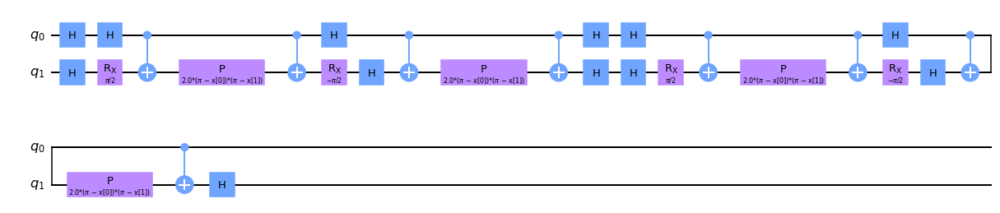


Quantum kernel matrices:



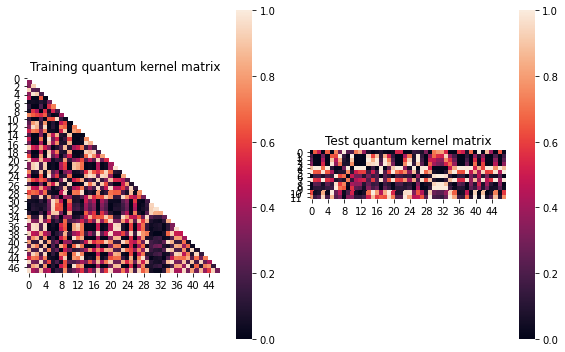


SVM with quantum kernel trained!


Test set performance:


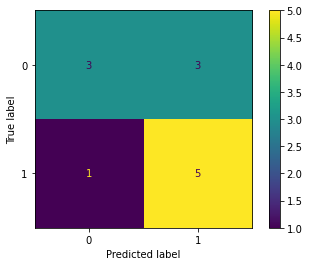

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.014508622780669556
metric(s) 2: (00, 10, 11) = (0.40220120793550673, 0.3986354911485682, 0.4240870199229689)
metric 3: 2e-323


----> Kernel construction duration: 00:02:13


Combination 247/468
(Current range: 17/46)
			 reps : 2
			 paulis : ['YX', 'YX']
			 entanglement : linear

Feature map:


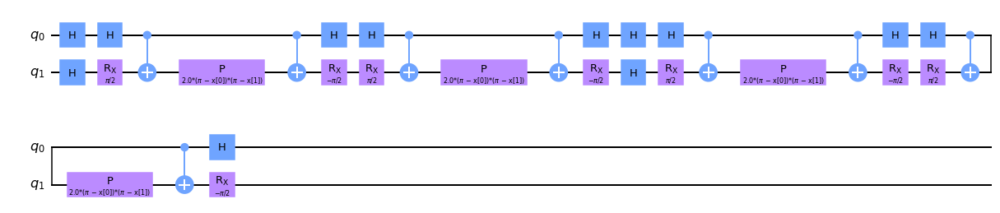


Quantum kernel matrices:



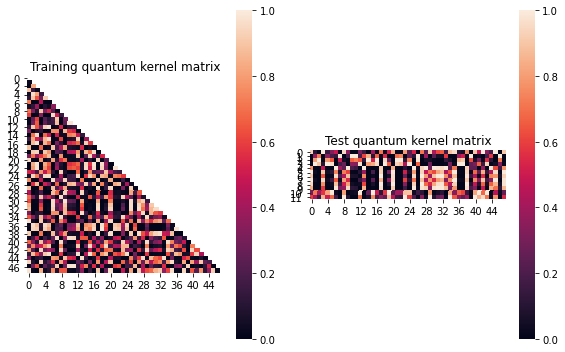


SVM with quantum kernel trained!


Test set performance:


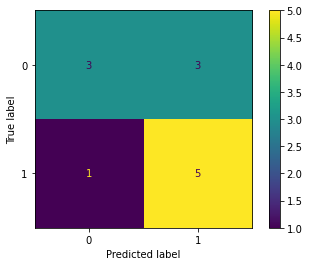

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05164114281543575
metric(s) 2: (00, 10, 11) = (0.39893140131459975, 0.35129610192754446, 0.40694308817136066)
metric 3: -0.0


----> Kernel construction duration: 00:01:20


Combination 248/468
(Current range: 18/46)
			 reps : 2
			 paulis : ['YX', 'YY']
			 entanglement : linear

Feature map:


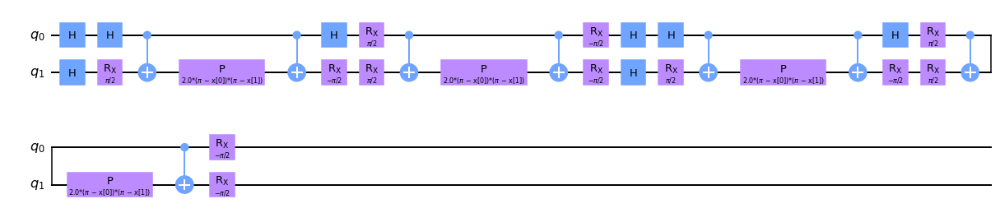


Quantum kernel matrices:



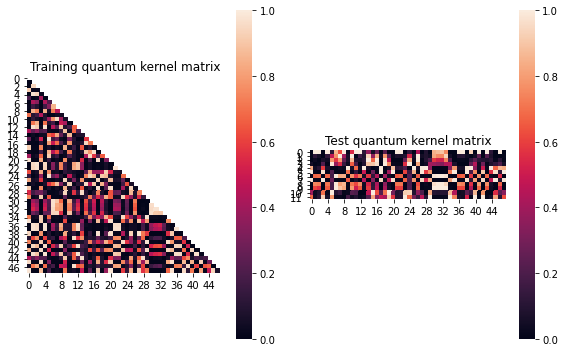


SVM with quantum kernel trained!


Test set performance:


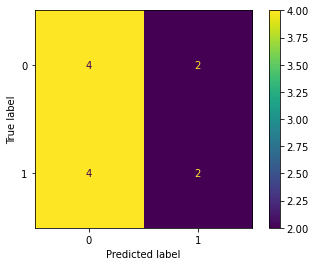

              precision    recall  f1-score   support

           0       0.50      0.67      0.57         6
           1       0.50      0.33      0.40         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.49        12
weighted avg       0.50      0.50      0.49        12


metric 1: 0.020638043218640045
metric(s) 2: (00, 10, 11) = (0.3217277462206748, 0.309835774132476, 0.3392198884815572)
metric 3: -0.0


----> Kernel construction duration: 00:02:10


Combination 249/468
(Current range: 19/46)
			 reps : 2
			 paulis : ['YX', 'YZ']
			 entanglement : linear

Feature map:


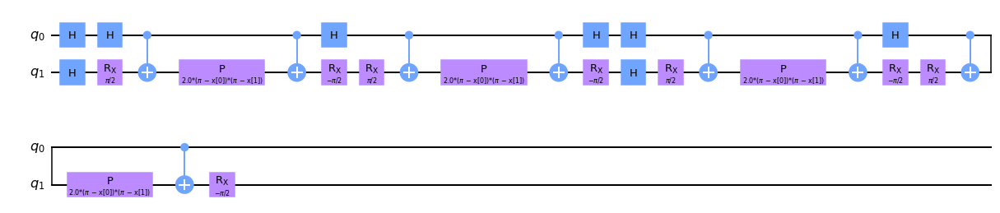


Quantum kernel matrices:



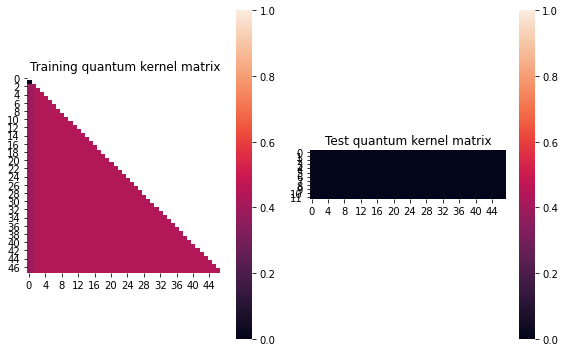


SVM with quantum kernel trained!


Test set performance:


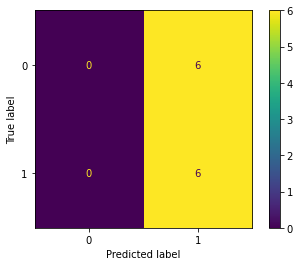

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:02:09


Combination 250/468
(Current range: 20/46)
			 reps : 2
			 paulis : ['YX', 'ZX']
			 entanglement : linear

Feature map:


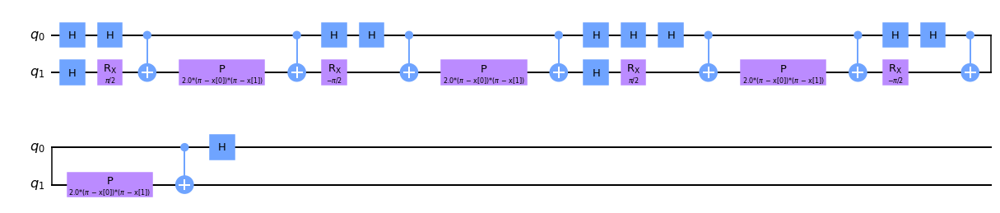


Quantum kernel matrices:



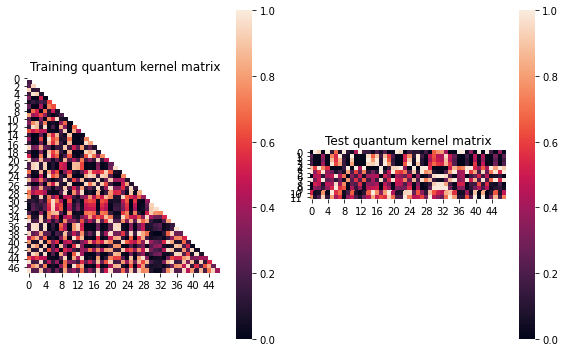


SVM with quantum kernel trained!


Test set performance:


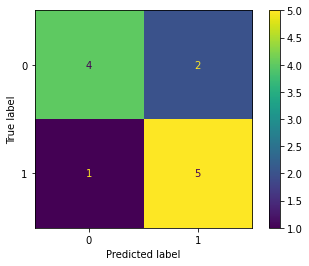

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.01714470676160823
metric(s) 2: (00, 10, 11) = (0.38826697744744343, 0.3884532497269338, 0.42292893552964067)
metric 3: 3.5e-323


----> Kernel construction duration: 00:02:19


Combination 251/468
(Current range: 21/46)
			 reps : 2
			 paulis : ['YX', 'ZY']
			 entanglement : linear

Feature map:


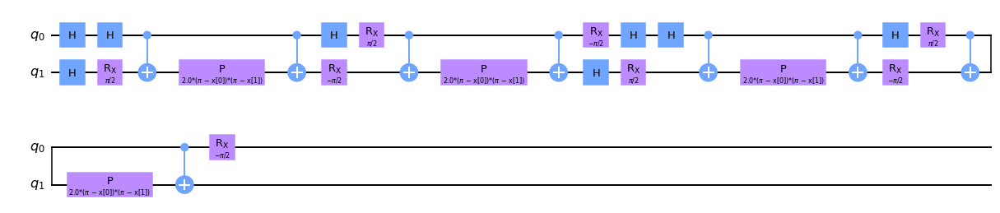


Quantum kernel matrices:



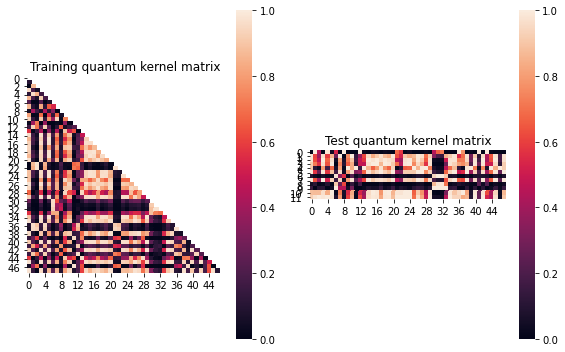


SVM with quantum kernel trained!


Test set performance:


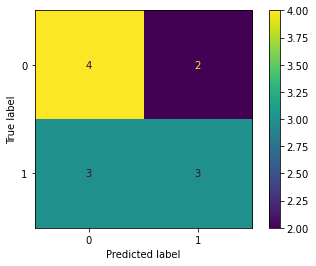

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.010410330558894787
metric(s) 2: (00, 10, 11) = (0.45081261028735586, 0.43257931628430285, 0.43516668339903947)
metric 3: 0.0


----> Kernel construction duration: 00:02:39


Combination 252/468
(Current range: 22/46)
			 reps : 2
			 paulis : ['YX', 'ZZ']
			 entanglement : linear

Feature map:


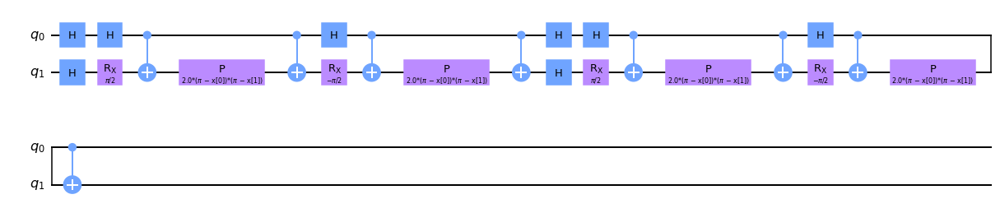


Quantum kernel matrices:



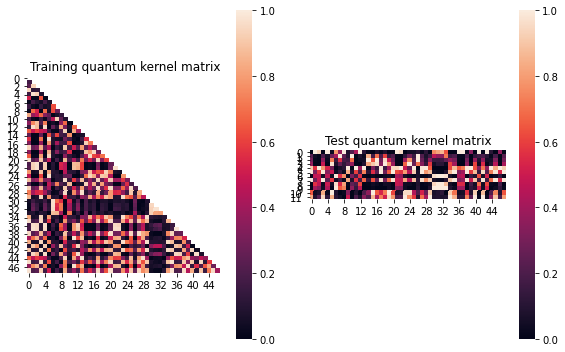


SVM with quantum kernel trained!


Test set performance:


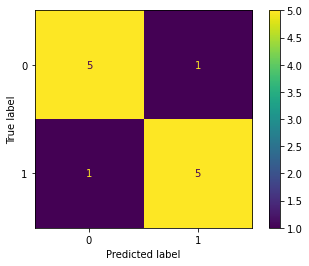

              precision    recall  f1-score   support

           0       0.83      0.83      0.83         6
           1       0.83      0.83      0.83         6

    accuracy                           0.83        12
   macro avg       0.83      0.83      0.83        12
weighted avg       0.83      0.83      0.83        12


metric 1: 0.01862277869020218
metric(s) 2: (00, 10, 11) = (0.36939658553037563, 0.37059454193864466, 0.409038055727318)
metric 3: -0.0


----> Kernel construction duration: 00:02:23


Combination 253/468
(Current range: 23/46)
			 reps : 2
			 paulis : ['YY', 'X']
			 entanglement : linear

Feature map:


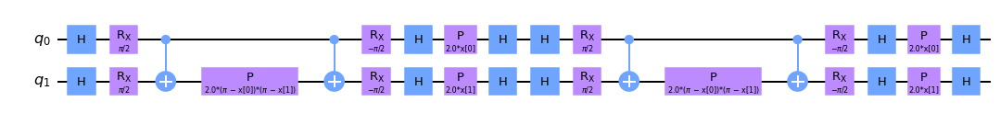


Quantum kernel matrices:



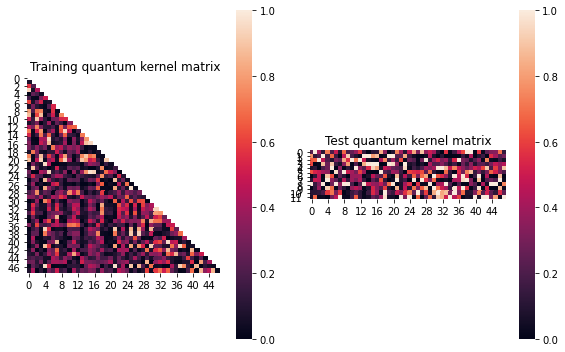


SVM with quantum kernel trained!


Test set performance:


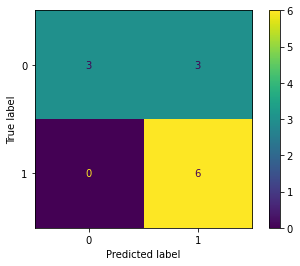

              precision    recall  f1-score   support

           0       1.00      0.50      0.67         6
           1       0.67      1.00      0.80         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: 0.10258726067775692
metric(s) 2: (00, 10, 11) = (0.33225910970540745, 0.23262393145682891, 0.33816327456376427)
metric 3: 2.7503794821356435e-274


----> Kernel construction duration: 00:02:08


Combination 254/468
(Current range: 24/46)
			 reps : 2
			 paulis : ['YY', 'Y']
			 entanglement : linear

Feature map:


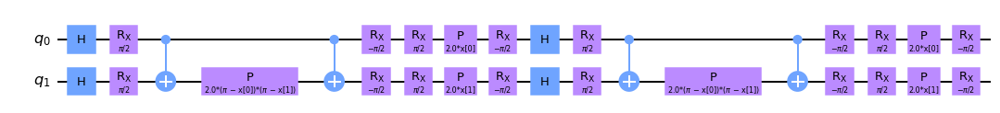


Quantum kernel matrices:



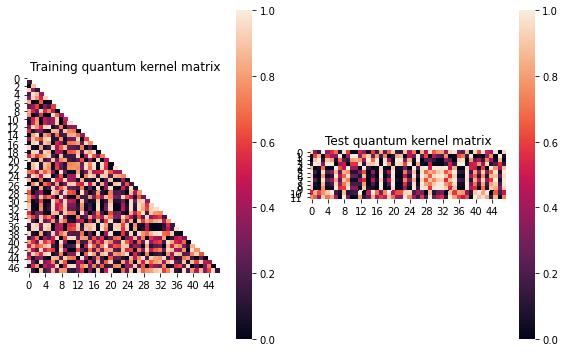


SVM with quantum kernel trained!


Test set performance:


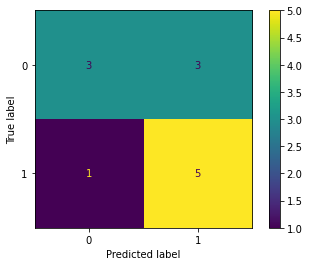

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:02:03


Combination 255/468
(Current range: 25/46)
			 reps : 2
			 paulis : ['YY', 'Z']
			 entanglement : linear

Feature map:


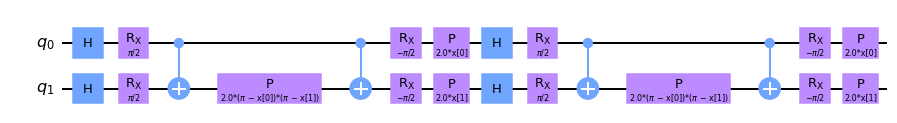


Quantum kernel matrices:



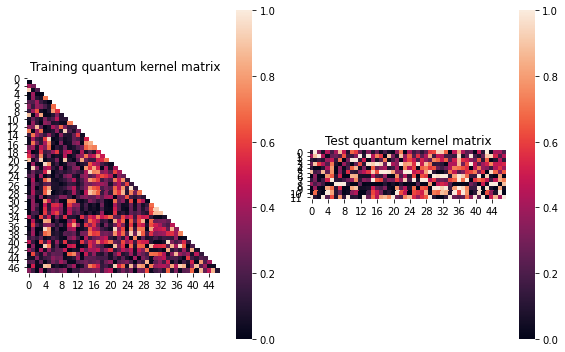


SVM with quantum kernel trained!


Test set performance:


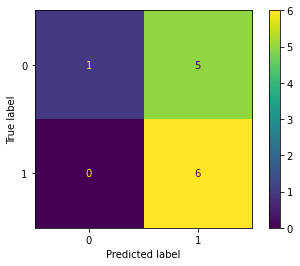

              precision    recall  f1-score   support

           0       1.00      0.17      0.29         6
           1       0.55      1.00      0.71         6

    accuracy                           0.58        12
   macro avg       0.77      0.58      0.50        12
weighted avg       0.77      0.58      0.50        12


metric 1: 0.0693743607444498
metric(s) 2: (00, 10, 11) = (0.31912986188388165, 0.2733035772528962, 0.36622601411081035)
metric 3: -7.071684411919941e-271


----> Kernel construction duration: 00:02:15


Combination 256/468
(Current range: 26/46)
			 reps : 2
			 paulis : ['YY', 'XX']
			 entanglement : linear

Feature map:


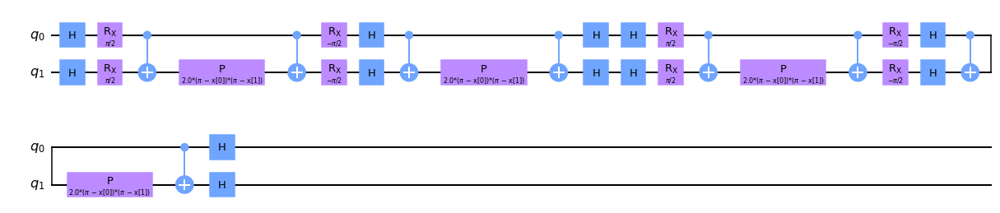


Quantum kernel matrices:



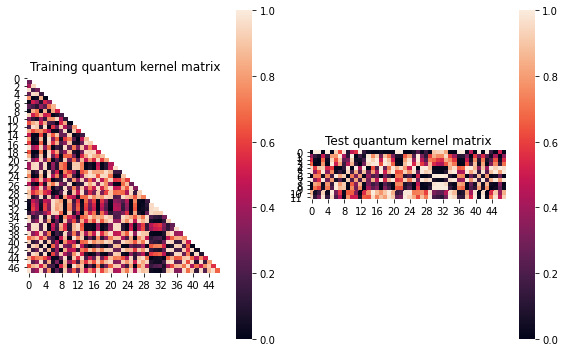


SVM with quantum kernel trained!


Test set performance:


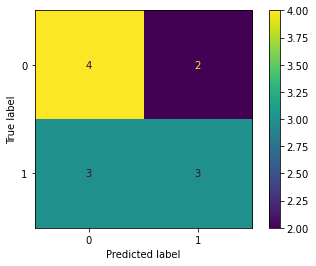

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:02:48


Combination 257/468
(Current range: 27/46)
			 reps : 2
			 paulis : ['YY', 'XY']
			 entanglement : linear

Feature map:


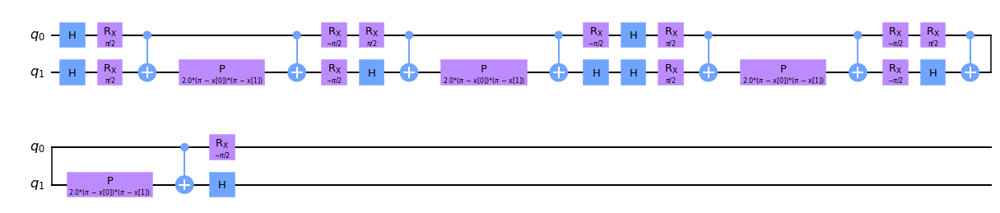


Quantum kernel matrices:



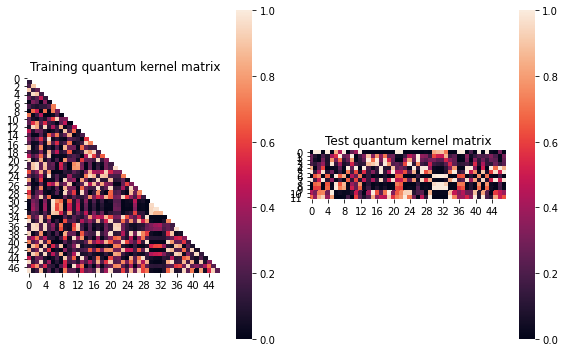


SVM with quantum kernel trained!


Test set performance:


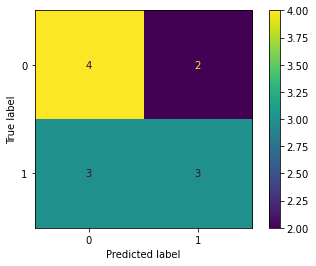

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.023553491103561253
metric(s) 2: (00, 10, 11) = (0.3467844769203023, 0.3297157486432052, 0.3597540025732306)
metric 3: -2.77e-322


----> Kernel construction duration: 00:02:29


Combination 258/468
(Current range: 28/46)
			 reps : 2
			 paulis : ['YY', 'XZ']
			 entanglement : linear

Feature map:


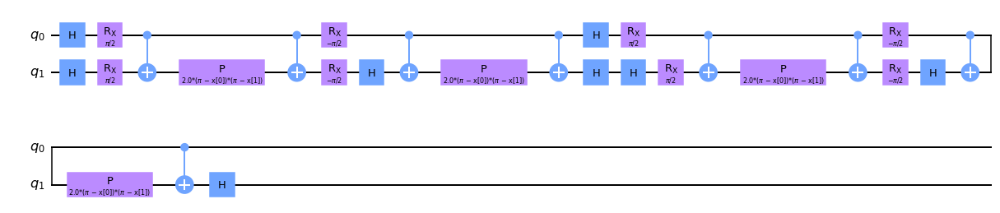


Quantum kernel matrices:



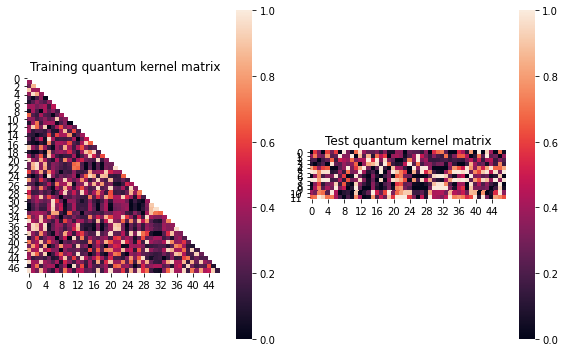


SVM with quantum kernel trained!


Test set performance:


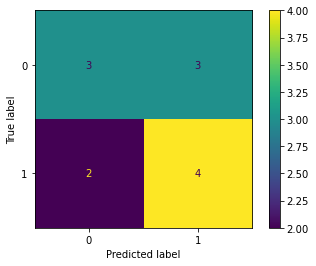

              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.57      0.67      0.62         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.015147550648587027
metric(s) 2: (00, 10, 11) = (0.38231815360524624, 0.3787983004776438, 0.40557354864721545)
metric 3: -0.0


----> Kernel construction duration: 00:02:50


Combination 259/468
(Current range: 29/46)
			 reps : 2
			 paulis : ['YY', 'YX']
			 entanglement : linear

Feature map:


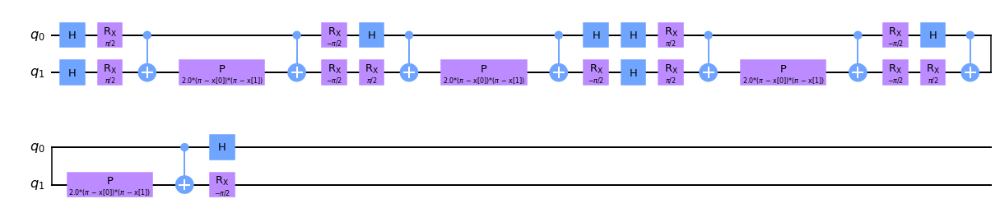


Quantum kernel matrices:



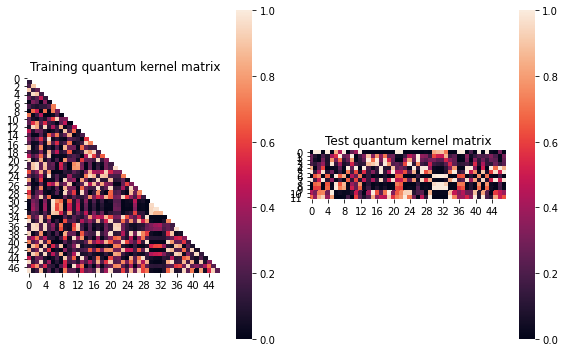


SVM with quantum kernel trained!


Test set performance:


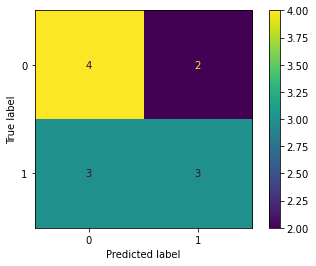

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.023553491103561253
metric(s) 2: (00, 10, 11) = (0.3467844769203023, 0.3297157486432052, 0.3597540025732306)
metric 3: -2.77e-322


----> Kernel construction duration: 00:02:26


Combination 260/468
(Current range: 30/46)
			 reps : 2
			 paulis : ['YY', 'YY']
			 entanglement : linear

Feature map:


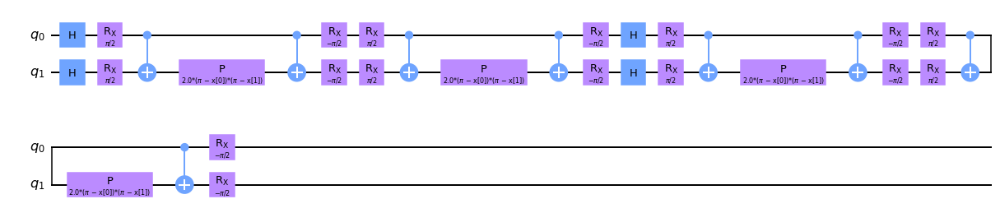


Quantum kernel matrices:



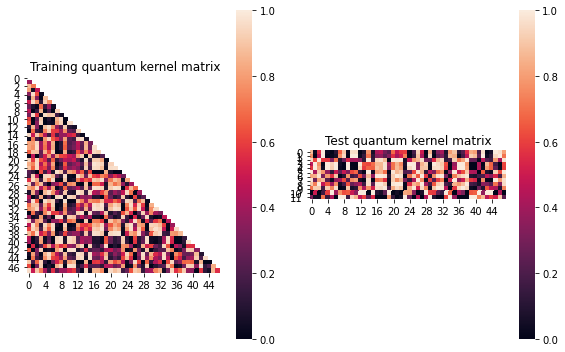


SVM with quantum kernel trained!


Test set performance:


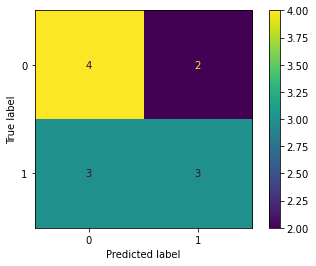

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004133609063449284
metric(s) 2: (00, 10, 11) = (0.5065498789564551, 0.4953143031220443, 0.4923459454145321)
metric 3: 0.0


----> Kernel construction duration: 00:01:38


Combination 261/468
(Current range: 31/46)
			 reps : 2
			 paulis : ['YY', 'YZ']
			 entanglement : linear

Feature map:


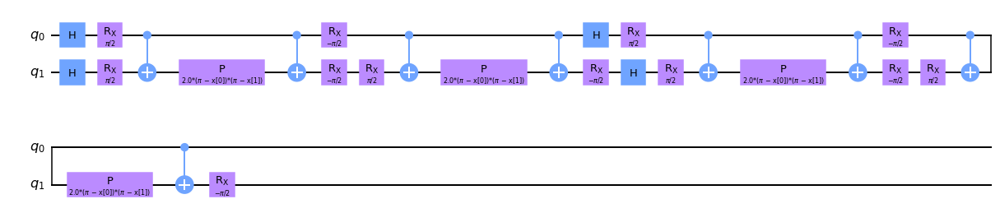


Quantum kernel matrices:



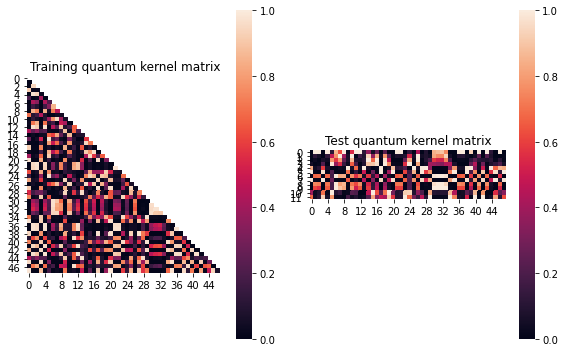


SVM with quantum kernel trained!


Test set performance:


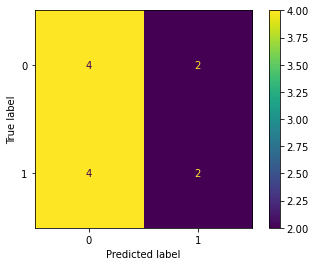

              precision    recall  f1-score   support

           0       0.50      0.67      0.57         6
           1       0.50      0.33      0.40         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.49        12
weighted avg       0.50      0.50      0.49        12


metric 1: 0.020638043218640045
metric(s) 2: (00, 10, 11) = (0.3217277462206748, 0.309835774132476, 0.3392198884815572)
metric 3: -0.0


----> Kernel construction duration: 00:02:26


Combination 262/468
(Current range: 32/46)
			 reps : 2
			 paulis : ['YY', 'ZX']
			 entanglement : linear

Feature map:


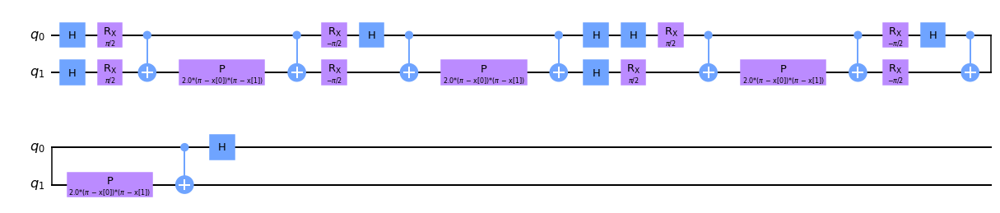


Quantum kernel matrices:



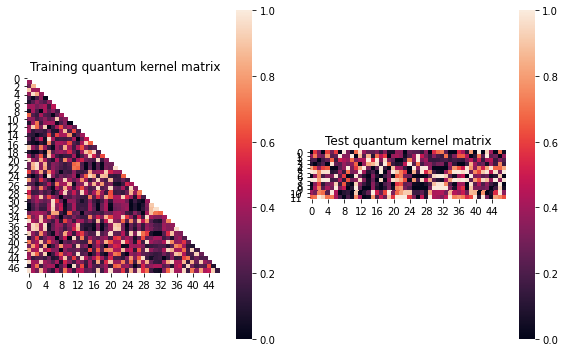


SVM with quantum kernel trained!


Test set performance:


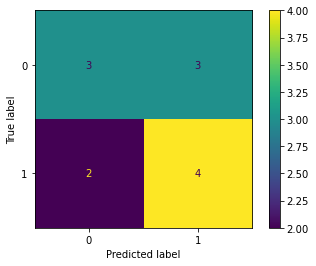

              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.57      0.67      0.62         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.015147550648587027
metric(s) 2: (00, 10, 11) = (0.38231815360524624, 0.3787983004776438, 0.40557354864721545)
metric 3: -0.0


----> Kernel construction duration: 00:02:41


Combination 263/468
(Current range: 33/46)
			 reps : 2
			 paulis : ['YY', 'ZY']
			 entanglement : linear

Feature map:


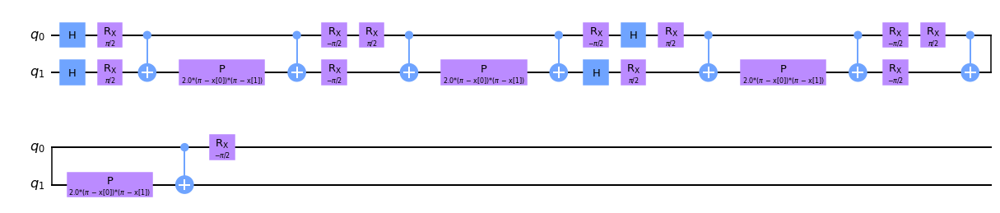


Quantum kernel matrices:



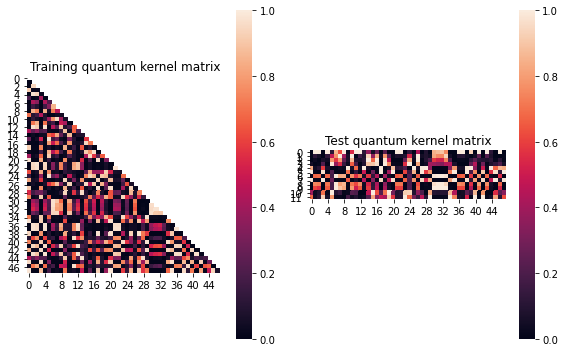


SVM with quantum kernel trained!


Test set performance:


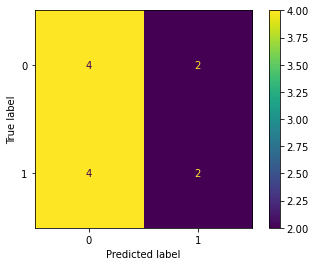

              precision    recall  f1-score   support

           0       0.50      0.67      0.57         6
           1       0.50      0.33      0.40         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.49        12
weighted avg       0.50      0.50      0.49        12


metric 1: 0.020638043218640045
metric(s) 2: (00, 10, 11) = (0.3217277462206748, 0.309835774132476, 0.3392198884815572)
metric 3: -0.0


----> Kernel construction duration: 00:02:30


Combination 264/468
(Current range: 34/46)
			 reps : 2
			 paulis : ['YY', 'ZZ']
			 entanglement : linear

Feature map:


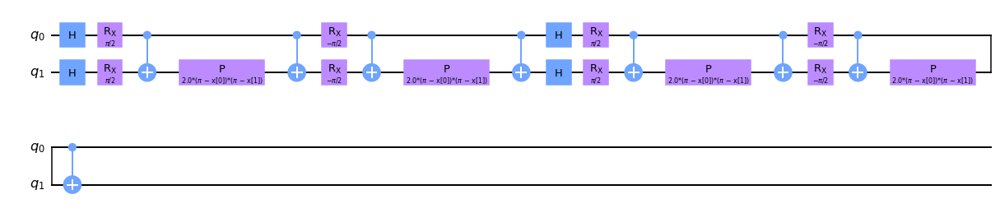


Quantum kernel matrices:



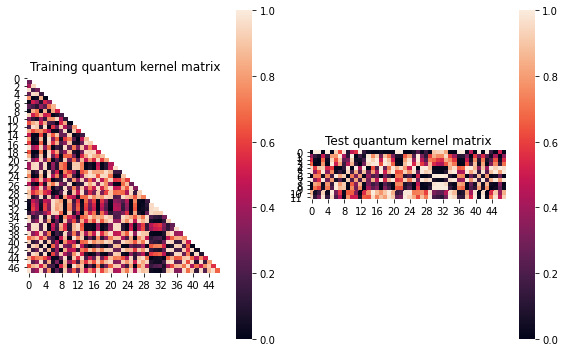


SVM with quantum kernel trained!


Test set performance:


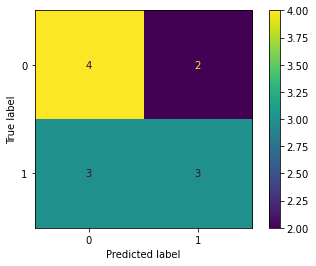

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:02:40


Combination 265/468
(Current range: 35/46)
			 reps : 2
			 paulis : ['YZ', 'X']
			 entanglement : linear

Feature map:


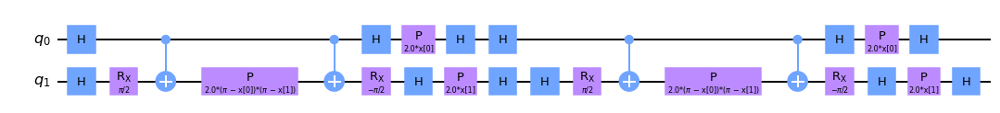


Quantum kernel matrices:



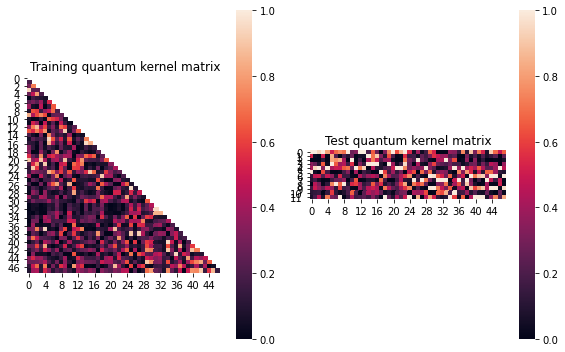


SVM with quantum kernel trained!


Test set performance:


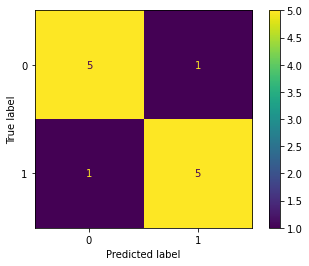

              precision    recall  f1-score   support

           0       0.83      0.83      0.83         6
           1       0.83      0.83      0.83         6

    accuracy                           0.83        12
   macro avg       0.83      0.83      0.83        12
weighted avg       0.83      0.83      0.83        12


metric 1: 0.12323059435736972
metric(s) 2: (00, 10, 11) = (0.34140132471325146, 0.21631724972713762, 0.3376943634557632)
metric 3: -1.0880036327175627e-256


----> Kernel construction duration: 00:02:08


Combination 266/468
(Current range: 36/46)
			 reps : 2
			 paulis : ['YZ', 'Y']
			 entanglement : linear

Feature map:


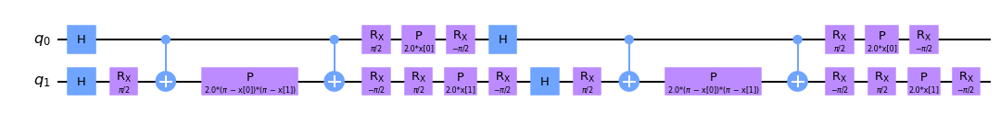


Quantum kernel matrices:



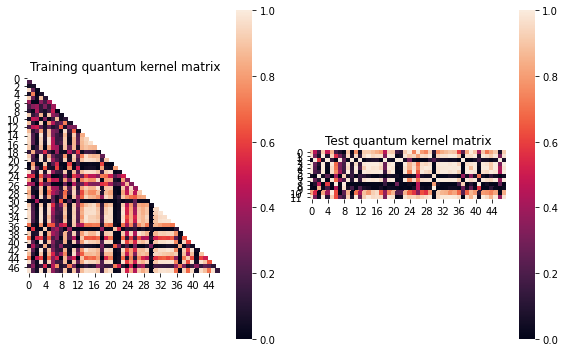


SVM with quantum kernel trained!


Test set performance:


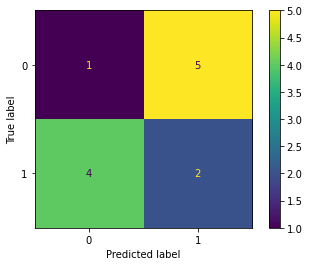

              precision    recall  f1-score   support

           0       0.20      0.17      0.18         6
           1       0.29      0.33      0.31         6

    accuracy                           0.25        12
   macro avg       0.24      0.25      0.24        12
weighted avg       0.24      0.25      0.24        12


metric 1: 0.03987578154084348
metric(s) 2: (00, 10, 11) = (0.4238651352304694, 0.45697530003622927, 0.5698370279236761)
metric 3: -1.56075e-319


----> Kernel construction duration: 00:02:01


Combination 267/468
(Current range: 37/46)
			 reps : 2
			 paulis : ['YZ', 'Z']
			 entanglement : linear

Feature map:


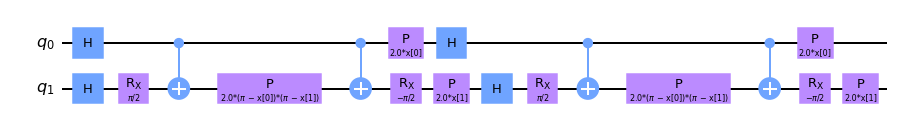


Quantum kernel matrices:



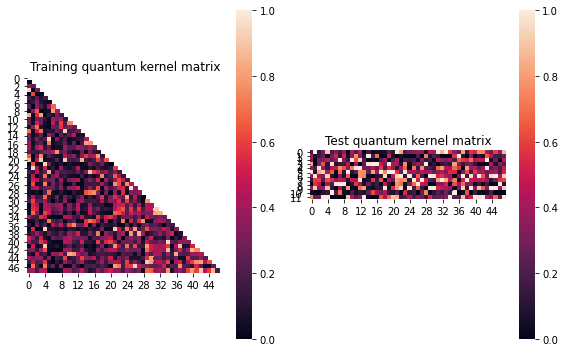


SVM with quantum kernel trained!


Test set performance:


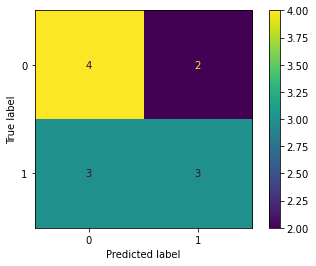

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.08256278686283133
metric(s) 2: (00, 10, 11) = (0.2875970072531919, 0.2478031981201985, 0.3731349627128677)
metric 3: -8.187276337092172e-272


----> Kernel construction duration: 00:01:56


Combination 268/468
(Current range: 38/46)
			 reps : 2
			 paulis : ['YZ', 'XX']
			 entanglement : linear

Feature map:


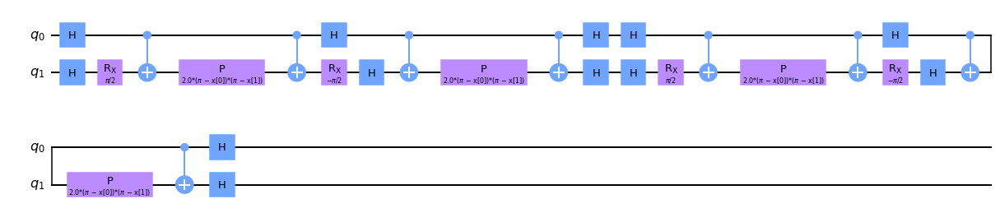


Quantum kernel matrices:



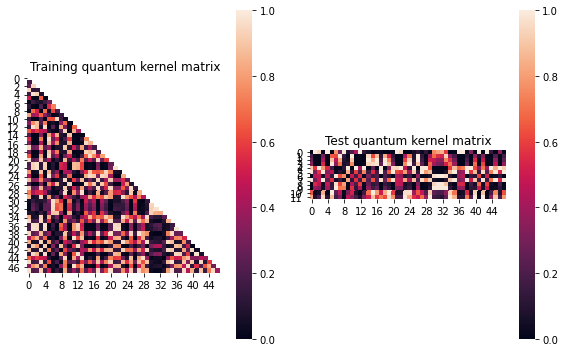


SVM with quantum kernel trained!


Test set performance:


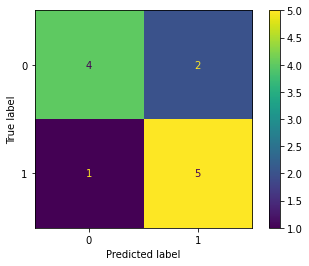

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.017158093659545015
metric(s) 2: (00, 10, 11) = (0.3893823105337397, 0.38630239711931363, 0.4175386710239776)
metric 3: -0.0


----> Kernel construction duration: 00:02:43


Combination 269/468
(Current range: 39/46)
			 reps : 2
			 paulis : ['YZ', 'XY']
			 entanglement : linear

Feature map:


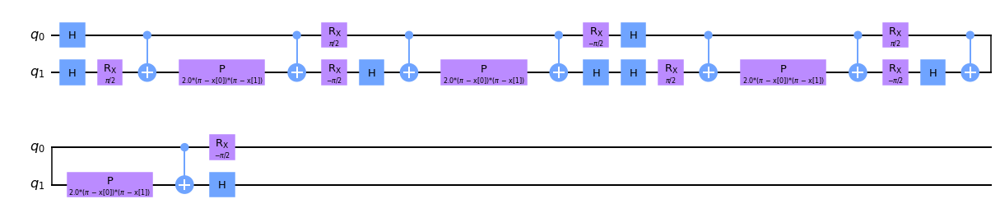


Quantum kernel matrices:



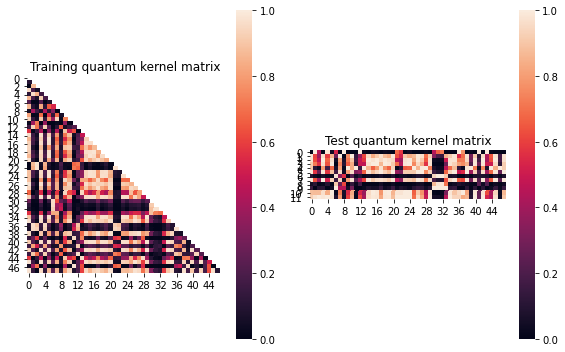


SVM with quantum kernel trained!


Test set performance:


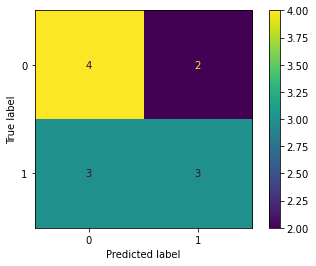

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.010410330558894787
metric(s) 2: (00, 10, 11) = (0.45081261028735586, 0.43257931628430285, 0.43516668339903947)
metric 3: 0.0


----> Kernel construction duration: 00:02:46


Combination 270/468
(Current range: 40/46)
			 reps : 2
			 paulis : ['YZ', 'XZ']
			 entanglement : linear

Feature map:


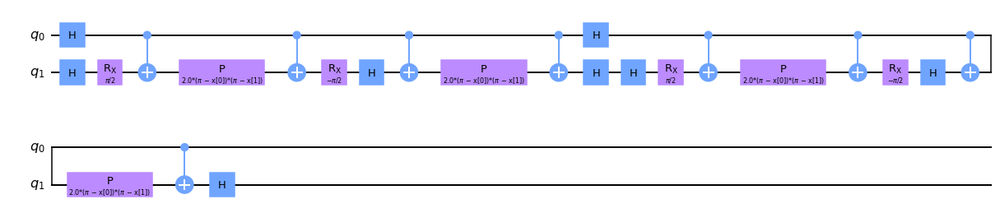


Quantum kernel matrices:



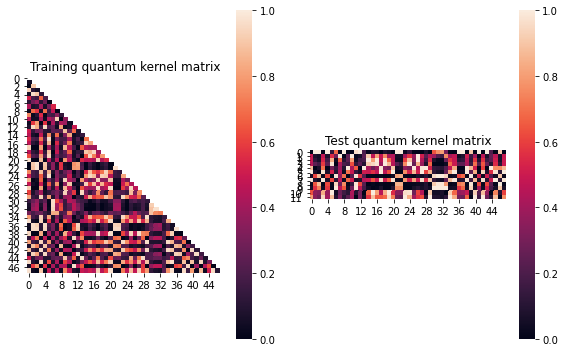


SVM with quantum kernel trained!


Test set performance:


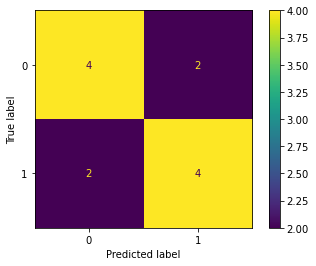

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.017732670609943824
metric(s) 2: (00, 10, 11) = (0.37859775577488214, 0.3655546426044575, 0.3879768706539205)
metric 3: 2.9e-322


----> Kernel construction duration: 00:02:18


Combination 271/468
(Current range: 41/46)
			 reps : 2
			 paulis : ['YZ', 'YX']
			 entanglement : linear

Feature map:


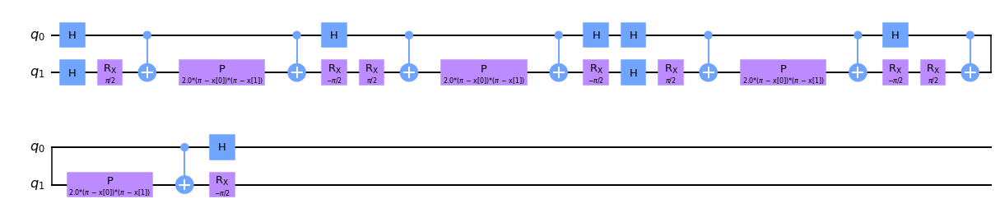


Quantum kernel matrices:



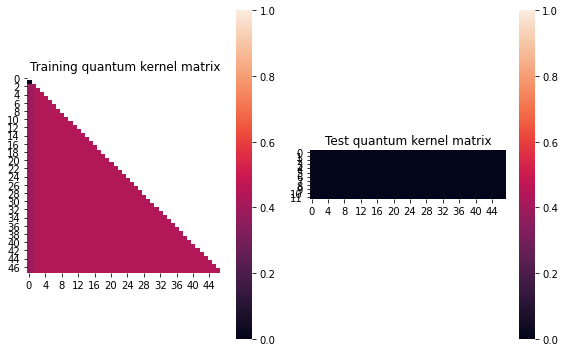


SVM with quantum kernel trained!


Test set performance:


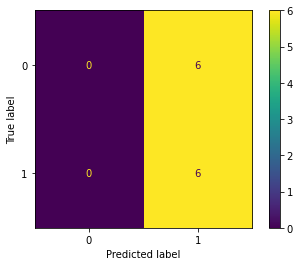

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:02:15


Combination 272/468
(Current range: 42/46)
			 reps : 2
			 paulis : ['YZ', 'YY']
			 entanglement : linear

Feature map:


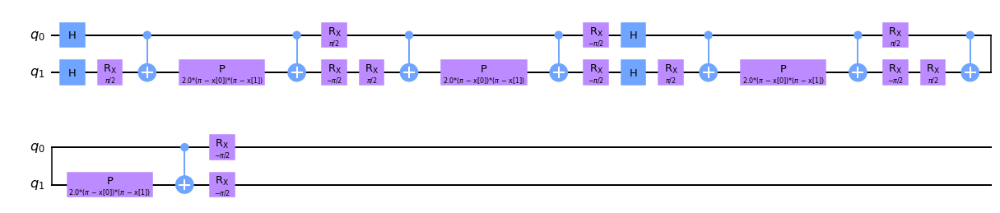


Quantum kernel matrices:



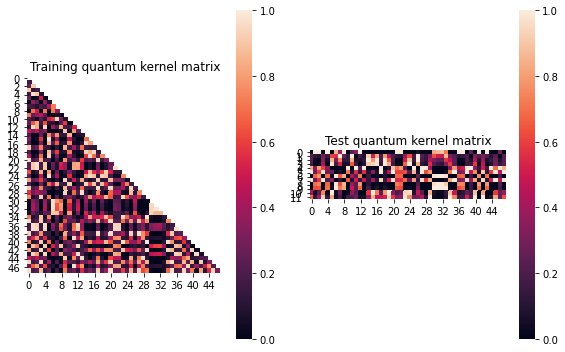


SVM with quantum kernel trained!


Test set performance:


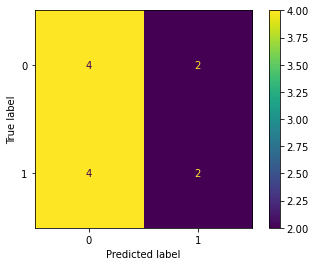

              precision    recall  f1-score   support

           0       0.50      0.67      0.57         6
           1       0.50      0.33      0.40         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.49        12
weighted avg       0.50      0.50      0.49        12


metric 1: 0.017967990046840132
metric(s) 2: (00, 10, 11) = (0.3570923538240518, 0.34553696654460886, 0.3699175593588462)
metric 3: -2.15e-321


----> Kernel construction duration: 00:02:41


Combination 273/468
(Current range: 43/46)
			 reps : 2
			 paulis : ['YZ', 'YZ']
			 entanglement : linear

Feature map:


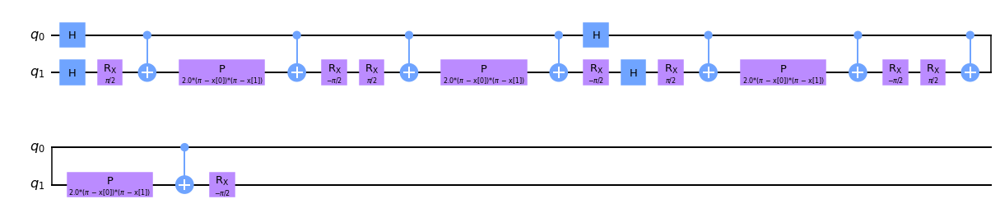


Quantum kernel matrices:



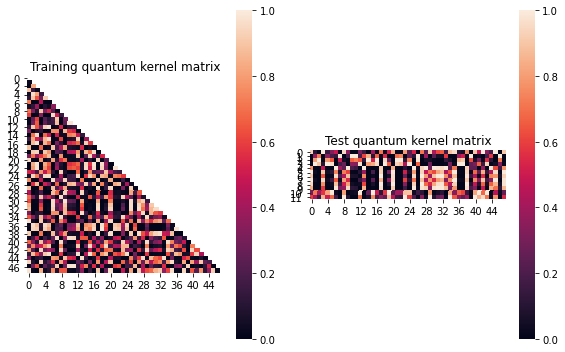


SVM with quantum kernel trained!


Test set performance:


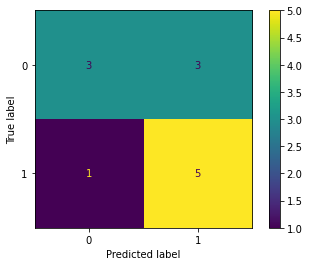

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05164114281543575
metric(s) 2: (00, 10, 11) = (0.39893140131459975, 0.35129610192754446, 0.40694308817136066)
metric 3: -0.0


----> Kernel construction duration: 00:01:36


Combination 274/468
(Current range: 44/46)
			 reps : 2
			 paulis : ['YZ', 'ZX']
			 entanglement : linear

Feature map:


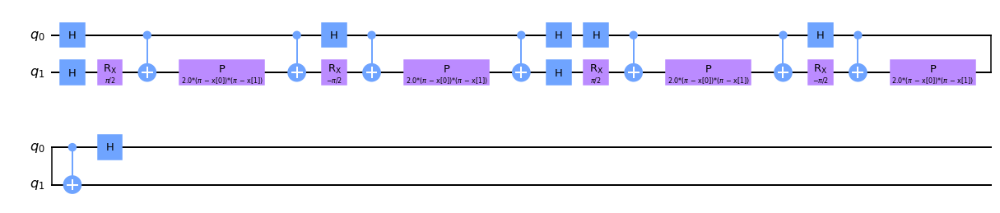


Quantum kernel matrices:



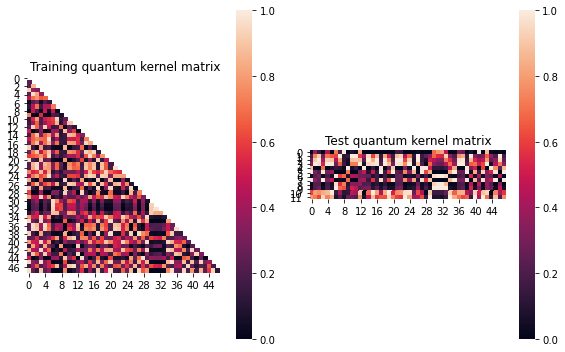


SVM with quantum kernel trained!


Test set performance:


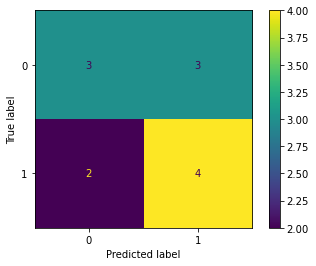

              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.57      0.67      0.62         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.04075779448944955
metric(s) 2: (00, 10, 11) = (0.4775559604068847, 0.4092433610665665, 0.42244635070514747)
metric 3: 0.0


----> Kernel construction duration: 00:02:29


Combination 275/468
(Current range: 45/46)
			 reps : 2
			 paulis : ['YZ', 'ZY']
			 entanglement : linear

Feature map:


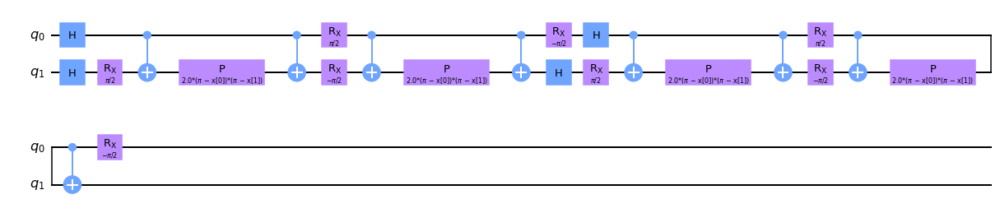


Quantum kernel matrices:



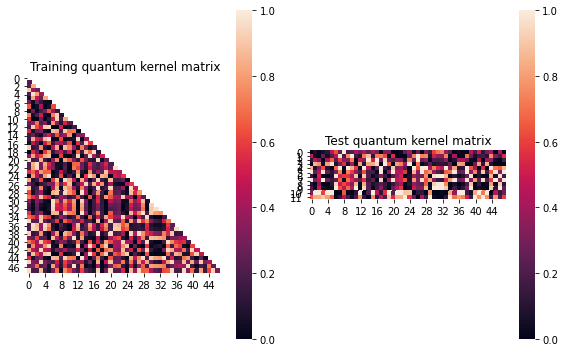


SVM with quantum kernel trained!


Test set performance:


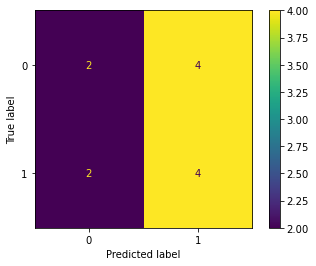

              precision    recall  f1-score   support

           0       0.50      0.33      0.40         6
           1       0.50      0.67      0.57         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.49        12
weighted avg       0.50      0.50      0.49        12


metric 1: 0.03082545422524774
metric(s) 2: (00, 10, 11) = (0.4098198811103972, 0.3968573307553901, 0.44554568885087853)
metric 3: -0.0


----> Kernel construction duration: 00:02:47


Combination 276/468
(Current range: 46/46)
			 reps : 2
			 paulis : ['YZ', 'ZZ']
			 entanglement : linear

Feature map:


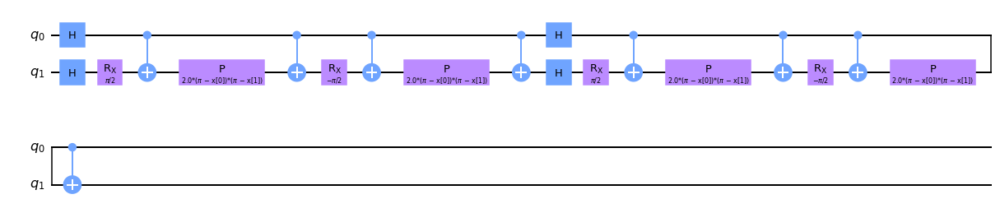


Quantum kernel matrices:



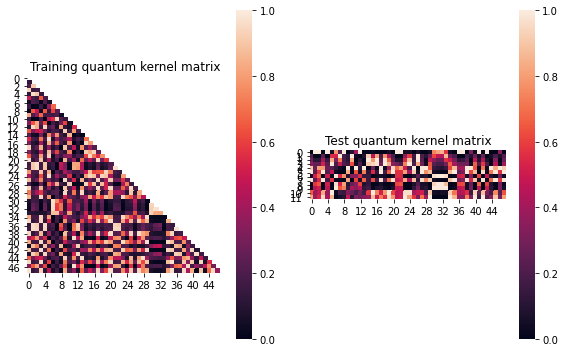


SVM with quantum kernel trained!


Test set performance:


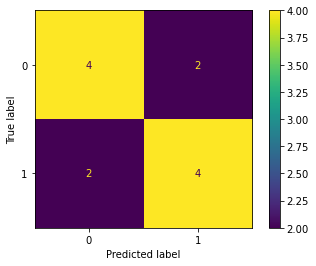

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.019909846124762487
metric(s) 2: (00, 10, 11) = (0.3866400907712849, 0.3782458125837562, 0.4096712266457525)
metric 3: -0.0


----> Kernel construction duration: 00:02:29


In [29]:
j=5
results.append(run_kernel_evaluation(X, X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))



Combination 277/468
(Current range: 1/46)
			 reps : 2
			 paulis : ['ZX', 'X']
			 entanglement : linear

Feature map:


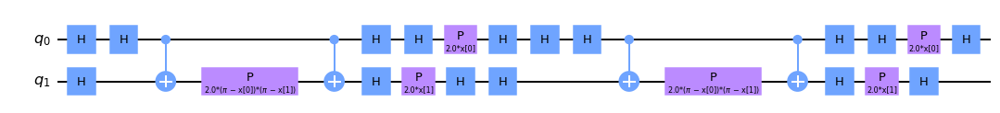


Quantum kernel matrices:



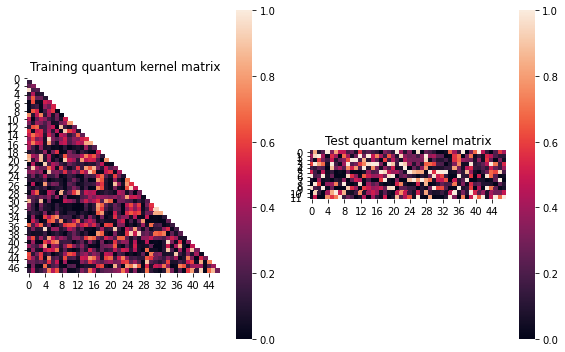


SVM with quantum kernel trained!


Test set performance:


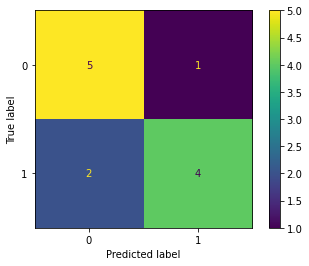

              precision    recall  f1-score   support

           0       0.71      0.83      0.77         6
           1       0.80      0.67      0.73         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.0885060678796315
metric(s) 2: (00, 10, 11) = (0.3496377755222737, 0.25161122147264353, 0.3305968031822764)
metric 3: -2.756421628285212e-271


----> Kernel construction duration: 00:01:54


Combination 278/468
(Current range: 2/46)
			 reps : 2
			 paulis : ['ZX', 'Y']
			 entanglement : linear

Feature map:


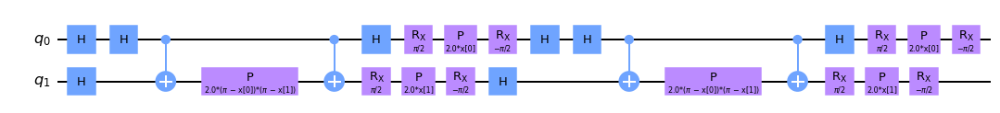


Quantum kernel matrices:



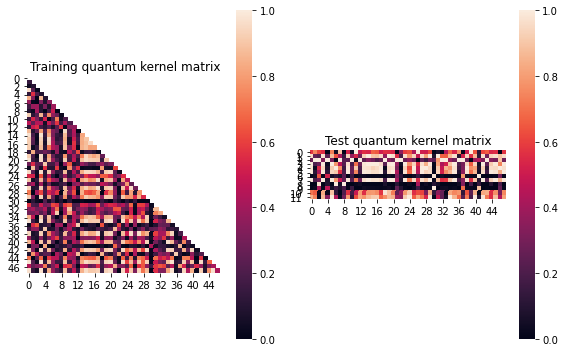


SVM with quantum kernel trained!


Test set performance:


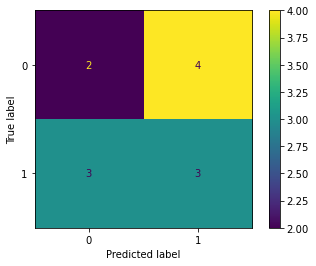

              precision    recall  f1-score   support

           0       0.40      0.33      0.36         6
           1       0.43      0.50      0.46         6

    accuracy                           0.42        12
   macro avg       0.41      0.42      0.41        12
weighted avg       0.41      0.42      0.41        12


metric 1: 0.011777060517326354
metric(s) 2: (00, 10, 11) = (0.41391060965542786, 0.4074806034046372, 0.42460471818849926)
metric 3: 1.3942296558822205e-287


----> Kernel construction duration: 00:02:00


Combination 279/468
(Current range: 3/46)
			 reps : 2
			 paulis : ['ZX', 'Z']
			 entanglement : linear

Feature map:


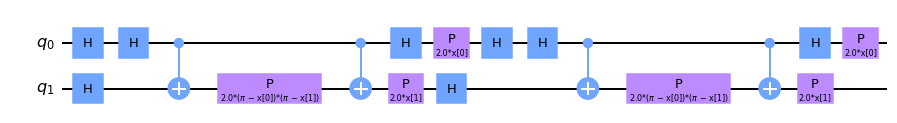


Quantum kernel matrices:



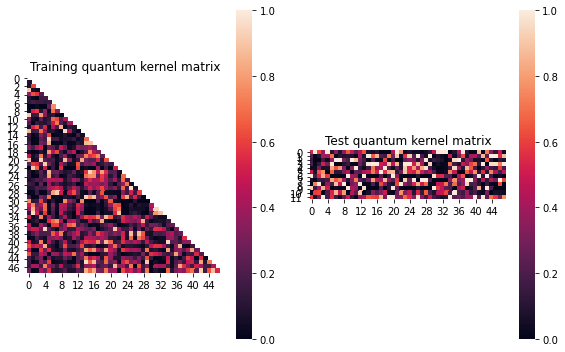


SVM with quantum kernel trained!


Test set performance:


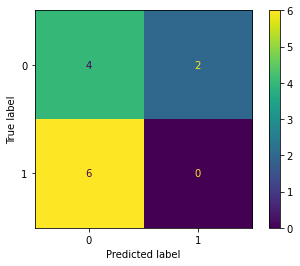

              precision    recall  f1-score   support

           0       0.40      0.67      0.50         6
           1       0.00      0.00      0.00         6

    accuracy                           0.33        12
   macro avg       0.20      0.33      0.25        12
weighted avg       0.20      0.33      0.25        12


metric 1: 0.01920480802178076
metric(s) 2: (00, 10, 11) = (0.2963360749041847, 0.28413709481478366, 0.3103477307689442)
metric 3: 2.9316187426495597e-270


----> Kernel construction duration: 00:01:46


Combination 280/468
(Current range: 4/46)
			 reps : 2
			 paulis : ['ZX', 'XX']
			 entanglement : linear

Feature map:


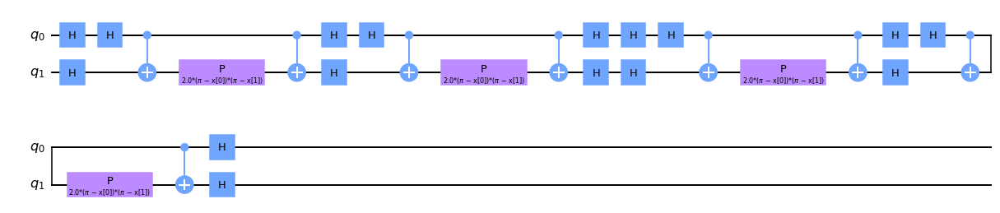


Quantum kernel matrices:



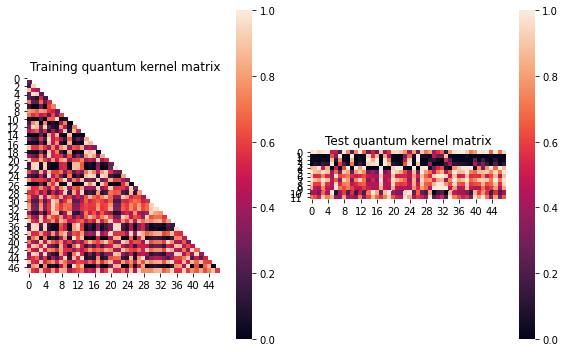


SVM with quantum kernel trained!


Test set performance:


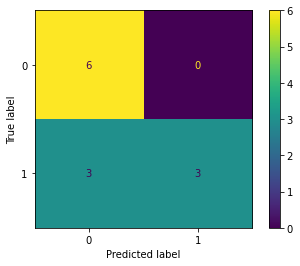

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: -0.006104797684579943
metric(s) 2: (00, 10, 11) = (0.4715509934872962, 0.5198968356611414, 0.5560330824658267)
metric 3: -0.0


----> Kernel construction duration: 00:02:02


Combination 281/468
(Current range: 5/46)
			 reps : 2
			 paulis : ['ZX', 'XY']
			 entanglement : linear

Feature map:


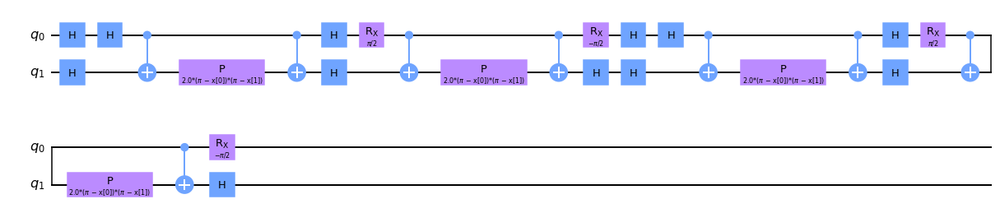


Quantum kernel matrices:



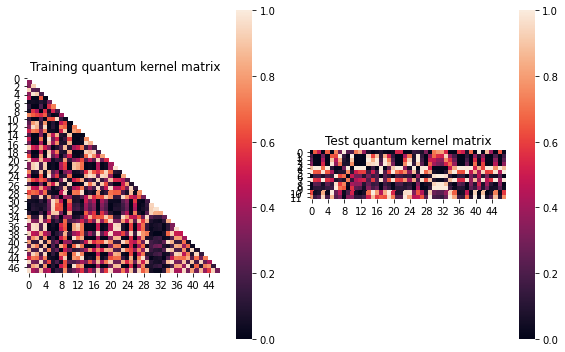


SVM with quantum kernel trained!


Test set performance:


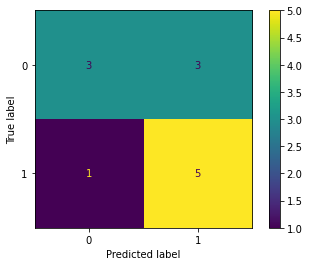

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.014508622780669556
metric(s) 2: (00, 10, 11) = (0.40220120793550673, 0.3986354911485682, 0.4240870199229689)
metric 3: 2e-323


----> Kernel construction duration: 00:02:29


Combination 282/468
(Current range: 6/46)
			 reps : 2
			 paulis : ['ZX', 'XZ']
			 entanglement : linear

Feature map:


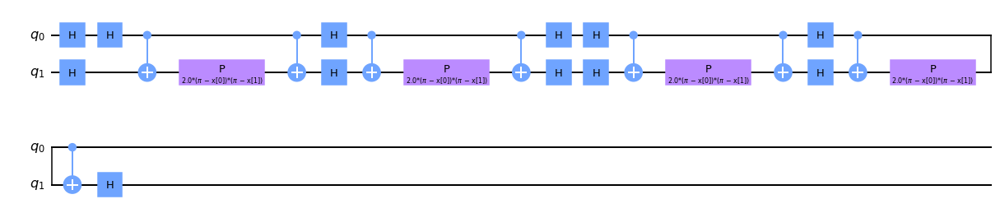


Quantum kernel matrices:



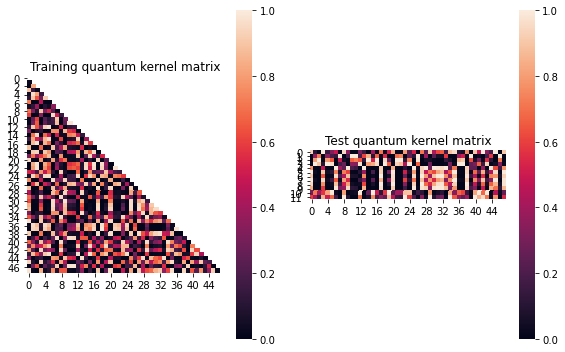


SVM with quantum kernel trained!


Test set performance:


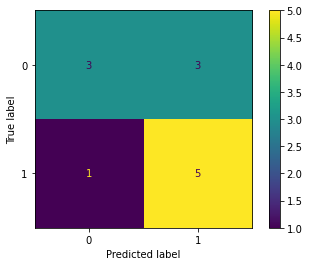

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05164114281543575
metric(s) 2: (00, 10, 11) = (0.39893140131459975, 0.35129610192754446, 0.40694308817136066)
metric 3: -0.0


----> Kernel construction duration: 00:02:02


Combination 283/468
(Current range: 7/46)
			 reps : 2
			 paulis : ['ZX', 'YX']
			 entanglement : linear

Feature map:


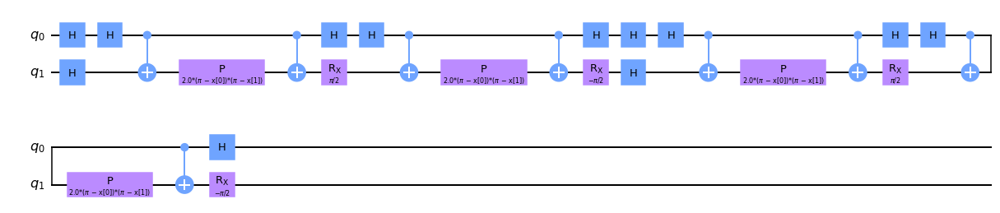


Quantum kernel matrices:



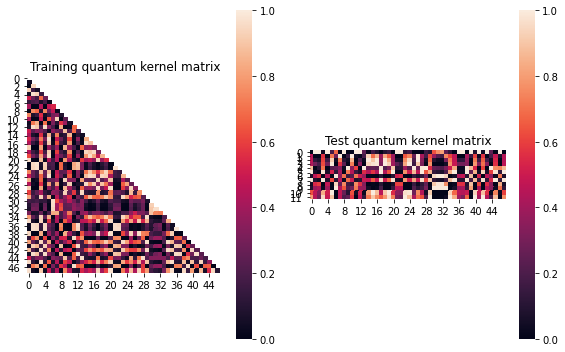


SVM with quantum kernel trained!


Test set performance:


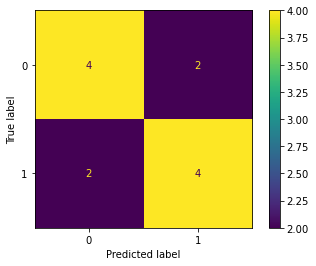

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.019944755391278157
metric(s) 2: (00, 10, 11) = (0.39661997085764233, 0.37878436956387684, 0.40083827905266767)
metric 3: 9.843111113956182e-307


----> Kernel construction duration: 00:02:16


Combination 284/468
(Current range: 8/46)
			 reps : 2
			 paulis : ['ZX', 'YY']
			 entanglement : linear

Feature map:


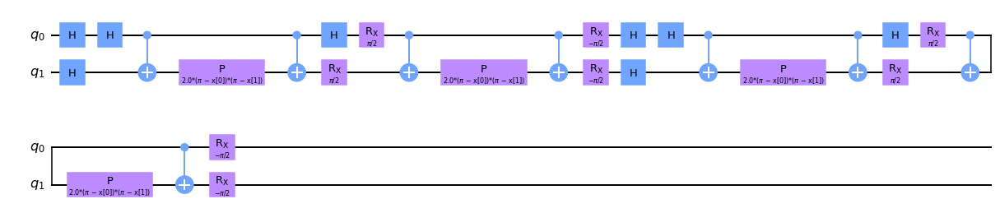


Quantum kernel matrices:



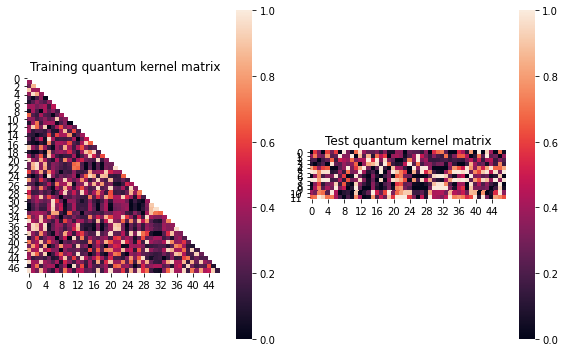


SVM with quantum kernel trained!


Test set performance:


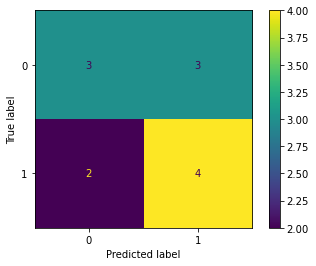

              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.57      0.67      0.62         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.015147550648587027
metric(s) 2: (00, 10, 11) = (0.38231815360524624, 0.3787983004776438, 0.40557354864721545)
metric 3: -0.0


----> Kernel construction duration: 00:02:48


Combination 285/468
(Current range: 9/46)
			 reps : 2
			 paulis : ['ZX', 'YZ']
			 entanglement : linear

Feature map:


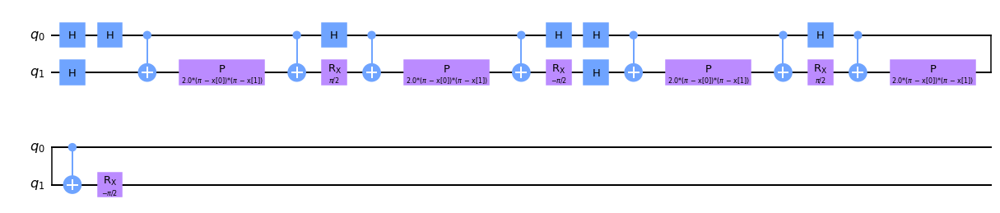


Quantum kernel matrices:



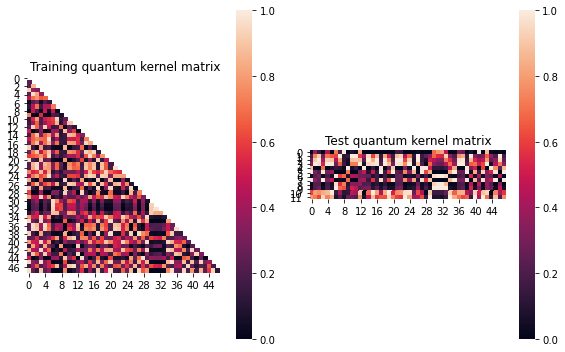


SVM with quantum kernel trained!


Test set performance:


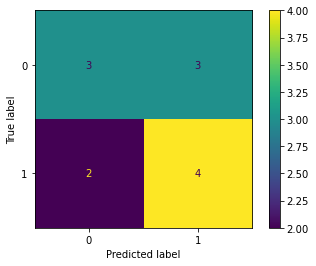

              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.57      0.67      0.62         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.04075779448944955
metric(s) 2: (00, 10, 11) = (0.4775559604068847, 0.4092433610665665, 0.42244635070514747)
metric 3: 0.0


----> Kernel construction duration: 00:02:43


Combination 286/468
(Current range: 10/46)
			 reps : 2
			 paulis : ['ZX', 'ZX']
			 entanglement : linear

Feature map:


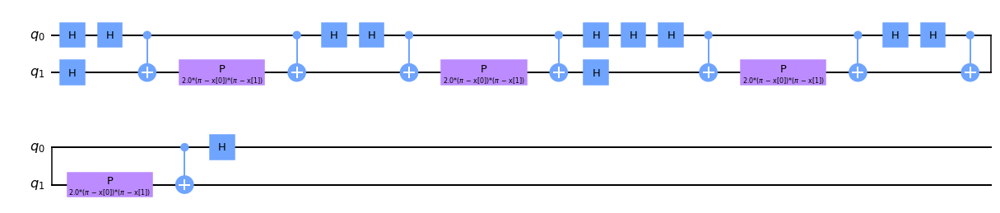


Quantum kernel matrices:



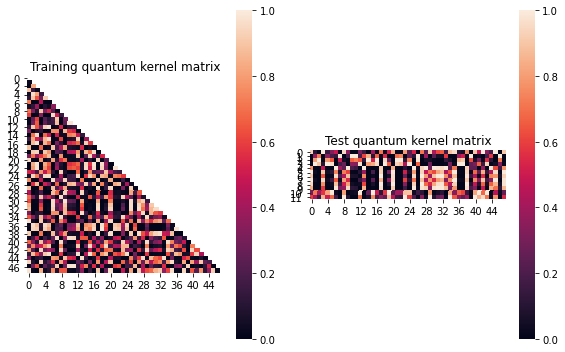


SVM with quantum kernel trained!


Test set performance:


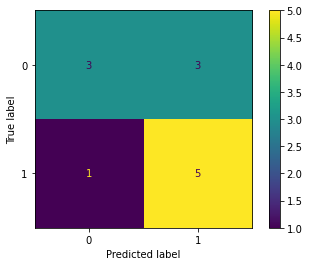

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05164114281543575
metric(s) 2: (00, 10, 11) = (0.39893140131459975, 0.35129610192754446, 0.40694308817136066)
metric 3: -0.0


----> Kernel construction duration: 00:01:25


Combination 287/468
(Current range: 11/46)
			 reps : 2
			 paulis : ['ZX', 'ZY']
			 entanglement : linear

Feature map:


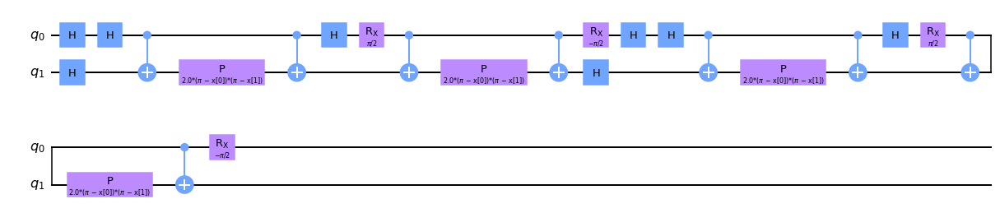


Quantum kernel matrices:



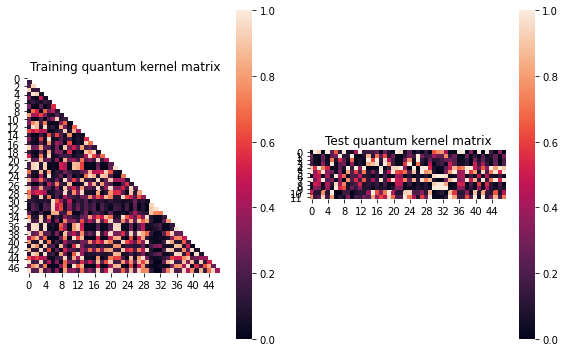


SVM with quantum kernel trained!


Test set performance:


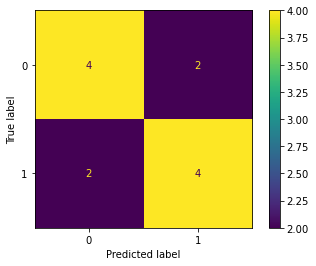

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.01676303407063312
metric(s) 2: (00, 10, 11) = (0.3509277965872475, 0.3527606263709832, 0.3881195242959852)
metric 3: 2e-321


----> Kernel construction duration: 00:02:19


Combination 288/468
(Current range: 12/46)
			 reps : 2
			 paulis : ['ZX', 'ZZ']
			 entanglement : linear

Feature map:


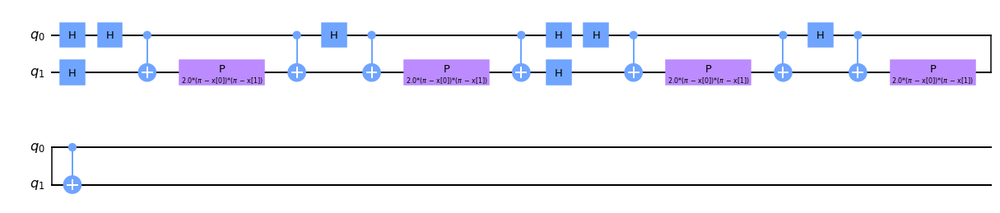


Quantum kernel matrices:



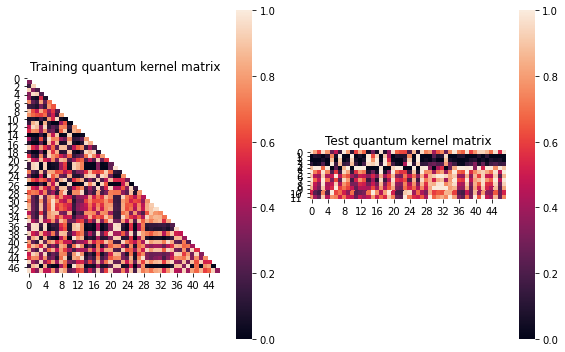


SVM with quantum kernel trained!


Test set performance:


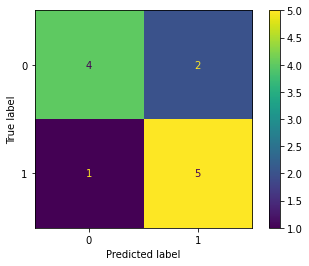

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.009427194558133789
metric(s) 2: (00, 10, 11) = (0.4688597337117616, 0.5061784560971924, 0.5623515675988906)
metric 3: 0.0


----> Kernel construction duration: 00:02:05


Combination 289/468
(Current range: 13/46)
			 reps : 2
			 paulis : ['ZY', 'X']
			 entanglement : linear

Feature map:


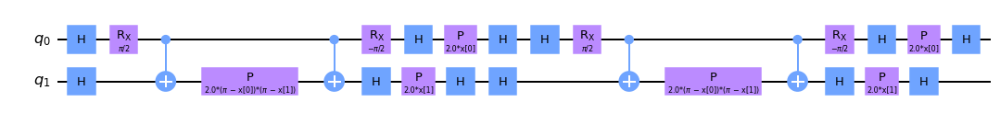


Quantum kernel matrices:



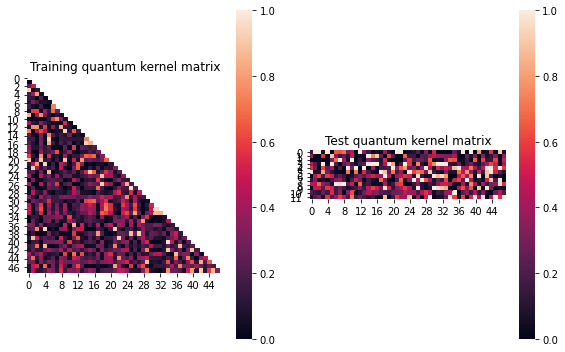


SVM with quantum kernel trained!


Test set performance:


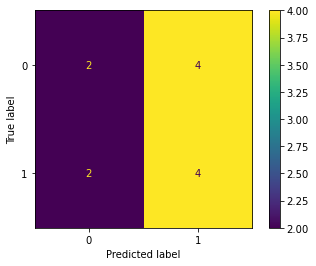

              precision    recall  f1-score   support

           0       0.50      0.33      0.40         6
           1       0.50      0.67      0.57         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.49        12
weighted avg       0.50      0.50      0.49        12


metric 1: 0.050885108772694476
metric(s) 2: (00, 10, 11) = (0.27681256478299576, 0.2359571108404107, 0.29687187444321456)
metric 3: -6.605025447449589e-271


----> Kernel construction duration: 00:02:09


Combination 290/468
(Current range: 14/46)
			 reps : 2
			 paulis : ['ZY', 'Y']
			 entanglement : linear

Feature map:


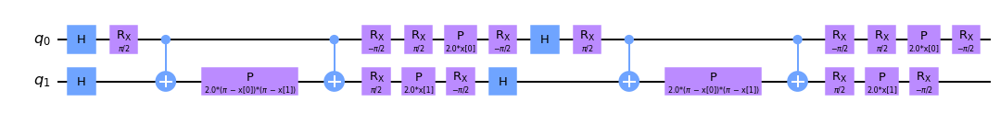


Quantum kernel matrices:



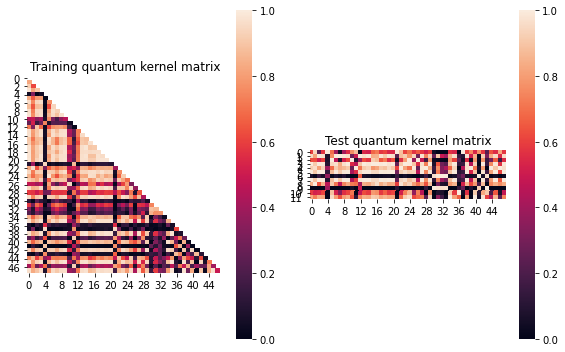


SVM with quantum kernel trained!


Test set performance:


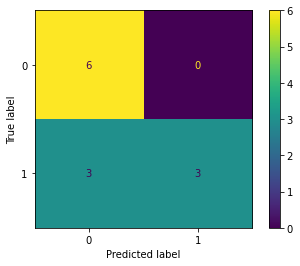

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         6
           1       1.00      0.50      0.67         6

    accuracy                           0.75        12
   macro avg       0.83      0.75      0.73        12
weighted avg       0.83      0.75      0.73        12


metric 1: 0.04351559770960545
metric(s) 2: (00, 10, 11) = (0.6870920833949737, 0.5166622275353625, 0.4332635670949622)
metric 3: -0.0


----> Kernel construction duration: 00:02:08


Combination 291/468
(Current range: 15/46)
			 reps : 2
			 paulis : ['ZY', 'Z']
			 entanglement : linear

Feature map:


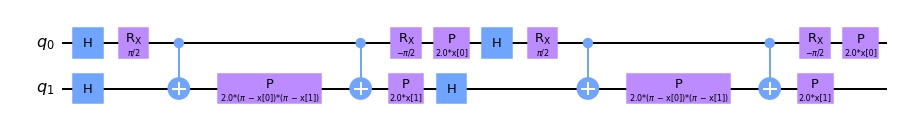


Quantum kernel matrices:



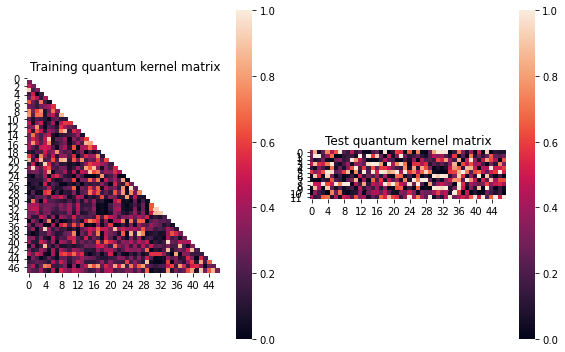


SVM with quantum kernel trained!


Test set performance:


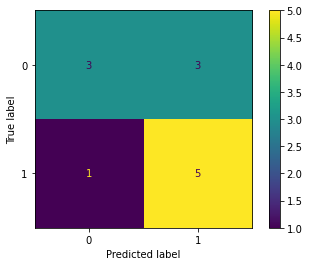

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.08926784045157538
metric(s) 2: (00, 10, 11) = (0.3764611451786613, 0.2617036602510597, 0.32548185622660875)
metric 3: -8.333597220874413e-269


----> Kernel construction duration: 00:02:08


Combination 292/468
(Current range: 16/46)
			 reps : 2
			 paulis : ['ZY', 'XX']
			 entanglement : linear

Feature map:


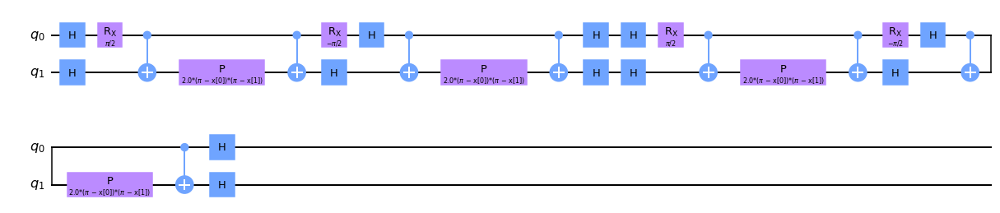


Quantum kernel matrices:



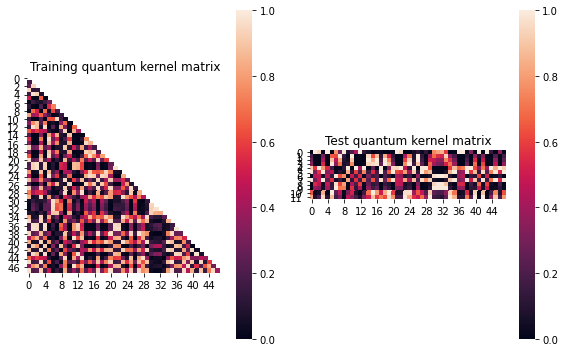


SVM with quantum kernel trained!


Test set performance:


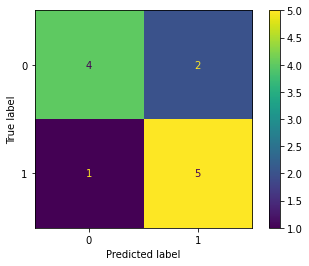

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.017158093659545015
metric(s) 2: (00, 10, 11) = (0.3893823105337397, 0.38630239711931363, 0.4175386710239776)
metric 3: -0.0


----> Kernel construction duration: 00:03:37


Combination 293/468
(Current range: 17/46)
			 reps : 2
			 paulis : ['ZY', 'XY']
			 entanglement : linear

Feature map:


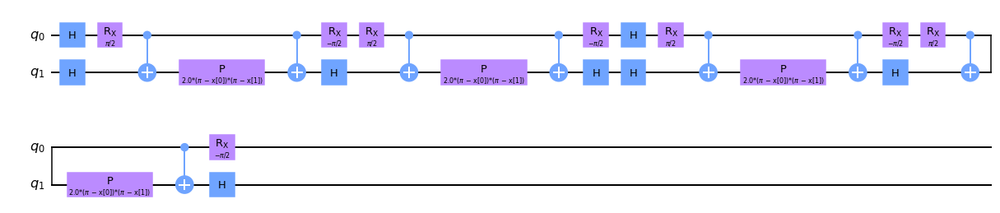


Quantum kernel matrices:



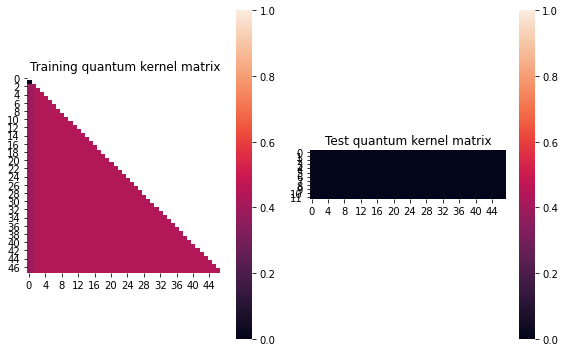


SVM with quantum kernel trained!


Test set performance:


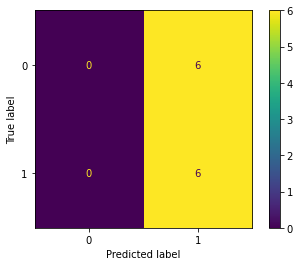

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.50      1.00      0.67         6

    accuracy                           0.50        12
   macro avg       0.25      0.50      0.33        12
weighted avg       0.25      0.50      0.33        12


metric 1: 0.00472005208333337
metric(s) 2: (00, 10, 11) = (0.4391276041666667, 0.43359375, 0.4375)
metric 3: 0.0


----> Kernel construction duration: 00:02:51


Combination 294/468
(Current range: 18/46)
			 reps : 2
			 paulis : ['ZY', 'XZ']
			 entanglement : linear

Feature map:


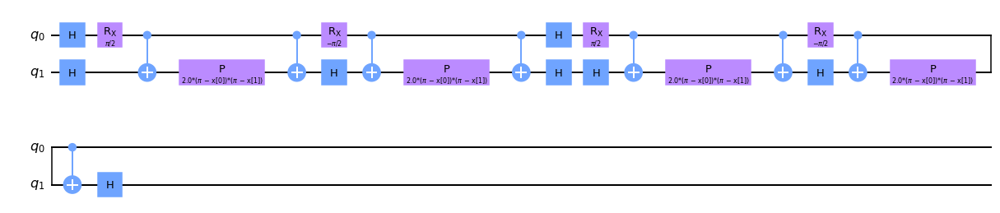


Quantum kernel matrices:



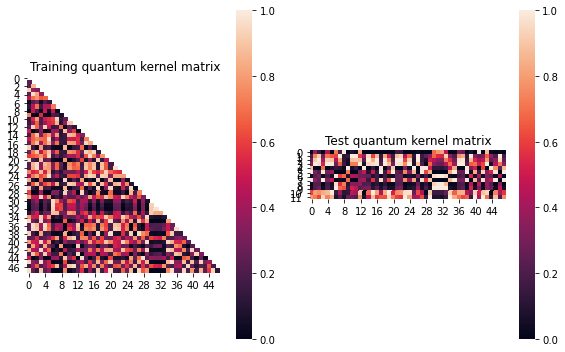


SVM with quantum kernel trained!


Test set performance:


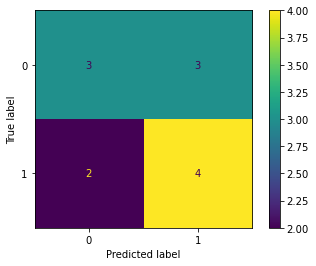

              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.57      0.67      0.62         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.04075779448944955
metric(s) 2: (00, 10, 11) = (0.4775559604068847, 0.4092433610665665, 0.42244635070514747)
metric 3: 0.0


----> Kernel construction duration: 00:03:37


Combination 295/468
(Current range: 19/46)
			 reps : 2
			 paulis : ['ZY', 'YX']
			 entanglement : linear

Feature map:


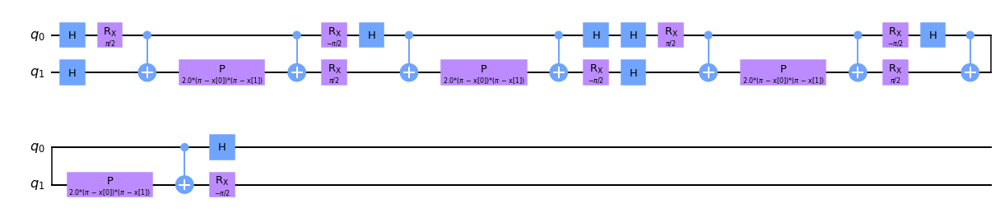


Quantum kernel matrices:



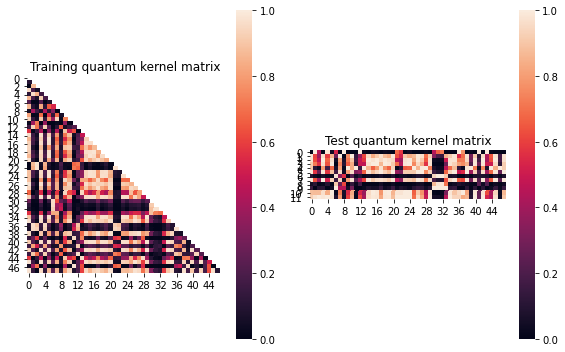


SVM with quantum kernel trained!


Test set performance:


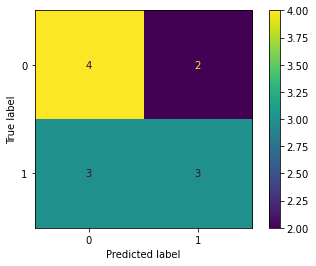

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.010410330558894787
metric(s) 2: (00, 10, 11) = (0.45081261028735586, 0.43257931628430285, 0.43516668339903947)
metric 3: 0.0


----> Kernel construction duration: 00:02:58


Combination 296/468
(Current range: 20/46)
			 reps : 2
			 paulis : ['ZY', 'YY']
			 entanglement : linear

Feature map:


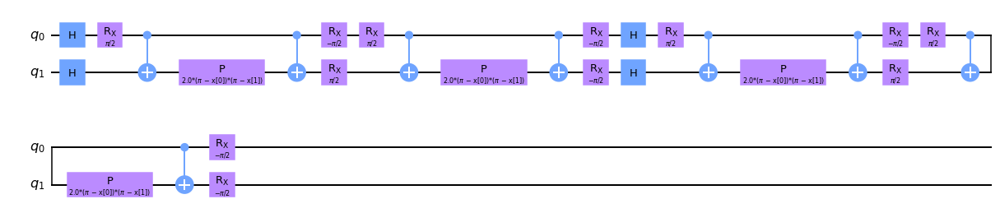


Quantum kernel matrices:



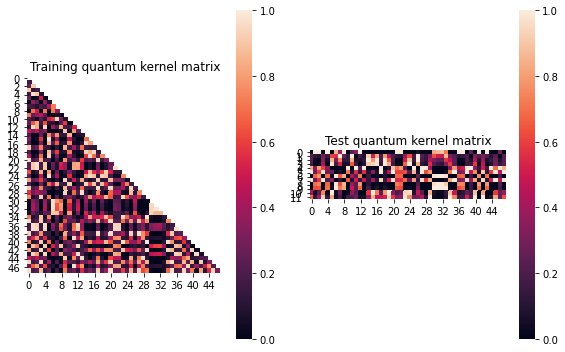


SVM with quantum kernel trained!


Test set performance:


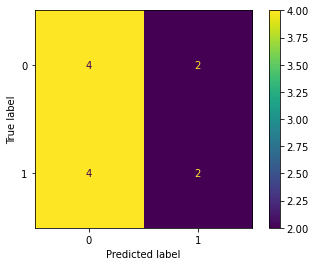

              precision    recall  f1-score   support

           0       0.50      0.67      0.57         6
           1       0.50      0.33      0.40         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.49        12
weighted avg       0.50      0.50      0.49        12


metric 1: 0.017967990046840132
metric(s) 2: (00, 10, 11) = (0.3570923538240518, 0.34553696654460886, 0.3699175593588462)
metric 3: -2.15e-321


----> Kernel construction duration: 00:02:43


Combination 297/468
(Current range: 21/46)
			 reps : 2
			 paulis : ['ZY', 'YZ']
			 entanglement : linear

Feature map:


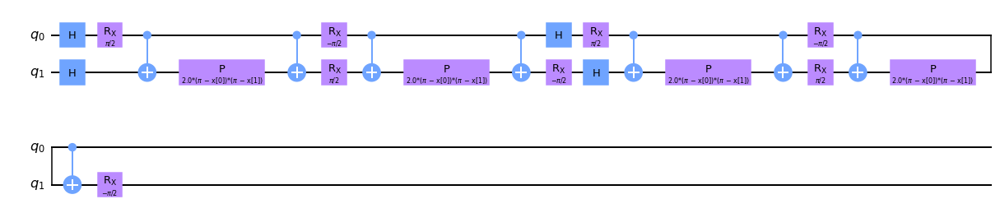


Quantum kernel matrices:



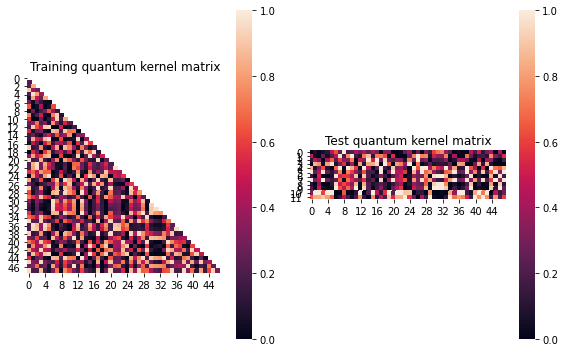


SVM with quantum kernel trained!


Test set performance:


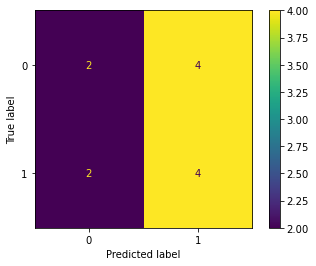

              precision    recall  f1-score   support

           0       0.50      0.33      0.40         6
           1       0.50      0.67      0.57         6

    accuracy                           0.50        12
   macro avg       0.50      0.50      0.49        12
weighted avg       0.50      0.50      0.49        12


metric 1: 0.03082545422524774
metric(s) 2: (00, 10, 11) = (0.4098198811103972, 0.3968573307553901, 0.44554568885087853)
metric 3: -0.0


----> Kernel construction duration: 00:03:02


Combination 298/468
(Current range: 22/46)
			 reps : 2
			 paulis : ['ZY', 'ZX']
			 entanglement : linear

Feature map:


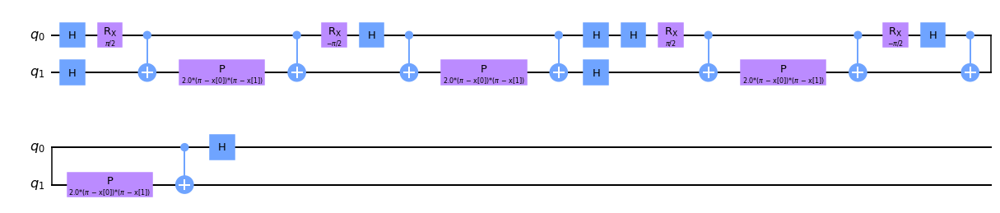


Quantum kernel matrices:



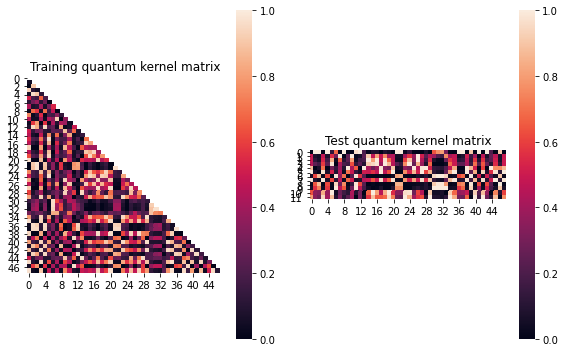


SVM with quantum kernel trained!


Test set performance:


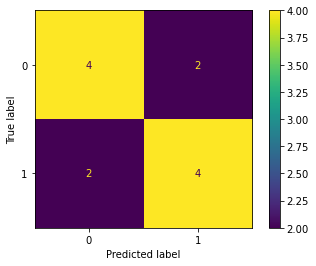

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.017732670609943824
metric(s) 2: (00, 10, 11) = (0.37859775577488214, 0.3655546426044575, 0.3879768706539205)
metric 3: 2.9e-322


----> Kernel construction duration: 00:02:38


Combination 299/468
(Current range: 23/46)
			 reps : 2
			 paulis : ['ZY', 'ZY']
			 entanglement : linear

Feature map:


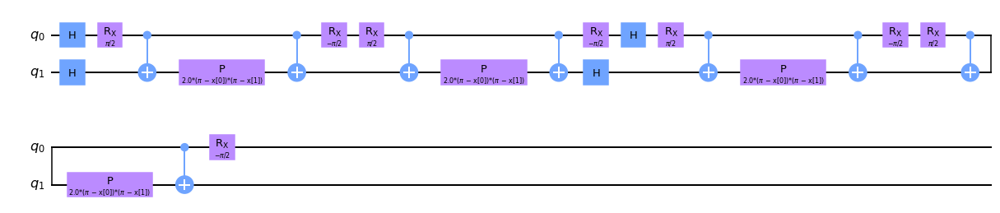


Quantum kernel matrices:



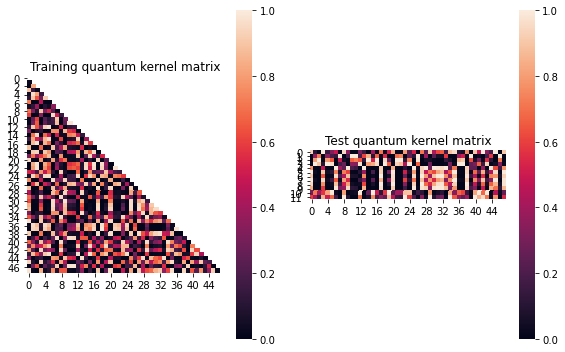


SVM with quantum kernel trained!


Test set performance:


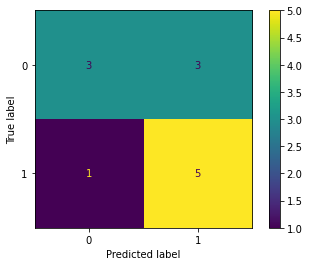

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05164114281543575
metric(s) 2: (00, 10, 11) = (0.39893140131459975, 0.35129610192754446, 0.40694308817136066)
metric 3: -0.0


----> Kernel construction duration: 00:01:51


Combination 300/468
(Current range: 24/46)
			 reps : 2
			 paulis : ['ZY', 'ZZ']
			 entanglement : linear

Feature map:


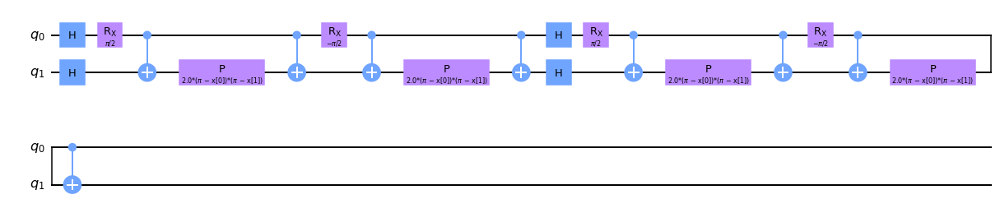


Quantum kernel matrices:



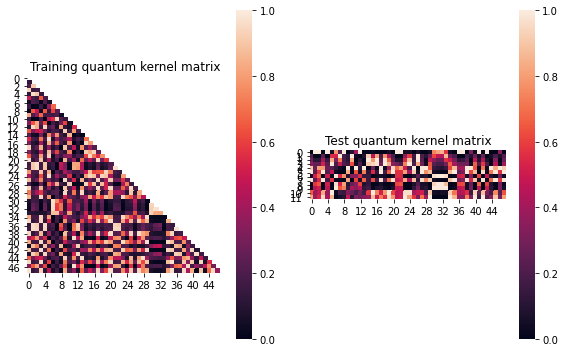


SVM with quantum kernel trained!


Test set performance:


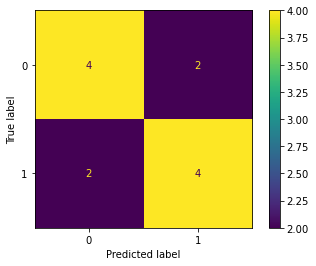

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.67      0.67      0.67         6

    accuracy                           0.67        12
   macro avg       0.67      0.67      0.67        12
weighted avg       0.67      0.67      0.67        12


metric 1: 0.019909846124762487
metric(s) 2: (00, 10, 11) = (0.3866400907712849, 0.3782458125837562, 0.4096712266457525)
metric 3: -0.0


----> Kernel construction duration: 00:02:36


Combination 301/468
(Current range: 25/46)
			 reps : 2
			 paulis : ['ZZ', 'X']
			 entanglement : linear

Feature map:


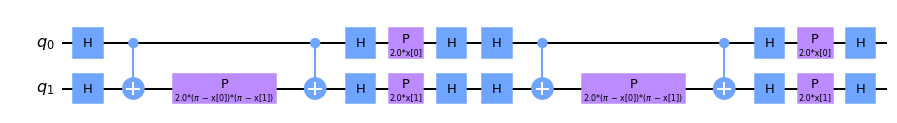


Quantum kernel matrices:



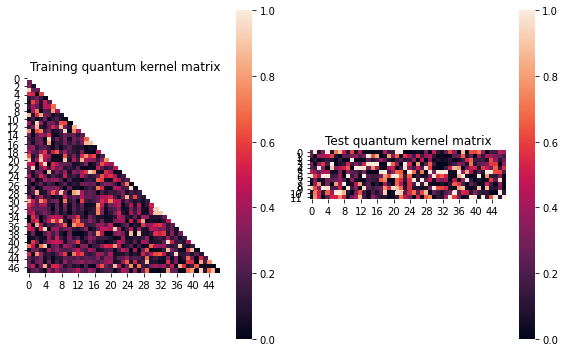


SVM with quantum kernel trained!


Test set performance:


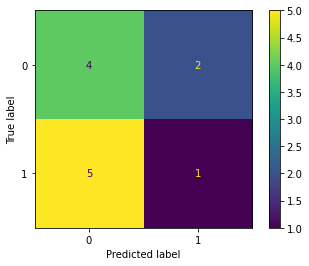

              precision    recall  f1-score   support

           0       0.44      0.67      0.53         6
           1       0.33      0.17      0.22         6

    accuracy                           0.42        12
   macro avg       0.39      0.42      0.38        12
weighted avg       0.39      0.42      0.38        12


metric 1: 0.058314272816714974
metric(s) 2: (00, 10, 11) = (0.3304363775656204, 0.256615770868964, 0.2994237098057375)
metric 3: -1.7306114863476133e-284


----> Kernel construction duration: 00:02:10


Combination 302/468
(Current range: 26/46)
			 reps : 2
			 paulis : ['ZZ', 'Y']
			 entanglement : linear

Feature map:


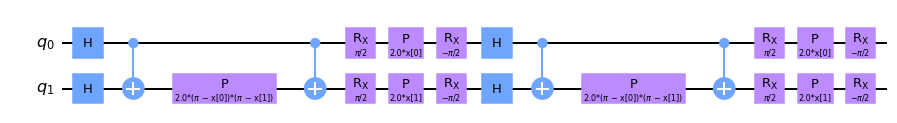


Quantum kernel matrices:



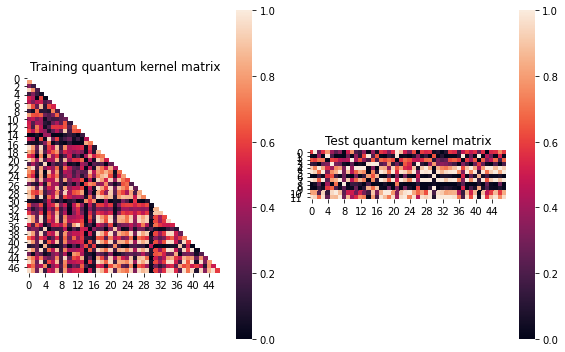


SVM with quantum kernel trained!


Test set performance:


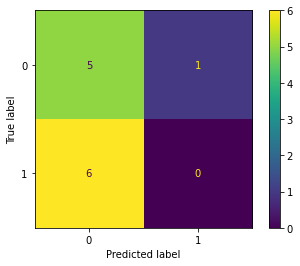

              precision    recall  f1-score   support

           0       0.45      0.83      0.59         6
           1       0.00      0.00      0.00         6

    accuracy                           0.42        12
   macro avg       0.23      0.42      0.29        12
weighted avg       0.23      0.42      0.29        12


metric 1: 0.023669342494303913
metric(s) 2: (00, 10, 11) = (0.41817896116573, 0.4507813337967748, 0.5307223914164275)
metric 3: -8.789006155046617e-274


----> Kernel construction duration: 00:02:12


Combination 303/468
(Current range: 27/46)
			 reps : 2
			 paulis : ['ZZ', 'Z']
			 entanglement : linear

Feature map:


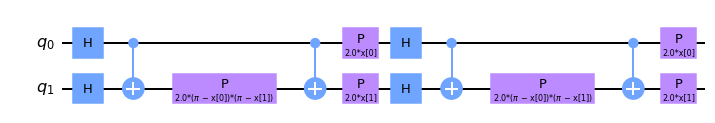


Quantum kernel matrices:



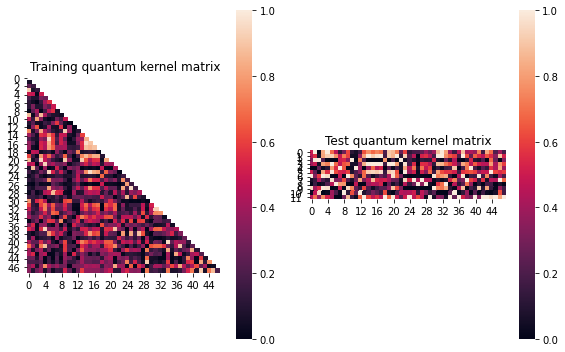


SVM with quantum kernel trained!


Test set performance:


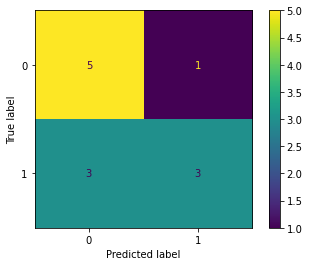

              precision    recall  f1-score   support

           0       0.62      0.83      0.71         6
           1       0.75      0.50      0.60         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.04653616116973158
metric(s) 2: (00, 10, 11) = (0.3539185963928278, 0.29076832163278143, 0.32069036921219823)
metric 3: -2.844982490677746e-269


----> Kernel construction duration: 00:01:58


Combination 304/468
(Current range: 28/46)
			 reps : 2
			 paulis : ['ZZ', 'XX']
			 entanglement : linear

Feature map:


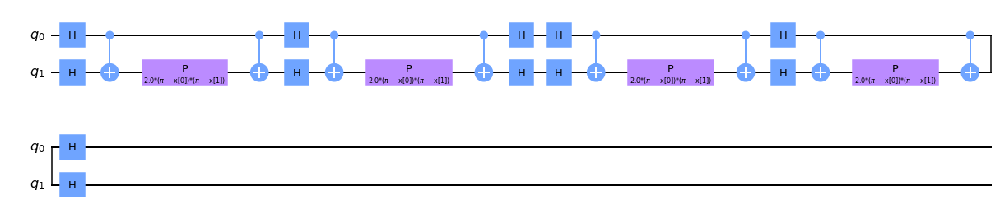


Quantum kernel matrices:



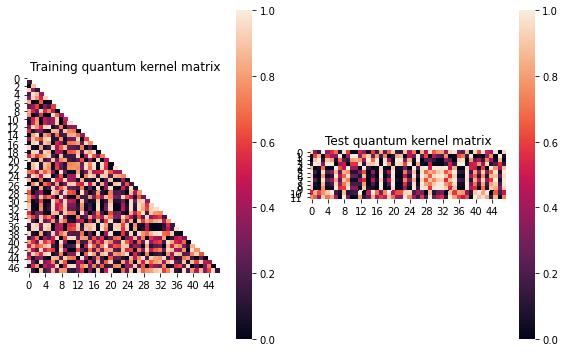


SVM with quantum kernel trained!


Test set performance:


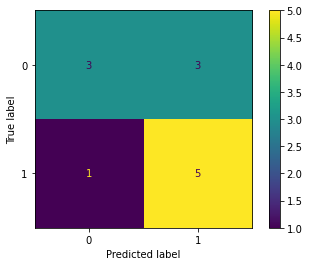

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:02:19


Combination 305/468
(Current range: 29/46)
			 reps : 2
			 paulis : ['ZZ', 'XY']
			 entanglement : linear

Feature map:


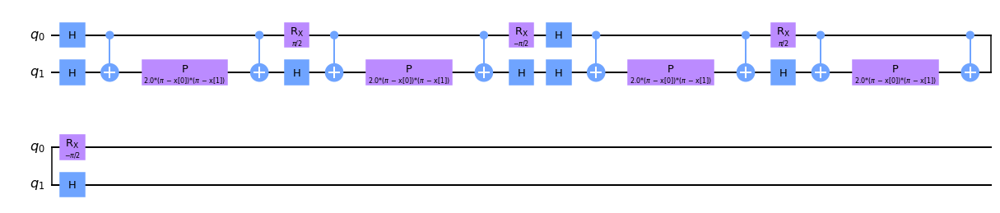


Quantum kernel matrices:



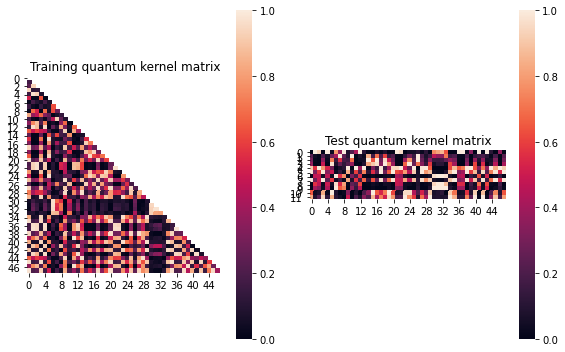


SVM with quantum kernel trained!


Test set performance:


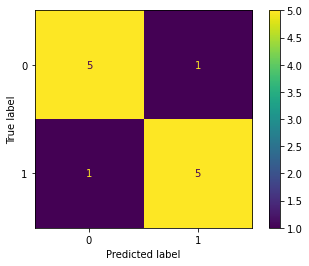

              precision    recall  f1-score   support

           0       0.83      0.83      0.83         6
           1       0.83      0.83      0.83         6

    accuracy                           0.83        12
   macro avg       0.83      0.83      0.83        12
weighted avg       0.83      0.83      0.83        12


metric 1: 0.01862277869020218
metric(s) 2: (00, 10, 11) = (0.36939658553037563, 0.37059454193864466, 0.409038055727318)
metric 3: -0.0


----> Kernel construction duration: 00:03:04


Combination 306/468
(Current range: 30/46)
			 reps : 2
			 paulis : ['ZZ', 'XZ']
			 entanglement : linear

Feature map:


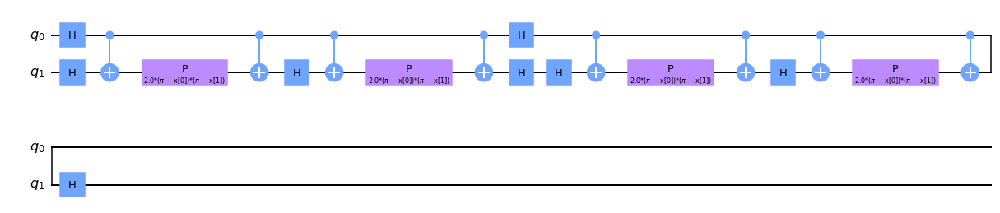


Quantum kernel matrices:



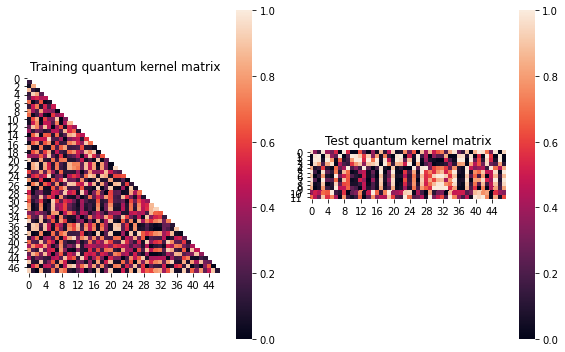


SVM with quantum kernel trained!


Test set performance:


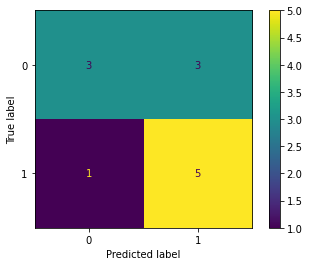

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.04155085624382765
metric(s) 2: (00, 10, 11) = (0.4392789967255284, 0.3952027257475172, 0.43422816725716135)
metric 3: -7.53977621740761e-308


----> Kernel construction duration: 00:02:22


Combination 307/468
(Current range: 31/46)
			 reps : 2
			 paulis : ['ZZ', 'YX']
			 entanglement : linear

Feature map:


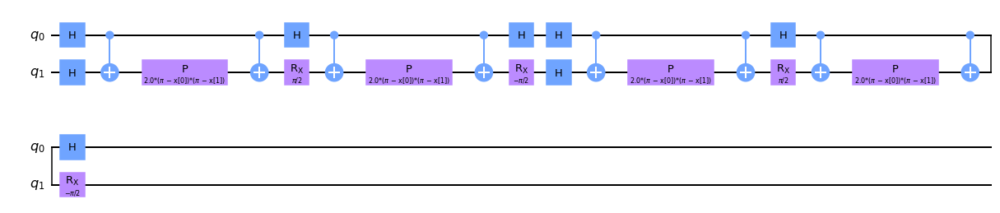


Quantum kernel matrices:



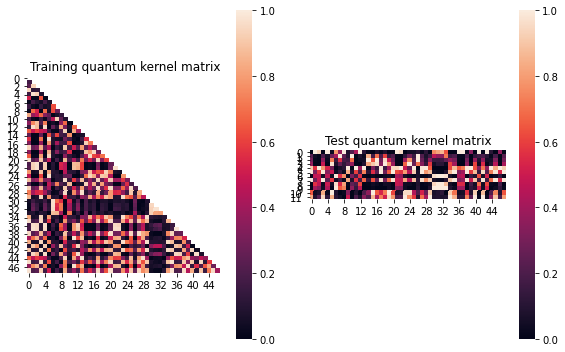


SVM with quantum kernel trained!


Test set performance:


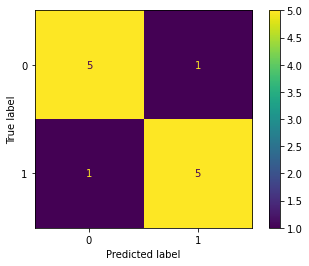

              precision    recall  f1-score   support

           0       0.83      0.83      0.83         6
           1       0.83      0.83      0.83         6

    accuracy                           0.83        12
   macro avg       0.83      0.83      0.83        12
weighted avg       0.83      0.83      0.83        12


metric 1: 0.01862277869020218
metric(s) 2: (00, 10, 11) = (0.36939658553037563, 0.37059454193864466, 0.409038055727318)
metric 3: -0.0


----> Kernel construction duration: 00:02:46


Combination 308/468
(Current range: 32/46)
			 reps : 2
			 paulis : ['ZZ', 'YY']
			 entanglement : linear

Feature map:


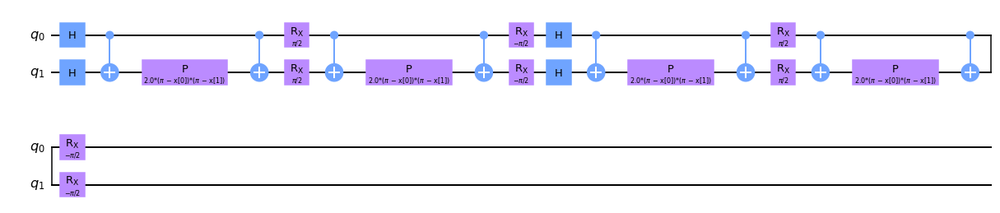


Quantum kernel matrices:



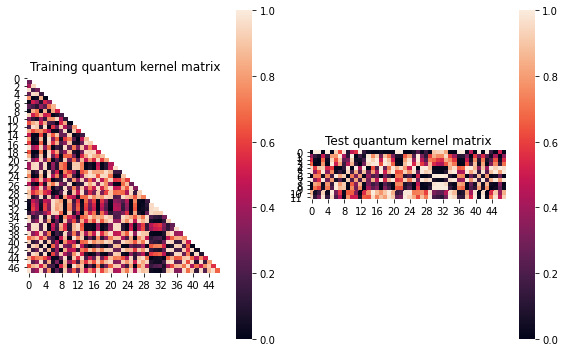


SVM with quantum kernel trained!


Test set performance:


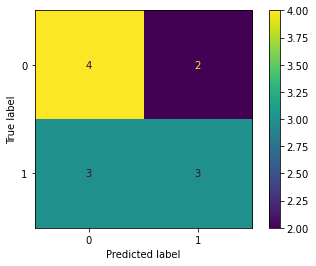

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:03:04


Combination 309/468
(Current range: 33/46)
			 reps : 2
			 paulis : ['ZZ', 'YZ']
			 entanglement : linear

Feature map:


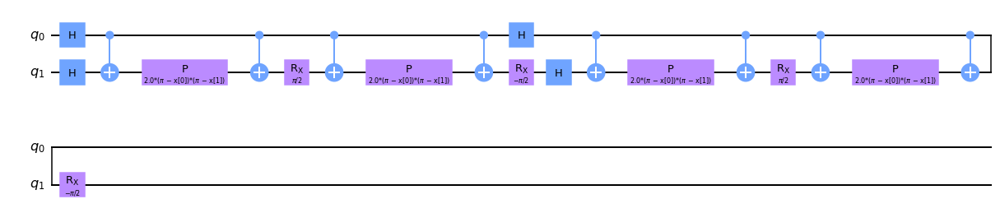


Quantum kernel matrices:



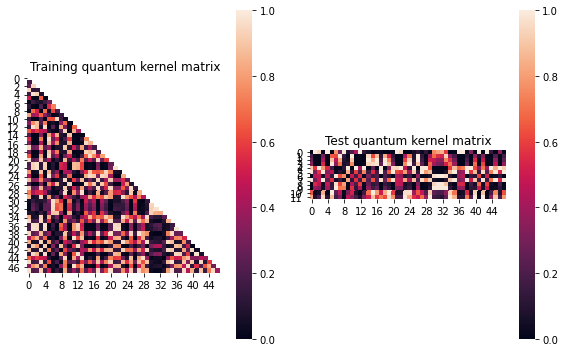


SVM with quantum kernel trained!


Test set performance:


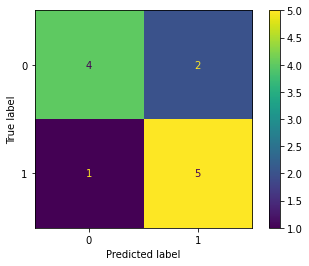

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.017158093659545015
metric(s) 2: (00, 10, 11) = (0.3893823105337397, 0.38630239711931363, 0.4175386710239776)
metric 3: -0.0


----> Kernel construction duration: 00:02:44


Combination 310/468
(Current range: 34/46)
			 reps : 2
			 paulis : ['ZZ', 'ZX']
			 entanglement : linear

Feature map:


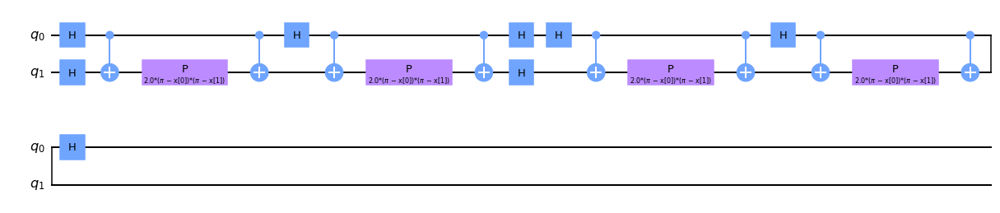


Quantum kernel matrices:



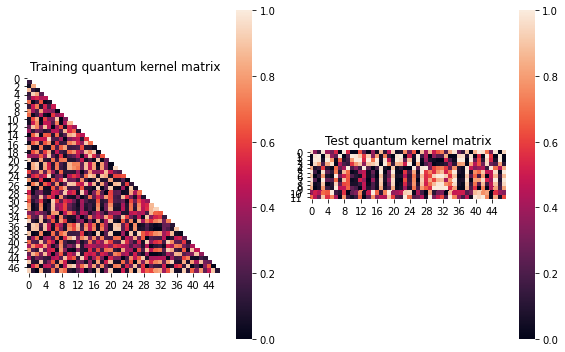


SVM with quantum kernel trained!


Test set performance:


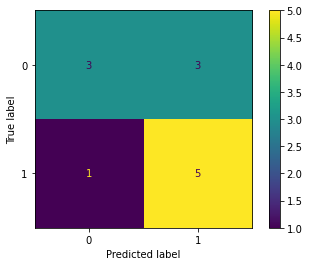

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.04155085624382765
metric(s) 2: (00, 10, 11) = (0.4392789967255284, 0.3952027257475172, 0.43422816725716135)
metric 3: -7.53977621740761e-308


----> Kernel construction duration: 00:02:28


Combination 311/468
(Current range: 35/46)
			 reps : 2
			 paulis : ['ZZ', 'ZY']
			 entanglement : linear

Feature map:


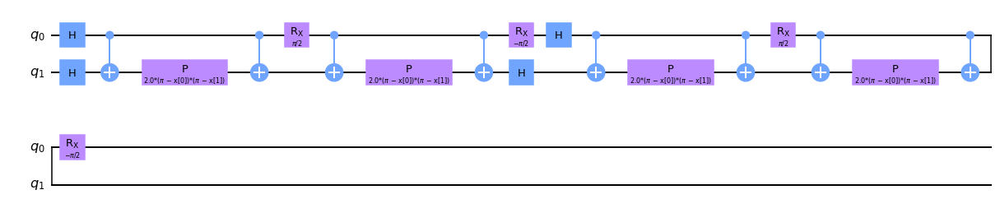


Quantum kernel matrices:



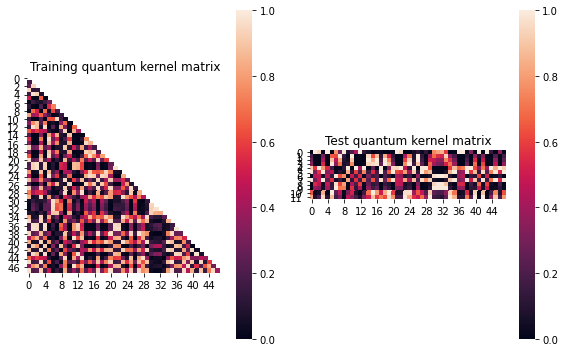


SVM with quantum kernel trained!


Test set performance:


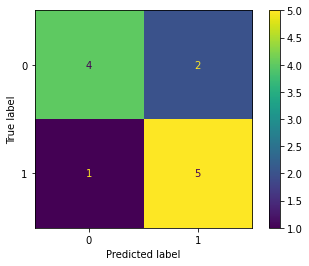

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.017158093659545015
metric(s) 2: (00, 10, 11) = (0.3893823105337397, 0.38630239711931363, 0.4175386710239776)
metric 3: -0.0


----> Kernel construction duration: 00:02:39


Combination 312/468
(Current range: 36/46)
			 reps : 2
			 paulis : ['ZZ', 'ZZ']
			 entanglement : linear

Feature map:


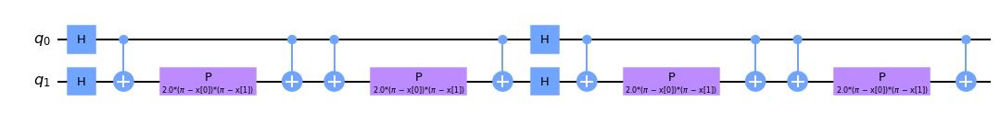


Quantum kernel matrices:



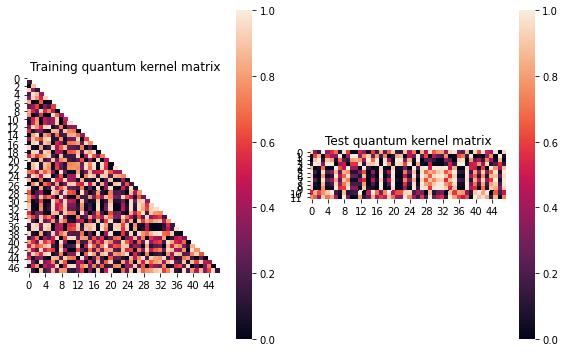


SVM with quantum kernel trained!


Test set performance:


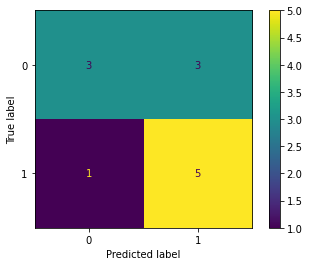

              precision    recall  f1-score   support

           0       0.75      0.50      0.60         6
           1       0.62      0.83      0.71         6

    accuracy                           0.67        12
   macro avg       0.69      0.67      0.66        12
weighted avg       0.69      0.67      0.66        12


metric 1: 0.05087550474757829
metric(s) 2: (00, 10, 11) = (0.5108554093312366, 0.4658489018476307, 0.5225934038591815)
metric 3: 0.0


----> Kernel construction duration: 00:01:40


Combination 313/468
(Current range: 37/46)
			 reps : 3
			 paulis : ['X']
			 entanglement : linear

Feature map:


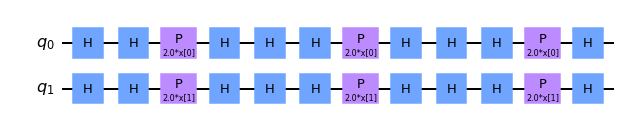


Quantum kernel matrices:



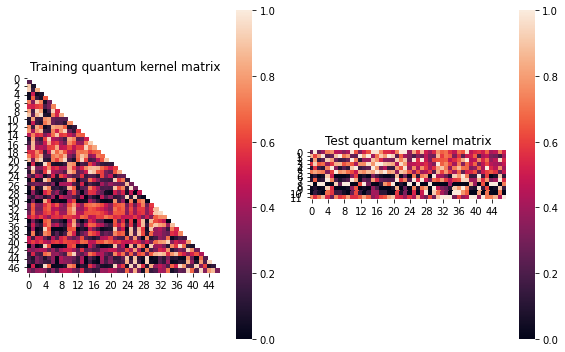


SVM with quantum kernel trained!


Test set performance:


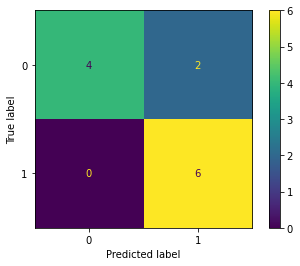

              precision    recall  f1-score   support

           0       1.00      0.67      0.80         6
           1       0.75      1.00      0.86         6

    accuracy                           0.83        12
   macro avg       0.88      0.83      0.83        12
weighted avg       0.88      0.83      0.83        12


metric 1: 0.13624597265191835
metric(s) 2: (00, 10, 11) = (0.5166924668195629, 0.3605783579291822, 0.4769561943426381)
metric 3: -1.3138095606145644e-286


----> Kernel construction duration: 00:00:40


Combination 314/468
(Current range: 38/46)
			 reps : 3
			 paulis : ['Y']
			 entanglement : linear

Feature map:


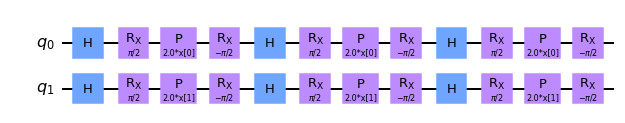


Quantum kernel matrices:



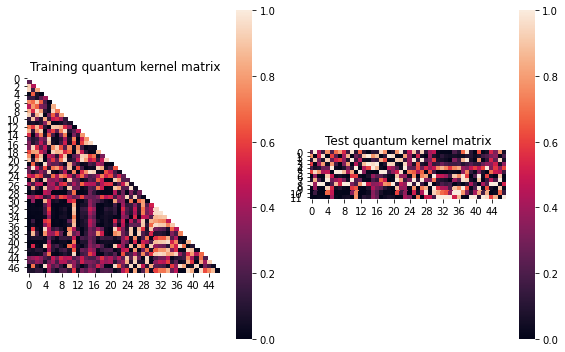


SVM with quantum kernel trained!


Test set performance:


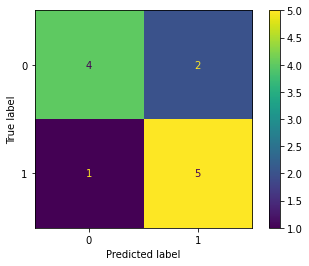

              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.71      0.83      0.77         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.20135834676654873
metric(s) 2: (00, 10, 11) = (0.4378378272218841, 0.2462121996661747, 0.4573032656435627)
metric 3: -1.498792611769664e-308


----> Kernel construction duration: 00:00:40


Combination 315/468
(Current range: 39/46)
			 reps : 3
			 paulis : ['Z']
			 entanglement : linear

Feature map:


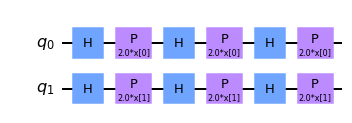


Quantum kernel matrices:



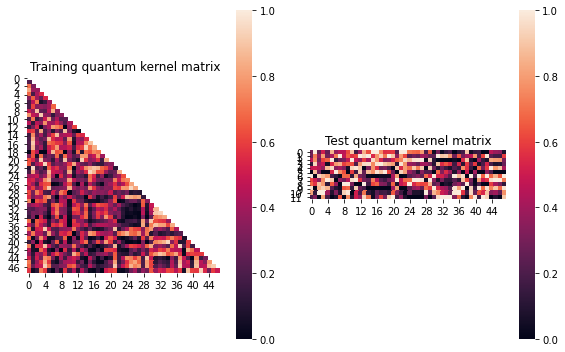


SVM with quantum kernel trained!


Test set performance:


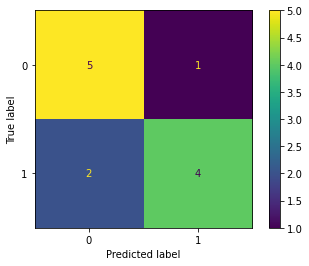

              precision    recall  f1-score   support

           0       0.71      0.83      0.77         6
           1       0.80      0.67      0.73         6

    accuracy                           0.75        12
   macro avg       0.76      0.75      0.75        12
weighted avg       0.76      0.75      0.75        12


metric 1: 0.11495434339003385
metric(s) 2: (00, 10, 11) = (0.47520106076287366, 0.35163923926357543, 0.45798610454434485)
metric 3: -5.235373008284101e-282


----> Kernel construction duration: 00:00:37


Combination 316/468
(Current range: 40/46)
			 reps : 3
			 paulis : ['XX']
			 entanglement : linear

Feature map:


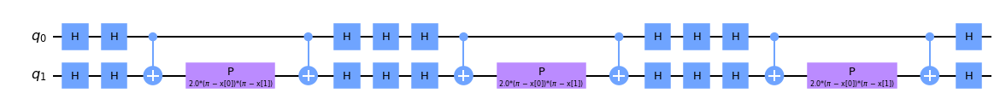


Quantum kernel matrices:



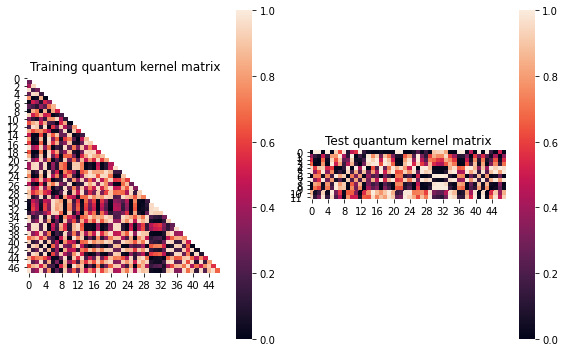


SVM with quantum kernel trained!


Test set performance:


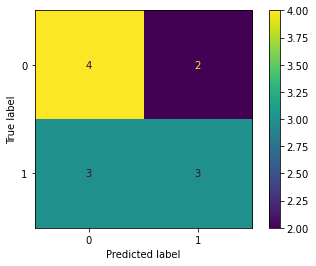

              precision    recall  f1-score   support

           0       0.57      0.67      0.62         6
           1       0.60      0.50      0.55         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.004137343686779538
metric(s) 2: (00, 10, 11) = (0.5029941286866743, 0.5107348303256201, 0.5267502193381248)
metric 3: 0.0


----> Kernel construction duration: 00:01:58


Combination 317/468
(Current range: 41/46)
			 reps : 3
			 paulis : ['XY']
			 entanglement : linear

Feature map:


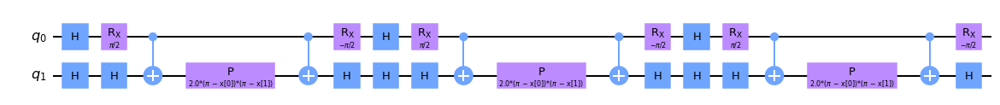


Quantum kernel matrices:



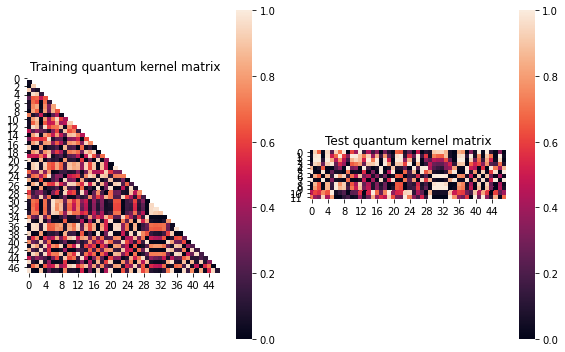


SVM with quantum kernel trained!


Test set performance:


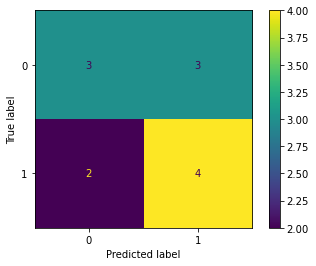

              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.57      0.67      0.62         6

    accuracy                           0.58        12
   macro avg       0.59      0.58      0.58        12
weighted avg       0.59      0.58      0.58        12


metric 1: 0.03177658058277516
metric(s) 2: (00, 10, 11) = (0.4911614960392675, 0.42749359527240177, 0.4273788556710864)
metric 3: 0.0


----> Kernel construction duration: 00:02:40


Combination 318/468
(Current range: 42/46)
			 reps : 3
			 paulis : ['XZ']
			 entanglement : linear

Feature map:


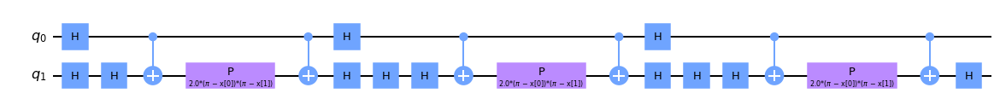

In [ ]:
j=6
results.append(run_kernel_evaluation(X, X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))

In [ ]:
j=7
results.append(run_kernel_evaluation(X, X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))

In [ ]:
j=8
results.append(run_kernel_evaluation(X, X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))

In [ ]:
j=9
results.append(run_kernel_evaluation(X, X_train, y_train, X_test, y_test,
                                      param_grid, range_list, j, model=True))

### Final analysis

In [ ]:
df_results = pd.concat(results).sort_values("density_diff", ascending=False)

df_results.shape

In [ ]:
sns.heatmap(df_results.corr(), vmin=-1, vmax=1, annot=True, cmap="jet")

In [ ]:
sns.pairplot(df_results)

In [ ]:
df_results.to_csv("./results/results_make_moons.csv")

In [ ]:
df_results

From the results dataframe, we can get the parameters yielding the best results (notice that it was sorted by the `density_diff`, which is the quality metric):

In [ ]:
best_params = df_results.iloc[0][["reps", "paulis", "entanglement"]].tolist()

best_params

We can then visualize the resulting decision boundary:

In [ ]:
_ = qsvm(X, X_train, y_train, X_test, y_test, *best_params, shots=1024, plot_stuff=True,
         plot_boundary = True, spacing=0.1, quantum_kernel=True)

We can also visualize the action of the feature map on individual observations:

In [ ]:
for i in range(5):
    
    visualize_feature_mapping(reps, paulis, entanglement, X=X_train, idx=i)
    
    print("\n")
    print("="*80)
    print("="*80)
    print("="*80)
    print("\n")

________________
________________
________________
________________
________________